# TCC — Metodologia de Previsão de Séries Temporais no Varejo
## Da Estatística ao Aprendizado Profundo

**Autor:** Ivan Flavio Aparecido Bernardino  
**Curso:** MBA em Ciência de Dados — ICMC/USP

In [ ]:
# !pip install --upgrade pip

In [ ]:
# !pip install tensorflow==2.13.0

In [ ]:
# !pip uninstall -y prophet fbprophet cmdstanpy numpy --quiet
# !pip install numpy==1.26.4 prophet==1.1.5 cmdstanpy==1.1.0 --quiet


In [1]:
# Solução 1: Instalação direta sem compilação
!pip uninstall -y prophet fbprophet cmdstanpy pystan --quiet
!pip install --upgrade setuptools wheel --quiet
!pip install plotly catboost --quiet

# Instalar Prophet de uma distribuição pré-compilada
!pip install prophet --no-build-isolation --quiet

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from copy import deepcopy
print("Instalação concluída. Verificando importação...")

try:
    from prophet import Prophet
    print("✅ Prophet importado com sucesso!")

    # Continue com seu código original aqui...
    # [Seu código para preparar dados e rodar o modelo]

except ImportError as e:
    print(f"❌ Erro na importação: {e}")
    print("Tentando solução alternativa...")

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 15.6 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
ipython 7.34.0 requires jedi>=0.16, which is not installed.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 99.2/99.2 MB 26.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.1/12.1 MB 125.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 99.1/99.1 kB 7.6 MB/s eta 0:00:00
Instalação concluída. Verificando importação...
✅ Prophet importado com sucesso!


In [2]:
# !pip install -q catboost
# # --- Compatibilidade Prophet x NumPy no Colab ---
# !pip install -U "numpy<2.0" "prophet==1.1.5" "cmdstanpy==1.1.0" --quiet



In [3]:
# ====================================================
# 1. IMPORTAÇÃO DE PACOTES
# ====================================================
import sys, os, warnings, importlib, platform, json
from datetime import datetime
import time
from sklearn.linear_model import LinearRegression
import altair as alt
from IPython.display import display

from statsmodels.tsa.seasonal import seasonal_decompose, STL
from statsmodels.tsa.stattools import acf
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.holtwinters import ExponentialSmoothing
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.preprocessing import LabelEncoder
from catboost import CatBoostRegressor, Pool
import xgboost as xgb
import lightgbm as lgb



import tensorflow as tf
from tensorflow import keras
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from math import sqrt
from sklearn.metrics import mean_squared_error, mean_absolute_error
import warnings, itertools, random, time
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tools.sm_exceptions import ConvergenceWarning
from joblib import Parallel, delayed

import os
import json
import requests
import re
import zipfile
import warnings
warnings.filterwarnings('ignore')

np.random.seed(42)

def is_available(pkg):
    try:
        return importlib.util.find_spec(pkg) is not None
    except Exception:
        return False

HAVE_XGB = is_available('xgboost')
HAVE_TF = is_available('tensorflow')
HAVE_PROPHET = is_available('prophet') or is_available('fbprophet')

print('Python:', platform.python_version())
print('NumPy:', np.__version__)
print('Pandas:', pd.__version__)
print('Matplotlib:', plt.matplotlib.__version__)
try:
    import statsmodels
    print('statsmodels:', statsmodels.__version__)
except Exception as e:
    print('statsmodels indisponível:', e)
print('xgboost disponível?', HAVE_XGB)
print('tensorflow disponível?', HAVE_TF)
print('prophet disponível?', HAVE_PROPHET)


plt.rcParams["figure.figsize"] = (32, 6)
plt.rcParams["axes.grid"] = True


import seaborn as sns
from matplotlib import colors
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize
pd.plotting.register_matplotlib_converters()
%matplotlib inline


import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.io as pio

# Variable to control Kaggle training.
TRAIN_OFFLINE = False
from pathlib import Path
from sklearn import preprocessing

# Configurações para economizar RAM
plt.style.use('ggplot')
pd.set_option('display.max_columns', 50)


Python: 3.12.12
NumPy: 2.0.2
Pandas: 2.2.2
Matplotlib: 3.10.0
statsmodels: 0.14.6
xgboost disponível? True
tensorflow disponível? True
prophet disponível? True


In [4]:
# Funções uteis

def analisar_dataframe(df):
    resultado = {}

    for coluna in df.columns:
        info_coluna = {}
        tipo = df[coluna].dtype

        # Verifica valores nulos
        nulos = df[coluna].isnull().sum()
        if nulos > 0:
            info_coluna['nulos'] = nulos

        # Coluna categórica ou string
        if tipo == 'object' or pd.api.types.is_categorical_dtype(df[coluna]):
            info_coluna['tipo'] = 'categórica'
            categorias = df[coluna].dropna().unique().tolist()
            contagem = df[coluna].value_counts(dropna=True).to_dict()
            info_coluna['categorias_distintas'] = categorias
            info_coluna['contagem_por_categoria'] = contagem

        # Coluna numérica
        elif pd.api.types.is_numeric_dtype(df[coluna]):
            info_coluna['tipo'] = 'numérica'
            info_coluna['mínimo'] = df[coluna].min()
            info_coluna['máximo'] = df[coluna].max()
            info_coluna['mediana'] = df[coluna].median()
            info_coluna['moda'] = df[coluna].mode().tolist()

        else:
            info_coluna['tipo'] = str(tipo)

        resultado[coluna] = info_coluna

    return resultado


# Funções para medir performance

def rmse(y_true, y_pred):
    return float(np.sqrt(np.mean((y_true - y_pred)**2)))

def mae(y_true, y_pred):
    return float(np.mean(np.abs(y_true - y_pred)))

def rmsse(y_true, y_pred, y_train):
    """
    Calcula RMSSE (Root Mean Squared Scaled Error)
    """
    # Numerador: RMSE das previsões
    numerator = np.sqrt(np.mean((y_true - y_pred)**2))

    # Denominador: RMSE do naive forecast no conjunto de treino
    # Usando diferença de um período (y_t+1 - y_t)
    naive_errors = y_train.diff().dropna()

    if len(naive_errors) == 0:
        return np.nan

    denom = np.sqrt(np.mean(naive_errors**2))

    # Evitar divisão por zero
    if denom == 0 or np.isnan(denom):
        return np.nan

    return float(numerator / denom)

# Versão alternativa mais robusta:

def rmsse_robust(y_true, y_pred, y_train):
    """
    RMSSE = Root Mean Squared Scaled Error (robusta)
    """
    try:
        if len(y_true) == 0 or len(y_pred) == 0 or len(y_train) < 2:
            return np.nan
        numerator = np.sqrt(np.mean((np.array(y_true) - np.array(y_pred))**2))
        denom = np.sqrt(np.mean(np.diff(np.array(y_train))**2))
        if denom <= 1e-10 or np.isnan(denom):
            return np.nan
        return float(numerator / denom)
    except Exception as e:
        print(f"Erro no RMSSE: {e}")
        return np.nan

results = []
# garante lista de resultados
for result in results:
    print(f"Modelo: {result['modelo']}")
    print(f"  RMSE: {result['RMSE']:.3f}")
    print(f"  MAE: {result['MAE']:.3f}")
    print(f"  RMSSE: {result['RMSSE']:.3f}")
    print()



def ensure_df_features(X, idx, ref_cols=None, name_prefix="x"):
    """
    Converte X em DataFrame alinhado ao índice idx.
    - Se DataFrame: reindexa por idx e retorna.
    - Se Series: vira DataFrame (1 coluna) e reindexa por idx.
    - Se ndarray: cria DataFrame com colunas ref_cols (se fornecidas) ou name_prefix_0..n-1.
    - Se None: retorna DataFrame vazio com idx.
    Em todos os casos, converte para numérico (coerce) e preenche NaN com 0.0 (float64).
    """
    import numpy as np, pandas as pd

    if X is None:
        df = pd.DataFrame(index=idx)
    elif isinstance(X, pd.DataFrame):
        df = X.copy()
        # se o índice não é datetime, força alinhamento pelo idx dado
        if not isinstance(df.index, pd.DatetimeIndex):
            df.index = pd.DatetimeIndex(df.index)
        df = df.reindex(idx)
    elif isinstance(X, pd.Series):
        df = X.to_frame()
        if not isinstance(df.index, pd.DatetimeIndex):
            df.index = pd.DatetimeIndex(df.index)
        df = df.reindex(idx)
    elif isinstance(X, np.ndarray):
        X = np.asarray(X)
        if X.ndim == 1:
            X = X.reshape(-1, 1)
        n_rows, n_cols = X.shape
        if len(idx) != n_rows:
            # se a matriz não tiver o mesmo número de linhas do idx,
            # tentamos cortar/alinhar de forma segura
            m = min(len(idx), n_rows)
            X = X[:m, :]
            idx = idx[:m]
        if ref_cols is not None:
            cols = list(ref_cols)
            # se tamanhos divergirem, gera nomes coerentes
            if len(cols) != X.shape[1]:
                cols = [f"{name_prefix}_{i}" for i in range(X.shape[1])]
        else:
            cols = [f"{name_prefix}_{i}" for i in range(X.shape[1])]
        df = pd.DataFrame(X, index=idx, columns=cols)
    else:
        # fallback genérico
        df = pd.DataFrame(X, index=idx)

    # coerção numérica e preenchimento
    df = df.apply(pd.to_numeric, errors="coerce").fillna(0.0).astype("float64")
    return df


## 2. Ingestão dos Dados (Kaggle)

In [5]:


# URL correta do conteúdo RAW
url = "https://raw.githubusercontent.com/ivanf2110/MBA/main/kaggle.json"

# Baixa e salva o arquivo
response = requests.get(url)
with open("kaggle.json", "wb") as f:
    f.write(response.content)

# Carrega o JSON corretamente
with open("kaggle.json", "r") as f:
    kaggle_token = json.load(f)

# Define as variáveis de ambiente
os.environ['KAGGLE_USERNAME'] = kaggle_token['username']
os.environ['KAGGLE_KEY'] = kaggle_token['key']

In [6]:
!pip install kaggle
!kaggle competitions download -c m5-forecasting-accuracy

  0% 0.00/45.8M [00:00<?, ?B/s]
100% 45.8M/45.8M [00:00<00:00, 2.61GB/s]


In [7]:
# from google.colab import files
# files.upload()  # Escolha o arquivo kaggle.json

In [8]:
# Crie a pasta .kaggle e mova o arquivo para lá
os.makedirs("/root/.kaggle", exist_ok=True)
!mv kaggle.json /root/.kaggle/kaggle.json

# Dê permissão ao arquivo
!chmod 600 /root/.kaggle/kaggle.json

In [9]:
# Extraia o conteúdo do zip
with zipfile.ZipFile("m5-forecasting-accuracy.zip", "r") as zip_ref:
    zip_ref.extractall("walmart_dataset")

# Verifique os arquivos

print("Arquivos extraídos:", os.listdir("walmart_dataset"))

Arquivos extraídos: ['calendar.csv', 'sell_prices.csv', 'sales_train_evaluation.csv', 'sales_train_validation.csv', 'sample_submission.csv']


In [10]:
# 1. FUNÇÃO PARA ECONOMIZAR MEMÓRIA (SIMPLIFICADA)
def economizar_memoria(df, nome):
    """Função simples para reduzir uso de memória"""
    memoria_inicial = df.memory_usage().sum() / 1024**2
    print(f"\n📊 {nome}:")
    print(f"   Memória inicial: {memoria_inicial:.1f} MB")

    # Converte colunas de texto para categoria
    for col in df.columns:
        if df[col].dtype == 'object':
            df[col] = df[col].astype('category')
        elif 'int' in str(df[col].dtype):
            df[col] = pd.to_numeric(df[col], downcast='integer')
        elif 'float' in str(df[col].dtype):
            df[col] = pd.to_numeric(df[col], downcast='float')

    memoria_final = df.memory_usage().sum() / 1024**2
    print(f"   Memória final: {memoria_final:.1f} MB")
    print(f"   Economia: {(memoria_inicial - memoria_final):.1f} MB")

    return df

# 2. CARREGAR OS DADOS
print("\n📁 CARREGANDO ARQUIVOS...")

# Carrega cada arquivo com economia de memória
vendas = pd.read_csv("walmart_dataset/sales_train_validation.csv")
vendas = economizar_memoria(vendas, "VENDAS")

calendario = pd.read_csv("walmart_dataset/calendar.csv")
calendario = economizar_memoria(calendario, "CALENDÁRIO")

precos = pd.read_csv("walmart_dataset/sell_prices.csv")
precos = economizar_memoria(precos, "PREÇOS")

print("\n✅ DADOS CARREGADOS COM SUCESSO!")

# 3. ANÁLISE EXPLORATÓRIA BÁSICA
print("\n" + "="*50)
print("📈 ANÁLISE EXPLORATÓRIA BÁSICA")
print("="*50)


📁 CARREGANDO ARQUIVOS...

📊 VENDAS:
   Memória inicial: 446.4 MB
   Memória final: 94.6 MB
   Economia: 351.8 MB

📊 CALENDÁRIO:
   Memória inicial: 0.2 MB
   Memória final: 0.2 MB
   Economia: 0.0 MB

📊 PREÇOS:
   Memória inicial: 208.8 MB
   Memória final: 58.8 MB
   Economia: 150.0 MB

✅ DADOS CARREGADOS COM SUCESSO!

📈 ANÁLISE EXPLORATÓRIA BÁSICA


In [11]:

vendas.head()


,id,item_id,dept_id,cat_id,store_id,state_id,d_1,d_2,d_3,d_4,d_5,d_6,d_7,d_8,d_9,d_10,d_11,d_12,d_13,d_14,d_15,d_16,d_17,d_18,d_19,...,d_1889,d_1890,d_1891,d_1892,d_1893,d_1894,d_1895,d_1896,d_1897,d_1898,d_1899,d_1900,d_1901,d_1902,d_1903,d_1904,d_1905,d_1906,d_1907,d_1908,d_1909,d_1910,d_1911,d_1912,d_1913
0,HOBBIES_1_001_CA_1_validation,HOBBIES_1_001,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,4,2,3,0,1,2,0,0,0,1,1,3,0,1,1,1,3,0,1,1
1,HOBBIES_1_002_CA_1_validation,HOBBIES_1_002,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
2,HOBBIES_1_003_CA_1_validation,HOBBIES_1_003,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,1,0,0,0,0,0,1,2,2,1,2,1,1,1,0,1,1,1
3,HOBBIES_1_004_CA_1_validation,HOBBIES_1_004,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,3,1,2,1,3,1,0,2,5,4,2,0,3,0,1,0,5,4,1,0,1,3,7,2
4,HOBBIES_1_005_CA_1_validation,HOBBIES_1_005,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,4,0,1,4,0,1,0,1,0,1,1,2,0,1,1,2,1,1,0,1,1,2,2,2,4


In [12]:

calendario.head()

,date,wm_yr_wk,weekday,wday,month,year,d,event_name_1,event_type_1,event_name_2,event_type_2,snap_CA,snap_TX,snap_WI
0,2011-01-29,11101,Saturday,1,1,2011,d_1,NaN,NaN,NaN,NaN,0,0,0
1,2011-01-30,11101,Sunday,2,1,2011,d_2,NaN,NaN,NaN,NaN,0,0,0
2,2011-01-31,11101,Monday,3,1,2011,d_3,NaN,NaN,NaN,NaN,0,0,0
3,2011-02-01,11101,Tuesday,4,2,2011,d_4,NaN,NaN,NaN,NaN,1,1,0
4,2011-02-02,11101,Wednesday,5,2,2011,d_5,NaN,NaN,NaN,NaN,1,0,1


In [13]:

precos.head()

,store_id,item_id,wm_yr_wk,sell_price
0,CA_1,HOBBIES_1_001,11325,9.58
1,CA_1,HOBBIES_1_001,11326,9.58
2,CA_1,HOBBIES_1_001,11327,8.26
3,CA_1,HOBBIES_1_001,11328,8.26
4,CA_1,HOBBIES_1_001,11329,8.26


Visão Geral dos Dados

O conjunto de dados M5 Forecasting – Accuracy, disponibilizado pelo Walmart no Kaggle, é composto por cinco arquivos CSV.
Ele contém informações de vendas diárias de produtos, preços e eventos especiais, com o objetivo de prever a demanda futura.

Arquivo 1: calendar.csv

Contém as datas em que os produtos foram vendidos, além de informações sobre eventos e feriados.

Colunas:

date: Data no formato “YYYY-MM-DD”.

wm_yr_wk: Identificador da semana correspondente à data.

weekday / wday: Dia da semana (sábado, domingo, …, sexta) e seu identificador numérico.

month / year: Mês e ano da data.

event_name_1 / event_type_1: Nome e tipo do primeiro evento (se houver).

event_name_2 / event_type_2: Nome e tipo do segundo evento (se houver).

snap_CA, snap_TX, snap_WI: Variáveis binárias (0 ou 1) que indicam se as lojas da Califórnia (CA), Texas (TX) ou Wisconsin (WI) permitem compras via programa SNAP na respectiva data.

Arquivo 2: sales_train_validation.csv

Contém o histórico diário de vendas (em unidades) por produto e loja, do dia d_1 ao d_1913.

Colunas:

item_id: Identificador do produto.

dept_id: Identificador do departamento ao qual o produto pertence.

cat_id: Identificador da categoria do produto.

store_id: Identificador da loja onde o produto foi vendido.

state_id: Identificador do estado onde a loja está localizada.

d_1 … d_1941: Quantidade de unidades vendidas em cada dia.

Arquivo 3: sell_prices.csv

Contém informações sobre os preços dos produtos, por loja e por semana.

Colunas:

store_id: Identificador da loja.

item_id: Identificador do produto.

wm_yr_wk: Identificador semanal (correspondente ao arquivo calendar.csv).

sell_price: Preço médio do produto naquela semana e loja.

Arquivo 5: sales_train_evaluation.csv

Semelhante ao arquivo de validação, porém com dados de vendas estendidos até o dia d_1941.
É utilizado para prever as vendas do período d_1942–d_1969.

Divisão dos conjuntos:

Treinamento: d_1 – d_1913

Validação: d_1914 – d_1941

Avaliação: d_1942 – d_1969

In [14]:
# 3. ANÁLISE EXPLORATÓRIA BÁSICA
print("\n" + "="*50)
print("📈 ANÁLISE EXPLORATÓRIA BÁSICA")
print("="*50)

# 3.1 Análise das Vendas
print("\n🛒 ANÁLISE DAS VENDAS:")
print(f"• Total de produtos: {vendas.shape[0]:,}")
print(f"• Período de dias: {len([col for col in vendas.columns if 'd_' in col])} dias")
print(f"• Categorias: {vendas['cat_id'].unique().tolist()}")
print(f"• Departamentos: {vendas['dept_id'].unique().tolist()}")
print(f"• Estados: {vendas['state_id'].unique().tolist()}")

# 3.2 Análise do Calendário
print("\n📅 ANÁLISE DO CALENDÁRIO:")
calendario['date'] = pd.to_datetime(calendario['date'])
print(f"• Período: {calendario['date'].min().strftime('%Y-%m-%d')} a {calendario['date'].max().strftime('%Y-%m-%d')}")
print(f"• Total de dias: {len(calendario):,}")
print(f"• Tipos de evento: {calendario['event_type_1'].nunique()}")
print(f"• Eventos únicos: {calendario['event_name_1'].nunique()}")

# 3.3 Análise dos Preços
print("\n💰 ANÁLISE DOS PREÇOS:")
print(f"• Registros de preços: {precos.shape[0]:,}")
print(f"• Preço médio: R$ {precos['sell_price'].mean():.2f}")
print(f"• Maior preço: R$ {precos['sell_price'].max():.2f}")
print(f"• Menor preço: R$ {precos['sell_price'].min():.2f}")


📈 ANÁLISE EXPLORATÓRIA BÁSICA

🛒 ANÁLISE DAS VENDAS:
• Total de produtos: 30,490
• Período de dias: 1913 dias
• Categorias: ['HOBBIES', 'HOUSEHOLD', 'FOODS']
• Departamentos: ['HOBBIES_1', 'HOBBIES_2', 'HOUSEHOLD_1', 'HOUSEHOLD_2', 'FOODS_1', 'FOODS_2', 'FOODS_3']
• Estados: ['CA', 'TX', 'WI']

📅 ANÁLISE DO CALENDÁRIO:
• Período: 2011-01-29 a 2016-06-19
• Total de dias: 1,969
• Tipos de evento: 4
• Eventos únicos: 30

💰 ANÁLISE DOS PREÇOS:
• Registros de preços: 6,841,121
• Preço médio: R$ 4.41
• Maior preço: R$ 107.32
• Menor preço: R$ 0.01


In [15]:
# 3.1 Análise das Vendas
print("\n🛒 ANÁLISE DAS VENDAS:")
analise = analisar_dataframe(vendas)
for coluna, info in analise.items():
    if coluna.startswith('d_'):
        continue  # pula colunas que começam com 'd_'

    print(f"\n📊 Coluna: {coluna}")
    for chave, valor in info.items():
        print(f"  - {chave}: {valor}")


# 3.1 Análise calendario
print("\n📅 ANÁLISE DO CALENDÁRIO:")
analise = analisar_dataframe(calendario)
for coluna, info in analise.items():
    print(f"\n📊 Coluna: {coluna}")
    for chave, valor in info.items():
        print(f"  - {chave}: {valor}")


# 3.1 Análise preços
print("\n💰 ANÁLISE DOS PREÇOS:")
analise = analisar_dataframe(precos)
for coluna, info in analise.items():
    print(f"\n📊 Coluna: {coluna}")
    for chave, valor in info.items():
        print(f"  - {chave}: {valor}")




🛒 ANÁLISE DAS VENDAS:

📊 Coluna: id
  - tipo: categórica
  - categorias_distintas: ['HOBBIES_1_001_CA_1_validation', 'HOBBIES_1_002_CA_1_validation', 'HOBBIES_1_003_CA_1_validation', 'HOBBIES_1_004_CA_1_validation', 'HOBBIES_1_005_CA_1_validation', 'HOBBIES_1_006_CA_1_validation', 'HOBBIES_1_007_CA_1_validation', 'HOBBIES_1_008_CA_1_validation', 'HOBBIES_1_009_CA_1_validation', 'HOBBIES_1_010_CA_1_validation', 'HOBBIES_1_011_CA_1_validation', 'HOBBIES_1_012_CA_1_validation', 'HOBBIES_1_013_CA_1_validation', 'HOBBIES_1_014_CA_1_validation', 'HOBBIES_1_015_CA_1_validation', 'HOBBIES_1_016_CA_1_validation', 'HOBBIES_1_017_CA_1_validation', 'HOBBIES_1_018_CA_1_validation', 'HOBBIES_1_019_CA_1_validation', 'HOBBIES_1_020_CA_1_validation', 'HOBBIES_1_021_CA_1_validation', 'HOBBIES_1_022_CA_1_validation', 'HOBBIES_1_023_CA_1_validation', 'HOBBIES_1_024_CA_1_validation', 'HOBBIES_1_025_CA_1_validation', 'HOBBIES_1_026_CA_1_validation', 'HOBBIES_1_027_CA_1_validation', 'HOBBIES_1_028_CA_1_vali


📊 CRIANDO VISUALIZAÇÕES


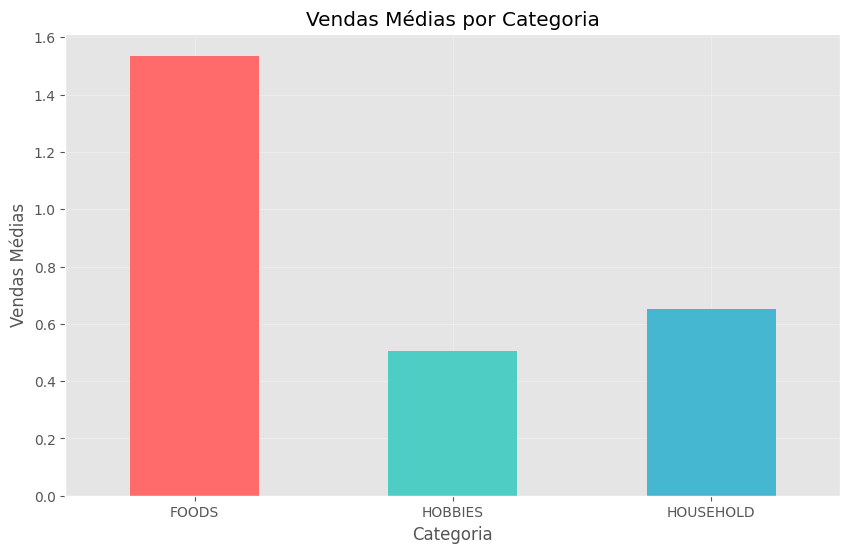

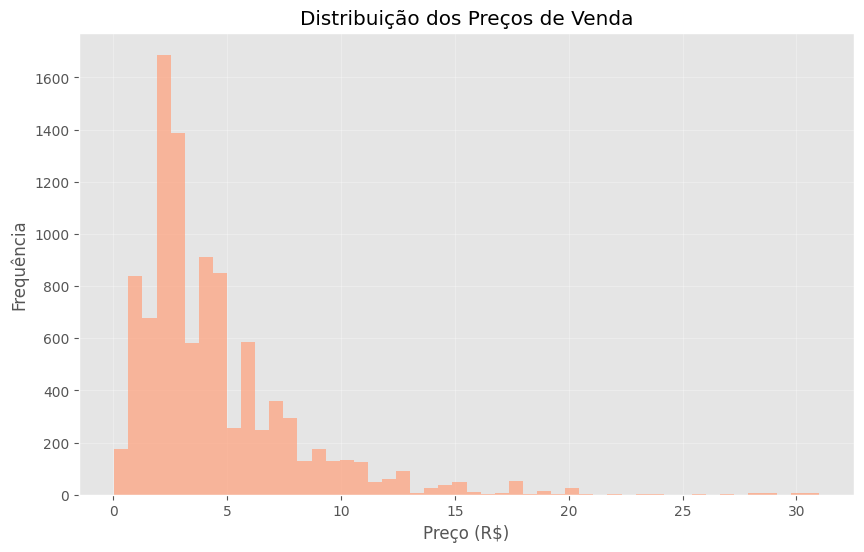

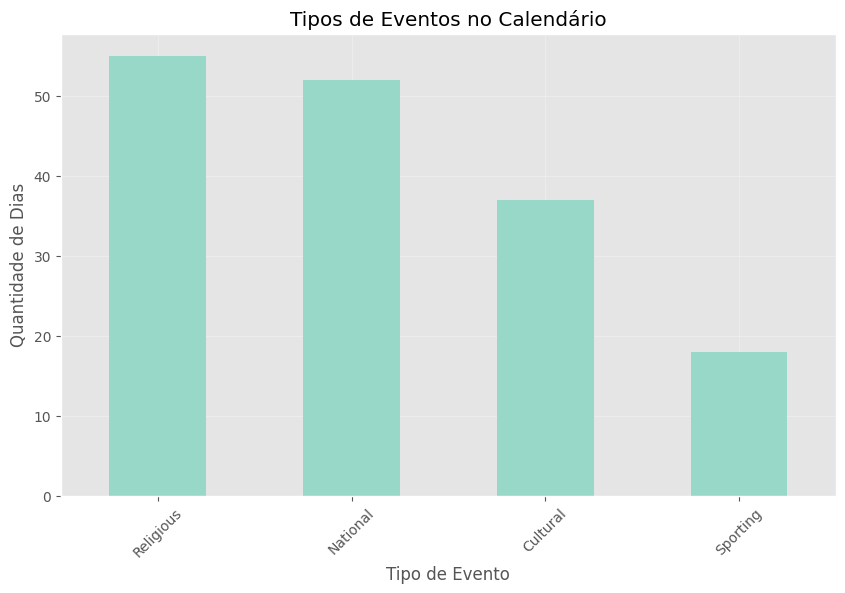

In [16]:
# 4. VISUALIZAÇÕES PRINCIPAIS
print("\n" + "="*50)
print("📊 CRIANDO VISUALIZAÇÕES")
print("="*50)

# 4.1 Distribuição de Vendas por Categoria
plt.figure(figsize=(10, 6))

# Pega algumas colunas de dias para análise
dias_amostra = ['d_100', 'd_200', 'd_300', 'd_400', 'd_500', 'd_600', 'd_700', 'd_800', 'd_900', 'd_1000']
dias_disponiveis = [col for col in vendas.columns if col in dias_amostra]

if dias_disponiveis:
    vendas_por_categoria = vendas.groupby('cat_id')[dias_disponiveis].mean().mean(axis=1)
    vendas_por_categoria.plot(kind='bar', color=['#FF6B6B', '#4ECDC4', '#45B7D1'])
    plt.title('Vendas Médias por Categoria')
    plt.xlabel('Categoria')
    plt.ylabel('Vendas Médias')
    plt.xticks(rotation=0)
    plt.grid(True, alpha=0.3)
    plt.show()
else:
    print("⚠️  Colunas de dias não encontradas para visualização")

# 4.2 Distribuição de Preços
plt.figure(figsize=(10, 6))

# Amostra de preços para não sobrecarregar
precos_amostra = precos.sample(n=min(10000, len(precos)), random_state=42)
plt.hist(precos_amostra['sell_price'], bins=50, alpha=0.7, color='#FFA07A')
plt.title('Distribuição dos Preços de Venda')
plt.xlabel('Preço (R$)')
plt.ylabel('Frequência')
plt.grid(True, alpha=0.3)
plt.show()

# 4.3 Eventos no Calendário
plt.figure(figsize=(10, 6))

if 'event_type_1' in calendario.columns:
    eventos_por_tipo = calendario['event_type_1'].value_counts()
    if not eventos_por_tipo.empty:
        eventos_por_tipo.plot(kind='bar', color='#98D8C8')
        plt.title('Tipos de Eventos no Calendário')
        plt.xlabel('Tipo de Evento')
        plt.ylabel('Quantidade de Dias')
        plt.xticks(rotation=45)
        plt.grid(True, alpha=0.3)
        plt.show()



In [17]:
# 5. ANÁLISE DE VALORES NULOS
print("\n" + "="*50)
print("🔍 ANÁLISE DE VALORES NULOS")
print("="*50)

print("\n📊 VENDAS - Valores Nulos:")
nulos_vendas = vendas.isnull().sum()
if nulos_vendas.sum() == 0:
    print("✅ Nenhum valor nulo encontrado!")
else:
    print(nulos_vendas[nulos_vendas > 0])

print("\n📅 CALENDÁRIO - Valores Nulos:")
for col in calendario.columns:
    nulos = calendario[col].isnull().sum()
    if nulos > 0:
        print(f"• {col}: {nulos} nulos ({nulos/len(calendario)*100:.1f}%)")

print("\n💰 PREÇOS - Valores Nulos:")
nulos_precos = precos.isnull().sum()
if nulos_precos.sum() == 0:
    print("✅ Nenhum valor nulo encontrado!")
else:
    print(nulos_precos[nulos_precos > 0])


🔍 ANÁLISE DE VALORES NULOS

📊 VENDAS - Valores Nulos:
✅ Nenhum valor nulo encontrado!

📅 CALENDÁRIO - Valores Nulos:
• event_name_1: 1807 nulos (91.8%)
• event_type_1: 1807 nulos (91.8%)
• event_name_2: 1964 nulos (99.7%)
• event_type_2: 1964 nulos (99.7%)

💰 PREÇOS - Valores Nulos:
✅ Nenhum valor nulo encontrado!


## 2. Entendimento dos dados

In [18]:
date_col = [col for col in vendas if col.startswith('d_')]
print(date_col)

['d_1', 'd_2', 'd_3', 'd_4', 'd_5', 'd_6', 'd_7', 'd_8', 'd_9', 'd_10', 'd_11', 'd_12', 'd_13', 'd_14', 'd_15', 'd_16', 'd_17', 'd_18', 'd_19', 'd_20', 'd_21', 'd_22', 'd_23', 'd_24', 'd_25', 'd_26', 'd_27', 'd_28', 'd_29', 'd_30', 'd_31', 'd_32', 'd_33', 'd_34', 'd_35', 'd_36', 'd_37', 'd_38', 'd_39', 'd_40', 'd_41', 'd_42', 'd_43', 'd_44', 'd_45', 'd_46', 'd_47', 'd_48', 'd_49', 'd_50', 'd_51', 'd_52', 'd_53', 'd_54', 'd_55', 'd_56', 'd_57', 'd_58', 'd_59', 'd_60', 'd_61', 'd_62', 'd_63', 'd_64', 'd_65', 'd_66', 'd_67', 'd_68', 'd_69', 'd_70', 'd_71', 'd_72', 'd_73', 'd_74', 'd_75', 'd_76', 'd_77', 'd_78', 'd_79', 'd_80', 'd_81', 'd_82', 'd_83', 'd_84', 'd_85', 'd_86', 'd_87', 'd_88', 'd_89', 'd_90', 'd_91', 'd_92', 'd_93', 'd_94', 'd_95', 'd_96', 'd_97', 'd_98', 'd_99', 'd_100', 'd_101', 'd_102', 'd_103', 'd_104', 'd_105', 'd_106', 'd_107', 'd_108', 'd_109', 'd_110', 'd_111', 'd_112', 'd_113', 'd_114', 'd_115', 'd_116', 'd_117', 'd_118', 'd_119', 'd_120', 'd_121', 'd_122', 'd_123', 

state_id
CA    12196
TX     9147
WI     9147
Name: count, dtype: int64


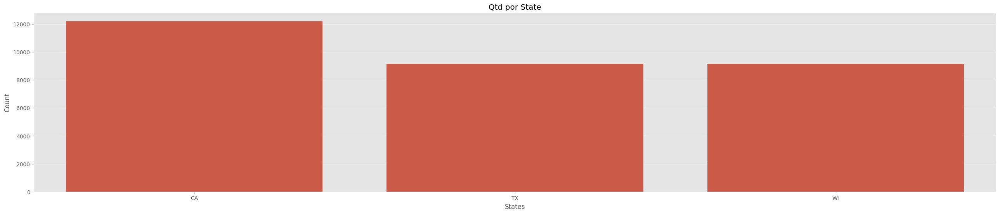

In [19]:
# Contagem por states

sales_state = vendas.state_id.value_counts()
print(sales_state)

# gráfico
sales_state_df = sales_state.reset_index()
sales_state_df.columns = ['state_id', 'count']

# Gráfico de barras
sns.barplot(x='state_id', y='count', data=sales_state_df)
plt.xlabel('States')
plt.ylabel('Count')
plt.title('Qtd por State')
plt.show()


In [20]:
# Participação por state (qtd)
percent_state = vendas.state_id.value_counts()/vendas.shape[0] * 100
print(percent_state)

state_id
CA    40.0
TX    30.0
WI    30.0
Name: count, dtype: float64


In [21]:
# Inclusão do total de vendas e depois total por state
vendas['total_sales'] = vendas[date_col].sum(axis=1)

vendas.groupby('state_id').agg({'total_sales':'sum'}).reset_index()

vendas.groupby('state_id').agg({'total_sales':'sum'})/vendas.total_sales.sum() * 100



,total_sales
state_id,
CA,43.649240
TX,28.767621
WI,27.583139


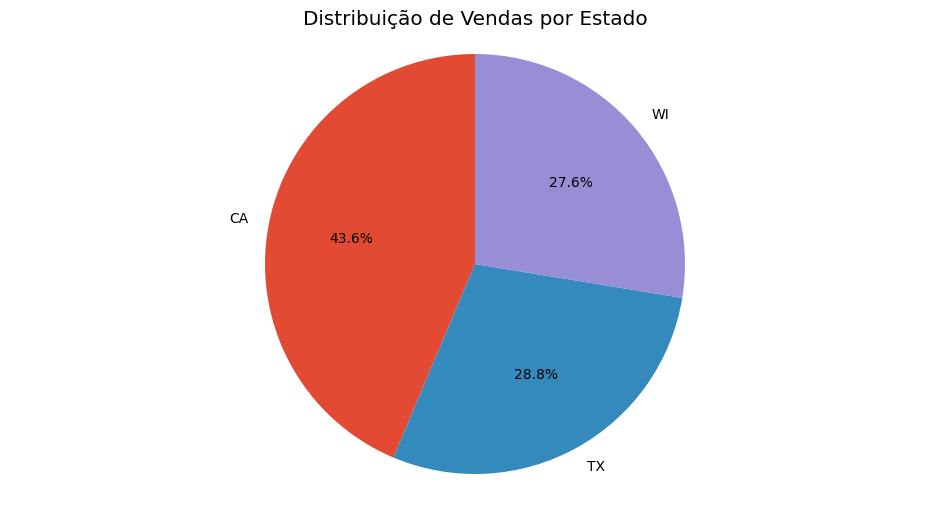

In [22]:
aux = vendas.groupby('state_id').agg({'total_sales':'sum'})/vendas.total_sales.sum() * 100
aux_percent = aux / aux.total_sales.sum() * 100

# Preparar dados para o gráfico
labels = aux_percent.index.tolist()
sizes = aux_percent['total_sales'].tolist()

# Gráfico de pizza
plt.figure(figsize=(12, 6))
plt.pie(sizes, labels=labels, autopct='%1.1f%%', startangle=90)
plt.title('Distribuição de Vendas por Estado')
plt.axis('equal')
plt.show()




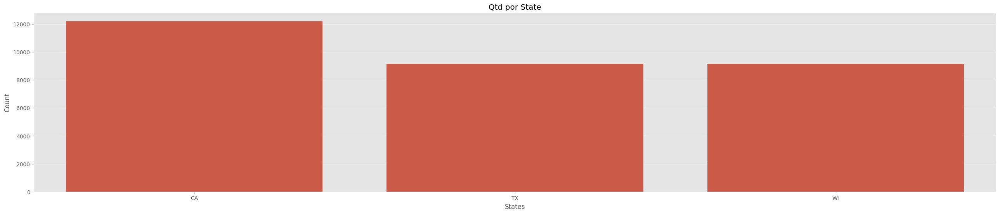

In [23]:
# gráfico em valor
sales_state_df = sales_state.reset_index()
sales_state_df.columns = ['state_id', 'count']

# Gráfico de barras
sns.barplot(x='state_id', y='count', data=sales_state_df)
plt.xlabel('States')
plt.ylabel('Count')
plt.title('Qtd por State')
plt.show()

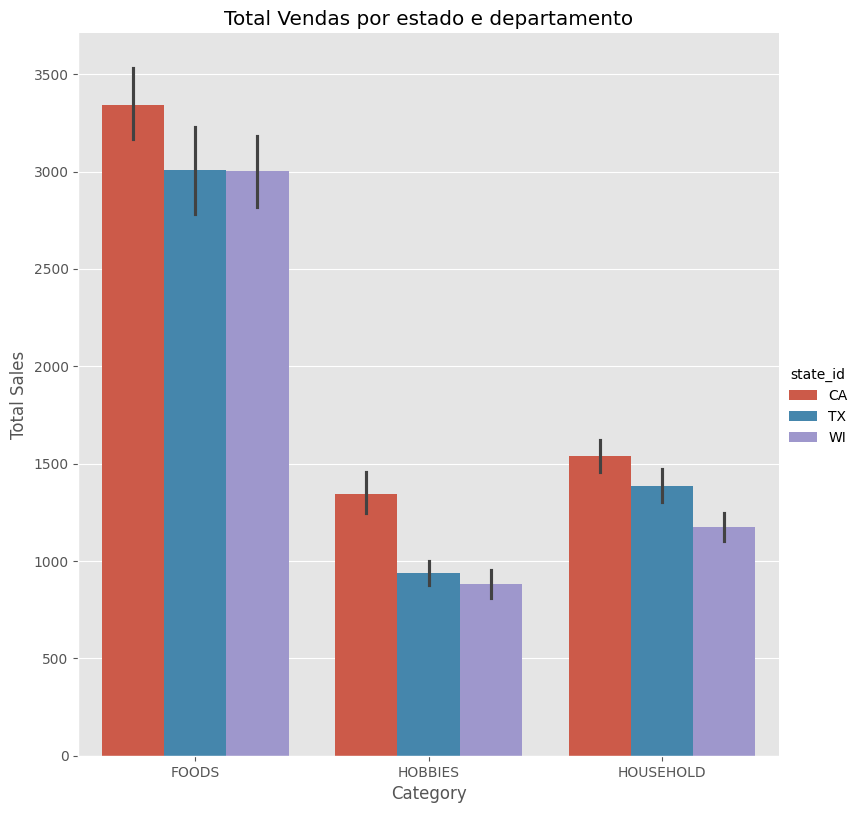

In [24]:
# Seleciona apenas colunas de vendas (que começam com 'd_')
vendas_cols = [col for col in vendas.columns if col.startswith('d_')]

# Soma apenas essas colunas
vendas['total_sales'] = vendas[vendas_cols].sum(axis=1)

# gráfico
sns.catplot(x='cat_id', y='total_sales',
            hue='state_id',
            data=vendas, kind='bar',
            height=8, aspect=1)

plt.title('Total Vendas por estado e departamento')
plt.xlabel('Category')
plt.ylabel('Total Sales')
plt.show()


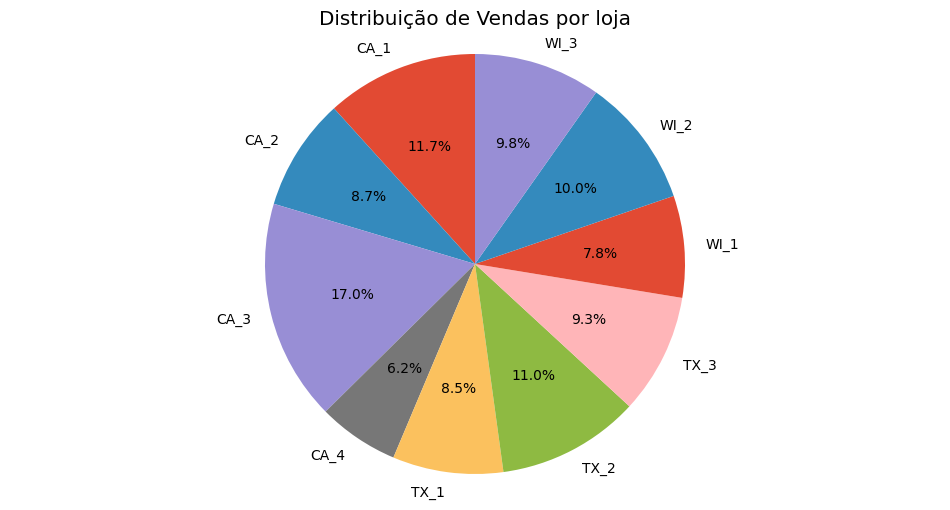

In [25]:
aux = vendas.groupby('store_id').agg({'total_sales':'sum'})/vendas.total_sales.sum() * 100
aux_percent = aux / aux.total_sales.sum() * 100

# Preparar dados para o gráfico
labels = aux_percent.index.tolist()
sizes = aux_percent['total_sales'].tolist()

# Gráfico de pizza
plt.figure(figsize=(12, 6))
plt.pie(sizes, labels=labels, autopct='%1.1f%%', startangle=90)
plt.title('Distribuição de Vendas por loja')
plt.axis('equal')
plt.show()




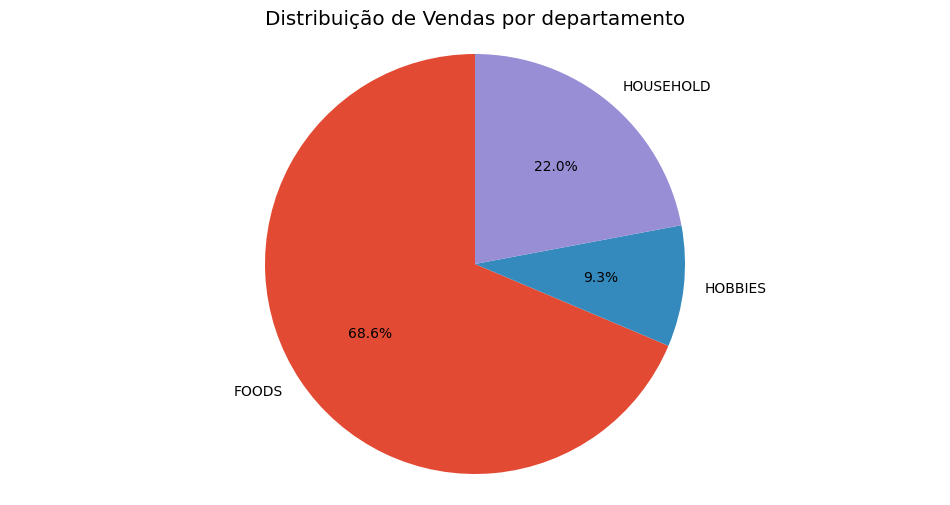

In [26]:
aux = vendas.groupby('cat_id').agg({'total_sales':'sum'})/vendas.total_sales.sum() * 100
aux_percent = aux / aux.total_sales.sum() * 100

# Preparar dados para o gráfico
labels = aux_percent.index.tolist()
sizes = aux_percent['total_sales'].tolist()

# Gráfico de pizza
plt.figure(figsize=(12, 6))
plt.pie(sizes, labels=labels, autopct='%1.1f%%', startangle=90)
plt.title('Distribuição de Vendas por departamento')
plt.axis('equal')
plt.show()




In [27]:
# Colunas de demanda

d_cols = [c for c in vendas.columns if c.startswith('d_')]
# Soma total das demandas diárias (todas as linhas, todos os estados)
total_series = vendas[d_cols].sum()
# Eixo x: dias (índice numérico ou datas, se disponível)
x = np.arange(len(d_cols)) # ou use vendas.columns[d_cols] se quiser datas
# Cria o gráfico
fig = go.Figure()
fig.add_trace(go.Scatter(x=x, y=total_series.values, mode='lines', marker=dict(color='royalblue'), name='Vendas Totais'))
# Layout final
fig.update_layout( title={ 'text': "<b>Histórico de Vendas</b>", # Negrito via HTML
                          'x': 0.5, 'xanchor': 'center', 'font': { 'size': 28, 'family': 'Arial', 'color': 'black' } },
                   xaxis=dict( title="Dia", titlefont=dict(size=18, family='Arial', color='black'), tickfont=dict(size=18),
                              showgrid=True, gridcolor='lightgray' ), yaxis=dict( title="Demanda", titlefont=dict(size=18, family='Arial', color='black'),
                                                                                 tickfont=dict(size=18), showgrid=True, gridcolor='lightgray' ), plot_bgcolor='white', height=800 )
fig.show()

In [144]:
import numpy as np
import pandas as pd
import plotly.graph_objects as go

# --------------------------------------------
# 1) Preparar a série TOTAL com índice de datas
# --------------------------------------------
d_cols = [c for c in vendas.columns if c.startswith("d_")]
total_series = vendas[d_cols].sum()

# Se você NÃO tem o calendar, gere as datas pela data inicial:
datas = pd.date_range(start="2011-01-29", periods=len(d_cols), freq="D")
# (Opcional) Se você JÁ tem calendar com as datas dos d_1..d_n, use:
# datas = calendar.loc[calendar["d"].isin(d_cols), "date"].sort_values().values

total = pd.Series(total_series.values, index=pd.to_datetime(datas), name="Demanda Total")

# --------------------------------------------
# 2) Definir janelas de Treino e Validação
# --------------------------------------------
ini_treino = pd.Timestamp("2011-01-29")
fim_treino = pd.Timestamp("2016-03-27")
ini_valid  = pd.Timestamp("2016-03-28")
fim_valid  = pd.Timestamp("2016-04-24")

# Segurança: recorta ao que existe no índice
ini_treino = max(ini_treino, total.index.min())
fim_valid  = min(fim_valid,  total.index.max())

# Durações
dur_treino = (fim_treino - ini_treino).days + 1
dur_valid  = (fim_valid  - ini_valid ).days + 1

# Para hover com o "período"
periodo = np.where((total.index >= ini_valid) & (total.index <= fim_valid),
                   "Validação", "Treinamento")

# --------------------------------------------
# 3) Gráfico
# --------------------------------------------
fig = go.Figure()

# Série principal
fig.add_trace(go.Scatter(
    x=total.index, y=total.values,
    mode="lines",
    line=dict(width=3),
    name="Vendas Totais",
    hovertemplate="<b>%{x|%Y-%m-%d}</b><br>Demanda: %{y:,.0f}<br>Período: %{customdata}<extra></extra>",
    customdata=periodo
))

# Faixas coloridas (não aparecem na legenda)
fig.add_vrect(x0=ini_treino, x1=fim_treino,
              fillcolor="rgba(56, 99, 171, 0.12)", line_width=0, layer="below")
fig.add_vrect(x0=ini_valid, x1=fim_valid,
              fillcolor="rgba(255, 127, 14, 0.15)", line_width=0, layer="below")

# Linha vertical no corte treino→validação
fig.add_vline(x=ini_valid, line_width=2, line_dash="dash",
              line_color="rgba(80,80,80,0.8)")

# "Legendas visuais" para as faixas (tracinhos invisíveis só para aparecer na legenda)
fig.add_trace(go.Scatter(x=[None], y=[None],
                         mode="lines",
                         line=dict(color="rgba(56, 99, 171, 0.85)", width=10),
                         name=f"Treinamento ({ini_treino.date()} → {fim_treino.date()} • {dur_treino} dias)"))
fig.add_trace(go.Scatter(x=[None], y=[None],
                         mode="lines",
                         line=dict(color="rgba(255, 127, 14, 0.85)", width=10),
                         name=f"Validação ({ini_valid.date()} → {fim_valid.date()} • {dur_valid} dias)"))

# Anotações executivas
fig.add_annotation(
    x=ini_treino + (fim_treino-ini_treino)/2,
    y=total.max(),
    yshift=30,
    text=f"<b>Treinamento</b><br>{ini_treino.date()} – {fim_treino.date()}<br>{dur_treino} dias",
    showarrow=False,
    align="center",
    font=dict(size=18, color="#1f3a68"),
    bgcolor="rgba(56, 99, 171, 0.10)",
    bordercolor="rgba(56, 99, 171, 0.35)",
    borderwidth=1
)
fig.add_annotation(
    x=ini_valid + (fim_valid-ini_valid)/2,
    y=total.max(),
    yshift=30,
    text=f"<b>Teste</b><br>{ini_valid.date()} – {fim_valid.date()}<br>{dur_valid} dias",
    showarrow=False,
    align="center",
    font=dict(size=18, color="#7a3a00"),
    bgcolor="rgba(255, 127, 14, 0.10)",
    bordercolor="rgba(255, 127, 14, 0.35)",
    borderwidth=1
)

# Layout executivo
fig.update_layout(
    title=dict(
        text="<b>Histórico de Vendas com Janelas de Treinamento e Validação</b>",
        x=0.5, xanchor="center", font=dict(size=26)
    ),
    xaxis=dict(
        title="Data",
        showgrid=True, gridcolor="rgba(0,0,0,0.08)",
        tickfont=dict(size=18),
    ),
    yaxis=dict(
        title="Demanda (Total)",
        showgrid=True, gridcolor="rgba(0,0,0,0.08)",
        tickfont=dict(size=18),
        separatethousands=True
    ),
    legend=dict(
        orientation="h",
        yanchor="bottom", y=1.02,
        xanchor="center", x=0.5,
        bgcolor="rgba(255,255,255,0.7)",
        bordercolor="rgba(0,0,0,0.1)", borderwidth=1,
        font=dict(size=16)
    ),
    plot_bgcolor="white",
    height=650,
    margin=dict(t=90, r=30, l=70, b=50)
)

# Rodapé sutil (opcional)
fig.add_annotation(
    xref="paper", yref="paper", x=0, y=-0.15,
    text="Regra de avaliação: treino até o penúltimo mês e validação nas 4 semanas subsequentes.",
    showarrow=False, font=dict(size=16, color="rgba(60,60,60,0.9)")
)

fig.show()


In [29]:
# Série de vendas por states


# Colunas de demanda
d_cols = [c for c in vendas.columns if c.startswith('d_')]

# Agrupa por estado e soma as demandas diárias
state_series = vendas.groupby('state_id')[d_cols].sum()

# Lista de estados
ids = state_series.index.tolist()
n = len(ids)

# Cria subplots
fig = make_subplots(rows=n, cols=1,
                    subplot_titles=[f"Estado: {state}" for state in ids])

# Adiciona os gráficos
cores = ['mediumseagreen', 'royalblue', 'darkorange', 'firebrick', 'goldenrod', 'slateblue']
for i, state in enumerate(ids):
    x = np.arange(len(d_cols))
    y = state_series.loc[state].values
    fig.add_trace(go.Scatter(x=x, y=y, showlegend=False,
                             mode='lines', marker=dict(color=cores[i % len(cores)])),
                  row=i+1, col=1)

# Layout final
fig.update_layout(height=300 * n, title={ 'text': "<b>Vendas por estado</b>", # Negrito via HTML
                          'x': 0.5, 'xanchor': 'center', 'font': { 'size': 28, 'family': 'Arial', 'color': 'black' } }
                   )
fig.show()

In [30]:
# departamento por state CA

# Colunas de demanda
d_cols = [c for c in vendas.columns if c.startswith('d_')]

# Agrupa por estado e soma as demandas diárias
aux = vendas[vendas['state_id'] == 'CA']
aux = aux.groupby('cat_id')[d_cols].sum()

# Lista de estados
ids = aux.index.tolist()

n = len(ids)

# Cria subplots
fig = make_subplots(rows=n, cols=1,
                    subplot_titles=[f"Depart: {depart}" for depart in ids])

# Adiciona os gráficos
cores = ['mediumseagreen', 'royalblue', 'darkorange', 'firebrick', 'goldenrod', 'slateblue']
for i, depart in enumerate(ids):
    x = np.arange(len(d_cols))
    y = aux.loc[depart].values
    fig.add_trace(go.Scatter(x=x, y=y, showlegend=False,
                             mode='lines', marker=dict(color=cores[i % len(cores)])),
                  row=i+1, col=1)

# Layout final
fig.update_layout(height=300 * n, title={ 'text': "<b>Total de Vendas da Loja CA_1 por Departamento</b>", # Negrito via HTML
                          'x': 0.5, 'xanchor': 'center', 'font': { 'size': 28, 'family': 'Arial', 'color': 'black' } })
fig.show()


In [31]:
# departamento por state TX

# Colunas de demanda
d_cols = [c for c in vendas.columns if c.startswith('d_')]

# Agrupa por estado e soma as demandas diárias
aux = vendas[vendas['state_id'] == 'TX']
aux = aux.groupby('cat_id')[d_cols].sum()

# Lista de estados
ids = aux.index.tolist()

n = len(ids)

# Cria subplots
fig = make_subplots(rows=n, cols=1,
                    subplot_titles=[f"Depart: {depart}" for depart in ids])

# Adiciona os gráficos
cores = ['mediumseagreen', 'royalblue', 'darkorange', 'firebrick', 'goldenrod', 'slateblue']
for i, depart in enumerate(ids):
    x = np.arange(len(d_cols))
    y = aux.loc[depart].values
    fig.add_trace(go.Scatter(x=x, y=y, showlegend=False,
                             mode='lines', marker=dict(color=cores[i % len(cores)])),
                  row=i+1, col=1)

# Layout final
fig.update_layout(height=300 * n, title_text="Vendas por departamento em TX ao longo do tempo")
fig.show()


In [32]:
# departamento por state WI

# Colunas de demanda
d_cols = [c for c in vendas.columns if c.startswith('d_')]

# Agrupa por estado e soma as demandas diárias
aux = vendas[vendas['state_id'] == 'WI']
aux = aux.groupby('cat_id')[d_cols].sum()

# Lista de estados
ids = aux.index.tolist()

n = len(ids)

# Cria subplots
fig = make_subplots(rows=n, cols=1,
                    subplot_titles=[f"Depart: {depart}" for depart in ids])

# Adiciona os gráficos
cores = ['mediumseagreen', 'royalblue', 'darkorange', 'firebrick', 'goldenrod', 'slateblue']
for i, depart in enumerate(ids):
    x = np.arange(len(d_cols))
    y = aux.loc[depart].values
    fig.add_trace(go.Scatter(x=x, y=y, showlegend=False,
                             mode='lines', marker=dict(color=cores[i % len(cores)])),
                  row=i+1, col=1)

# Layout final
fig.update_layout(height=300 * n, title_text="Vendas por departamento em WI ao longo do tempo")
fig.show()


In [33]:
# MAIORES PRODUTOS DE CADA CATEGORIA

# IDs únicos top 3 de cada departamento
aux = vendas.groupby(['cat_id', 'item_id']).agg({'total_sales': 'sum'}).reset_index()

# Aplica rank por dept_id e filtra os top 3
aux = aux.groupby('cat_id').apply(lambda x: x.nlargest(3, 'total_sales')).reset_index(drop=True)
aux = aux.sort_values(by=['cat_id', 'total_sales'], ascending=[True, False])
print(aux)

ids = aux['item_id'].tolist()


# Lista de item_ids únicos
ids = list(set(aux['item_id']))
d_cols = [c for c in vendas.columns if 'd_' in c]

# Número de itens a plotar
n = len(ids)

# Cria subplots dinâmicos
fig = make_subplots(rows=n, cols=1,
                    subplot_titles=[f"Produto: {item}" for item in ids])

# Adiciona os gráficos
for i, item_id in enumerate(ids):
    x = vendas.loc[vendas['item_id'] == item_id].set_index('item_id')[d_cols].values[0]
    cor = ['mediumseagreen', 'royalblue', 'darkorange', 'firebrick', 'goldenrod', 'slateblue']
    fig.add_trace(go.Scatter(x=np.arange(len(x)), y=x, showlegend=False,
                             mode='lines', marker=dict(color=cor[i % len(cor)])),
                  row=i+1, col=1)

# Layout final
fig.update_layout(height=300 * n, title_text="Vendas por item_id")
fig.show()


      cat_id          item_id  total_sales
0      FOODS      FOODS_3_090      1002529
1      FOODS      FOODS_3_586       920242
2      FOODS      FOODS_3_252       565299
3    HOBBIES    HOBBIES_1_371       122565
4    HOBBIES    HOBBIES_1_348       105876
5    HOBBIES    HOBBIES_1_268        95171
6  HOUSEHOLD  HOUSEHOLD_1_334       171275
7  HOUSEHOLD  HOUSEHOLD_1_459       170532
8  HOUSEHOLD  HOUSEHOLD_1_521       153340


In [34]:
# departamento por state CA

# Colunas de demanda
d_cols = [c for c in vendas.columns if c.startswith('d_')]

# Agrupa por estado e soma as demandas diárias
aux = vendas[vendas['state_id'] == 'CA']
aux = aux.groupby('store_id')[d_cols].sum()

# Lista de estados
ids = aux.index.tolist()
ids
n = len(ids)

# Cria subplots
fig = make_subplots(rows=n, cols=1,
                    subplot_titles=[f"Depart: {depart}" for depart in ids])

# Adiciona os gráficos
cores = ['mediumseagreen', 'royalblue', 'darkorange', 'firebrick', 'goldenrod', 'slateblue']
for i, depart in enumerate(ids):
    x = np.arange(len(d_cols))
    y = aux.loc[depart].values
    fig.add_trace(go.Scatter(x=x, y=y, showlegend=False,
                             mode='lines', marker=dict(color=cores[i % len(cores)])),
                  row=i+1, col=1)

# Layout final
fig.update_layout(height=300 * n, title_text="Vendas por LOJA EM em CA ao longo do tempo")
fig.show()


In [35]:
# departamento por state CA

# Colunas de demanda
d_cols = [c for c in vendas.columns if c.startswith('d_')]

# Agrupa por estado e soma as demandas diárias

aux = vendas[
    ((vendas['state_id'] == 'CA') &
     (vendas['store_id'].isin(['CA_1','CA_2','CA_3','CA_4'])))
].copy()
aux['store_id'] = aux['store_id'].cat.remove_unused_categories()
aux = aux.groupby('store_id')[d_cols].sum()

# Lista de estados
ids = aux.index.tolist()
ids
n = len(ids)

# Cria subplots
fig = make_subplots(rows=n, cols=1,
                    subplot_titles=[f"Depart: {depart}" for depart in ids])

# Adiciona os gráficos
cores = ['mediumseagreen', 'royalblue', 'darkorange', 'firebrick', 'goldenrod', 'slateblue']
for i, depart in enumerate(ids):
    x = np.arange(len(d_cols))
    y = aux.loc[depart].values
    fig.add_trace(go.Scatter(x=x, y=y, showlegend=False,
                             mode='lines', marker=dict(color=cores[i % len(cores)])),
                  row=i+1, col=1)

# Layout final
fig.update_layout(height=300 * n, title_text="Vendas por LOJA EM em CA ao longo do tempo")
fig.show()


In [48]:


# --- série total e média móvel ---
d_cols = [c for c in vendas.columns if c.startswith('d_')]
total_series = vendas[d_cols].sum()
datas = pd.to_datetime(calendario.loc[calendario['d'].isin(d_cols), 'date'])
serie_total = pd.Series(total_series.values, index=datas).sort_index()
mm28 = serie_total.rolling(28, min_periods=1).mean()

# --- eventos ---
evt = calendario.loc[calendario['event_name_1'].notna(), ['date', 'event_name_1']].copy()
evt['date'] = pd.to_datetime(evt['date'])
evt_all = evt.copy()

maiores = r"Christmas|Thanksgiving|Easter|SuperBowl|Valentines|Memorial|Independence|LaborDay|NewYear|Mother|Father"
evt_big = evt_all[evt_all['event_name_1'].str.contains(maiores, flags=re.I, regex=True, na=False)].copy()
evt_big['ym'] = evt_big['date'].dt.to_period('M')
evt_big = evt_big.sort_values('date').groupby('ym', as_index=False).first()

y_all = serie_total.reindex(evt_all['date']).values * 1.02
y_big = serie_total.reindex(evt_big['date']).values * 1.05

# --- gráfico ---
fig = go.Figure()

# linha principal
fig.add_trace(go.Scattergl(
    x=serie_total.index, y=serie_total.values,
    mode='lines', name='Vendas Totais',
    line=dict(width=1.5, color='royalblue')
))

# média móvel
fig.add_trace(go.Scattergl(
    x=mm28.index, y=mm28.values,
    mode='lines', name='Média móvel (28d)',
    line=dict(width=4, color='crimson')
))

# eventos discretos
fig.add_trace(go.Scatter(
    x=evt_all['date'], y=y_all,
    mode='markers',
    marker=dict(symbol='x', size=8, color='gray'),
    name='Demais eventos',
    hovertext=evt_all['event_name_1'],
    hoverinfo='text',
    opacity=0.6
))

# feriados principais com rótulo
fig.add_trace(go.Scatter(
    x=evt_big['date'], y=y_big,
    mode='markers+text',
    marker=dict(symbol='x', size=10, color='firebrick'),
    text=evt_big['event_name_1'],
    textposition='top center',
    textfont=dict(size=20, color='firebrick', family='Arial Black'),
    name='Eventos principais',
    hovertext=evt_big['event_name_1'],
    hoverinfo='text'
))

# --- layout ---
fig.update_layout(
    title=dict(
        text="<b>Histórico de Vendas e Principais Feriados</b>",
        x=0.5,
        font=dict(size=30, family='Arial Black', color='black')
    ),
    xaxis=dict(
        title="Data",
        titlefont=dict(size=22, family='Arial', color='black'),
        tickfont=dict(size=16),
        showgrid=True,
        gridcolor='lightgray'
    ),
    yaxis=dict(
        title="Demanda",
        titlefont=dict(size=22, family='Arial', color='black'),
        tickfont=dict(size=18),
        showgrid=True,
        gridcolor='lightgray'
    ),
    legend=dict(
        font=dict(size=18),
        orientation='h',
        yanchor='bottom', y=1.02,
        xanchor='center', x=0.5
    ),
    plot_bgcolor='white',
    height=900,
    hovermode="x unified"
)

fig.show()


In [70]:
vendas[d_cols].sum()

# --- série total e média móvel ---
d_cols = [c for c in vendas.columns if c.startswith('d_')][-2000:]
total_series = vendas[d_cols].tail(2000).sum()
datas = pd.to_datetime(calendario.loc[calendario['d'].isin(d_cols), 'date'])
serie_total = pd.Series(total_series.values, index=datas).sort_index()
mm28 = serie_total.rolling(28, min_periods=1).mean()

# >>> intervalo real da série (para cortar eventos e “apertar” o eixo X)
x0 = serie_total.index.min()
x1 = serie_total.index.max()

# --- eventos ---
evt_all = calendario.loc[calendario['event_name_1'].notna(), ['date', 'event_name_1']].copy()
evt_all['date'] = pd.to_datetime(evt_all['date'])

# >>> corta eventos fora do intervalo da série (isso remove o espaço vazio!)
evt_all = evt_all[(evt_all['date'] >= x0) & (evt_all['date'] <= x1)].copy()

maiores = r"Christmas|Thanksgiving|Easter|SuperBowl|Valentines|LaborDay|NewYear"
evt_big = evt_all[evt_all['event_name_1'].str.contains(maiores, flags=re.I, regex=True, na=False)].copy()
evt_big['ym'] = evt_big['date'].dt.to_period('M')
evt_big = evt_big.sort_values('date').groupby('ym', as_index=False).first()

y_all = serie_total.reindex(evt_all['date']).values * 1.02
y_big = serie_total.reindex(evt_big['date']).values * 1.05

# --- gráfico ---
fig = go.Figure()

# linha principal
fig.add_trace(go.Scattergl(
    x=serie_total.index, y=serie_total.values,
    mode='lines', name='Vendas Totais',
    line=dict(width=1.5, color='royalblue')
))

# média móvel
fig.add_trace(go.Scattergl(
    x=mm28.index, y=mm28.values,
    mode='lines', name='Média móvel (28d)',
    line=dict(width=4, color='crimson')
))

# eventos discretos
fig.add_trace(go.Scatter(
    x=evt_all['date'], y=y_all,
    mode='markers',
    marker=dict(symbol='x', size=8, color='gray'),
    name='Demais eventos',
    hovertext=evt_all['event_name_1'],
    hoverinfo='text',
    opacity=0.6
))

# feriados principais com rótulo
fig.add_trace(go.Scatter(
    x=evt_big['date'], y=y_big,
    mode='markers+text',
    marker=dict(symbol='x', size=10, color='firebrick'),
    text=evt_big['event_name_1'],
    textposition='top center',
    textfont=dict(size=20, color='firebrick', family='Arial Black'),
    name='Eventos principais',
    hovertext=evt_big['event_name_1'],
    hoverinfo='text'
))

# --- layout ---
fig.update_layout(
    title=dict(
        text="<b>Histórico de Vendas e Principais Feriados</b>",
        x=0.5,
        font=dict(size=30, family='Arial Black', color='black')
    ),
    xaxis=dict(
        title="Data",
        titlefont=dict(size=22, family='Arial', color='black'),
        tickfont=dict(size=16),
        showgrid=True,
        gridcolor='lightgray'
    ),
    yaxis=dict(
        title="Demanda",
        titlefont=dict(size=22, family='Arial', color='black'),
        tickfont=dict(size=18),
        showgrid=True,
        gridcolor='lightgray'
    ),
    legend=dict(
        font=dict(size=18),
        orientation='h',
        yanchor='bottom', y=1.02,
        xanchor='center', x=0.5
    ),
    plot_bgcolor='white',
    height=900,
    hovermode="x unified"
)

fig.show()


In [82]:
import re
import pandas as pd
import plotly.graph_objects as go

# --- série total e média móvel ---
d_cols = [c for c in vendas.columns if c.startswith('d_')][-1500:]

# (atenção: tail(1000) aqui corta itens/linhas; mantenha só se for intencional)
total_series = vendas[d_cols].tail(1500).sum()

datas = pd.to_datetime(calendario.loc[calendario['d'].isin(d_cols), 'date'])
serie_total = pd.Series(total_series.values, index=datas).sort_index()
mm28 = serie_total.rolling(28, min_periods=1).mean()

# >>> intervalo real da série (para cortar eventos e “apertar” o eixo X)
x0 = serie_total.index.min()
x1 = serie_total.index.max()

# --- eventos ---
evt_all = calendario.loc[calendario['event_name_1'].notna(), ['date', 'event_name_1']].copy()
evt_all['date'] = pd.to_datetime(evt_all['date'])

# >>> corta eventos fora do intervalo da série (isso remove o espaço vazio!)
evt_all = evt_all[(evt_all['date'] >= x0) & (evt_all['date'] <= x1)].copy()

maiores = r"Christmas|Thanksgiving|SuperBowl|Valentines|Memorial|LaborDay|NewYear|Mother|Father"
evt_big = evt_all[evt_all['event_name_1'].str.contains(maiores, flags=re.I, regex=True, na=False)].copy()
evt_big['ym'] = evt_big['date'].dt.to_period('M')
evt_big = evt_big.sort_values('date').groupby('ym', as_index=False).first()

y_all = serie_total.reindex(evt_all['date']).values * 1.02
# base do y_big
y_big0 = serie_total.reindex(evt_big['date']).values.astype(float)

# offsets em “degraus” para não encavalar (cicla)
steps = np.array([1.05, 1.10, 1.15, 1.20])  # aumente se ainda colidir
y_big = y_big0 * steps[np.arange(len(evt_big)) % len(steps)]

# alterna posição horizontal do texto
pos = np.array(["top left", "top center", "top right", "top center"])
textpos = pos[np.arange(len(evt_big)) % len(pos)]


# --- gráfico ---
fig = go.Figure()

fig.add_trace(go.Scattergl(
    x=serie_total.index, y=serie_total.values,
    mode='lines', name='Vendas Totais',
    line=dict(width=1.5, color='royalblue'),
    opacity=0.45
))

fig.add_trace(go.Scattergl(
    x=mm28.index, y=mm28.values,
    mode='lines', name='Média móvel (28d)',
    line=dict(width=3.5, color='crimson')
))

fig.add_trace(go.Scatter(
    x=evt_all['date'], y=y_all,
    mode='markers',
    marker=dict(symbol='x', size=7, color='gray'),
    name='Demais eventos',
    hovertext=evt_all['event_name_1'],
    hoverinfo='text',
    opacity=0.35
))

fig.add_trace(go.Scatter(
    x=evt_big['date'], y=y_big,
    mode='markers+text',
    marker=dict(symbol='x', size=9, color='firebrick'),
    text=evt_big['event_name_1'],
    textposition=textpos,  # <<< posição variável
    textfont=dict(size=22, color='firebrick', family='Arial Black'),
    name='Eventos principais',
    hovertext=evt_big['event_name_1'],
    hoverinfo='text'
))



# --- layout (mais compacto) ---
fig.update_layout(
    title=dict(
        text="<b>Histórico de Vendas e Principais Feriados</b>",
        x=0.5,
        font=dict(size=30, family='Arial Black', color='black')
    ),
    xaxis=dict(
        title="Data",
        range=[x0, x1],              # <<< força o range exatamente no trecho útil
        showgrid=True,
        gridcolor='lightgray'
    ),
    yaxis=dict(
        title="Demanda",
        titlefont=dict(size=22, family='Arial', color='black'),
        tickfont=dict(size=18),
        showgrid=True,
        gridcolor='lightgray'
    ),
    legend=dict(
        font=dict(size=18),
        orientation='h',
        yanchor='bottom', y=1.02,
        xanchor='center', x=0.5
    ),
    plot_bgcolor='white',
    height=650,                     # <<< reduz altura e melhora “densidade”
    margin=dict(l=60, r=20, t=80, b=55),
    hovermode="x unified"
)

fig.show()


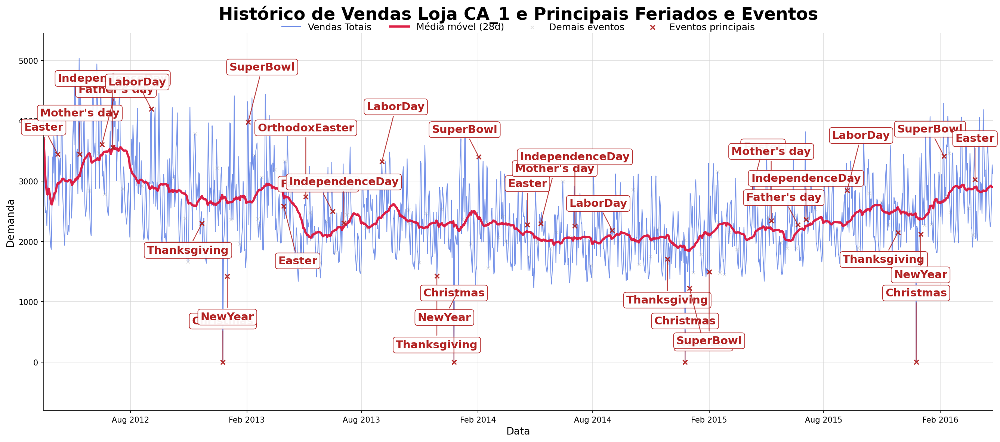

In [107]:
import re
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

# =========================
# 1) Série total + MM(28)
# =========================
N_DIAS = 1500
d_cols = [c for c in vendas.columns if c.startswith("d_")][-N_DIAS:]

# mantém seu comportamento (corta itens/linhas). Remova .tail(N_DIAS) se não quiser
total_series = vendas[d_cols].tail(N_DIAS).sum(axis=0)

# alinhamento correto: datas na MESMA ordem de d_cols
cal_map = calendario.set_index("d", drop=False)
datas = pd.to_datetime(cal_map.loc[d_cols, "date"]).dt.tz_localize(None)

serie_total = pd.Series(total_series.values, index=datas).sort_index()
mm28 = serie_total.rolling(28, min_periods=1).mean()

x0, x1 = serie_total.index.min(), serie_total.index.max()

# =========================
# 2) Eventos (cortados no range)
# =========================
evt_all = calendario.loc[calendario["event_name_1"].notna(), ["date", "event_name_1"]].copy()
evt_all["date"] = pd.to_datetime(evt_all["date"]).dt.tz_localize(None)
evt_all = evt_all[(evt_all["date"] >= x0) & (evt_all["date"] <= x1)].copy()

maiores = r"Christmas|Thanksgiving|Easter|OrthodoxEaster|SuperBowl|Valentines|LaborDay|NewYear|Mother|Father|Independence|Memorial"
evt_big = evt_all[evt_all["event_name_1"].str.contains(maiores, flags=re.I, regex=True, na=False)].copy()

# 1 evento principal por mês (igual ao seu)
evt_big["ym"] = evt_big["date"].dt.to_period("M")
evt_big = evt_big.sort_values("date").groupby("ym", as_index=False).first()
evt_big = evt_big.sort_values("date").reset_index(drop=True)

# =========================
# 3) Y dos marcadores (em cima da linha)
# =========================
y_all = serie_total.reindex(evt_all["date"]).astype(float).values
y_big = serie_total.reindex(evt_big["date"]).astype(float).values

mask_all = np.isfinite(y_all)
evt_all_plot = evt_all.loc[mask_all].copy()
y_all_plot = y_all[mask_all]

mask_big = np.isfinite(y_big)
evt_big_plot = evt_big.loc[mask_big].copy()
y_big_plot = y_big[mask_big]

# mm28 nos dias dos eventos (para decidir acima/abaixo)
mm_big = mm28.reindex(evt_big_plot["date"]).astype(float).values
mm_big = np.where(np.isfinite(mm_big), mm_big, y_big_plot)

# =========================
# 4) Plot (fiel ao antigo) + títulos
# =========================
plt.style.use("default")

fig, ax = plt.subplots(figsize=(18, 8), dpi=150)
fig.patch.set_facecolor("white")
ax.set_facecolor("white")

# Linha azul
ax.plot(
    serie_total.index, serie_total.values,
    color="royalblue", linewidth=1.0, alpha=0.70,
    label="Vendas Totais", zorder=2
)

# MM28 (vermelha)
ax.plot(
    mm28.index, mm28.values,
    color="crimson", linewidth=2.8, alpha=0.95,
    label="Média móvel (28d)", zorder=3
)

# X cinza
ax.scatter(
    evt_all_plot["date"], y_all_plot,
    marker="x", s=18, linewidths=1.0,
    color="gray", alpha=0.22,
    label="Demais eventos", zorder=4
)

# X vermelho (principais)
ax.scatter(
    evt_big_plot["date"], y_big_plot,
    marker="x", s=32, linewidths=1.6,
    color="firebrick", alpha=0.95,
    label="Eventos principais", zorder=5
)

# Título + eixos (os que faltaram)
ax.set_title("Histórico de Vendas Loja CA_1 e Principais Feriados e Eventos",
             fontsize=22, fontweight="bold", pad=18)
ax.set_xlabel("Data", fontsize=13)
ax.set_ylabel("Demanda", fontsize=13)

ax.grid(True, which="major", color="lightgray", linewidth=0.8, alpha=0.7)
ax.set_axisbelow(True)
ax.set_xlim([x0, x1])

ax.xaxis.set_major_locator(mdates.MonthLocator(interval=6))
ax.xaxis.set_major_formatter(mdates.DateFormatter("%b %Y"))
plt.setp(ax.get_xticklabels(), rotation=0, ha="center")

for spine in ["top", "right"]:
    ax.spines[spine].set_visible(False)

ax.legend(
    loc="upper center",
    bbox_to_anchor=(0.5, 1.05),
    ncol=4,
    frameon=False,
    fontsize=12
)

# =========================
# 5) Callouts (caixa + linha guia forte) sem encavalar
#    Estratégia: faixas fixas (4 acima + 4 abaixo) + alternância
# =========================
ymin, ymax = ax.get_ylim()
yr = ymax - ymin

# define "faixas" de deslocamento vertical (em pontos) para distribuir rótulos
# 4 níveis acima e 4 abaixo (bem visual)
up_levels   = np.array([28, 46, 64, 82])
down_levels = -np.array([28, 46, 64, 82])

# deslocamento horizontal alternado (ajuda a “descolar” textos)
dx_levels = np.array([-18, 0, 18, 0])

# contador por "lado" (acima/abaixo) para rodar os níveis sem encavalar
up_count = 0
down_count = 0

# proteção: se estiver muito próximo do fundo, força acima
floor_guard = ymin + 0.12 * yr

for d, name, yv, mv in zip(evt_big_plot["date"], evt_big_plot["event_name_1"], y_big_plot, mm_big):
    name = str(name)

    # Decide lado (acima/abaixo):
    # - regra base: acima se yv >= mm (para não cruzar MM)
    # - se estiver muito perto do fundo, força acima (Christmas etc.)
    place_up = (yv >= mv) or (yv <= floor_guard) or re.search(r"Christmas", name, flags=re.I)

    if place_up:
        lv = up_count % len(up_levels)
        dy = up_levels[lv]
        dx = dx_levels[up_count % len(dx_levels)]
        up_count += 1
        va = "bottom"
    else:
        lv = down_count % len(down_levels)
        dy = down_levels[lv]
        dx = dx_levels[down_count % len(dx_levels)]
        down_count += 1
        va = "top"

    # Callout: texto em caixa branca + linha guia até o X
    ax.annotate(
        name,
        xy=(d, yv),
        xytext=(dx, dy),
        textcoords="offset points",
        ha="center", va=va,
        fontsize=14, fontweight="bold",
        color="firebrick",
        bbox=dict(boxstyle="round,pad=0.25", fc="white", ec="firebrick", lw=0.8, alpha=0.95),
        arrowprops=dict(arrowstyle="-", color="firebrick", lw=1.1, alpha=0.85),
        zorder=10
    )

# margem inferior para nunca cortar rótulo no rodapé
ax.set_ylim(ymin - 0.10 * yr, ymax + 0.03 * yr)

plt.tight_layout()
plt.savefig("grafico_vendas_eventos_callouts.png", dpi=300, bbox_inches="tight")
plt.show()


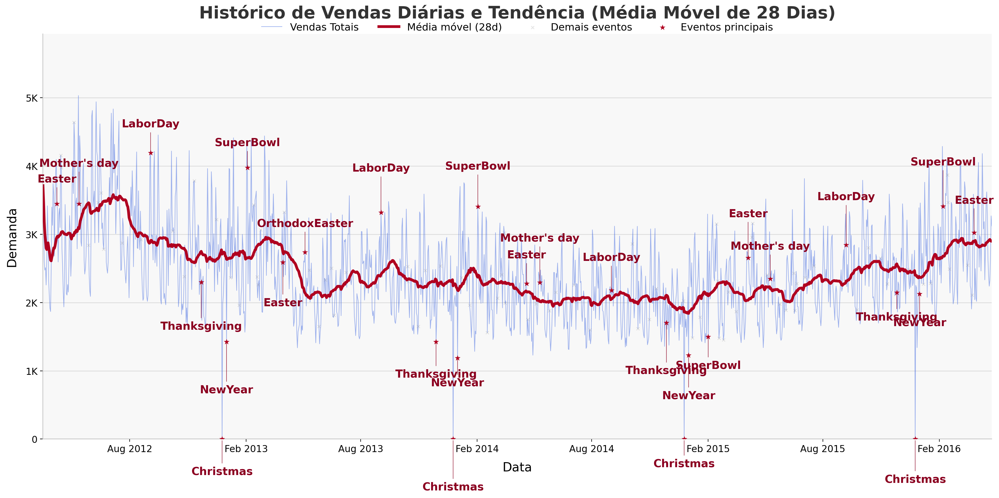

In [110]:
import re
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

# Supondo que 'vendas' e 'calendario' estão carregados (seu código de preparação)
# =========================
# 1) Série total + MM(28) (mantido o seu código)
# =========================
N_DIAS = 1500
d_cols = [c for c in vendas.columns if c.startswith("d_")][-N_DIAS:]

total_series = vendas[d_cols].tail(N_DIAS).sum(axis=0)

cal_map = calendario.set_index("d", drop=False)
datas = pd.to_datetime(cal_map.loc[d_cols, "date"]).dt.tz_localize(None)

serie_total = pd.Series(total_series.values, index=datas).sort_index()
mm28 = serie_total.rolling(28, min_periods=1).mean()

x0, x1 = serie_total.index.min(), serie_total.index.max()

# =========================
# 2) Eventos (mantido o seu código)
# =========================
evt_all = calendario.loc[calendario["event_name_1"].notna(), ["date", "event_name_1"]].copy()
evt_all["date"] = pd.to_datetime(evt_all["date"]).dt.tz_localize(None)
evt_all = evt_all[(evt_all["date"] >= x0) & (evt_all["date"] <= x1)].copy()

maiores = r"Christmas|Thanksgiving|Easter|SuperBowl|Valentines|LaborDay|NewYear|Mother|Memorial"
evt_big = evt_all[evt_all["event_name_1"].str.contains(maiores, flags=re.I, regex=True, na=False)].copy()

evt_big["ym"] = evt_big["date"].dt.to_period("M")
evt_big = evt_big.sort_values("date").groupby("ym", as_index=False).first()
evt_big = evt_big.sort_values("date").reset_index(drop=True)

# =========================
# 3) Y dos marcadores (mantido o seu código)
# =========================
y_all = serie_total.reindex(evt_all["date"]).astype(float).values
y_big = serie_total.reindex(evt_big["date"]).astype(float).values

mask_all = np.isfinite(y_all)
evt_all_plot = evt_all.loc[mask_all].copy()
y_all_plot = y_all[mask_all]

mask_big = np.isfinite(y_big)
evt_big_plot = evt_big.loc[mask_big].copy()
y_big_plot = y_big[mask_big]

mm_big = mm28.reindex(evt_big_plot["date"]).astype(float).values
mm_big = np.where(np.isfinite(mm_big), mm_big, y_big_plot)

# =========================
# 4) Plot OTIMIZADO
# =========================
plt.style.use("default")

fig, ax = plt.subplots(figsize=(18, 9), dpi=200) # DPI e Altura maiores para TCC
fig.patch.set_facecolor("white")
ax.set_facecolor("#F8F8F8") # Fundo ligeiramente cinza para contraste

# 1. Vendas Totais: Mais fina e mais clara para virar o "ruído" de fundo
ax.plot(serie_total.index, serie_total.values,
        color="royalblue", linewidth=0.8, alpha=0.5, # Cor mais clara e fina
        label="Vendas Totais", zorder=2)

# 2. Média Móvel: Mais espessa para ser a tendência principal
ax.plot(mm28.index, mm28.values,
        color="#B00020", linewidth=3.5, alpha=1.0, # Cor de destaque (Vermelho vinho) e espessa
        label="Média móvel (28d)", zorder=3)

# 3. Demais Eventos: Símbolo menor e mais transparente
ax.scatter(evt_all_plot["date"], y_all_plot,
            marker="x", s=15, linewidths=1.0,
            color="gray", alpha=0.20,
            label="Demais eventos", zorder=4)

# 4. Eventos Principais: Símbolo maior e mais visível
ax.scatter(evt_big_plot["date"], y_big_plot,
            marker="*", s=60, linewidths=0.0, # Mudança para estrela e tamanho maior
            color="#B00020", alpha=1.0,
            label="Eventos principais", zorder=5)

# =========================
# 5) Rótulos: Degraus MAIORES e melhor distribuição
# =========================

# Aumentamos os degraus e a sequência de offsets para distribuir melhor
# Sequência de 6 degraus (em pixels) para cima e para baixo
dy_up   = np.array([25, 45, 30, 50, 35, 55])
dy_down = -np.array([25, 45, 30, 50, 35, 55])

# offsets horizontais (pode ajudar, mas mantenha simples se possível)
dx = np.array([0, 0, 0, 0, 0, 0]) # Mantido zero para focar no movimento vertical

for i, (d, name, yv, mv) in enumerate(zip(evt_big_plot["date"], evt_big_plot["event_name_1"], y_big_plot, mm_big)):

    # Se vendas >= mm28 -> rótulo para cima; senão para baixo
    place_up = (yv >= mv)

    # Usa o índice do ciclo para escolher o degrau
    degrau_idx = i % len(dy_up)

    if place_up:
        dy = dy_up[degrau_idx]
        va = "bottom"
        yanchor = yv
    else:
        dy = dy_down[degrau_idx]
        va = "top"
        yanchor = yv

    ax.annotate(
        str(name),
        xy=(d, yanchor),
        xytext=(dx[degrau_idx], dy),
        textcoords="offset points",
        ha="center", va=va,
        fontsize=14, fontweight="bold", color="#8B0020", # Cor de texto mais escura
        # Seta do rótulo
        arrowprops=dict(arrowstyle="-", color="#8B0020", lw=0.7, alpha=0.8, connectionstyle="arc3,rad=0.0"),
        zorder=6
    )

# =========================
# 6) Layout / Eixos / Grid (OTIMIZADO com ajuste de margem)
# =========================
ax.set_title("Histórico de Vendas Diárias e Tendência (Média Móvel de 28 Dias)",
             fontsize=22, fontweight="bold", pad=20, color="#333333")
ax.set_xlabel("Data", fontsize=16, labelpad=10)
ax.set_ylabel("Demanda", fontsize=16, labelpad=10)

# --- NOVO AJUSTE DO EIXO Y PARA EVITAR VAZAMENTO DOS RÓTULOS ---
# 1. Encontra a Demanda máxima (incluindo o rótulo mais alto)
y_max_data = serie_total.max()
# 2. Converte a distância máxima dos rótulos (55 pontos/pixels) para unidades de dados (Demanda)
# Isso requer uma conversão aproximada, já que o Matplotlib não é direto.
# Vamos simplesmente adicionar uma margem percentual robusta.

# Pega o Y máximo do conjunto de dados
y_max = serie_total.max()
# Adiciona uma margem de 18% para acomodar os rótulos mais altos e a legenda.
y_lim_top = y_max * 1.18

# Ajusta os limites do eixo Y e X
ax.set_xlim([x0, x1])
ax.set_ylim(bottom=serie_total.min() * 0.95, top=y_lim_top) # bottom para dar espaço ao rótulo "Christmas"

# --- O restante do layout é mantido: ---

# Grade horizontal mais suave
ax.grid(True, axis="y", which="major", color="#DDDDDD", linewidth=1.0, alpha=1.0)
ax.set_axisbelow(True)
ax.tick_params(axis='both', which='major', labelsize=12)

# Formatação dos Ticks do Eixo Y para K (Milhares)
def millions_formatter(x, pos):
    if x >= 1000:
        return f'{int(x/1000)}K'
    return f'{int(x)}'

ax.yaxis.set_major_formatter(plt.FuncFormatter(millions_formatter))


# Formato das datas
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=6))
ax.xaxis.set_major_formatter(mdates.DateFormatter("%b %Y"))
plt.setp(ax.get_xticklabels(), rotation=0, ha="center")

# Remover bordas desnecessárias
for spine in ["top", "right"]:
    ax.spines[spine].set_visible(False)
# Linhas de base mais claras
for spine in ["left", "bottom"]:
    ax.spines[spine].set_color("#BBBBBB")


ax.legend(loc="upper center", bbox_to_anchor=(0.5, 1.05),
          ncol=4, frameon=False, fontsize=13)

plt.tight_layout()
plt.savefig("grafico_vendas_eventos_otimizado_tcc_sem_vazamento.png", dpi=300, bbox_inches="tight")
plt.show()

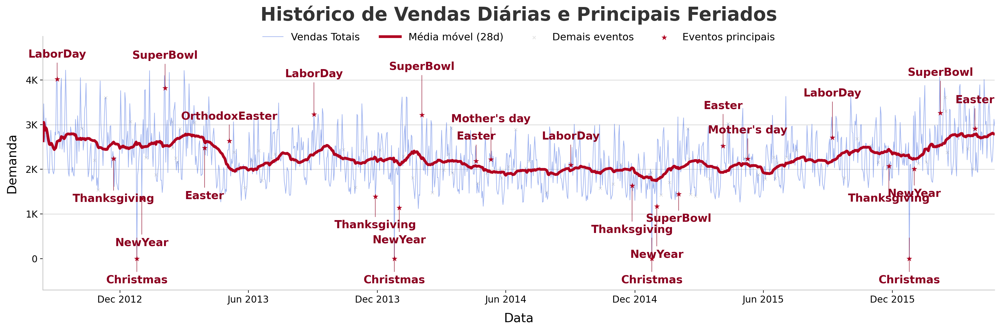

In [125]:
import re
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

# =========================
# 1) Série total + MM(28)
# =========================
N_DIAS = 1350
d_cols = [c for c in vendas.columns if c.startswith("d_")][-N_DIAS:]

total_series = vendas[d_cols].tail(N_DIAS).sum(axis=0)

cal_map = calendario.set_index("d", drop=False)
datas = pd.to_datetime(cal_map.loc[d_cols, "date"]).dt.tz_localize(None)

serie_total = pd.Series(total_series.values, index=datas).sort_index()
mm28 = serie_total.rolling(28, min_periods=1).mean()

x0, x1 = serie_total.index.min(), serie_total.index.max()

# =========================
# 2) Eventos
# =========================
evt_all = calendario.loc[calendario["event_name_1"].notna(), ["date", "event_name_1"]].copy()
evt_all["date"] = pd.to_datetime(evt_all["date"]).dt.tz_localize(None)
evt_all = evt_all[(evt_all["date"] >= x0) & (evt_all["date"] <= x1)].copy()

maiores = r"Christmas|Thanksgiving|Easter|SuperBowl|Valentines|LaborDay|NewYear|Mother|Memorial"
evt_big = evt_all[evt_all["event_name_1"].str.contains(maiores, flags=re.I, regex=True, na=False)].copy()

evt_big["ym"] = evt_big["date"].dt.to_period("M")
evt_big = evt_big.sort_values("date").groupby("ym", as_index=False).first()
evt_big = evt_big.sort_values("date").reset_index(drop=True)

# =========================
# 3) Y dos marcadores
# =========================
y_all = serie_total.reindex(evt_all["date"]).astype(float).values
y_big = serie_total.reindex(evt_big["date"]).astype(float).values

mask_all = np.isfinite(y_all)
evt_all_plot = evt_all.loc[mask_all].copy()
y_all_plot = y_all[mask_all]

mask_big = np.isfinite(y_big)
evt_big_plot = evt_big.loc[mask_big].copy()
y_big_plot = y_big[mask_big]

mm_big = mm28.reindex(evt_big_plot["date"]).astype(float).values
mm_big = np.where(np.isfinite(mm_big), mm_big, y_big_plot)

# =========================
# 4) Plot (Fundo do eixo 'white')
# =========================
plt.style.use("default")

fig, ax = plt.subplots(figsize=(18, 6), dpi=200)
fig.patch.set_facecolor("white")
ax.set_facecolor("white") # AGORA É BRANCO

ax.plot(serie_total.index, serie_total.values,
        color="royalblue", linewidth=0.8, alpha=0.5,
        label="Vendas Totais", zorder=2)

ax.plot(mm28.index, mm28.values,
        color="#B00020", linewidth=3.5, alpha=1.0,
        label="Média móvel (28d)", zorder=3)

ax.scatter(evt_all_plot["date"], y_all_plot,
            marker="x", s=15, linewidths=1.0,
            color="gray", alpha=0.20,
            label="Demais eventos", zorder=4)

ax.scatter(evt_big_plot["date"], y_big_plot,
            marker="*", s=60, linewidths=0.0,
            color="#B00020", alpha=1.0,
            label="Eventos principais", zorder=5)

# =========================
# 5) Rótulos: Degraus MAIORES e LÓGICA DE MÍNIMO Y
# =========================

dy_up   = np.array([25, 45, 30, 50, 35, 55])
dy_down = -np.array([25, 45, 30, 50, 35, 55])
dx = np.array([0, 0, 0, 0, 0, 0])

Y_MIN_LABEL_ANCHOR = 150
DY_MIN_PIXELS = -np.max(np.abs(dy_down))

for i, (d, name, yv, mv) in enumerate(zip(evt_big_plot["date"], evt_big_plot["event_name_1"], y_big_plot, mm_big)):

    degrau_idx = i % len(dy_up)
    place_up = (yv >= mv)

    if place_up:
        dy = dy_up[degrau_idx]
        va = "bottom"
        yanchor = yv
    else:
        dy = dy_down[degrau_idx]
        va = "top"

        if name.startswith('Christ'):
             yanchor = 500
             dy = DY_MIN_PIXELS * 0.9
             va = "top"
        else:
            yanchor = yv

    ax.annotate(
        str(name),
        xy=(d, yanchor),
        xytext=(dx[degrau_idx], dy),
        textcoords="offset points",
        ha="center", va=va,
        fontsize=14, fontweight="bold", color="#8B0020",
        arrowprops=dict(arrowstyle="-", color="#8B0020", lw=0.7, alpha=0.8, connectionstyle="arc3,rad=0.0"),
        zorder=6
    )

# =========================
# 6) Layout / Eixos / Grid
# =========================
ax.set_title("Histórico de Vendas Diárias e Principais Feriados",
             fontsize=24, fontweight="bold", pad=20, color="#333333")
ax.set_xlabel("Data", fontsize=16, labelpad=10)
ax.set_ylabel("Demanda", fontsize=16, labelpad=10)

# Limites do Eixo Y para acomodar rótulos
y_max = serie_total.max()
y_lim_top = y_max * 1.18
Y_LIM_BOTTOM = -700

ax.set_xlim([x0, x1])
ax.set_ylim(bottom=Y_LIM_BOTTOM, top=y_lim_top)


# Grade e Eixo X (em y=0)
ax.grid(True, axis="y", which="major", color="#DDDDDD", linewidth=1.0, alpha=1.0)
ax.axhline(0, color='white', linewidth=1.5, zorder=1)
ax.set_axisbelow(True)
ax.tick_params(axis='both', which='major', labelsize=12)


# Formatação dos Ticks do Eixo Y
def millions_formatter(x, pos):
    if x >= 1000:
        return f'{int(x/1000)}K'
    elif x >= 0:
        return f'{int(x)}'
    else:
        return ""

ax.yaxis.set_major_formatter(plt.FuncFormatter(millions_formatter))


# Formato das datas
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=6))
ax.xaxis.set_major_formatter(mdates.DateFormatter("%b %Y"))
plt.setp(ax.get_xticklabels(), rotation=0, ha="center")

# Remover bordas desnecessárias
for spine in ["top", "right"]:
    ax.spines[spine].set_visible(False)
for spine in ["left", "bottom"]:
    ax.spines[spine].set_color("#BBBBBB")


ax.legend(loc="upper center", bbox_to_anchor=(0.5, 1.05),
          ncol=4, frameon=False, fontsize=13)

plt.tight_layout()
plt.savefig("grafico_vendas_eventos_tcc_fundo_branco.png", dpi=300, bbox_inches="tight")
plt.show()

##3. EDA Do estado da California

In [126]:
df_ca = vendas.copy()
df_ca = df_ca[df_ca['state_id'] == 'CA']
df_ca = df_ca[df_ca['store_id'] == 'CA_1']
df_ca.head()


,id,item_id,dept_id,cat_id,store_id,state_id,d_1,d_2,d_3,d_4,d_5,d_6,d_7,d_8,d_9,d_10,d_11,d_12,d_13,d_14,d_15,d_16,d_17,d_18,d_19,...,d_1890,d_1891,d_1892,d_1893,d_1894,d_1895,d_1896,d_1897,d_1898,d_1899,d_1900,d_1901,d_1902,d_1903,d_1904,d_1905,d_1906,d_1907,d_1908,d_1909,d_1910,d_1911,d_1912,d_1913,total_sales
0,HOBBIES_1_001_CA_1_validation,HOBBIES_1_001,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,4,2,3,0,1,2,0,0,0,1,1,3,0,1,1,1,3,0,1,1,600
1,HOBBIES_1_002_CA_1_validation,HOBBIES_1_002,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,493
2,HOBBIES_1_003_CA_1_validation,HOBBIES_1_003,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,1,0,0,0,0,0,1,2,2,1,2,1,1,1,0,1,1,1,288
3,HOBBIES_1_004_CA_1_validation,HOBBIES_1_004,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,3,1,2,1,3,1,0,2,5,4,2,0,3,0,1,0,5,4,1,0,1,3,7,2,3288
4,HOBBIES_1_005_CA_1_validation,HOBBIES_1_005,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,1,4,0,1,0,1,0,1,1,2,0,1,1,2,1,1,0,1,1,2,2,2,4,1849


In [127]:

# --- série total e média móvel ---
d_cols = [c for c in vendas.columns if c.startswith('d_')]
total_series = df_ca[d_cols].sum()

datas = pd.to_datetime(calendario.loc[calendario['d'].isin(d_cols), 'date'])
serie_total = pd.Series(total_series.values, index=datas).sort_index()
mm28 = serie_total.rolling(28, min_periods=1).mean()

# --- eventos ---
evt = calendario.loc[calendario['event_name_1'].notna(), ['date', 'event_name_1']].copy()
evt['date'] = pd.to_datetime(evt['date'])
evt_all = evt.copy()

maiores = r"Christmas|Thanksgiving|Easter|SuperBowl|Valentines|Memorial|Independence|LaborDay|NewYear|Mother|Father"
evt_big = evt_all[evt_all['event_name_1'].str.contains(maiores, flags=re.I, regex=True, na=False)].copy()
evt_big['ym'] = evt_big['date'].dt.to_period('M')
evt_big = evt_big.sort_values('date').groupby('ym', as_index=False).first()

y_all = serie_total.reindex(evt_all['date']).values * 1.02
y_big = serie_total.reindex(evt_big['date']).values * 1.05

# --- gráfico ---
fig = go.Figure()

# linha principal
fig.add_trace(go.Scattergl(
    x=serie_total.index, y=serie_total.values,
    mode='lines', name='Vendas Totais',
    line=dict(width=1.25, color='royalblue')
))

# média móvel
fig.add_trace(go.Scattergl(
    x=mm28.index, y=mm28.values,
    mode='lines', name='Média móvel (28d)',
    line=dict(width=4, color='crimson')
))

# eventos discretos
fig.add_trace(go.Scatter(
    x=evt_all['date'], y=y_all,
    mode='markers',
    marker=dict(symbol='x', size=8, color='gray'),
    name='Demais eventos',
    hovertext=evt_all['event_name_1'],
    hoverinfo='text',
    opacity=0.6
))

# feriados principais com rótulo
fig.add_trace(go.Scatter(
    x=evt_big['date'], y=y_big,
    mode='markers+text',
    marker=dict(symbol='x', size=10, color='firebrick'),
    text=evt_big['event_name_1'],
    textposition='top center',
    textfont=dict(size=18, color='firebrick', family='Arial Black'),
    name='Eventos principais',
    hovertext=evt_big['event_name_1'],
    hoverinfo='text'
))

# --- layout ---
fig.update_layout(
    title=dict(
        text="<b>Histórico de Vendas Loja CA_1 e Principais Feriados e Eventos</b>",
        x=0.5,
        font=dict(size=30, family='Arial Black', color='black')
    ),
    xaxis=dict(
        title="Data",
        titlefont=dict(size=22, family='Arial', color='black'),
        tickfont=dict(size=16),
        showgrid=True,
        gridcolor='lightgray'
    ),
    yaxis=dict(
        title="Demanda",
        titlefont=dict(size=22, family='Arial', color='black'),
        tickfont=dict(size=18),
        showgrid=True,
        gridcolor='lightgray'
    ),
    legend=dict(
        font=dict(size=18),
        orientation='h',
        yanchor='bottom', y=1.02,
        xanchor='center', x=0.5
    ),
    plot_bgcolor='white',
    height=900,
    hovermode="x unified"
)

fig.show()


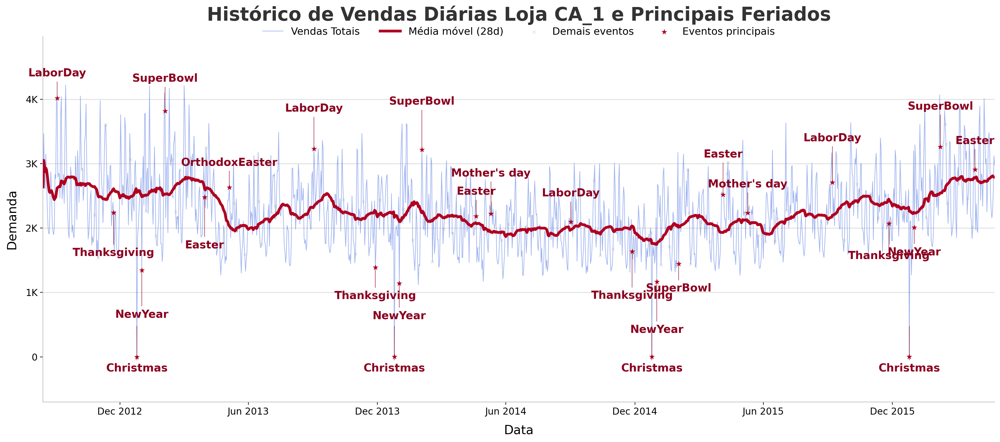

In [143]:
import re
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

# =========================
# 1) Série total + MM(28)
# =========================
N_DIAS = 1350
d_cols = [c for c in vendas.columns if c.startswith("d_")][-N_DIAS:]

total_series = vendas[d_cols].tail(N_DIAS).sum(axis=0)

cal_map = calendario.set_index("d", drop=False)
datas = pd.to_datetime(cal_map.loc[d_cols, "date"]).dt.tz_localize(None)

serie_total = pd.Series(total_series.values, index=datas).sort_index()
mm28 = serie_total.rolling(28, min_periods=1).mean()

x0, x1 = serie_total.index.min(), serie_total.index.max()

# =========================
# 2) Eventos
# =========================
evt_all = calendario.loc[calendario["event_name_1"].notna(), ["date", "event_name_1"]].copy()
evt_all["date"] = pd.to_datetime(evt_all["date"]).dt.tz_localize(None)
evt_all = evt_all[(evt_all["date"] >= x0) & (evt_all["date"] <= x1)].copy()

maiores = r"Christmas|Thanksgiving|Easter|SuperBowl|Valentines|LaborDay|NewYear|Mother|Memorial"
evt_big = evt_all[evt_all["event_name_1"].str.contains(maiores, flags=re.I, regex=True, na=False)].copy()

evt_big["ym"] = evt_big["date"].dt.to_period("M")
evt_big = evt_big.sort_values("date").groupby("ym", as_index=False).first()
evt_big = evt_big.sort_values("date").reset_index(drop=True)

# =========================
# 3) Y dos marcadores
# =========================
y_all = serie_total.reindex(evt_all["date"]).astype(float).values
y_big = serie_total.reindex(evt_big["date"]).astype(float).values

mask_all = np.isfinite(y_all)
evt_all_plot = evt_all.loc[mask_all].copy()
y_all_plot = y_all[mask_all]

mask_big = np.isfinite(y_big)
evt_big_plot = evt_big.loc[mask_big].copy()
y_big_plot = y_big[mask_big]

mm_big = mm28.reindex(evt_big_plot["date"]).astype(float).values
mm_big = np.where(np.isfinite(mm_big), mm_big, y_big_plot)

# =========================
# 4) Plot (Fundo do eixo 'white')
# =========================
plt.style.use("default")

fig, ax = plt.subplots(figsize=(18, 8), dpi=200)
fig.patch.set_facecolor("white")
ax.set_facecolor("white") # AGORA É BRANCO

ax.plot(serie_total.index, serie_total.values,
        color="royalblue", linewidth=0.8, alpha=0.5,
        label="Vendas Totais", zorder=2)

ax.plot(mm28.index, mm28.values,
        color="#B00020", linewidth=3.5, alpha=1.0,
        label="Média móvel (28d)", zorder=3)

ax.scatter(evt_all_plot["date"], y_all_plot,
            marker="x", s=15, linewidths=1.0,
            color="gray", alpha=0.20,
            label="Demais eventos", zorder=4)

ax.scatter(evt_big_plot["date"], y_big_plot,
            marker="*", s=60, linewidths=0.0,
            color="#B00020", alpha=1.0,
            label="Eventos principais", zorder=5)

# =========================
# 5) Rótulos: Degraus MAIORES e LÓGICA DE MÍNIMO Y
# =========================

dy_up   = np.array([25, 45, 30, 50, 35, 55])
dy_down = -np.array([25, 45, 30, 50, 35, 55])
dx = np.array([0, 0, 0, 0, 0, 0])

Y_MIN_LABEL_ANCHOR = 150
DY_MIN_PIXELS = -np.max(np.abs(dy_down))

for i, (d, name, yv, mv) in enumerate(zip(evt_big_plot["date"], evt_big_plot["event_name_1"], y_big_plot, mm_big)):

    degrau_idx = i % len(dy_up)
    place_up = (yv >= mv)

    if place_up:
        dy = dy_up[degrau_idx]
        va = "bottom"
        yanchor = yv
    else:
        dy = dy_down[degrau_idx]
        va = "top"

        if name.startswith('Christ'):
             yanchor = 500
             dy = DY_MIN_PIXELS * 0.9
             va = "top"
        else:
            yanchor = yv

    ax.annotate(
        str(name),
        xy=(d, yanchor),
        xytext=(dx[degrau_idx], dy),
        textcoords="offset points",
        ha="center", va=va,
        fontsize=14, fontweight="bold", color="#8B0020",
        arrowprops=dict(arrowstyle="-", color="#8B0020", lw=0.7, alpha=0.8, connectionstyle="arc3,rad=0.0"),
        zorder=6
    )

# =========================
# 6) Layout / Eixos / Grid
# =========================
ax.set_title("Histórico de Vendas Diárias Loja CA_1 e Principais Feriados",
             fontsize=24, fontweight="bold", pad=20, color="#333333")
ax.set_xlabel("Data", fontsize=16, labelpad=10)
ax.set_ylabel("Demanda", fontsize=16, labelpad=10)

# Limites do Eixo Y para acomodar rótulos
y_max = serie_total.max()
y_lim_top = y_max * 1.18
Y_LIM_BOTTOM = -700

ax.set_xlim([x0, x1])
ax.set_ylim(bottom=Y_LIM_BOTTOM, top=y_lim_top)


# Grade e Eixo X (em y=0)
ax.grid(True, axis="y", which="major", color="#DDDDDD", linewidth=1.0, alpha=1.0)
ax.axhline(0, color='white', linewidth=1.5, zorder=1)
ax.set_axisbelow(True)
ax.tick_params(axis='both', which='major', labelsize=12)


# Formatação dos Ticks do Eixo Y
def millions_formatter(x, pos):
    if x >= 1000:
        return f'{int(x/1000)}K'
    elif x >= 0:
        return f'{int(x)}'
    else:
        return ""

ax.yaxis.set_major_formatter(plt.FuncFormatter(millions_formatter))


# Formato das datas
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=6))
ax.xaxis.set_major_formatter(mdates.DateFormatter("%b %Y"))
plt.setp(ax.get_xticklabels(), rotation=0, ha="center")

# Remover bordas desnecessárias
for spine in ["top", "right"]:
    ax.spines[spine].set_visible(False)
for spine in ["left", "bottom"]:
    ax.spines[spine].set_color("#BBBBBB")


ax.legend(loc="upper center", bbox_to_anchor=(0.5, 1.05),
          ncol=4, frameon=False, fontsize=13)

plt.tight_layout()
plt.savefig("grafico_vendas_eventos_tcc_fundo_branco.png", dpi=300, bbox_inches="tight")
plt.show()

In [128]:
# departamento por state CA

# Colunas de demanda
d_cols = [c for c in df_ca.columns if c.startswith('d_')]

# Agrupa por estado e soma as demandas diárias
aux = df_ca.groupby('cat_id')[d_cols].sum()

# Lista de estados
ids = aux.index.tolist()

n = len(ids)

# Cria subplots
fig = make_subplots(rows=n, cols=1,
                    subplot_titles=[f"Depart: {depart}" for depart in ids])

# Adiciona os gráficos
cores = ['mediumseagreen', 'royalblue', 'darkorange', 'firebrick', 'goldenrod', 'slateblue']
for i, depart in enumerate(ids):
    x = np.arange(len(d_cols))
    y = aux.loc[depart].values
    fig.add_trace(go.Scatter(x=x, y=y, showlegend=False,
                             mode='lines', marker=dict(color=cores[i % len(cores)])),
                  row=i+1, col=1)

# Layout final
fig.update_layout(height=300 * n, title_text="Vendas por DEPARTAMENTO EM em CA ao longo do tempo")
fig.show()


In [129]:
df_ca = pd.melt(df_ca, id_vars=['id', 'item_id', 'dept_id', 'cat_id', 'store_id',
                                     'state_id'], var_name='day', value_name='demand')
df_ca = df_ca[df_ca['day'] != 'total_sales']
df_ca


,id,item_id,dept_id,cat_id,store_id,state_id,day,demand
0,HOBBIES_1_001_CA_1_validation,HOBBIES_1_001,HOBBIES_1,HOBBIES,CA_1,CA,d_1,0
1,HOBBIES_1_002_CA_1_validation,HOBBIES_1_002,HOBBIES_1,HOBBIES,CA_1,CA,d_1,0
2,HOBBIES_1_003_CA_1_validation,HOBBIES_1_003,HOBBIES_1,HOBBIES,CA_1,CA,d_1,0
3,HOBBIES_1_004_CA_1_validation,HOBBIES_1_004,HOBBIES_1,HOBBIES,CA_1,CA,d_1,0
4,HOBBIES_1_005_CA_1_validation,HOBBIES_1_005,HOBBIES_1,HOBBIES,CA_1,CA,d_1,0
...,...,...,...,...,...,...,...,...
5832732,FOODS_3_823_CA_1_validation,FOODS_3_823,FOODS_3,FOODS,CA_1,CA,d_1913,1
5832733,FOODS_3_824_CA_1_validation,FOODS_3_824,FOODS_3,FOODS,CA_1,CA,d_1913,0
5832734,FOODS_3_825_CA_1_validation,FOODS_3_825,FOODS_3,FOODS,CA_1,CA,d_1913,2
5832735,FOODS_3_826_CA_1_validation,FOODS_3_826,FOODS_3,FOODS,CA_1,CA,d_1913,0


In [130]:
# inserir infos de calendario
df_ca = pd.merge(df_ca, calendario, left_on="day", right_on="d", how="left")
df_ca


,id,item_id,dept_id,cat_id,store_id,state_id,day,demand,date,wm_yr_wk,weekday,wday,month,year,d,event_name_1,event_type_1,event_name_2,event_type_2,snap_CA,snap_TX,snap_WI
0,HOBBIES_1_001_CA_1_validation,HOBBIES_1_001,HOBBIES_1,HOBBIES,CA_1,CA,d_1,0,2011-01-29,11101,Saturday,1,1,2011,d_1,NaN,NaN,NaN,NaN,0,0,0
1,HOBBIES_1_002_CA_1_validation,HOBBIES_1_002,HOBBIES_1,HOBBIES,CA_1,CA,d_1,0,2011-01-29,11101,Saturday,1,1,2011,d_1,NaN,NaN,NaN,NaN,0,0,0
2,HOBBIES_1_003_CA_1_validation,HOBBIES_1_003,HOBBIES_1,HOBBIES,CA_1,CA,d_1,0,2011-01-29,11101,Saturday,1,1,2011,d_1,NaN,NaN,NaN,NaN,0,0,0
3,HOBBIES_1_004_CA_1_validation,HOBBIES_1_004,HOBBIES_1,HOBBIES,CA_1,CA,d_1,0,2011-01-29,11101,Saturday,1,1,2011,d_1,NaN,NaN,NaN,NaN,0,0,0
4,HOBBIES_1_005_CA_1_validation,HOBBIES_1_005,HOBBIES_1,HOBBIES,CA_1,CA,d_1,0,2011-01-29,11101,Saturday,1,1,2011,d_1,NaN,NaN,NaN,NaN,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5832732,FOODS_3_823_CA_1_validation,FOODS_3_823,FOODS_3,FOODS,CA_1,CA,d_1913,1,2016-04-24,11613,Sunday,2,4,2016,d_1913,NaN,NaN,NaN,NaN,0,0,0
5832733,FOODS_3_824_CA_1_validation,FOODS_3_824,FOODS_3,FOODS,CA_1,CA,d_1913,0,2016-04-24,11613,Sunday,2,4,2016,d_1913,NaN,NaN,NaN,NaN,0,0,0
5832734,FOODS_3_825_CA_1_validation,FOODS_3_825,FOODS_3,FOODS,CA_1,CA,d_1913,2,2016-04-24,11613,Sunday,2,4,2016,d_1913,NaN,NaN,NaN,NaN,0,0,0
5832735,FOODS_3_826_CA_1_validation,FOODS_3_826,FOODS_3,FOODS,CA_1,CA,d_1913,0,2016-04-24,11613,Sunday,2,4,2016,d_1913,NaN,NaN,NaN,NaN,0,0,0


In [131]:

df_train = pd.merge(df_ca, precos, left_on=["store_id", "item_id", "wm_yr_wk"],
                    right_on=["store_id", "item_id", "wm_yr_wk"], how="left")

df_train["day_int"] = df_train.day.apply(lambda x: int(x.split("_")[-1]))
df_train["demand"] = df_train["demand"].fillna(0)
df_train

,id,item_id,dept_id,cat_id,store_id,state_id,day,demand,date,wm_yr_wk,weekday,wday,month,year,d,event_name_1,event_type_1,event_name_2,event_type_2,snap_CA,snap_TX,snap_WI,sell_price,day_int
0,HOBBIES_1_001_CA_1_validation,HOBBIES_1_001,HOBBIES_1,HOBBIES,CA_1,CA,d_1,0,2011-01-29,11101,Saturday,1,1,2011,d_1,NaN,NaN,NaN,NaN,0,0,0,NaN,1
1,HOBBIES_1_002_CA_1_validation,HOBBIES_1_002,HOBBIES_1,HOBBIES,CA_1,CA,d_1,0,2011-01-29,11101,Saturday,1,1,2011,d_1,NaN,NaN,NaN,NaN,0,0,0,NaN,1
2,HOBBIES_1_003_CA_1_validation,HOBBIES_1_003,HOBBIES_1,HOBBIES,CA_1,CA,d_1,0,2011-01-29,11101,Saturday,1,1,2011,d_1,NaN,NaN,NaN,NaN,0,0,0,NaN,1
3,HOBBIES_1_004_CA_1_validation,HOBBIES_1_004,HOBBIES_1,HOBBIES,CA_1,CA,d_1,0,2011-01-29,11101,Saturday,1,1,2011,d_1,NaN,NaN,NaN,NaN,0,0,0,NaN,1
4,HOBBIES_1_005_CA_1_validation,HOBBIES_1_005,HOBBIES_1,HOBBIES,CA_1,CA,d_1,0,2011-01-29,11101,Saturday,1,1,2011,d_1,NaN,NaN,NaN,NaN,0,0,0,NaN,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5832732,FOODS_3_823_CA_1_validation,FOODS_3_823,FOODS_3,FOODS,CA_1,CA,d_1913,1,2016-04-24,11613,Sunday,2,4,2016,d_1913,NaN,NaN,NaN,NaN,0,0,0,2.98,1913
5832733,FOODS_3_824_CA_1_validation,FOODS_3_824,FOODS_3,FOODS,CA_1,CA,d_1913,0,2016-04-24,11613,Sunday,2,4,2016,d_1913,NaN,NaN,NaN,NaN,0,0,0,2.48,1913
5832734,FOODS_3_825_CA_1_validation,FOODS_3_825,FOODS_3,FOODS,CA_1,CA,d_1913,2,2016-04-24,11613,Sunday,2,4,2016,d_1913,NaN,NaN,NaN,NaN,0,0,0,3.98,1913
5832735,FOODS_3_826_CA_1_validation,FOODS_3_826,FOODS_3,FOODS,CA_1,CA,d_1913,0,2016-04-24,11613,Sunday,2,4,2016,d_1913,NaN,NaN,NaN,NaN,0,0,0,1.28,1913


In [132]:
day_sum = df_train.groupby("day_int")[["sell_price", "demand"]].agg("sum").reset_index()

In [133]:
# Plot vendas e preços
fig = make_subplots(rows=2, cols=1)

fig.add_trace(go.Scatter(x=day_sum.day_int,
                         y=day_sum.demand,
                         mode="lines",
                         name="demand",
                         ),

              row=1,col=1
              )

fig.add_trace(go.Scatter(x=day_sum.day_int,
                         y=day_sum.sell_price,
                         mode="lines",
                         name="sell_price"
                         ),

              row=2,col=1
              )

fig.update_layout(height=1000, title_text="SUM -> Demand  and Sell_price")
fig.show()

In [134]:
# identificar nulos
day_sum = df_train.groupby("day_int")[["demand","event_name_1" ]].agg({"demand": np.count_nonzero, "event_name_1": "first"}).reset_index()
def count_nulls(series):
    return len(series) - series.count()

cout_null = df_train.groupby("day_int")["sell_price"].agg(count_nulls).reset_index()

In [135]:


fig = make_subplots(rows=2, cols=1)

# Painel 1: quantidade de produtos sem preço por dia
fig.add_trace(go.Scatter(
    x=cout_null.day_int,
    y=cout_null.sell_price,
    mode="lines",
    name="sell_price"
), row=1, col=1)

# Painel 2: quantidade de produtos vendidos por dia
fig.add_trace(go.Scatter(
    x=day_sum.day_int,
    y=day_sum.demand,
    mode="lines",
    name="demand"
), row=2, col=1)

# Adiciona anotações com eventos no gráfico de demanda
for i, row in day_sum.iterrows():
    if pd.notnull(row['event_name_1']):
        fig.add_annotation(
            x=row['day_int'],
            y=row['demand'],
            text=row['event_name_1'],
            showarrow=True,
            arrowhead=1,
            font=dict(size=10),
            row=2, col=1
        )

# Layout final
fig.update_layout(height=1000, title_text="Nulos → vendas e preços")
fig.show()

Nos gráficos acima, eu queria observar as vendas e a contagem de valores não nulos de preços.
Consigo ver que a demanda varia e apresenta uma tendência de crescimento no tempo.
O gráfico de vendas ainda mostra sazonalidade.
O gráfico de preços mostra uma queda significativa


In [136]:
item_id = df_train.groupby("item_id")[["sell_price", "demand"]].agg({
    "sell_price": ["max", "mean", "min"],
    "demand" : ["max", "mean", "min"]
}).reset_index()
item_id

item_id sell_price                       demand              
                             max       mean        min    max      mean min
0         FOODS_1_001   2.240000   2.167109   2.000000     15  0.785677   0
1         FOODS_1_002   9.480000   8.920147   7.880000      8  0.477784   0
2         FOODS_1_003   3.230000   2.968735   2.880000      9  0.832201   0
3         FOODS_1_004   1.960000   1.847001   1.500000     71  8.257710   0
4         FOODS_1_005   3.540000   3.327914   2.940000     26  1.162572   0
...               ...        ...        ...        ...    ...       ...  ..
3044  HOUSEHOLD_2_512   3.970000   3.970000   3.970000     10  0.686357   0
3045  HOUSEHOLD_2_513   2.780000   2.780000   2.780000      9  0.499216   0
3046  HOUSEHOLD_2_514  19.540001  18.809299  17.940001      4  0.303189   0
3047  HOUSEHOLD_2_515   1.970000   1.970000   1.970000      3  0.060115   0
3048  HOUSEHOLD_2_516   5.940000   5.940000   5.940000      3  0.166231   0

[3049 rows x 7 columns]

In [137]:
fig = make_subplots(rows=1, cols=1)

item_id = item_id.sort_values(("sell_price", "max"))
fig.add_trace(go.Scatter(x=item_id["item_id"],
                         y=item_id["sell_price", "max"],
                         mode="lines",
                         name="max",
                         ),

              row=1,col=1
              )

fig.add_trace(go.Scatter(x=item_id["item_id"],
                         y=item_id["sell_price", "mean"],
                         mode="lines",
                         name="mean",
                         ),

              row=1,col=1
              )

fig.add_trace(go.Scatter(x=item_id["item_id"],
                         y=item_id["sell_price", "min"],
                         mode="lines",
                         name="min",
                         ),

              row=1,col=1
              )

fig.update_layout(height=500, title_text="Sell_price")
fig.show()

In [138]:
# Plot each item over the days for demand max, mean, and min.
fig = make_subplots(rows=1, cols=1)

item_id = item_id.sort_values(("demand", "max"))
fig.add_trace(go.Scatter(x=item_id["item_id"],
                         y=item_id["demand", "max"],
                         mode="lines",
                         name="max",
                         ),

              row=1,col=1
              )

fig.add_trace(go.Scatter(x=item_id["item_id"],
                         y=item_id["demand", "mean"],
                         mode="lines",
                         name="mean",
                         ),

              row=1,col=1
              )
fig.add_trace(go.Scatter(x=item_id["item_id"],
                         y=item_id["demand", "min"],
                         mode="lines",
                         name="min",
                         ),

              row=1,col=1
              )

fig.update_layout(height=500, title_text="vendas")
fig.show()

In [139]:
# Event days - retirar NA
events = df_train[~df_train.event_name_1.isna()]
events = events.groupby("event_name_1")[["demand", "sell_price"]].agg(["mean", "max"]).reset_index()
events.columns = ['_'.join(col).strip() for col in events.columns.values]

In [140]:
# Plot vendas por feriados
fig = go.Figure()

fig.add_trace(go.Scatter(x=events["event_name_1_"],
                         y=events["demand_mean"],
                         mode="lines",
                         name="week_day"
))

fig.update_layout(height=500, title_text="Vendas")
fig.show()

A loja CA_1 apresenta alta demanda durante o Dia do Trabalho (Labor Day), sendo o pico entre os dias com eventos.
Por outro lado, a demanda é baixa no Natal e no Dia de Ação de Graças, devido ao horário de funcionamento reduzido ou fechamento.
Essas informações são valiosas para o gerente, que pode planejar melhor o estoque e a equipe para datas como o Dia do Trabalho.


In [141]:
# Plot preço de venda nos eventos
fig = go.Figure()

fig.add_trace(go.Scatter(x=events["event_name_1_"],
                         y=events["sell_price_mean"],
                         mode="lines",
                         name="week_day"

))

fig.update_layout(height=500, title_text="Sell_price")
fig.show()

In [ ]:
# Vendas e preços médios para cada departamento.
dep = df_train.groupby(["day_int","dept_id"])[["demand", "sell_price"]].agg(["mean", "max"]).reset_index()
dep.columns = ['_'.join(col).strip() for col in dep.columns.values]


fig = make_subplots(rows=1, cols=1)

for each_dep in dep.dept_id_.unique():
    dep_df = dep[dep.dept_id_ == each_dep]
    fig.add_trace(go.Scatter(x=dep_df["day_int_"],
                             y=dep_df["demand_mean"],
                             mode="lines",
                             name=each_dep,
                             ),

                  row=1,col=1
                  )

fig.update_layout(title_text="demanda de cada departamento")
fig.show()

In [ ]:
# Foods 3 apresenta uma demanda muito maior que as demais. hobbies 2 e household 2 são as maiores

In [ ]:
# hobbies 1 apresentou uma alta consideravel dos preços

## 4. Modelagem

In [145]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

def avaliar_modelo(modelo_nm, y_pred, y_train, y_val, results, ultimos_pontos=150, tempo_s=None):
    """
    Gera dois gráficos Plotly:
      (A) Histórico: treino + validação + previsão (com IC robusto)
      (B) Validação 28 dias: Real vs Previsto (rótulos 1.234, caixas de métricas e legenda no topo)
    """
    # ===================== MÉTRICAS ======================
    rmsse_val = rmsse_robust(y_val, y_pred, y_train)
    results.append({
        'modelo': modelo_nm,
        'RMSE': rmse(y_val, y_pred),
        'MAE': mae(y_val, y_pred),
        'RMSSE': rmsse_val,
        'tempo_s': float(tempo_s) if tempo_s is not None else None
    })

    # ------------ Console resumido ------------
    print("\n" + "="*72)
    print("RESULTADOS ATUAIS")
    print("="*72)
    for r in results:
        rmse_str  = f"{r['RMSE']:.3f}"
        mae_str   = f"{r['MAE']:.3f}"
        rmsse_str = f"{r['RMSSE']:.3f}" if not np.isnan(r['RMSSE']) else "NaN"
        tempo_str = f"{r.get('tempo_s', 0.0):.4f}s" if r.get('tempo_s') is not None else "-"
        print(f"Modelo: {r['modelo']:40} | RMSE: {rmse_str:8} | MAE: {mae_str:8} | "
              f"RMSSE: {rmsse_str:8} | Tempo: {tempo_str:>10}")
    print("="*72 + "\n")

    # ================== PREPARO DOS DADOS (Histórico) =================
    y_tr_vals = np.asarray(y_train.values, dtype=float)
    y_va_vals = np.asarray(y_val.values,   dtype=float)

    total_len = len(y_tr_vals) + len(y_va_vals)
    start_idx = max(0, total_len - ultimos_pontos)

    x_all = np.arange(total_len, dtype=float)
    y_all = np.concatenate([y_tr_vals, y_va_vals])

    # Garantir alinhamento de índices
    y_pred_al = y_pred.reindex(y_val.index)
    y_pred_vals = np.asarray(y_pred_al.values, dtype=float)

    # Série de previsão "full": NaN no treino + previsões na validação
    y_pred_full = np.concatenate([np.full(len(y_tr_vals), np.nan), y_pred_vals])

    x_plot      = x_all[start_idx:]
    y_plot      = y_all[start_idx:]
    y_pred_plot = y_pred_full[start_idx:]

    # ============== IC ROBUSTO (para o 1º gráfico) =================
    # Ordem de preferência:
    # 1) globais _y_pred_lower/_y_pred_upper (Series alinhadas a y_val)
    # 2) global _pred_se (erro padrão por passo): ±1.96 * se
    # 3) IC empírico com percentis dos resíduos (5% e 95%)
    # 4) fallback gaussiano com RMSE: ±1.96 * RMSE
    CLIP_NONNEG = True  # útil para demanda >= 0

    lower_plot = upper_plot = None
    try:
        # 1) Faixas vindas do modelo (melhor caso)
        _low = globals().get("_y_pred_lower", None)
        _up  = globals().get("_y_pred_upper",  None)
        if _low is not None and _up is not None:
            low_val = pd.Series(_low).reindex(y_val.index).astype(float).values
            up_val  = pd.Series(_up ).reindex(y_val.index).astype(float).values
        else:
            low_val = up_val = None

        # 2) Erro padrão por passo
        if low_val is None or up_val is None:
            _se = globals().get("_pred_se", None)
            if _se is not None:
                se_val = pd.Series(_se).reindex(y_val.index).astype(float).values
                low_val = y_pred_vals - 1.96 * se_val
                up_val  = y_pred_vals + 1.96 * se_val

        # 3) IC empírico pelos resíduos
        if low_val is None or up_val is None:
            resid = (y_val.values.astype(float) - y_pred_vals)
            resid = resid[~np.isnan(resid)]
            if resid.size >= 5:
                q05 = np.nanpercentile(resid, 5)
                q95 = np.nanpercentile(resid, 95)
                low_val = y_pred_vals + q05
                up_val  = y_pred_vals + q95

        # 4) Fallback gaussiano com RMSE
        if low_val is None or up_val is None:
            sigma = results[-1]['RMSE']
            low_val = y_pred_vals - 1.96 * sigma
            up_val  = y_pred_vals + 1.96 * sigma

        if CLIP_NONNEG:
            low_val = np.maximum(low_val, 0.0)

        # Concatena NaNs do treino para alinhar à janela plotada
        low_full  = np.concatenate([np.full(len(y_tr_vals), np.nan), low_val])
        up_full   = np.concatenate([np.full(len(y_tr_vals), np.nan), up_val])
        lower_plot = low_full[start_idx:]
        upper_plot = up_full[start_idx:]
    except Exception:
        lower_plot = upper_plot = None

    # ===================== (A) PLOTLY — HISTÓRICO =====================
    fig_hist = go.Figure()

    # Observado treino
    val_border = len(y_tr_vals) - 0.5
    mask_tr = x_plot < val_border
    fig_hist.add_trace(go.Scatter(
        x=x_plot[mask_tr], y=y_plot[mask_tr],
        mode='lines', name='Observado - Treino',
        line=dict(color='#0A84FF', width=2)
    ))

    # Observado validação
    mask_val = ~mask_tr
    if mask_val.any():
        fig_hist.add_trace(go.Scatter(
            x=x_plot[mask_val], y=y_plot[mask_val],
            mode='lines', name='Observado - Validação',
            line=dict(color='#6B7280', width=2, dash='dash')
        ))

    # Previsão
    fig_hist.add_trace(go.Scatter(
        x=x_plot, y=y_pred_plot,
        mode='lines+markers',
        name=f'{modelo_nm} - Previsão',
        line=dict(color='#ff7f0e', width=3),
        marker=dict(size=6)
    ))

    # IC 95%
    if (lower_plot is not None) and (upper_plot is not None):
        mask_pi = ~np.isnan(upper_plot) & ~np.isnan(lower_plot)
        fig_hist.add_trace(go.Scatter(
            x=x_plot[mask_pi], y=upper_plot[mask_pi],
            mode='lines', line=dict(width=0),
            showlegend=False, hoverinfo='skip'
        ))
        fig_hist.add_trace(go.Scatter(
            x=x_plot[mask_pi], y=lower_plot[mask_pi],
            mode='lines', line=dict(width=0),
            fill='tonexty', fillcolor='rgba(255,127,14,0.18)',
            name='IC 95%', hoverinfo='skip'
        ))

    # Faixa da validação
    if val_border >= x_plot.min():
        fig_hist.add_shape(type="rect", xref="x", yref="paper",
                           x0=val_border, x1=x_plot.max(), y0=0, y1=1,
                           fillcolor="rgba(0,0,0,0.03)", line=dict(width=0))
        fig_hist.add_shape(type="line", xref="x", yref="paper",
                           x0=val_border, x1=val_border, y0=0, y1=1,
                           line=dict(color="rgba(60,60,60,0.85)", width=2, dash="dot"))
        fig_hist.add_annotation(x=val_border, y=1.02, xref="x", yref="paper",
                                text="Início da validação", showarrow=False,
                                font=dict(size=18, color="#111827"), xanchor="left")

    fig_hist.update_traces(line=dict(shape='spline', smoothing=1.05))
    fig_hist.update_layout(
        title={'text': f"<b>MODELO {modelo_nm.upper()}</b>",
               'x': 0.5, 'xanchor': 'center',
               'font': {'size': 24, 'color': '#111827'}},
        xaxis=dict(title="<b>Índice temporal</b>",
                   titlefont=dict(size=18, color='#111827'),
                   tickfont=dict(size=18, color='#111827'),
                   showgrid=True, gridcolor="#eaeef6"),
        yaxis=dict(title="<b>Vendas</b>",
                   titlefont=dict(size=18, color='#111827'),
                   tickfont=dict(size=18, color='#111827'),
                   tickformat=",.0f",
                   showgrid=True, gridcolor="#eaeef6"),
        legend=dict(font=dict(size=15, color='#111827'),
                    yanchor="top", y=0.99, xanchor="left", x=0.01,
                    bgcolor='rgba(255,255,255,0.92)',
                    bordercolor='rgba(0,0,0,0.12)', borderwidth=1),
        hovermode='x unified',
        width=1800, height=700,
        template='plotly_white',
        plot_bgcolor="#FFFFFF", paper_bgcolor="#FFFFFF",
        margin=dict(l=80, r=40, t=80, b=70)
    )
    fig_hist.show()

    # ===================== (B) PLOTLY — VALIDAÇÃO 28 DIAS =====================
    try:
        y_val_al  = y_val.copy()
        y_pred_al = y_pred.reindex(y_val_al.index)

        df_val = pd.DataFrame({
            "Dia": np.arange(1, len(y_val_al) + 1, dtype=int),
            "Real": y_val_al.values.astype(float),
            "Previsto": y_pred_al.values.astype(float)
        })

        fig_val = go.Figure()

        # Fins de semana (6–7, 13–14, 20–21, 27–28)
        weekend_pairs = [(5.5, 7.5), (12.5, 14.5), (19.5, 21.5), (26.5, 28.5)]
        for x0, x1 in weekend_pairs:
            fig_val.add_shape(
                type="rect", xref="x", yref="paper",
                x0=x0, x1=x1, y0=0, y1=1,
                fillcolor="rgba(0,0,0,0.03)", line=dict(width=0), layer="below"
            )

        # Formatador
        def fmt_num(v):
            return f"{v:,.0f}".replace(",", ".")

        # Traços
        fig_val.add_trace(go.Scatter(
            x=df_val["Dia"], y=df_val["Real"],
            mode="lines+markers+text",
            name="Real",
            line=dict(color="#1f77b4", width=3),
            marker=dict(size=7),
            text=[fmt_num(v) for v in df_val["Real"]],
            textposition="top center",
            textfont=dict(size=16, color="#1f77b4")
        ))
        fig_val.add_trace(go.Scatter(
            x=df_val["Dia"], y=df_val["Previsto"],
            mode="lines+markers+text",
            name="Previsto",
            line=dict(color="#ff7f0e", width=3),
            marker=dict(size=7),
            text=[fmt_num(v) for v in df_val["Previsto"]],
            textposition="bottom center",
            textfont=dict(size=16, color="#ff7f0e")
        ))

        # ====================== Caixas de métricas (WFV com 2 caixas) ======================
        # Métricas dos últimos 28 (sempre disponíveis)
        last_rmse  = float(results[-1]['RMSE'])
        last_mae   = float(results[-1]['MAE'])
        last_rmsse = float(rmsse_val) if not np.isnan(rmsse_val) else np.nan
        last_tempo = float(tempo_s) if tempo_s is not None else None

        def _fmt_tempo(t): return f"{float(t):.4f}s" if (t is not None) else "-"

        # Caixa 1: Últimos 28 (à esquerda)
        metrics_text_last = (
            f"<b>MÉTRICAS — Últimos 28</b><br>"
            f"RMSE: {last_rmse:.3f}<br>"
            f"MAE: {last_mae:.3f}<br>"
            f"RMSSE: {last_rmsse:.3f}" if not np.isnan(last_rmsse) else
            f"<b>MÉTRICAS — Últimos 28</b><br>"
            f"RMSE: {last_rmse:.3f}<br>"
            f"MAE: {last_mae:.3f}<br>"
            f"RMSSE: NaN"
        )
        metrics_text_last += f"<br>Tempo: {_fmt_tempo(last_tempo)}"

        fig_val.add_annotation(
            xref="paper", yref="paper", x=0.01, y=0.98,
            xanchor="left", yanchor="top",
            text=metrics_text_last, showarrow=False, align="left",
            font=dict(size=14, color="#111827"),
            bgcolor="rgba(255,255,255,0.96)",
            bordercolor="rgba(0,0,0,0.18)", borderwidth=1, borderpad=8
        )

        # Caixa 2: Média dos folds (se for WFV e existir a linha "média folds")
        if "Walk-Forward" in str(modelo_nm):
            base_name = str(modelo_nm).split("•")[0].strip()
            # busca reversa (O(n)), eficiente para listas moderadas
            mean_rec = next(
                (r for r in reversed(results)
                 if isinstance(r.get("modelo", ""), str)
                 and r["modelo"].startswith(base_name)
                 and "média folds" in r["modelo"]),
                None
            )
            if mean_rec is not None:
                mean_rmse  = float(mean_rec.get("RMSE", np.nan))
                mean_mae   = float(mean_rec.get("MAE", np.nan))
                mean_rmsse = float(mean_rec.get("RMSSE", np.nan))
                mean_tempo = mean_rec.get("tempo_s", None)

                metrics_text_mean = (
                    f"<b>MÉTRICAS — Média dos folds</b><br>"
                    f"RMSE: {mean_rmse:.3f}<br>"
                    f"MAE: {mean_mae:.3f}<br>"
                    f"RMSSE: {mean_rmsse:.3f}<br>"
                    f"Tempo total: {_fmt_tempo(mean_tempo)}"
                )

                fig_val.add_annotation(
                    xref="paper", yref="paper", x=0.34, y=0.98,
                    xanchor="left", yanchor="top",
                    text=metrics_text_mean, showarrow=False, align="left",
                    font=dict(size=14, color="#111827"),
                    bgcolor="rgba(255,255,255,0.96)",
                    bordercolor="rgba(0,0,0,0.18)", borderwidth=1, borderpad=8
                )

        # Layout (legenda no topo)
        fig_val.update_layout(
            title={
                'text': f"{modelo_nm} | Validação 28 dias — Real vs Previsto",
                'x': 0.02, 'xanchor': 'left',
                'font': {'size': 22, 'color': '#111827'}
            },
            xaxis=dict(
                title="Dia da validação",
                range=[1, 28], dtick=1,
                showgrid=True, gridcolor="#eaeef6",
                tickfont=dict(size=13, color="#111827"),
                titlefont=dict(size=16, color="#111827")
            ),
            yaxis=dict(
                title="Vendas diárias",
                tickformat=",.0f",
                showgrid=True, gridcolor="#eaeef6",
                tickfont=dict(size=13, color="#111827"),
                titlefont=dict(size=16, color="#111827")
            ),
            legend=dict(
                orientation="h",
                yanchor="bottom", y=1.02,
                xanchor="left", x=0.01,
                title_text="",
                font=dict(size=14),
                bgcolor='rgba(255,255,255,0.95)',
                bordercolor='rgba(0,0,0,0.12)', borderwidth=1
            ),
            width=1700, height=400,
            template='plotly_white',
            margin=dict(l=60, r=40, t=110, b=60),
            plot_bgcolor="#FFFFFF", paper_bgcolor="#FFFFFF"
        )

        fig_val.show()

    except Exception as e:
        print("[Plotly] Falha ao renderizar gráfico de validação:", str(e))

    return results


In [146]:
results = []

In [147]:
serie_diaria = (df_train.groupby("date")["demand"]
                  .sum()
                  .asfreq("D"))
serie_diaria = serie_diaria.fillna(0)
serie_diaria


,demand
date,
2011-01-29,4337
2011-01-30,4155
2011-01-31,2816
2011-02-01,3051
2011-02-02,2630
...,...
2016-04-20,3722
2016-04-21,3709
2016-04-22,4387


In [148]:
# Divisão treino/val F1–F28 conforme competição (28 dias finais como validação)
h = 28
y = serie_diaria.copy()
y_train = y.iloc[:-h]
y_val   = y.iloc[-h:]

n_train = len(y_train)
X_train = np.arange(n_train).reshape(-1, 1)
X_val   = np.arange(n_train, n_train + h).reshape(-1, 1)

## 4.0 Modelo Regressão Linear Simples

In [149]:


modelo_nm = 'Regressão Linear Simples'

t0 = time.perf_counter()
rl = LinearRegression().fit(X_train, y_train.values.ravel())
yhat = pd.Series(rl.predict(X_val), index=y_val.index)
dt = time.perf_counter() - t0

results = avaliar_modelo(modelo_nm, yhat, y_train, y_val, results, tempo_s=dt)




RESULTADOS ATUAIS
Modelo: Regressão Linear Simples                 | RMSE: 974.276  | MAE: 876.524  | RMSSE: 1.125    | Tempo:    0.0367s



## 4.0 Modelo Regressão Linear Simples + Walk-Forward

In [150]:
# ==========================================================
# WALK-FORWARD • Regressão Linear Simples (sem exógenas)
#  - step_size = 90
#  - último fold = últimos 28 dias
# ==========================================================

# ----------------------------------------------------------
# 0) Preparação da série completa
# ----------------------------------------------------------
y_all = pd.concat([y_train, y_val]).asfreq("D").astype("float64")
y_all = y_all.squeeze()  # garante Series 1D

# cria results se não existir
if "results" not in globals():
    results = []

# ----------------------------------------------------------
# 1) Parâmetros do walk-forward
# ----------------------------------------------------------
h         = 28              # horizonte de validação por fold
min_train = 365 * 3         # mínimo de histórico para treinar
step_size = 90              # avança em blocos de 90 dias

# pontos finais de cada fold garantindo que o último termine na série
end_points = list(range(min_train + h, len(y_all) + 1, step_size))
if not end_points or end_points[-1] != len(y_all):
    end_points.append(len(y_all))

modelo_base = "Regressão Linear Simples"

# ----------------------------------------------------------
# 2) Função auxiliar: gera features de tendência
# ----------------------------------------------------------
def _trend_features(n_start: int, n_points: int) -> pd.DataFrame:
    t = np.arange(n_start, n_start + n_points, dtype="int64")
    return pd.DataFrame({"t": t})

# ----------------------------------------------------------
# 3) Loop de folds
# ----------------------------------------------------------
rmse_list, mae_list, rmsse_list = [], [], []
tempo_list = []
tempo_last_fold = None
y_train_last = y_val_last = y_pred_last = None

fold = 0
for end_val in end_points:
    end_train = end_val - h
    if end_train < min_train:
        continue

    y_tr = y_all.iloc[:end_train].copy()
    y_va = y_all.iloc[end_train:end_val].copy()

    fold += 1
    print(f"\n🔹 Fold {fold}: Treino {y_tr.index[0].date()} → {y_tr.index[-1].date()} | "
          f"Val {y_va.index[0].date()} → {y_va.index[-1].date()}")

    # ------------------ features: somente tendência ------------------
    X_tr = _trend_features(n_start=0, n_points=len(y_tr))
    X_va = _trend_features(n_start=len(y_tr), n_points=len(y_va))

    # ------------------ fit + forecast por fold ------------------
    t0 = time.perf_counter()
    rl = LinearRegression().fit(X_tr.values, y_tr.values.ravel())
    y_pr = pd.Series(rl.predict(X_va.values), index=y_va.index, name="forecast")
    dt_fold = time.perf_counter() - t0

    # ------------------ métricas por fold ------------------
    err = y_va.values - y_pr.values
    rmse_f  = float(np.sqrt(np.mean(err**2)))
    mae_f   = float(np.mean(np.abs(err)))
    rmsse_f = float(rmsse_robust(y_va, y_pr, y_tr))  # sua função

    rmse_list.append(rmse_f)
    mae_list.append(mae_f)
    rmsse_list.append(rmsse_f)
    tempo_list.append(dt_fold)
    tempo_last_fold = dt_fold

    print(f"  → {modelo_base} | RMSE={rmse_f:.3f} | MAE={mae_f:.3f} | RMSSE={rmsse_f:.3f} | Tempo={dt_fold:.3f}s")

    # guarda o último fold para a avaliação detalhada e gráficos
    y_train_last, y_val_last, y_pred_last = y_tr, y_va, y_pr

# ----------------------------------------------------------
# 4) Adiciona o resumo das médias dos folds ANTES da avaliação final
# ----------------------------------------------------------
if rmse_list:
    DEC_T = 4  # casas decimais padronizadas
    tempo_total_sum = float(np.sum(tempo_list))
    tempo_total = float(np.round(tempo_total_sum, DEC_T))

    results.append({
        "modelo": f"{modelo_base} • Walk-Forward (média folds)",
        "RMSE":   float(np.mean(rmse_list)),
        "MAE":    float(np.mean(mae_list)),
        "RMSSE":  float(np.mean(rmsse_list)),
        "tempo_s": tempo_total   # soma dos tempos com arredondamento uniforme
    })

# ----------------------------------------------------------
# 5) Avaliação do último fold (gráficos + registro em 'results')
# ----------------------------------------------------------
if y_pred_last is not None:
    modelo_nm = f"{modelo_base} • Walk-Forward (últimos {h})"
    ULT_HIST = max(3*h, 120)
    ultimos = min(ULT_HIST, len(y_train_last) + len(y_val_last))

    results = avaliar_modelo(
        modelo_nm,
        y_pred_last, y_train_last, y_val_last,
        results,
        ultimos_pontos=ultimos,
        tempo_s=tempo_last_fold
    )

# ----------------------------------------------------------
# 6) Impressão final de resumo no console
# ----------------------------------------------------------
if rmse_list:
    print("\n================== RESUMO WALK-FORWARD (Regressão Linear Simples) ==================")
    print(f"Total de folds: {len(rmse_list)}")
    print(f"Média RMSE : {np.mean(rmse_list):.3f} ± {np.std(rmse_list):.3f}")
    print(f"Média MAE  : {np.mean(mae_list):.3f} ± {np.std(mae_list):.3f}")
    print(f"Média RMSSE: {np.mean(rmsse_list):.3f} ± {np.std(rmsse_list):.3f}")
    print(f"Tempo total (somatório dos folds): {tempo_total:.{DEC_T}f}s")
    print("====================================================================================")
else:
    print("Sem folds válidos para resumir.")



🔹 Fold 1: Treino 2011-01-29 → 2014-01-27 | Val 2014-01-28 → 2014-02-24
  → Regressão Linear Simples | RMSE=1077.174 | MAE=936.576 | RMSSE=1.311 | Tempo=0.001s

🔹 Fold 2: Treino 2011-01-29 → 2014-04-27 | Val 2014-04-28 → 2014-05-25
  → Regressão Linear Simples | RMSE=848.757 | MAE=708.859 | RMSSE=1.024 | Tempo=0.001s

🔹 Fold 3: Treino 2011-01-29 → 2014-07-26 | Val 2014-07-27 → 2014-08-23
  → Regressão Linear Simples | RMSE=878.775 | MAE=741.535 | RMSSE=1.066 | Tempo=0.001s

🔹 Fold 4: Treino 2011-01-29 → 2014-10-24 | Val 2014-10-25 → 2014-11-21
  → Regressão Linear Simples | RMSE=1068.426 | MAE=972.124 | RMSSE=1.284 | Tempo=0.001s

🔹 Fold 5: Treino 2011-01-29 → 2015-01-22 | Val 2015-01-23 → 2015-02-19
  → Regressão Linear Simples | RMSE=1020.871 | MAE=910.202 | RMSSE=1.204 | Tempo=0.001s

🔹 Fold 6: Treino 2011-01-29 → 2015-04-22 | Val 2015-04-23 → 2015-05-20
  → Regressão Linear Simples | RMSE=902.358 | MAE=791.670 | RMSSE=1.059 | Tempo=0.001s

🔹 Fold 7: Treino 2011-01-29 → 2015-07-21 |


================== RESUMO WALK-FORWARD (Regressão Linear Simples) ==================
Total de folds: 10
Média RMSE : 962.587 ± 85.270
Média MAE  : 844.786 ± 102.495
Média RMSSE: 1.141 ± 0.104
Tempo total (somatório dos folds): 0.0079s


## 4.0.1 Modelo SNaive

In [151]:


modelo_nm = "SNaive Semanal (m=7)"

m = 7  # sazonalidade semanal
h = len(y_val)  # normalmente 28

t0 = time.perf_counter()

y_tr = y_train.asfreq("D").astype("float64").squeeze()
y_va = y_val.asfreq("D").astype("float64").squeeze()

if len(y_tr) < m:
    raise ValueError(f"Histórico insuficiente: precisa de pelo menos {m} observações no treino.")

# última semana do treino
last_season = y_tr.iloc[-m:].values

# repete até completar o horizonte
rep = int(np.ceil(h / m))
fc = np.tile(last_season, rep)[:h]

yhat = pd.Series(fc, index=y_va.index, name="forecast")

dt = time.perf_counter() - t0

results = avaliar_modelo(modelo_nm, yhat, y_tr, y_va, results, tempo_s=dt)



RESULTADOS ATUAIS
Modelo: Regressão Linear Simples                 | RMSE: 974.276  | MAE: 876.524  | RMSSE: 1.125    | Tempo:    0.0367s
Modelo: Regressão Linear Simples • Walk-Forward (média folds) | RMSE: 962.587  | MAE: 844.786  | RMSSE: 1.141    | Tempo:    0.0079s
Modelo: Regressão Linear Simples • Walk-Forward (últimos 28) | RMSE: 974.276  | MAE: 876.524  | RMSSE: 1.125    | Tempo:    0.0007s
Modelo: SNaive Semanal (m=7)                     | RMSE: 655.467  | MAE: 459.179  | RMSSE: 0.757    | Tempo:    0.0020s



## 4.0.1 Modelo Snaive + Walk-Forward

In [152]:


# ==========================================================
# WALK-FORWARD • SNaive Semanal (m=7)
#  - step_size = 90
#  - último fold = últimos 28 dias
# ==========================================================

# ----------------------------------------------------------
# 0) Série completa
# ----------------------------------------------------------
y_all = pd.concat([y_train, y_val]).asfreq("D").astype("float64").squeeze()

if "results" not in globals():
    results = []

# ----------------------------------------------------------
# 1) Parâmetros do walk-forward
# ----------------------------------------------------------
m         = 7               # sazonalidade semanal
h         = 28              # horizonte por fold
min_train = 365 * 3         # mínimo de histórico para treinar
step_size = 90              # avança em blocos de 90 dias

end_points = list(range(min_train + h, len(y_all) + 1, step_size))
if not end_points or end_points[-1] != len(y_all):
    end_points.append(len(y_all))

modelo_base = "SNaive Semanal (m=7)"

# ----------------------------------------------------------
# 2) Loop de folds
# ----------------------------------------------------------
rmse_list, mae_list, rmsse_list = [], [], []
tempo_list = []
tempo_last_fold = None
y_train_last = y_val_last = y_pred_last = None

fold = 0
for end_val in end_points:
    end_train = end_val - h
    if end_train < min_train:
        continue

    y_tr = y_all.iloc[:end_train].copy()
    y_va = y_all.iloc[end_train:end_val].copy()

    fold += 1
    print(f"\n🔹 Fold {fold}: Treino {y_tr.index[0].date()} → {y_tr.index[-1].date()} | "
          f"Val {y_va.index[0].date()} → {y_va.index[-1].date()}")

    if len(y_tr) < m:
        print(f"  [SKIP] histórico < {m}")
        continue

    # ------------------ forecast SNaive (multi-step sem vazamento) ------------------
    t0 = time.perf_counter()

    last_season = y_tr.iloc[-m:].values
    rep = int(np.ceil(h / m))
    fc = np.tile(last_season, rep)[:len(y_va)]

    y_pr = pd.Series(fc, index=y_va.index, name="forecast")

    dt_fold = time.perf_counter() - t0

    # ------------------ métricas por fold ------------------
    err = y_va.values - y_pr.values
    rmse_f  = float(np.sqrt(np.mean(err**2)))
    mae_f   = float(np.mean(np.abs(err)))
    rmsse_f = float(rmsse_robust(y_va, y_pr, y_tr))  # sua função

    rmse_list.append(rmse_f)
    mae_list.append(mae_f)
    rmsse_list.append(rmsse_f)
    tempo_list.append(dt_fold)
    tempo_last_fold = dt_fold

    print(f"  → {modelo_base} | RMSE={rmse_f:.3f} | MAE={mae_f:.3f} | RMSSE={rmsse_f:.3f} | Tempo={dt_fold:.3f}s")

    # guarda o último fold para avaliação detalhada e gráficos
    y_train_last, y_val_last, y_pred_last = y_tr, y_va, y_pr

# ----------------------------------------------------------
# 3) Resumo das médias dos folds
# ----------------------------------------------------------
if rmse_list:
    DEC_T = 4
    tempo_total_sum = float(np.sum(tempo_list))
    tempo_total = float(np.round(tempo_total_sum, DEC_T))

    results.append({
        "modelo": f"{modelo_base} • Walk-Forward (média folds)",
        "RMSE":   float(np.mean(rmse_list)),
        "MAE":    float(np.mean(mae_list)),
        "RMSSE":  float(np.mean(rmsse_list)),
        "tempo_s": tempo_total
    })

# ----------------------------------------------------------
# 4) Avaliação do último fold (gráficos + registro)
# ----------------------------------------------------------
if y_pred_last is not None:
    modelo_nm = f"{modelo_base} • Walk-Forward (últimos {h})"
    ULT_HIST = max(3*h, 120)
    ultimos = min(ULT_HIST, len(y_train_last) + len(y_val_last))

    results = avaliar_modelo(
        modelo_nm,
        y_pred_last, y_train_last, y_val_last,
        results,
        ultimos_pontos=ultimos,
        tempo_s=tempo_last_fold
    )

# ----------------------------------------------------------
# 5) Impressão final
# ----------------------------------------------------------
if rmse_list:
    print("\n================== RESUMO WALK-FORWARD (SNaive Semanal) ==================")
    print(f"Total de folds: {len(rmse_list)}")
    print(f"Média RMSE : {np.mean(rmse_list):.3f} ± {np.std(rmse_list):.3f}")
    print(f"Média MAE  : {np.mean(mae_list):.3f} ± {np.std(mae_list):.3f}")
    print(f"Média RMSSE: {np.mean(rmsse_list):.3f} ± {np.std(rmsse_list):.3f}")
    print(f"Tempo total (somatório dos folds): {tempo_total:.{DEC_T}f}s")
    print("============================================================================")
else:
    print("Sem folds válidos para resumir.")



🔹 Fold 1: Treino 2011-01-29 → 2014-01-27 | Val 2014-01-28 → 2014-02-24
  → SNaive Semanal (m=7) | RMSE=557.092 | MAE=418.786 | RMSSE=0.678 | Tempo=0.000s

🔹 Fold 2: Treino 2011-01-29 → 2014-04-27 | Val 2014-04-28 → 2014-05-25
  → SNaive Semanal (m=7) | RMSE=502.297 | MAE=395.714 | RMSSE=0.606 | Tempo=0.000s

🔹 Fold 3: Treino 2011-01-29 → 2014-07-26 | Val 2014-07-27 → 2014-08-23
  → SNaive Semanal (m=7) | RMSE=591.395 | MAE=462.036 | RMSSE=0.717 | Tempo=0.000s

🔹 Fold 4: Treino 2011-01-29 → 2014-10-24 | Val 2014-10-25 → 2014-11-21
  → SNaive Semanal (m=7) | RMSE=365.611 | MAE=284.429 | RMSSE=0.440 | Tempo=0.000s

🔹 Fold 5: Treino 2011-01-29 → 2015-01-22 | Val 2015-01-23 → 2015-02-19
  → SNaive Semanal (m=7) | RMSE=574.866 | MAE=473.643 | RMSSE=0.678 | Tempo=0.000s

🔹 Fold 6: Treino 2011-01-29 → 2015-04-22 | Val 2015-04-23 → 2015-05-20
  → SNaive Semanal (m=7) | RMSE=403.937 | MAE=314.071 | RMSSE=0.474 | Tempo=0.000s

🔹 Fold 7: Treino 2011-01-29 → 2015-07-21 | Val 2015-07-22 → 2015-08-1


================== RESUMO WALK-FORWARD (SNaive Semanal) ==================
Total de folds: 10
Média RMSE : 489.894 ± 96.776
Média MAE  : 384.029 ± 66.794
Média RMSSE: 0.581 ± 0.116
Tempo total (somatório dos folds): 0.0009s


## 4.1 Modelo SARIMA BASE




Executando decomposição STL (periodo=7)...


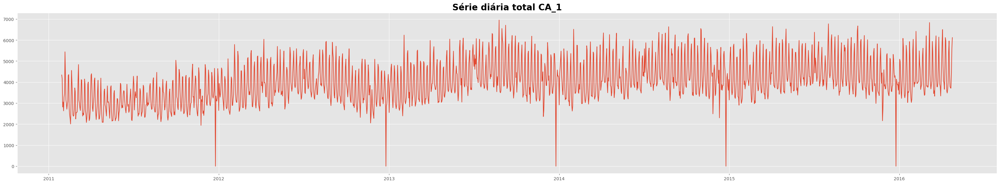

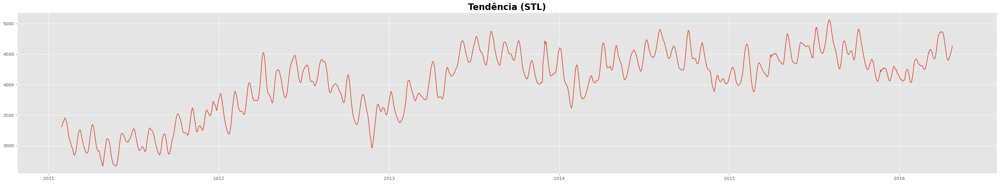

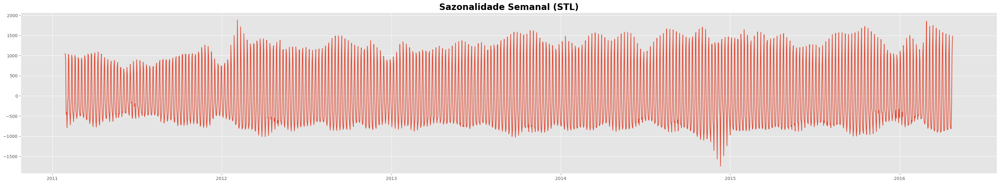

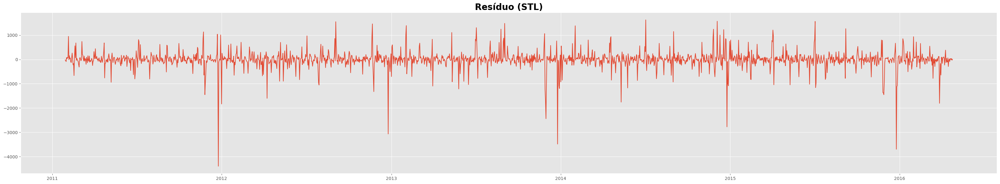

In [ ]:
# Decomposição sazonal utilizando stl

print("\nExecutando decomposição STL (periodo=7)...")
# Decomposição sazonal utilizando STL

stl = STL(y, period=7, robust=True).fit()

# Série original
plt.figure()
plt.plot(y.index, y.values)
plt.title("Série diária total CA_1", fontsize=20, fontweight='bold')
plt.tight_layout()
plt.show()

# Tendência
plt.figure()
plt.plot(stl.trend.index, stl.trend.values)
plt.title("Tendência (STL)", fontsize=20, fontweight='bold')
plt.tight_layout()
plt.show()

# Sazonalidade
plt.figure()
plt.plot(stl.seasonal.index, stl.seasonal.values)
plt.title("Sazonalidade Semanal (STL)", fontsize=20, fontweight='bold')
plt.tight_layout()
plt.show()

# Resíduo
plt.figure()
plt.plot(stl.resid.index, stl.resid.values)
plt.title("Resíduo (STL)", fontsize=20, fontweight='bold')
plt.tight_layout()
plt.show()

<Axes: title={'center': 'Série Normalizada pela Tendência'}, xlabel='date'>

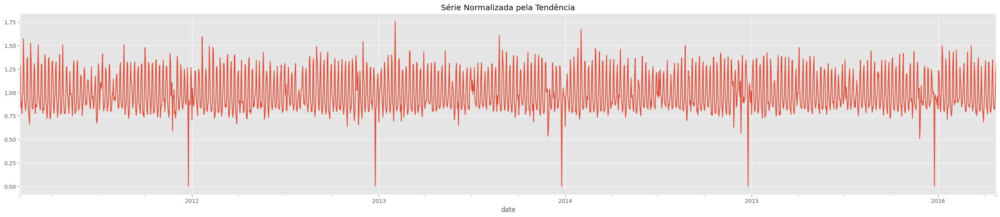

In [ ]:
(y / stl.trend).plot(title="Série Normalizada pela Tendência")


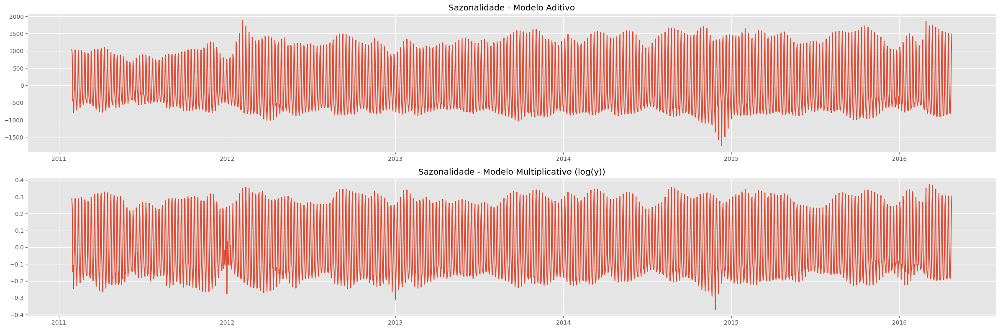

In [ ]:
# Comparação: STL aditiva vs multiplicativa (log-transform)
stl_add = STL(y, period=7, robust=True).fit()
stl_mul = STL(np.log1p(y), period=7, robust=True).fit()

fig, axes = plt.subplots(2, 1, figsize=(24, 8))
axes[0].plot(stl_add.seasonal)
axes[0].set_title("Sazonalidade - Modelo Aditivo")
axes[1].plot(stl_mul.seasonal)
axes[1].set_title("Sazonalidade - Modelo Multiplicativo (log(y))")
plt.tight_layout()
plt.show()


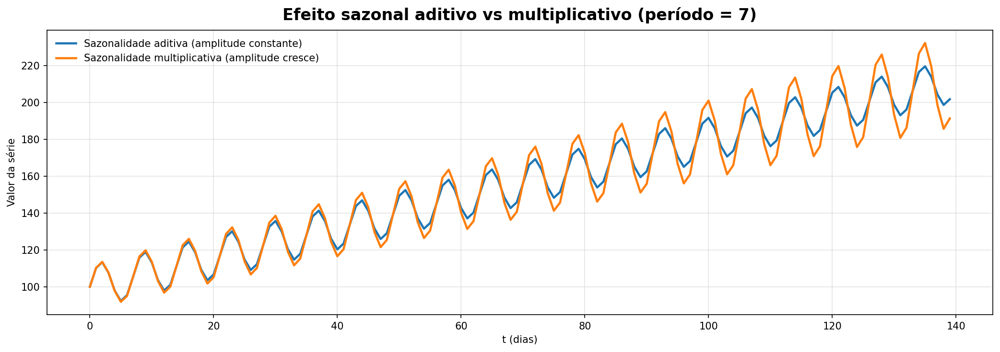

In [160]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# ---------------------------
# Série sintética (simples)
# ---------------------------
n = 140                 # 20 semanas
t = np.arange(n)

# Nível/tendência crescente (para evidenciar multiplicativo)
trend = 100 + 0.8 * t   # cresce linearmente

# Sazonalidade com período 7 (mesmo "movimento" para ambos)
# (forma senoidal, repetindo a cada 7 pontos)
season = np.sin(2 * np.pi * t / 7)

# (1) Aditivo: amplitude constante em unidades
A = 12
y_add = trend + A * season

# (2) Multiplicativo: amplitude cresce com o nível (fator em torno de 1)
B = 0.12                # 12% de variação sazonal
y_mul = trend * (1 + B * season)

# ---------------------------
# Plot (2 curvas)
# ---------------------------
plt.style.use("default")
fig, ax = plt.subplots(figsize=(14, 5), dpi=150)
fig.patch.set_facecolor("white")
ax.set_facecolor("white")

ax.plot(t, y_add, lw=2.2, label="Sazonalidade aditiva (amplitude constante)")
ax.plot(t, y_mul, lw=2.2, label="Sazonalidade multiplicativa (amplitude cresce)")

ax.set_title("Efeito sazonal aditivo vs multiplicativo (período = 7)", fontsize=16, fontweight="bold", pad=10)
ax.set_xlabel("t (dias)")
ax.set_ylabel("Valor da série")
ax.grid(True, color="lightgray", alpha=0.6)
ax.legend(frameon=False, loc="upper left")

plt.tight_layout()
plt.savefig("aditivo_vs_multiplicativo_periodo7.png", dpi=300, bbox_inches="tight")
plt.show()



=== Teste ADF (série diária) ===
Estatística ADF: -2.0354
p-valor: 0.2713


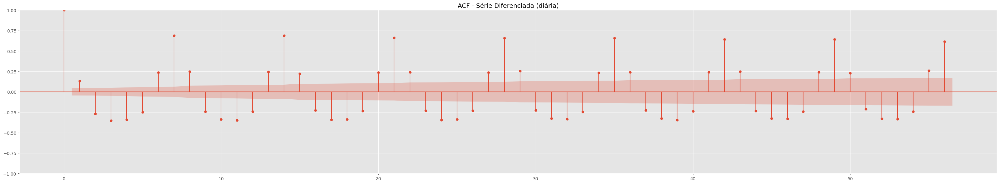

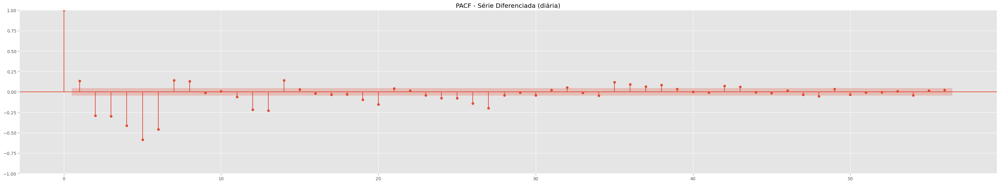

In [ ]:
# 12) ACF/PACF na série diferenciada
# -------------------------
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.stattools import adfuller

resultado_adf = adfuller(y.values, autolag="AIC")
print("\n=== Teste ADF (série diária) ===")
print(f"Estatística ADF: {resultado_adf[0]:.4f}")
print(f"p-valor: {resultado_adf[1]:.4f}")

# Exibir ACF/PACF da série diferenciada (para estacionariedade)
y_diff = y.diff().dropna()

fig = plot_acf(y_diff, lags=56)
plt.title("ACF - Série Diferenciada (diária)")
plt.tight_layout(); plt.show()

fig = plot_pacf(y_diff, lags=56, method="ywm")
plt.title("PACF - Série Diferenciada (diária)")
plt.tight_layout(); plt.show()

O p-valor (0.27) é maior que 0.05, portanto não rejeitamos a hipótese nula de que a série possui raiz unitária, isto é, não é estacionária.

Ou seja, existe tendência de longo prazo e sazonalidade na série de vendas agregadas da loja CA_1.

A série original não é estacionária. É recomendável aplicar uma diferença de primeira ordem (d = 1) e possivelmente uma diferença sazonal semanal (D = 1, s = 7) para torná-la estacionária.


O comportamento periódico da ACF confirma a presença de uma sazonalidade de 7 dias, compatível com o ciclo de vendas semanal do varejo.
A lenta atenuação da autocorrelação reforça a necessidade de diferenciação para remover a dependência temporal persistente.


A PACF indica que um modelo com pequeno número de termos autorregressivos pode capturar a dependência direta entre dias consecutivos de vendas.

SARIMA(p=1,d=1,q=1)×(P=1,D=1,Q=1,s=7)

In [ ]:


# ==============================
# SARIMA base
# ==============================
modelo_nm = 'SARIMA(1,1,1)x(1,1,1,7)'

# 1) Série diária (float64)
y_tr = y_train.asfreq("D").astype("float64")
y_va = y_val.asfreq("D").astype("float64")

# 2) Fit + forecast (cronômetro)
t0 = time.perf_counter()
mdl = SARIMAX(
    y_tr,
    order=(1, 1, 1),
    seasonal_order=(1, 1, 1, 7),
    enforce_stationarity=False,
    enforce_invertibility=False,
    initialization="approximate_diffuse",
).fit(disp=False, maxiter=500)

yhat = pd.Series(mdl.forecast(steps=len(y_va)), index=y_va.index, name="forecast")
dt = time.perf_counter() - t0

# 3) Avaliação
results = avaliar_modelo(modelo_nm, yhat, y_train, y_val, results, ultimos_pontos=150, tempo_s=dt)



RESULTADOS ATUAIS
Modelo: Regressão Linear Simples                 | RMSE: 974.276  | MAE: 876.524  | RMSSE: 1.125    | Tempo:    0.0390s
Modelo: Regressão Linear Simples • Walk-Forward (média folds) | RMSE: 962.587  | MAE: 844.786  | RMSSE: 1.141    | Tempo:    0.0420s
Modelo: Regressão Linear Simples • Walk-Forward (últimos 28) | RMSE: 974.276  | MAE: 876.524  | RMSSE: 1.125    | Tempo:    0.0044s
Modelo: SARIMA(1,1,1)x(1,1,1,7)                  | RMSE: 358.785  | MAE: 271.503  | RMSSE: 0.414    | Tempo:   14.7059s



In [ ]:
print(mdl.summary())

                                     SARIMAX Results                                     
Dep. Variable:                            demand   No. Observations:                 1885
Model:             SARIMAX(1, 1, 1)x(1, 1, 1, 7)   Log Likelihood              -14139.243
Date:                           Sat, 08 Nov 2025   AIC                          28288.485
Time:                                   17:54:22   BIC                          28316.194
Sample:                               01-29-2011   HQIC                         28298.690
                                    - 03-27-2016                                         
Covariance Type:                             opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.3492      0.015     24.057      0.000       0.321       0.378
ma.L1         -0.9601      0.008   -120.283

## 4.1 Modelo SARIMA BASE + WALK-FORWARD VALIDATION


In [ ]:
# ==========================================================
# WALK-FORWARD • SARIMA fixo (p,d,q)x(P,D,Q,S)
#  - step_size = 90
#  - último fold = últimos 28 dias
#  - registra em `results`: (i) média dos folds; (ii) último fold (com gráfico)
# ==========================================================

import numpy as np
import pandas as pd
import time
from statsmodels.tsa.statespace.sarimax import SARIMAX

# -----------------------------
# 0) Série completa (+ exógenas se houver)
# -----------------------------
y_all = pd.concat([y_train, y_val]).asfreq("D").astype("float64")
y_all = y_all.squeeze()

# results se não existir
if "results" not in globals():
    results = []

# Se quiser usar exógenas já existentes (X_train/X_val), deixe USE_EXOG=True
USE_EXOG = ("X_train" in globals()) and ("X_val" in globals()) and (X_train is not None)

def _to_df(X, idx, name_prefix="x"):
    if X is None:
        return None
    if isinstance(X, pd.DataFrame):
        df = X.copy()
    elif isinstance(X, pd.Series):
        df = X.to_frame()
    else:
        arr = np.asarray(X)
        if arr.ndim == 1: arr = arr.reshape(-1, 1)
        df = pd.DataFrame(arr, columns=[f"{name_prefix}{i}" for i in range(arr.shape[1])])
    if idx is not None:
        df.index = pd.Index(idx)
    return df

if USE_EXOG:
    X_tr_df = _to_df(X_train, getattr(y_train, "index", None))
    X_va_df = _to_df(X_val,   getattr(y_val,   "index", None))
    X_all = pd.concat([X_tr_df, X_va_df], axis=0)
    X_all = X_all[~X_all.index.duplicated(keep="last")]
    X_all = X_all.reindex(y_all.index)
    X_all = X_all.apply(pd.to_numeric, errors="coerce").fillna(0.0).astype("float64")
else:
    X_all = None

# -----------------------------
# 1) Parâmetros do walk-forward
# -----------------------------
h         = 28              # horizonte por fold
min_train = 365 * 3         # histórico mínimo
step_size = 90

end_points = list(range(min_train + h, len(y_all) + 1, step_size))
if not end_points or end_points[-1] != len(y_all):
    end_points.append(len(y_all))

ORDER = (1, 1, 1)
SEAS  = (1, 1, 1, 7)
modelo_base = f"SARIMA{ORDER}x{SEAS}" + (" + exógenas" if X_all is not None else "")

# -----------------------------
# 2) Loop de folds
# -----------------------------
rmse_list, mae_list, rmsse_list = [], [], []
tempo_list = []
tempo_last_fold = None
y_train_last = y_val_last = y_pred_last = None
fold = 0

for end_val in end_points:
    end_train = end_val - h
    if end_train < min_train:
        continue

    y_tr = y_all.iloc[:end_train].copy()
    y_va = y_all.iloc[end_train:end_val].copy()

    if X_all is not None:
        X_tr = X_all.iloc[:end_train, :].copy()
        X_va = X_all.iloc[end_train:end_val, :].copy()
    else:
        X_tr = X_va = None

    fold += 1
    print(f"\n🔹 Fold {fold}: Treino {y_tr.index[0].date()} → {y_tr.index[-1].date()} | "
          f"Val {y_va.index[0].date()} → {y_va.index[-1].date()}")

    # Fit + forecast por fold
    t0 = time.perf_counter()
    mdl = SARIMAX(
        y_tr,
        order=ORDER,
        seasonal_order=SEAS,
        exog=X_tr,
        enforce_stationarity=False,
        enforce_invertibility=False,
        initialization="approximate_diffuse",
    ).fit(disp=False, maxiter=500)

    y_pr = pd.Series(mdl.forecast(steps=len(y_va), exog=X_va), index=y_va.index, name="forecast")
    dt_fold = time.perf_counter() - t0

    # Métricas por fold
    err = y_va.values - y_pr.values
    rmse_f  = float(np.sqrt(np.mean(err**2)))
    mae_f   = float(np.mean(np.abs(err)))
    rmsse_f = float(rmsse_robust(y_va, y_pr, y_tr))

    rmse_list.append(rmse_f); mae_list.append(mae_f); rmsse_list.append(rmsse_f)
    tempo_list.append(dt_fold)
    tempo_last_fold = dt_fold

    print(f"  → {modelo_base} | RMSE={rmse_f:.3f} | MAE={mae_f:.3f} | RMSSE={rmsse_f:.3f} | Tempo={dt_fold:.3f}s")

    # guarda o último fold
    y_train_last, y_val_last, y_pred_last = y_tr, y_va, y_pr

# -----------------------------
# 3) Adiciona a MÉDIA DOS FOLDS em `results` (antes do último fold)
# -----------------------------
if rmse_list:
    DEC_T = 4
    tempo_total_sum = float(np.sum(tempo_list))
    tempo_total = float(np.round(tempo_total_sum, DEC_T))

    results.append({
        "modelo": f"{modelo_base} • Walk-Forward (média folds)",
        "RMSE":   float(np.mean(rmse_list)),
        "MAE":    float(np.mean(mae_list)),
        "RMSSE":  float(np.mean(rmsse_list)),
        "tempo_s": tempo_total
    })

# -----------------------------
# 4) Avaliação do ÚLTIMO FOLD (gráfico + registro em `results`)
# -----------------------------
if y_pred_last is not None:
    modelo_nm = f"{modelo_base} • Walk-Forward (últimos {h})"
    ULT_HIST = max(3*h, 120)
    ultimos = min(ULT_HIST, len(y_train_last) + len(y_val_last))

    results = avaliar_modelo(
        modelo_nm,
        y_pred_last, y_train_last, y_val_last,
        results,
        ultimos_pontos=ultimos,
        tempo_s=tempo_last_fold
    )

# -----------------------------
# 5) Impressão final de resumo no console (opcional)
# -----------------------------
if rmse_list:
    print("\n================== RESUMO WALK-FORWARD (SARIMA fixo) ==================")
    print(f"Total de folds: {len(rmse_list)}")
    print(f"Média RMSE : {np.mean(rmse_list):.3f} ± {np.std(rmse_list):.3f}")
    print(f"Média MAE  : {np.mean(mae_list):.3f} ± {np.std(mae_list):.3f}")
    print(f"Média RMSSE: {np.mean(rmsse_list):.3f} ± {np.std(rmsse_list):.3f}")
    print(f"Tempo total (somatório dos folds): {tempo_total:.{DEC_T}f}s")
    print("=======================================================================")
else:
    print("Sem folds válidos para resumir.")



🔹 Fold 1: Treino 2011-01-29 → 2014-01-27 | Val 2014-01-28 → 2014-02-24
  → SARIMA(1, 1, 1)x(1, 1, 1, 7) + exógenas | RMSE=442.070 | MAE=346.634 | RMSSE=0.538 | Tempo=11.243s

🔹 Fold 2: Treino 2011-01-29 → 2014-04-27 | Val 2014-04-28 → 2014-05-25
  → SARIMA(1, 1, 1)x(1, 1, 1, 7) + exógenas | RMSE=475.464 | MAE=356.461 | RMSSE=0.573 | Tempo=10.613s

🔹 Fold 3: Treino 2011-01-29 → 2014-07-26 | Val 2014-07-27 → 2014-08-23
  → SARIMA(1, 1, 1)x(1, 1, 1, 7) + exógenas | RMSE=397.629 | MAE=315.815 | RMSSE=0.482 | Tempo=8.693s

🔹 Fold 4: Treino 2011-01-29 → 2014-10-24 | Val 2014-10-25 → 2014-11-21
  → SARIMA(1, 1, 1)x(1, 1, 1, 7) + exógenas | RMSE=404.715 | MAE=339.058 | RMSSE=0.487 | Tempo=9.961s

🔹 Fold 5: Treino 2011-01-29 → 2015-01-22 | Val 2015-01-23 → 2015-02-19
  → SARIMA(1, 1, 1)x(1, 1, 1, 7) + exógenas | RMSE=506.017 | MAE=412.058 | RMSSE=0.597 | Tempo=11.714s

🔹 Fold 6: Treino 2011-01-29 → 2015-04-22 | Val 2015-04-23 → 2015-05-20
  → SARIMA(1, 1, 1)x(1, 1, 1, 7) + exógenas | RMSE=372.


================== RESUMO WALK-FORWARD (SARIMA fixo) ==================
Total de folds: 10
Média RMSE : 430.453 ± 47.911
Média MAE  : 344.228 ± 43.593
Média RMSSE: 0.511 ± 0.058
Tempo total (somatório dos folds): 119.2461s


## 4.2 Modelo Sarima + Random Search

In [ ]:
# ==========================================================
# 8) RANDOM SEARCH (FAST | MEDIUM | SLOW) — alinhado ao baseline
#    + pipeline EXÓGENAS padronizado (snap_CA + eventos principais + calendário opcional)
#    - d_FIX=1, D_FIX=1, S_FIX=7
#    - trend=None / simple_differencing=False (igual ao seu fit padrão)
#    - remove exógenas sem variação
#    - toggle USAR_EXOGENAS
# ==========================================================
import numpy as np, pandas as pd
import time, itertools, random, os, warnings
from math import inf
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tools.sm_exceptions import ConvergenceWarning
warnings.filterwarnings("ignore", category=ConvergenceWarning)
os.environ["OMP_NUM_THREADS"] = "1"

# ---------- PRESET ----------
RS_PRESET = "FAST"  # escolha: "FAST", "MEDIUM", "SLOW"
USAR_EXOGENAS = False

# ATENÇÃO: S_FIX é 7 (sazonalidade semanal). d_FIX e D_FIX = 1 conforme baseline.
d_FIX, D_FIX, S_FIX = 1, 1, 7

PRESETS = {
    #   pmax qmax Pmax Qmax Σmax  N_TRYS MAXITER REFINE
    "FAST":   dict(pmax=2, qmax=2, Pmax=2, Qmax=2, MAX_ORDER_SUM=6, N_TRYS=24, MAXITER=150, REFINE=False),
    "MEDIUM": dict(pmax=3, qmax=3, Pmax=2, Qmax=2, MAX_ORDER_SUM=7, N_TRYS=36, MAXITER=200, REFINE=True),
    "SLOW":   dict(pmax=3, qmax=3, Pmax=3, Qmax=2, MAX_ORDER_SUM=8, N_TRYS=54, MAXITER=300, REFINE=True),
}
_cfg = PRESETS[RS_PRESET]

# ---------- Flags para manter EXACTAMENTE o baseline ----------
RS_TREND = None
RS_SIMPLE_DIFFERENCING = False

print(f"\n[RS] Preset={RS_PRESET} | p,q≤{_cfg['pmax']} P,Q≤{_cfg['Pmax']} | "
      f"Σ≤{_cfg['MAX_ORDER_SUM']} | amostras={_cfg['N_TRYS']} | "
      f"maxiter={_cfg['MAXITER']} | refino={_cfg['REFINE']}")

# ==========================================================
# A) ENDÓGENA: garante diário/float64 (caso ainda não esteja)
# ==========================================================
y_train = y_train.copy().asfreq("D").astype("float64")
y_val   = y_val.copy().asfreq("D").astype("float64")
y_train.index = pd.to_datetime(y_train.index)
y_val.index   = pd.to_datetime(y_val.index)

# ==========================================================
# B) EXÓGENAS padronizadas a partir de df_train
#    - snap_CA
#    - filtro de eventos principais (regex `maiores`)
#    - dummies de eventos (+ calendário opcional)
# ==========================================================
exog_cols = ["date", "snap_CA", "event_name_1", "event_name_2", "weekday", "month", "year"]
df_exog = df_train[exog_cols].copy()
df_exog["date"] = pd.to_datetime(df_exog["date"])
df_exog = df_exog.set_index("date").sort_index()

# Agregação por data (se houver duplicadas)
agg_dict = {"snap_CA": "max", "weekday": "first", "month": "first", "year": "first",
            "event_name_1": "first", "event_name_2": "first"}
if not df_exog.index.is_unique:
    df_exog = df_exog.groupby(level=0).agg(agg_dict)

# Alinhamento ao índice de treino+val
idx_all = y_train.index.union(y_val.index)
df_exog = df_exog.reindex(idx_all)

# Tratamento de NA
df_exog["snap_CA"] = df_exog["snap_CA"].fillna(0)
for c in ["weekday", "month", "year"]:
    df_exog[c] = df_exog[c].fillna(method="ffill").fillna(method="bfill")
for c in ["event_name_1", "event_name_2"]:
    df_exog[c] = df_exog[c].astype("string").fillna("None")

# Filtro de eventos mais relevantes (padronizado)
maiores = r"Christmas|Thanksgiving|Easter|SuperBowl|Valentines|Memorial|Independence|LaborDay|NewYear|Mother|Father"
df_exog["event_name_1_top"] = np.where(
    df_exog["event_name_1"].str.contains(maiores, case=False, na=False),
    df_exog["event_name_1"], "Outros"
)
df_exog["event_name_2_top"] = np.where(
    df_exog["event_name_2"].str.contains(maiores, case=False, na=False),
    df_exog["event_name_2"], "Outros"
)

# Dummies (eventos + calendário opcional)
cols_cat = ["event_name_1_top", "event_name_2_top", "weekday", "month"]
df_exog = pd.get_dummies(df_exog, columns=cols_cat, drop_first=True)
df_exog = df_exog.apply(pd.to_numeric, errors="coerce").fillna(0.0)

# Split e alinhamento
X_train = df_exog.loc[y_train.index].copy()
X_val   = df_exog.loc[y_val.index].copy()
X_val   = X_val.reindex(columns=X_train.columns, fill_value=0.0)

# Seleção final de exógenas (padronizada)
cols_exog = ["snap_CA"]
cols_exog += [c for c in X_train.columns if c.startswith("event_name_1_top_") or c.startswith("event_name_2_top_")]
# (opcional) incluir calendário:
# cols_exog += [c for c in X_train.columns if c.startswith("weekday_") or c.startswith("month_")]

X_train[cols_exog] = X_train[cols_exog].astype("float64")
X_val[cols_exog]   = X_val[cols_exog].astype("float64")

print("📊 Exógenas selecionadas:", len(cols_exog), "| Treino:", X_train[cols_exog].shape, "| Val:", X_val[cols_exog].shape)

# ---------- EXÓGENAS: limpeza + toggle ----------
def _exog_safe(df, cols):
    try:
        if USAR_EXOGENAS and df is not None and cols and len(cols) > 0:
            return df[cols]
    except Exception:
        pass
    return None

# remove colunas sem variação (constantes/zeros)
if USAR_EXOGENAS and len(cols_exog) > 0:
    no_var = [c for c in cols_exog if X_train[c].nunique(dropna=False) <= 1]
    if no_var:
        print(f"[RS] Removendo {len(no_var)} exógenas sem variação:", no_var[:8], "..." if len(no_var)>8 else "")
        cols_exog = [c for c in cols_exog if c not in no_var]
        X_train[cols_exog] = X_train[cols_exog].astype("float64")
        X_val[cols_exog]   = X_val[cols_exog].astype("float64")

ex_tr = _exog_safe(X_train, cols_exog)
ex_va = _exog_safe(X_val,   cols_exog)

# ==========================================================
# C) RANDOM SEARCH
# ==========================================================
p_RANGE = range(0, _cfg["pmax"]+1)
q_RANGE = range(0, _cfg["qmax"]+1)
P_RANGE = range(0, _cfg["Pmax"]+1)
Q_RANGE = range(0, _cfg["Qmax"]+1)
MAX_ORDER_SUM = _cfg["MAX_ORDER_SUM"]
N_TRYS_STAGE1 = _cfg["N_TRYS"]
MAXITER_FIT   = _cfg["MAXITER"]
REFINE_LOCAL  = _cfg["REFINE"]

random.seed(42)

def _rmsse_fallback(y_tr, y_va, yhat):
    y_tr = pd.Series(y_tr).astype("float64")
    y_va = pd.Series(y_va).astype("float64")
    yhat = pd.Series(yhat).astype("float64")
    diffs = y_tr.diff().dropna()
    denom = np.sqrt(np.mean(np.square(diffs))) if len(diffs) else np.nan
    num   = np.sqrt(np.mean(np.square(y_va.values - yhat.values)))
    return num / denom if (denom is not None and denom != 0 and not np.isnan(denom)) else np.inf

def _rmsse_safe(y_tr, y_va, yhat):
    try:
        return rmsse_robust(y_va, yhat, y_tr)
    except Exception:
        return _rmsse_fallback(y_tr, y_va, yhat)

def _score_tuple(rmsse, bic, aic, p, q, P, Q):
    # menor é melhor: RMSSE → BIC → AIC → parcimônia
    return (rmsse, bic, aic, p+q+P+Q)

def _fit_and_score(p, q, P, Q, verbose=True):
    order = (p, d_FIX, q)
    seas  = (P, D_FIX, Q, S_FIX)
    t0 = time.perf_counter()
    try:
        mdl = SARIMAX(
            y_train,
            order=order,
            seasonal_order=seas,
            exog=ex_tr,                       # respeita toggle
            trend=RS_TREND,
            enforce_stationarity=False,
            enforce_invertibility=False,
            initialization="approximate_diffuse",
            simple_differencing=RS_SIMPLE_DIFFERENCING,
        ).fit(disp=False, maxiter=MAXITER_FIT)

        yhat = pd.Series(mdl.forecast(steps=len(y_val), exog=ex_va), index=y_val.index)
        rmsse = _rmsse_safe(y_train, y_val, yhat)
        bic   = mdl.bic if np.isfinite(mdl.bic) else inf
        aic   = mdl.aic if np.isfinite(mdl.aic) else inf
        dt    = time.perf_counter() - t0
        if verbose:
            print(f"   ✅ {order}x{seas} | RMSSE={rmsse:.3f} | BIC={bic:.1f} | {dt:.1f}s")
        return dict(ok=True, order=order, seas=seas, mdl=mdl, yhat=yhat,
                    score=_score_tuple(rmsse,bic,aic,p,q,P,Q),
                    rmsse=rmsse, bic=bic, aic=aic, dt=dt)
    except Exception as e:
        if verbose:
            print(f"   ❌ {order}x{seas} falhou: {e}")
        return dict(ok=False)

# Stage 1: amostragem aleatória podada
pool = [(p,q,P,Q)
        for p in p_RANGE for q in q_RANGE
        for P in P_RANGE for Q in Q_RANGE
        if (p+q+P+Q) <= MAX_ORDER_SUM]
random.shuffle(pool)
stage1 = pool[:min(N_TRYS_STAGE1, len(pool))]

print(f"\n[RS-1] Amostras Stage1: {len(stage1)}")
best = None
for (p,q,P,Q) in stage1:
    res = _fit_and_score(p,q,P,Q, verbose=True)
    if not res["ok"]:
        continue
    if (best is None) or (res["score"] < best["score"]):
        best = res

if best is None:
    raise RuntimeError("Nenhum candidato convergiu. Ajuste preset ou reduza exógenas.")

# Stage 2: refino local (±1) opcional
def _neighbors(p,q,P,Q):
    viz = set()
    for dp,dq,dP,dQ in itertools.product([-1,0,1], repeat=4):
        np_, nq_, nP_, nQ_ = p+dp, q+dq, P+dP, Q+dQ
        if np_ < 0 or nq_ < 0 or nP_ < 0 or nQ_ < 0: continue
        if np_ not in p_RANGE or nq_ not in q_RANGE or nP_ not in P_RANGE or nQ_ not in Q_RANGE: continue
        if (np_+nq_+nP_+nQ_) > MAX_ORDER_SUM: continue
        viz.add((np_,nq_,nP_,nQ_))
    viz.discard((p,q,P,Q))
    return list(viz)

if _cfg["REFINE"]:
    neigh = _neighbors(best["order"][0], best["order"][2], best["seas"][0], best["seas"][2])
    print(f"\n[RS-2] Refino local: {len(neigh)} vizinhos")
    for (p,q,P,Q) in neigh:
        res = _fit_and_score(p,q,P,Q, verbose=False)
        if res["ok"] and (res["score"] < best["score"]):
            best = res
            print(f"   🔁 Novo melhor: {best['order']}x{best['seas']} | RMSSE={best['rmsse']:.3f}")

print(f"\n🏁 Melhor final: {best['order']}x{best['seas']} | RMSSE={best['rmsse']:.3f} | BIC={best['bic']:.1f}")

# ---------- (opcional) limpar resultados antigos para não misturar runs ----------
try:
    if isinstance(results, list) and len(results) > 0:
        print(f"[RS] Limpando resultados antigos (len={len(results)})")
        results = []
except NameError:
    results = []

# ---------- Avaliação final ----------
modelo_nm = (
    f"SARIMAX{best['order']}x{best['seas']} "
    + ("+ exógenas" if ex_tr is not None else "(sem exógenas)")
    + f" • RS preset={RS_PRESET} (d={d_FIX},D={D_FIX},s={S_FIX})"
)
results = avaliar_modelo(
    modelo_nm, best["yhat"], y_train, y_val, results,
    ultimos_pontos=150, tempo_s=best["dt"]
)



[RS] Preset=FAST | p,q≤2 P,Q≤2 | Σ≤6 | amostras=24 | maxiter=150 | refino=False
📊 Exógenas selecionadas: 17 | Treino: (1885, 17) | Val: (28, 17)

[RS-1] Amostras Stage1: 24
   ✅ (1, 1, 0)x(2, 1, 0, 7) | RMSSE=2.123 | BIC=29070.0 | 3.7s
   ✅ (1, 1, 2)x(0, 1, 2, 7) | RMSSE=0.418 | BIC=28329.9 | 38.9s
   ✅ (0, 1, 0)x(2, 1, 2, 7) | RMSSE=1.615 | BIC=28954.2 | 17.8s
   ✅ (1, 1, 0)x(1, 1, 0, 7) | RMSSE=1.969 | BIC=29208.0 | 1.9s
   ✅ (1, 1, 2)x(0, 1, 1, 7) | RMSSE=0.410 | BIC=28335.1 | 20.5s
   ✅ (1, 1, 1)x(0, 1, 0, 7) | RMSSE=0.813 | BIC=29289.4 | 1.8s
   ✅ (1, 1, 2)x(1, 1, 1, 7) | RMSSE=0.419 | BIC=28324.0 | 20.2s
   ✅ (0, 1, 1)x(2, 1, 0, 7) | RMSSE=0.825 | BIC=28876.5 | 3.4s
   ✅ (1, 1, 1)x(1, 1, 1, 7) | RMSSE=0.414 | BIC=28316.2 | 8.5s
   ✅ (1, 1, 1)x(1, 1, 0, 7) | RMSSE=0.567 | BIC=28936.7 | 3.1s
   ✅ (1, 1, 0)x(0, 1, 2, 7) | RMSSE=1.058 | BIC=28733.1 | 9.8s
   ✅ (2, 1, 0)x(1, 1, 0, 7) | RMSSE=1.350 | BIC=29105.7 | 1.7s
   ✅ (2, 1, 0)x(2, 1, 2, 7) | RMSSE=0.759 | BIC=28632.8 | 15.4s
  

## 4.2 Modelo Sarima + Random Search + Walk-Forward Validation

In [ ]:
ORDER = best['order']
SEAS  = best['seas']
modelo_base = f"SARIMA{ORDER}x{SEAS}" + (" + exógenas" if X_all is not None else "")
modelo_base

'SARIMA(0, 1, 2)x(0, 1, 1, 7) + exógenas'

In [ ]:
# ==========================================================
# WALK-FORWARD • SARIMAX fixo (1,1,1)x(1,1,1,7) + exógenas
#  - step_size = 90
#  - último fold = últimos 28 dias
#  - exógenas: snap_CA + principais eventos (+ calendário opcional)
#  - registra em `results`: média dos folds e último fold
# ==========================================================
import numpy as np, pandas as pd, time, os, warnings
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tools.sm_exceptions import ConvergenceWarning
warnings.filterwarnings("ignore", category=ConvergenceWarning)
os.environ["OMP_NUM_THREADS"] = "1"

# cria results se não existir
if "results" not in globals():
    results = []

# ----------------------------------------------------------
# 0) Endógena (garante diário, ordenado e float64)
# ----------------------------------------------------------
y_train = y_train.copy().asfreq("D").astype("float64")
y_val   = y_val.copy().asfreq("D").astype("float64")
y_train.index = pd.to_datetime(y_train.index)
y_val.index   = pd.to_datetime(y_val.index)

# ----------------------------------------------------------
# 1) Construção das exógenas a partir do df_train (filtro `maiores`)
# ----------------------------------------------------------
exog_cols = ["date", "snap_CA", "event_name_1", "event_name_2", "weekday", "month", "year"]
df_exog = df_train[exog_cols].copy()
df_exog["date"] = pd.to_datetime(df_exog["date"])
df_exog = df_exog.set_index("date").sort_index()

# Agregação por data (se houver duplicadas)
agg_dict = {"snap_CA": "max", "weekday": "first", "month": "first", "year": "first",
            "event_name_1": "first", "event_name_2": "first"}
if not df_exog.index.is_unique:
    df_exog = df_exog.groupby(level=0).agg(agg_dict)

# Alinha ao índice completo de treino+val
idx_all = y_train.index.union(y_val.index)
df_exog = df_exog.reindex(idx_all)

# Missing
df_exog["snap_CA"] = df_exog["snap_CA"].fillna(0)
for c in ["weekday", "month", "year"]:
    df_exog[c] = df_exog[c].fillna(method="ffill").fillna(method="bfill")
for c in ["event_name_1", "event_name_2"]:
    df_exog[c] = df_exog[c].astype("string").fillna("None")

# Filtro de eventos mais relevantes
maiores = r"Christmas|Thanksgiving|Easter|SuperBowl|Valentines|Memorial|Independence|LaborDay|NewYear|Mother|Father"
df_exog["event_name_1_top"] = np.where(
    df_exog["event_name_1"].str.contains(maiores, case=False, na=False),
    df_exog["event_name_1"], "Outros"
)
df_exog["event_name_2_top"] = np.where(
    df_exog["event_name_2"].str.contains(maiores, case=False, na=False),
    df_exog["event_name_2"], "Outros"
)

# Dummies (eventos + calendário)
cols_cat = ["event_name_1_top", "event_name_2_top", "weekday", "month"]
df_exog = pd.get_dummies(df_exog, columns=cols_cat, drop_first=True)
df_exog = df_exog.apply(pd.to_numeric, errors="coerce").fillna(0.0)

# Split em X_train/X_val e alinhamento de colunas
X_train = df_exog.loc[y_train.index].copy()
X_val   = df_exog.loc[y_val.index].copy()
X_val   = X_val.reindex(columns=X_train.columns, fill_value=0.0)

# Seleção final de exógenas (ligue/desligue calendário se quiser)
cols_exog = ["snap_CA"]
cols_exog += [c for c in X_train.columns if c.startswith("event_name_1_top_") or c.startswith("event_name_2_top_")]
# opcional:
# cols_exog += [c for c in X_train.columns if c.startswith("weekday_") or c.startswith("month_")]

X_train[cols_exog] = X_train[cols_exog].astype("float64")
X_val[cols_exog]   = X_val[cols_exog].astype("float64")
print("Exógenas:", len(cols_exog), "| Shapes:", X_train[cols_exog].shape, X_val[cols_exog].shape)

# ----------------------------------------------------------
# 2) Série completa e matriz exógena completa
# ----------------------------------------------------------
y_all = pd.concat([y_train, y_val]).asfreq("D").astype("float64")
X_all = pd.concat([X_train[cols_exog], X_val[cols_exog]], axis=0)
X_all = X_all[~X_all.index.duplicated(keep="last")]
X_all = X_all.reindex(y_all.index).fillna(0.0).astype("float64")

# ----------------------------------------------------------
# 3) Parâmetros do walk-forward
# ----------------------------------------------------------
h         = 28
min_train = 365 * 3
step_size = 90

end_points = list(range(min_train + h, len(y_all) + 1, step_size))
if not end_points or end_points[-1] != len(y_all):
    end_points.append(len(y_all))

USAR_EXOGENAS = False
ORDER = ORDER
SEAS  = SEAS
modelo_base = f"SARIMAX{ORDER}x{SEAS} + RS"

# ----------------------------------------------------------
# 4) Loop de folds
# ----------------------------------------------------------
rmse_list, mae_list, rmsse_list = [], [], []
tempo_list = []
y_train_last = y_val_last = y_pred_last = None
tempo_last_fold = None
fold = 0

for end_val in end_points:
    end_train = end_val - h
    if end_train < min_train:
        continue

    y_tr = y_all.iloc[:end_train].copy()
    y_va = y_all.iloc[end_train:end_val].copy()
    X_tr = X_all.iloc[:end_train, :].copy() if USAR_EXOGENAS else None
    X_va = X_all.iloc[end_train:end_val, :].copy() if USAR_EXOGENAS else None

    fold += 1
    print(f"\nFold {fold}: Treino {y_tr.index[0].date()} → {y_tr.index[-1].date()} | "
          f"Val {y_va.index[0].date()} → {y_va.index[-1].date()}  | exog={0 if X_tr is None else X_tr.shape[1]}")

    t0 = time.perf_counter()
    mdl = SARIMAX(
        y_tr,
        order=ORDER,
        seasonal_order=SEAS,
        exog=X_tr,
        enforce_stationarity=False,
        enforce_invertibility=False,
        initialization="approximate_diffuse",
    ).fit(disp=False, maxiter=500)

    y_pr = pd.Series(mdl.forecast(steps=len(y_va), exog=X_va), index=y_va.index, name="forecast")
    dt_fold = time.perf_counter() - t0

    err = y_va.values - y_pr.values
    rmse_f  = float(np.sqrt(np.mean(err**2)))
    mae_f   = float(np.mean(np.abs(err)))
    rmsse_f = float(rmsse_robust(y_va, y_pr, y_tr))

    rmse_list.append(rmse_f); mae_list.append(mae_f); rmsse_list.append(rmsse_f)
    tempo_list.append(dt_fold)
    tempo_last_fold = dt_fold

    print(f"  → {modelo_base} | RMSE={rmse_f:.3f} | MAE={mae_f:.3f} | RMSSE={rmsse_f:.3f} | Tempo={dt_fold:.3f}s")

    # guarda o último fold (F1–Fh)
    y_train_last, y_val_last, y_pred_last = y_tr, y_va, y_pr

# -----------------------------
# 4) Adiciona a MÉDIA DOS FOLDS em `results` (antes do último fold)
# -----------------------------
if rmse_list:
    DEC_T = 4
    tempo_total_sum = float(np.sum(tempo_list))
    tempo_total = float(np.round(tempo_total_sum, DEC_T))

    results.append({
        "modelo": f"{modelo_base} • Walk-Forward (média folds)",
        "RMSE":   float(np.mean(rmse_list)),
        "MAE":    float(np.mean(mae_list)),
        "RMSSE":  float(np.mean(rmsse_list)),
        "tempo_s": tempo_total
    })

# -----------------------------
# 5) Avaliação do ÚLTIMO FOLD (gráfico + registro em `results`)
# -----------------------------
if y_pred_last is not None:
    modelo_nm = f"{modelo_base} • Walk-Forward (últimos {h})"
    ULT_HIST = max(3*h, 120)
    ultimos = min(ULT_HIST, len(y_train_last) + len(y_val_last))

    results = avaliar_modelo(
        modelo_nm,
        y_pred_last, y_train_last, y_val_last,
        results,
        ultimos_pontos=ultimos,
        tempo_s=tempo_last_fold
    )

# -----------------------------
# 6) Resumo no console (opcional)
# -----------------------------
if rmse_list:
    print("\n================== RESUMO WALK-FORWARD (SARIMAX fixo via filtro de eventos) ==================")
    print(f"Total de folds: {len(rmse_list)}")
    print(f"Média RMSE : {np.mean(rmse_list):.3f} ± {np.std(rmse_list):.3f}")
    print(f"Média MAE  : {np.mean(mae_list):.3f} ± {np.std(mae_list):.3f}")
    print(f"Média RMSSE: {np.mean(rmsse_list):.3f} ± {np.std(rmsse_list):.3f}")
    print(f"Tempo total (somatório dos folds): {tempo_total:.{DEC_T}f}s")
    print("===============================================================================")
else:
    print("Sem folds válidos para resumir.")


Exógenas: 17 | Shapes: (1885, 17) (28, 17)

Fold 1: Treino 2011-01-29 → 2014-01-27 | Val 2014-01-28 → 2014-02-24  | exog=0
  → SARIMAX(0, 1, 2)x(0, 1, 1, 7) + RS | RMSE=451.262 | MAE=340.602 | RMSSE=0.549 | Tempo=2.666s

Fold 2: Treino 2011-01-29 → 2014-04-27 | Val 2014-04-28 → 2014-05-25  | exog=0
  → SARIMAX(0, 1, 2)x(0, 1, 1, 7) + RS | RMSE=491.028 | MAE=359.782 | RMSSE=0.592 | Tempo=3.007s

Fold 3: Treino 2011-01-29 → 2014-07-26 | Val 2014-07-27 → 2014-08-23  | exog=0
  → SARIMAX(0, 1, 2)x(0, 1, 1, 7) + RS | RMSE=379.110 | MAE=299.788 | RMSSE=0.460 | Tempo=4.536s

Fold 4: Treino 2011-01-29 → 2014-10-24 | Val 2014-10-25 → 2014-11-21  | exog=0
  → SARIMAX(0, 1, 2)x(0, 1, 1, 7) + RS | RMSE=400.638 | MAE=335.781 | RMSSE=0.482 | Tempo=3.760s

Fold 5: Treino 2011-01-29 → 2015-01-22 | Val 2015-01-23 → 2015-02-19  | exog=0
  → SARIMAX(0, 1, 2)x(0, 1, 1, 7) + RS | RMSE=511.960 | MAE=418.897 | RMSSE=0.604 | Tempo=3.623s

Fold 6: Treino 2011-01-29 → 2015-04-22 | Val 2015-04-23 → 2015-05-20  |


================== RESUMO WALK-FORWARD (SARIMAX fixo via filtro de eventos) ==================
Total de folds: 10
Média RMSE : 429.977 ± 57.467
Média MAE  : 342.648 ± 49.374
Média RMSSE: 0.510 ± 0.070
Tempo total (somatório dos folds): 43.9971s


## 4.3 Modelo Sarima + Var. Exógenas

In [ ]:
# ==========================================================
# SARIMAX fixo (1,1,1)x(1,1,1,7) com variáveis exógenas
#  - exógenas: snap_CA + principais eventos + calendário
#  - filtragem de eventos mais relevantes
# ==========================================================
import numpy as np, pandas as pd, time, os, warnings, itertools, random
from math import inf
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tools.sm_exceptions import ConvergenceWarning
warnings.filterwarnings("ignore", category=ConvergenceWarning)
os.environ["OMP_NUM_THREADS"] = "1"

# ----------------------------------------------------------
# 1) Série endógena
# ----------------------------------------------------------
y_train = y_train.copy().asfreq("D").astype("float64")
y_val   = y_val.copy().asfreq("D").astype("float64")
y_train.index = pd.to_datetime(y_train.index)
y_val.index   = pd.to_datetime(y_val.index)

# ----------------------------------------------------------
# 2) Construção das variáveis exógenas (a partir de df_train)
# ----------------------------------------------------------
exog_cols = [
    "date", "snap_CA",
    "event_name_1", "event_name_2",
    "weekday", "month", "year"
]

df_exog = df_train[exog_cols].copy()
df_exog["date"] = pd.to_datetime(df_exog["date"])
df_exog = df_exog.set_index("date").sort_index()

# agrega duplicatas por data
agg_dict = {"snap_CA": "max", "weekday": "first", "month": "first", "year": "first",
            "event_name_1": "first", "event_name_2": "first"}
if not df_exog.index.is_unique:
    df_exog = df_exog.groupby(level=0).agg(agg_dict)

# completa índice total
idx_all = y_train.index.union(y_val.index)
df_exog = df_exog.reindex(idx_all)

# missing
df_exog["snap_CA"] = df_exog["snap_CA"].fillna(0)
for c in ["weekday", "month", "year"]:
    df_exog[c] = df_exog[c].fillna(method="ffill").fillna(method="bfill")

for c in ["event_name_1", "event_name_2"]:
    df_exog[c] = df_exog[c].astype("string").fillna("None")

# ----------------------------------------------------------
# 3) Seleção dos principais eventos (redução de dummies)
# ----------------------------------------------------------
maiores = r"Christmas|Thanksgiving|Easter|SuperBowl|Valentines|Memorial|Independence|LaborDay|NewYear|Mother|Father"

df_exog["event_name_1_top"] = np.where(
    df_exog["event_name_1"].str.contains(maiores, case=False, na=False),
    df_exog["event_name_1"], "Outros"
)
df_exog["event_name_2_top"] = np.where(
    df_exog["event_name_2"].str.contains(maiores, case=False, na=False),
    df_exog["event_name_2"], "Outros"
)

# ----------------------------------------------------------
# 4) Criação das dummies
# ----------------------------------------------------------
cols_cat = ["event_name_1_top", "event_name_2_top", "weekday", "month"]
df_exog = pd.get_dummies(df_exog, columns=cols_cat, drop_first=True)
df_exog = df_exog.apply(pd.to_numeric, errors="coerce").fillna(0.0)

# ----------------------------------------------------------
# 5) Split exógenas treino/val
# ----------------------------------------------------------
X_train = df_exog.loc[y_train.index].copy()
X_val   = df_exog.loc[y_val.index].copy()

# define colunas exógenas a serem usadas
cols_exog = ["snap_CA"]
cols_exog += [c for c in X_train.columns if c.startswith("event_name_1_top_") or c.startswith("event_name_2_top_")]
# habilite calendários se quiser:
# cols_exog += [c for c in X_train.columns if c.startswith("weekday_") or c.startswith("month_")]

X_train[cols_exog] = X_train[cols_exog].astype("float64")
X_val[cols_exog]   = X_val[cols_exog].astype("float64")

print(f"📊 Exógenas selecionadas: {len(cols_exog)} | Treino: {X_train[cols_exog].shape} | Val: {X_val[cols_exog].shape}")

# ----------------------------------------------------------
# 6) Modelo fixo (1,1,1)x(1,1,1,7)
# ----------------------------------------------------------
USAR_EXOGENAS = True
d_FIX, D_FIX, S_FIX = 1, 1, 7
order = (1, d_FIX, 1)
seas  = (1, D_FIX, 1, S_FIX)

ex_tr = X_train[cols_exog] if USAR_EXOGENAS else None
ex_va = X_val[cols_exog]   if USAR_EXOGENAS else None

t0 = time.perf_counter()
mdl = SARIMAX(
    y_train,
    order=order,
    seasonal_order=seas,
    exog=ex_tr,
    enforce_stationarity=False,
    enforce_invertibility=False,
    initialization="approximate_diffuse"
).fit(disp=False, maxiter=500)
dt = time.perf_counter() - t0

# ----------------------------------------------------------
# 7) Forecast + avaliação
# ----------------------------------------------------------
yhat = pd.Series(mdl.forecast(steps=len(y_val), exog=ex_va), index=y_val.index)
rmsse_val = float(rmsse_robust(y_val, yhat, y_train))
bic, aic = mdl.bic, mdl.aic

print(f"\n✅ SARIMAX{order}x{seas} | RMSSE={rmsse_val:.3f} | BIC={bic:.1f} | AIC={aic:.1f} | Tempo={dt:.1f}s")

# ----------------------------------------------------------
# 8) Avaliação final e registro em results
# ----------------------------------------------------------
modelo_nm = f"SARIMAX{order}x{seas} + exógenas (fixo)"
results = avaliar_modelo(
    modelo_nm, yhat, y_train, y_val, results,
    ultimos_pontos=150, tempo_s=dt
)


📊 Exógenas selecionadas: 17 | Treino: (1885, 17) | Val: (28, 17)

✅ SARIMAX(1, 1, 1)x(1, 1, 1, 7) | RMSSE=0.270 | BIC=27397.4 | AIC=27275.5 | Tempo=22.9s

RESULTADOS ATUAIS
Modelo: SARIMAX(0, 1, 2)x(0, 1, 1, 7) (sem exógenas) • RS preset=FAST (d=1,D=1,s=7) | RMSE: 341.077  | MAE: 264.251  | RMSSE: 0.394    | Tempo:    4.9466s
Modelo: SARIMAX(0, 1, 2)x(0, 1, 1, 7) + RS • Walk-Forward (média folds) | RMSE: 429.977  | MAE: 342.648  | RMSSE: 0.510    | Tempo:   43.9971s
Modelo: SARIMAX(0, 1, 2)x(0, 1, 1, 7) + RS • Walk-Forward (últimos 28) | RMSE: 341.077  | MAE: 264.251  | RMSSE: 0.394    | Tempo:    4.4862s
Modelo: SARIMAX(1, 1, 1)x(1, 1, 1, 7) + exógenas (fixo) | RMSE: 234.151  | MAE: 186.652  | RMSSE: 0.270    | Tempo:   22.9080s



## 4.3 Modelo Sarima + Var. Exógenas + Walk-Forward Validation

In [ ]:
# ==========================================================
# WALK-FORWARD • SARIMAX fixo (1,1,1)x(1,1,1,7) + exógenas
#  - step_size = 90
#  - último fold = últimos 28 dias
#  - exógenas: snap_CA + principais eventos (+ calendário opcional)
#  - registra em `results`: média dos folds e último fold
# ==========================================================
import numpy as np, pandas as pd, time, os, warnings
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tools.sm_exceptions import ConvergenceWarning
warnings.filterwarnings("ignore", category=ConvergenceWarning)
os.environ["OMP_NUM_THREADS"] = "1"

# cria results se não existir
if "results" not in globals():
    results = []

# ----------------------------------------------------------
# 0) Endógena (garante diário, ordenado e float64)
# ----------------------------------------------------------
y_train = y_train.copy().asfreq("D").astype("float64")
y_val   = y_val.copy().asfreq("D").astype("float64")
y_train.index = pd.to_datetime(y_train.index)
y_val.index   = pd.to_datetime(y_val.index)

# ----------------------------------------------------------
# 1) Construção das exógenas a partir do df_train (filtro `maiores`)
# ----------------------------------------------------------
exog_cols = ["date", "snap_CA", "event_name_1", "event_name_2", "weekday", "month", "year"]
df_exog = df_train[exog_cols].copy()
df_exog["date"] = pd.to_datetime(df_exog["date"])
df_exog = df_exog.set_index("date").sort_index()

# Agregação por data (se houver duplicadas)
agg_dict = {"snap_CA": "max", "weekday": "first", "month": "first", "year": "first",
            "event_name_1": "first", "event_name_2": "first"}
if not df_exog.index.is_unique:
    df_exog = df_exog.groupby(level=0).agg(agg_dict)

# Alinha ao índice completo de treino+val
idx_all = y_train.index.union(y_val.index)
df_exog = df_exog.reindex(idx_all)

# Missing
df_exog["snap_CA"] = df_exog["snap_CA"].fillna(0)
for c in ["weekday", "month", "year"]:
    df_exog[c] = df_exog[c].fillna(method="ffill").fillna(method="bfill")
for c in ["event_name_1", "event_name_2"]:
    df_exog[c] = df_exog[c].astype("string").fillna("None")

# Filtro de eventos mais relevantes
maiores = r"Christmas|Thanksgiving|Easter|SuperBowl|Valentines|Memorial|Independence|LaborDay|NewYear|Mother|Father"
df_exog["event_name_1_top"] = np.where(
    df_exog["event_name_1"].str.contains(maiores, case=False, na=False),
    df_exog["event_name_1"], "Outros"
)
df_exog["event_name_2_top"] = np.where(
    df_exog["event_name_2"].str.contains(maiores, case=False, na=False),
    df_exog["event_name_2"], "Outros"
)

# Dummies (eventos + calendário)
cols_cat = ["event_name_1_top", "event_name_2_top", "weekday", "month"]
df_exog = pd.get_dummies(df_exog, columns=cols_cat, drop_first=True)
df_exog = df_exog.apply(pd.to_numeric, errors="coerce").fillna(0.0)

# Split em X_train/X_val e alinhamento de colunas
X_train = df_exog.loc[y_train.index].copy()
X_val   = df_exog.loc[y_val.index].copy()
X_val   = X_val.reindex(columns=X_train.columns, fill_value=0.0)

# Seleção final de exógenas (ligue/desligue calendário se quiser)
cols_exog = ["snap_CA"]
cols_exog += [c for c in X_train.columns if c.startswith("event_name_1_top_") or c.startswith("event_name_2_top_")]
# opcional:
# cols_exog += [c for c in X_train.columns if c.startswith("weekday_") or c.startswith("month_")]

X_train[cols_exog] = X_train[cols_exog].astype("float64")
X_val[cols_exog]   = X_val[cols_exog].astype("float64")
print("Exógenas:", len(cols_exog), "| Shapes:", X_train[cols_exog].shape, X_val[cols_exog].shape)

# ----------------------------------------------------------
# 2) Série completa e matriz exógena completa
# ----------------------------------------------------------
y_all = pd.concat([y_train, y_val]).asfreq("D").astype("float64")
X_all = pd.concat([X_train[cols_exog], X_val[cols_exog]], axis=0)
X_all = X_all[~X_all.index.duplicated(keep="last")]
X_all = X_all.reindex(y_all.index).fillna(0.0).astype("float64")

# ----------------------------------------------------------
# 3) Parâmetros do walk-forward
# ----------------------------------------------------------
h         = 28
min_train = 365 * 3
step_size = 90

end_points = list(range(min_train + h, len(y_all) + 1, step_size))
if not end_points or end_points[-1] != len(y_all):
    end_points.append(len(y_all))

USAR_EXOGENAS = True
ORDER = (1, 1, 1)
SEAS  = (1, 1, 1, 7)
modelo_base = f"SARIMAX{ORDER}x{SEAS} + exógenas"

# ----------------------------------------------------------
# 4) Loop de folds
# ----------------------------------------------------------
rmse_list, mae_list, rmsse_list = [], [], []
tempo_list = []
y_train_last = y_val_last = y_pred_last = None
tempo_last_fold = None
fold = 0

for end_val in end_points:
    end_train = end_val - h
    if end_train < min_train:
        continue

    y_tr = y_all.iloc[:end_train].copy()
    y_va = y_all.iloc[end_train:end_val].copy()
    X_tr = X_all.iloc[:end_train, :].copy() if USAR_EXOGENAS else None
    X_va = X_all.iloc[end_train:end_val, :].copy() if USAR_EXOGENAS else None

    fold += 1
    print(f"\nFold {fold}: Treino {y_tr.index[0].date()} → {y_tr.index[-1].date()} | "
          f"Val {y_va.index[0].date()} → {y_va.index[-1].date()}  | exog={0 if X_tr is None else X_tr.shape[1]}")

    t0 = time.perf_counter()
    mdl = SARIMAX(
        y_tr,
        order=ORDER,
        seasonal_order=SEAS,
        exog=X_tr,
        enforce_stationarity=False,
        enforce_invertibility=False,
        initialization="approximate_diffuse",
    ).fit(disp=False, maxiter=500)

    y_pr = pd.Series(mdl.forecast(steps=len(y_va), exog=X_va), index=y_va.index, name="forecast")
    dt_fold = time.perf_counter() - t0

    err = y_va.values - y_pr.values
    rmse_f  = float(np.sqrt(np.mean(err**2)))
    mae_f   = float(np.mean(np.abs(err)))
    rmsse_f = float(rmsse_robust(y_va, y_pr, y_tr))

    rmse_list.append(rmse_f); mae_list.append(mae_f); rmsse_list.append(rmsse_f)
    tempo_list.append(dt_fold)
    tempo_last_fold = dt_fold

    print(f"  → {modelo_base} | RMSE={rmse_f:.3f} | MAE={mae_f:.3f} | RMSSE={rmsse_f:.3f} | Tempo={dt_fold:.3f}s")

    # guarda o último fold (F1–Fh)
    y_train_last, y_val_last, y_pred_last = y_tr, y_va, y_pr

# -----------------------------
# 4) Adiciona a MÉDIA DOS FOLDS em `results` (antes do último fold)
# -----------------------------
if rmse_list:
    DEC_T = 4
    tempo_total_sum = float(np.sum(tempo_list))
    tempo_total = float(np.round(tempo_total_sum, DEC_T))

    results.append({
        "modelo": f"{modelo_base} • Walk-Forward (média folds)",
        "RMSE":   float(np.mean(rmse_list)),
        "MAE":    float(np.mean(mae_list)),
        "RMSSE":  float(np.mean(rmsse_list)),
        "tempo_s": tempo_total
    })

# -----------------------------
# 5) Avaliação do ÚLTIMO FOLD (gráfico + registro em `results`)
# -----------------------------
if y_pred_last is not None:
    modelo_nm = f"{modelo_base} • Walk-Forward (últimos {h})"
    ULT_HIST = max(3*h, 120)
    ultimos = min(ULT_HIST, len(y_train_last) + len(y_val_last))

    results = avaliar_modelo(
        modelo_nm,
        y_pred_last, y_train_last, y_val_last,
        results,
        ultimos_pontos=ultimos,
        tempo_s=tempo_last_fold
    )

# -----------------------------
# 6) Resumo no console (opcional)
# -----------------------------
if rmse_list:
    print("\n================== RESUMO WALK-FORWARD (SARIMAX fixo via filtro de eventos) ==================")
    print(f"Total de folds: {len(rmse_list)}")
    print(f"Média RMSE : {np.mean(rmse_list):.3f} ± {np.std(rmse_list):.3f}")
    print(f"Média MAE  : {np.mean(mae_list):.3f} ± {np.std(mae_list):.3f}")
    print(f"Média RMSSE: {np.mean(rmsse_list):.3f} ± {np.std(rmsse_list):.3f}")
    print(f"Tempo total (somatório dos folds): {tempo_total:.{DEC_T}f}s")
    print("===============================================================================")
else:
    print("Sem folds válidos para resumir.")


Exógenas: 17 | Shapes: (1885, 17) (28, 17)

Fold 1: Treino 2011-01-29 → 2014-01-27 | Val 2014-01-28 → 2014-02-24  | exog=17
  → SARIMAX(1, 1, 1)x(1, 1, 1, 7) + exógenas | RMSE=392.521 | MAE=286.757 | RMSSE=0.478 | Tempo=13.610s

Fold 2: Treino 2011-01-29 → 2014-04-27 | Val 2014-04-28 → 2014-05-25  | exog=17
  → SARIMAX(1, 1, 1)x(1, 1, 1, 7) + exógenas | RMSE=381.486 | MAE=279.143 | RMSSE=0.460 | Tempo=12.443s

Fold 3: Treino 2011-01-29 → 2014-07-26 | Val 2014-07-27 → 2014-08-23  | exog=17
  → SARIMAX(1, 1, 1)x(1, 1, 1, 7) + exógenas | RMSE=309.438 | MAE=248.439 | RMSSE=0.375 | Tempo=15.052s

Fold 4: Treino 2011-01-29 → 2014-10-24 | Val 2014-10-25 → 2014-11-21  | exog=17
  → SARIMAX(1, 1, 1)x(1, 1, 1, 7) + exógenas | RMSE=327.766 | MAE=270.606 | RMSSE=0.394 | Tempo=14.368s

Fold 5: Treino 2011-01-29 → 2015-01-22 | Val 2015-01-23 → 2015-02-19  | exog=17
  → SARIMAX(1, 1, 1)x(1, 1, 1, 7) + exógenas | RMSE=454.602 | MAE=382.016 | RMSSE=0.536 | Tempo=16.209s

Fold 6: Treino 2011-01-29 → 201


================== RESUMO WALK-FORWARD (SARIMAX fixo via filtro de eventos) ==================
Total de folds: 10
Média RMSE : 354.121 ± 76.708
Média MAE  : 279.900 ± 66.080
Média RMSSE: 0.420 ± 0.091
Tempo total (somatório dos folds): 179.8096s


## 4.4 Modelo Sarima + Var. Exógenas + Random Search

In [ ]:
# ==========================================================
# 8) RANDOM SEARCH (FAST | MEDIUM | SLOW) — alinhado ao baseline
#    + pipeline EXÓGENAS padronizado (snap_CA + eventos principais + calendário opcional)
#    - d_FIX=1, D_FIX=1, S_FIX=7
#    - trend=None / simple_differencing=False (igual ao seu fit padrão)
#    - remove exógenas sem variação
#    - toggle USAR_EXOGENAS
# ==========================================================
import numpy as np, pandas as pd
import time, itertools, random, os, warnings
from math import inf
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tools.sm_exceptions import ConvergenceWarning
warnings.filterwarnings("ignore", category=ConvergenceWarning)
os.environ["OMP_NUM_THREADS"] = "1"

# ---------- PRESET ----------
RS_PRESET = "FAST"  # escolha: "FAST", "MEDIUM", "SLOW"
USAR_EXOGENAS = True

# ATENÇÃO: S_FIX é 7 (sazonalidade semanal). d_FIX e D_FIX = 1 conforme baseline.
d_FIX, D_FIX, S_FIX = 1, 1, 7

PRESETS = {
    #   pmax qmax Pmax Qmax Σmax  N_TRYS MAXITER REFINE
    "FAST":   dict(pmax=2, qmax=2, Pmax=2, Qmax=2, MAX_ORDER_SUM=6, N_TRYS=24, MAXITER=150, REFINE=False),
    "MEDIUM": dict(pmax=3, qmax=3, Pmax=2, Qmax=2, MAX_ORDER_SUM=7, N_TRYS=36, MAXITER=200, REFINE=True),
    "SLOW":   dict(pmax=3, qmax=3, Pmax=3, Qmax=2, MAX_ORDER_SUM=8, N_TRYS=54, MAXITER=300, REFINE=True),
}
_cfg = PRESETS[RS_PRESET]

# ---------- Flags para manter EXACTAMENTE o baseline ----------
RS_TREND = None
RS_SIMPLE_DIFFERENCING = False

print(f"\n[RS] Preset={RS_PRESET} | p,q≤{_cfg['pmax']} P,Q≤{_cfg['Pmax']} | "
      f"Σ≤{_cfg['MAX_ORDER_SUM']} | amostras={_cfg['N_TRYS']} | "
      f"maxiter={_cfg['MAXITER']} | refino={_cfg['REFINE']}")

# ==========================================================
# A) ENDÓGENA: garante diário/float64 (caso ainda não esteja)
# ==========================================================
y_train = y_train.copy().asfreq("D").astype("float64")
y_val   = y_val.copy().asfreq("D").astype("float64")
y_train.index = pd.to_datetime(y_train.index)
y_val.index   = pd.to_datetime(y_val.index)

# ==========================================================
# B) EXÓGENAS padronizadas a partir de df_train
#    - snap_CA
#    - filtro de eventos principais (regex `maiores`)
#    - dummies de eventos (+ calendário opcional)
# ==========================================================
exog_cols = ["date", "snap_CA", "event_name_1", "event_name_2", "weekday", "month", "year"]
df_exog = df_train[exog_cols].copy()
df_exog["date"] = pd.to_datetime(df_exog["date"])
df_exog = df_exog.set_index("date").sort_index()

# Agregação por data (se houver duplicadas)
agg_dict = {"snap_CA": "max", "weekday": "first", "month": "first", "year": "first",
            "event_name_1": "first", "event_name_2": "first"}
if not df_exog.index.is_unique:
    df_exog = df_exog.groupby(level=0).agg(agg_dict)

# Alinhamento ao índice de treino+val
idx_all = y_train.index.union(y_val.index)
df_exog = df_exog.reindex(idx_all)

# Tratamento de NA
df_exog["snap_CA"] = df_exog["snap_CA"].fillna(0)
for c in ["weekday", "month", "year"]:
    df_exog[c] = df_exog[c].fillna(method="ffill").fillna(method="bfill")
for c in ["event_name_1", "event_name_2"]:
    df_exog[c] = df_exog[c].astype("string").fillna("None")

# Filtro de eventos mais relevantes (padronizado)
maiores = r"Christmas|Thanksgiving|Easter|SuperBowl|Valentines|Memorial|Independence|LaborDay|NewYear|Mother|Father"
df_exog["event_name_1_top"] = np.where(
    df_exog["event_name_1"].str.contains(maiores, case=False, na=False),
    df_exog["event_name_1"], "Outros"
)
df_exog["event_name_2_top"] = np.where(
    df_exog["event_name_2"].str.contains(maiores, case=False, na=False),
    df_exog["event_name_2"], "Outros"
)

# Dummies (eventos + calendário opcional)
cols_cat = ["event_name_1_top", "event_name_2_top", "weekday", "month"]
df_exog = pd.get_dummies(df_exog, columns=cols_cat, drop_first=True)
df_exog = df_exog.apply(pd.to_numeric, errors="coerce").fillna(0.0)

# Split e alinhamento
X_train = df_exog.loc[y_train.index].copy()
X_val   = df_exog.loc[y_val.index].copy()
X_val   = X_val.reindex(columns=X_train.columns, fill_value=0.0)

# Seleção final de exógenas (padronizada)
cols_exog = ["snap_CA"]
cols_exog += [c for c in X_train.columns if c.startswith("event_name_1_top_") or c.startswith("event_name_2_top_")]
# (opcional) incluir calendário:
# cols_exog += [c for c in X_train.columns if c.startswith("weekday_") or c.startswith("month_")]

X_train[cols_exog] = X_train[cols_exog].astype("float64")
X_val[cols_exog]   = X_val[cols_exog].astype("float64")

print("📊 Exógenas selecionadas:", len(cols_exog), "| Treino:", X_train[cols_exog].shape, "| Val:", X_val[cols_exog].shape)

# ---------- EXÓGENAS: limpeza + toggle ----------
def _exog_safe(df, cols):
    try:
        if USAR_EXOGENAS and df is not None and cols and len(cols) > 0:
            return df[cols]
    except Exception:
        pass
    return None

# remove colunas sem variação (constantes/zeros)
if USAR_EXOGENAS and len(cols_exog) > 0:
    no_var = [c for c in cols_exog if X_train[c].nunique(dropna=False) <= 1]
    if no_var:
        print(f"[RS] Removendo {len(no_var)} exógenas sem variação:", no_var[:8], "..." if len(no_var)>8 else "")
        cols_exog = [c for c in cols_exog if c not in no_var]
        X_train[cols_exog] = X_train[cols_exog].astype("float64")
        X_val[cols_exog]   = X_val[cols_exog].astype("float64")

ex_tr = _exog_safe(X_train, cols_exog)
ex_va = _exog_safe(X_val,   cols_exog)

# ==========================================================
# C) RANDOM SEARCH
# ==========================================================
p_RANGE = range(0, _cfg["pmax"]+1)
q_RANGE = range(0, _cfg["qmax"]+1)
P_RANGE = range(0, _cfg["Pmax"]+1)
Q_RANGE = range(0, _cfg["Qmax"]+1)
MAX_ORDER_SUM = _cfg["MAX_ORDER_SUM"]
N_TRYS_STAGE1 = _cfg["N_TRYS"]
MAXITER_FIT   = _cfg["MAXITER"]
REFINE_LOCAL  = _cfg["REFINE"]

random.seed(42)

def _rmsse_fallback(y_tr, y_va, yhat):
    y_tr = pd.Series(y_tr).astype("float64")
    y_va = pd.Series(y_va).astype("float64")
    yhat = pd.Series(yhat).astype("float64")
    diffs = y_tr.diff().dropna()
    denom = np.sqrt(np.mean(np.square(diffs))) if len(diffs) else np.nan
    num   = np.sqrt(np.mean(np.square(y_va.values - yhat.values)))
    return num / denom if (denom is not None and denom != 0 and not np.isnan(denom)) else np.inf

def _rmsse_safe(y_tr, y_va, yhat):
    try:
        return rmsse_robust(y_va, yhat, y_tr)
    except Exception:
        return _rmsse_fallback(y_tr, y_va, yhat)

def _score_tuple(rmsse, bic, aic, p, q, P, Q):
    # menor é melhor: RMSSE → BIC → AIC → parcimônia
    return (rmsse, bic, aic, p+q+P+Q)

def _fit_and_score(p, q, P, Q, verbose=True):
    order = (p, d_FIX, q)
    seas  = (P, D_FIX, Q, S_FIX)
    t0 = time.perf_counter()
    try:
        mdl = SARIMAX(
            y_train,
            order=order,
            seasonal_order=seas,
            exog=ex_tr,                       # respeita toggle
            trend=RS_TREND,
            enforce_stationarity=False,
            enforce_invertibility=False,
            initialization="approximate_diffuse",
            simple_differencing=RS_SIMPLE_DIFFERENCING,
        ).fit(disp=False, maxiter=MAXITER_FIT)

        yhat = pd.Series(mdl.forecast(steps=len(y_val), exog=ex_va), index=y_val.index)
        rmsse = _rmsse_safe(y_train, y_val, yhat)
        bic   = mdl.bic if np.isfinite(mdl.bic) else inf
        aic   = mdl.aic if np.isfinite(mdl.aic) else inf
        dt    = time.perf_counter() - t0
        if verbose:
            print(f"   ✅ {order}x{seas} | RMSSE={rmsse:.3f} | BIC={bic:.1f} | {dt:.1f}s")
        return dict(ok=True, order=order, seas=seas, mdl=mdl, yhat=yhat,
                    score=_score_tuple(rmsse,bic,aic,p,q,P,Q),
                    rmsse=rmsse, bic=bic, aic=aic, dt=dt)
    except Exception as e:
        if verbose:
            print(f"   ❌ {order}x{seas} falhou: {e}")
        return dict(ok=False)

# Stage 1: amostragem aleatória podada
pool = [(p,q,P,Q)
        for p in p_RANGE for q in q_RANGE
        for P in P_RANGE for Q in Q_RANGE
        if (p+q+P+Q) <= MAX_ORDER_SUM]
random.shuffle(pool)
stage1 = pool[:min(N_TRYS_STAGE1, len(pool))]

print(f"\n[RS-1] Amostras Stage1: {len(stage1)}")
best = None
for (p,q,P,Q) in stage1:
    res = _fit_and_score(p,q,P,Q, verbose=True)
    if not res["ok"]:
        continue
    if (best is None) or (res["score"] < best["score"]):
        best = res

if best is None:
    raise RuntimeError("Nenhum candidato convergiu. Ajuste preset ou reduza exógenas.")

# Stage 2: refino local (±1) opcional
def _neighbors(p,q,P,Q):
    viz = set()
    for dp,dq,dP,dQ in itertools.product([-1,0,1], repeat=4):
        np_, nq_, nP_, nQ_ = p+dp, q+dq, P+dP, Q+dQ
        if np_ < 0 or nq_ < 0 or nP_ < 0 or nQ_ < 0: continue
        if np_ not in p_RANGE or nq_ not in q_RANGE or nP_ not in P_RANGE or nQ_ not in Q_RANGE: continue
        if (np_+nq_+nP_+nQ_) > MAX_ORDER_SUM: continue
        viz.add((np_,nq_,nP_,nQ_))
    viz.discard((p,q,P,Q))
    return list(viz)

if _cfg["REFINE"]:
    neigh = _neighbors(best["order"][0], best["order"][2], best["seas"][0], best["seas"][2])
    print(f"\n[RS-2] Refino local: {len(neigh)} vizinhos")
    for (p,q,P,Q) in neigh:
        res = _fit_and_score(p,q,P,Q, verbose=False)
        if res["ok"] and (res["score"] < best["score"]):
            best = res
            print(f"   🔁 Novo melhor: {best['order']}x{best['seas']} | RMSSE={best['rmsse']:.3f}")

print(f"\n🏁 Melhor final: {best['order']}x{best['seas']} | RMSSE={best['rmsse']:.3f} | BIC={best['bic']:.1f}")

# ---------- (opcional) limpar resultados antigos para não misturar runs ----------
try:
    if isinstance(results, list) and len(results) > 0:
        print(f"[RS] Limpando resultados antigos (len={len(results)})")
        results = []
except NameError:
    results = []

# ---------- Avaliação final ----------
modelo_nm = (
    f"SARIMAX{best['order']}x{best['seas']} "
    + ("+ exógenas" if ex_tr is not None else "(sem exógenas)")
    + f" • RS preset={RS_PRESET} (d={d_FIX},D={D_FIX},s={S_FIX})"
)
results = avaliar_modelo(
    modelo_nm, best["yhat"], y_train, y_val, results,
    ultimos_pontos=150, tempo_s=best["dt"]
)



[RS] Preset=FAST | p,q≤2 P,Q≤2 | Σ≤6 | amostras=24 | maxiter=150 | refino=False
📊 Exógenas selecionadas: 17 | Treino: (1885, 17) | Val: (28, 17)

[RS-1] Amostras Stage1: 24
   ✅ (1, 1, 0)x(2, 1, 0, 7) | RMSSE=0.581 | BIC=28120.6 | 14.6s
   ✅ (1, 1, 2)x(0, 1, 2, 7) | RMSSE=0.271 | BIC=27406.6 | 46.6s
   ✅ (0, 1, 0)x(2, 1, 2, 7) | RMSSE=0.618 | BIC=27952.0 | 37.8s
   ✅ (1, 1, 0)x(1, 1, 0, 7) | RMSSE=0.996 | BIC=28316.4 | 12.1s
   ✅ (1, 1, 2)x(0, 1, 1, 7) | RMSSE=0.290 | BIC=27398.9 | 28.9s
   ✅ (1, 1, 1)x(0, 1, 0, 7) | RMSSE=0.456 | BIC=28284.3 | 8.7s
   ✅ (1, 1, 2)x(1, 1, 1, 7) | RMSSE=0.269 | BIC=27398.9 | 26.1s
   ✅ (0, 1, 1)x(2, 1, 0, 7) | RMSSE=0.874 | BIC=27965.3 | 14.3s
   ✅ (1, 1, 1)x(1, 1, 1, 7) | RMSSE=0.270 | BIC=27397.4 | 20.4s
   ✅ (1, 1, 1)x(1, 1, 0, 7) | RMSSE=0.360 | BIC=27983.0 | 9.3s
   ✅ (1, 1, 0)x(0, 1, 2, 7) | RMSSE=0.642 | BIC=27858.7 | 26.7s
   ✅ (2, 1, 0)x(1, 1, 0, 7) | RMSSE=1.199 | BIC=28230.5 | 9.0s
   ✅ (2, 1, 0)x(2, 1, 2, 7) | RMSSE=0.708 | BIC=27758.2 | 58.

## 4.4 Modelo Sarima + Var. Exógenas + Random Search + Walk-Forward

In [ ]:
# ==========================================================
# WALK-FORWARD • SARIMAX fixo (1,1,1)x(1,1,1,7) + exógenas
#  - step_size = 90
#  - último fold = últimos 28 dias
#  - exógenas: snap_CA + principais eventos (+ calendário opcional)
#  - registra em `results`: média dos folds e último fold
# ==========================================================
import numpy as np, pandas as pd, time, os, warnings
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tools.sm_exceptions import ConvergenceWarning
warnings.filterwarnings("ignore", category=ConvergenceWarning)
os.environ["OMP_NUM_THREADS"] = "1"

# cria results se não existir
if "results" not in globals():
    results = []

# ----------------------------------------------------------
# 0) Endógena (garante diário, ordenado e float64)
# ----------------------------------------------------------
y_train = y_train.copy().asfreq("D").astype("float64")
y_val   = y_val.copy().asfreq("D").astype("float64")
y_train.index = pd.to_datetime(y_train.index)
y_val.index   = pd.to_datetime(y_val.index)

# ----------------------------------------------------------
# 1) Construção das exógenas a partir do df_train (filtro `maiores`)
# ----------------------------------------------------------
exog_cols = ["date", "snap_CA", "event_name_1", "event_name_2", "weekday", "month", "year"]
df_exog = df_train[exog_cols].copy()
df_exog["date"] = pd.to_datetime(df_exog["date"])
df_exog = df_exog.set_index("date").sort_index()

# Agregação por data (se houver duplicadas)
agg_dict = {"snap_CA": "max", "weekday": "first", "month": "first", "year": "first",
            "event_name_1": "first", "event_name_2": "first"}
if not df_exog.index.is_unique:
    df_exog = df_exog.groupby(level=0).agg(agg_dict)

# Alinha ao índice completo de treino+val
idx_all = y_train.index.union(y_val.index)
df_exog = df_exog.reindex(idx_all)

# Missing
df_exog["snap_CA"] = df_exog["snap_CA"].fillna(0)
for c in ["weekday", "month", "year"]:
    df_exog[c] = df_exog[c].fillna(method="ffill").fillna(method="bfill")
for c in ["event_name_1", "event_name_2"]:
    df_exog[c] = df_exog[c].astype("string").fillna("None")

# Filtro de eventos mais relevantes
maiores = r"Christmas|Thanksgiving|Easter|SuperBowl|Valentines|Memorial|Independence|LaborDay|NewYear|Mother|Father"
df_exog["event_name_1_top"] = np.where(
    df_exog["event_name_1"].str.contains(maiores, case=False, na=False),
    df_exog["event_name_1"], "Outros"
)
df_exog["event_name_2_top"] = np.where(
    df_exog["event_name_2"].str.contains(maiores, case=False, na=False),
    df_exog["event_name_2"], "Outros"
)

# Dummies (eventos + calendário)
cols_cat = ["event_name_1_top", "event_name_2_top", "weekday", "month"]
df_exog = pd.get_dummies(df_exog, columns=cols_cat, drop_first=True)
df_exog = df_exog.apply(pd.to_numeric, errors="coerce").fillna(0.0)

# Split em X_train/X_val e alinhamento de colunas
X_train = df_exog.loc[y_train.index].copy()
X_val   = df_exog.loc[y_val.index].copy()
X_val   = X_val.reindex(columns=X_train.columns, fill_value=0.0)

# Seleção final de exógenas (ligue/desligue calendário se quiser)
cols_exog = ["snap_CA"]
cols_exog += [c for c in X_train.columns if c.startswith("event_name_1_top_") or c.startswith("event_name_2_top_")]
# opcional:
# cols_exog += [c for c in X_train.columns if c.startswith("weekday_") or c.startswith("month_")]

X_train[cols_exog] = X_train[cols_exog].astype("float64")
X_val[cols_exog]   = X_val[cols_exog].astype("float64")
print("Exógenas:", len(cols_exog), "| Shapes:", X_train[cols_exog].shape, X_val[cols_exog].shape)

# ----------------------------------------------------------
# 2) Série completa e matriz exógena completa
# ----------------------------------------------------------
y_all = pd.concat([y_train, y_val]).asfreq("D").astype("float64")
X_all = pd.concat([X_train[cols_exog], X_val[cols_exog]], axis=0)
X_all = X_all[~X_all.index.duplicated(keep="last")]
X_all = X_all.reindex(y_all.index).fillna(0.0).astype("float64")

# ----------------------------------------------------------
# 3) Parâmetros do walk-forward
# ----------------------------------------------------------
h         = 28
min_train = 365 * 3
step_size = 90

end_points = list(range(min_train + h, len(y_all) + 1, step_size))
if not end_points or end_points[-1] != len(y_all):
    end_points.append(len(y_all))

USAR_EXOGENAS = True
ORDER = best['order']
SEAS  = best['seas']
modelo_base = f"SARIMAX{ORDER}x{SEAS} + exógenas"

# ----------------------------------------------------------
# 4) Loop de folds
# ----------------------------------------------------------
rmse_list, mae_list, rmsse_list = [], [], []
tempo_list = []
y_train_last = y_val_last = y_pred_last = None
tempo_last_fold = None
fold = 0

for end_val in end_points:
    end_train = end_val - h
    if end_train < min_train:
        continue

    y_tr = y_all.iloc[:end_train].copy()
    y_va = y_all.iloc[end_train:end_val].copy()
    X_tr = X_all.iloc[:end_train, :].copy() if USAR_EXOGENAS else None
    X_va = X_all.iloc[end_train:end_val, :].copy() if USAR_EXOGENAS else None

    fold += 1
    print(f"\nFold {fold}: Treino {y_tr.index[0].date()} → {y_tr.index[-1].date()} | "
          f"Val {y_va.index[0].date()} → {y_va.index[-1].date()}  | exog={0 if X_tr is None else X_tr.shape[1]}")

    t0 = time.perf_counter()
    mdl = SARIMAX(
        y_tr,
        order=ORDER,
        seasonal_order=SEAS,
        exog=X_tr,
        enforce_stationarity=False,
        enforce_invertibility=False,
        initialization="approximate_diffuse",
    ).fit(disp=False, maxiter=500)

    y_pr = pd.Series(mdl.forecast(steps=len(y_va), exog=X_va), index=y_va.index, name="forecast")
    dt_fold = time.perf_counter() - t0

    err = y_va.values - y_pr.values
    rmse_f  = float(np.sqrt(np.mean(err**2)))
    mae_f   = float(np.mean(np.abs(err)))
    rmsse_f = float(rmsse_robust(y_va, y_pr, y_tr))

    rmse_list.append(rmse_f); mae_list.append(mae_f); rmsse_list.append(rmsse_f)
    tempo_list.append(dt_fold)
    tempo_last_fold = dt_fold

    print(f"  → {modelo_base} | RMSE={rmse_f:.3f} | MAE={mae_f:.3f} | RMSSE={rmsse_f:.3f} | Tempo={dt_fold:.3f}s")

    # guarda o último fold (F1–Fh)
    y_train_last, y_val_last, y_pred_last = y_tr, y_va, y_pr

# -----------------------------
# 4) Adiciona a MÉDIA DOS FOLDS em `results` (antes do último fold)
# -----------------------------
if rmse_list:
    DEC_T = 4
    tempo_total_sum = float(np.sum(tempo_list))
    tempo_total = float(np.round(tempo_total_sum, DEC_T))

    results.append({
        "modelo": f"{modelo_base} • Walk-Forward (média folds)",
        "RMSE":   float(np.mean(rmse_list)),
        "MAE":    float(np.mean(mae_list)),
        "RMSSE":  float(np.mean(rmsse_list)),
        "tempo_s": tempo_total
    })

# -----------------------------
# 5) Avaliação do ÚLTIMO FOLD (gráfico + registro em `results`)
# -----------------------------
if y_pred_last is not None:
    modelo_nm = f"{modelo_base} • Walk-Forward (últimos {h})"
    ULT_HIST = max(3*h, 120)
    ultimos = min(ULT_HIST, len(y_train_last) + len(y_val_last))

    results = avaliar_modelo(
        modelo_nm,
        y_pred_last, y_train_last, y_val_last,
        results,
        ultimos_pontos=ultimos,
        tempo_s=tempo_last_fold
    )

# -----------------------------
# 6) Resumo no console (opcional)
# -----------------------------
if rmse_list:
    print("\n================== RESUMO WALK-FORWARD (SARIMAX fixo via filtro de eventos) ==================")
    print(f"Total de folds: {len(rmse_list)}")
    print(f"Média RMSE : {np.mean(rmse_list):.3f} ± {np.std(rmse_list):.3f}")
    print(f"Média MAE  : {np.mean(mae_list):.3f} ± {np.std(mae_list):.3f}")
    print(f"Média RMSSE: {np.mean(rmsse_list):.3f} ± {np.std(rmsse_list):.3f}")
    print(f"Tempo total (somatório dos folds): {tempo_total:.{DEC_T}f}s")
    print("===============================================================================")
else:
    print("Sem folds válidos para resumir.")


Exógenas: 17 | Shapes: (1885, 17) (28, 17)

Fold 1: Treino 2011-01-29 → 2014-01-27 | Val 2014-01-28 → 2014-02-24  | exog=17
  → SARIMAX(2, 1, 1)x(1, 1, 1, 7) + exógenas | RMSE=367.467 | MAE=264.642 | RMSSE=0.447 | Tempo=20.518s

Fold 2: Treino 2011-01-29 → 2014-04-27 | Val 2014-04-28 → 2014-05-25  | exog=17
  → SARIMAX(2, 1, 1)x(1, 1, 1, 7) + exógenas | RMSE=388.539 | MAE=287.907 | RMSSE=0.469 | Tempo=12.901s

Fold 3: Treino 2011-01-29 → 2014-07-26 | Val 2014-07-27 → 2014-08-23  | exog=17
  → SARIMAX(2, 1, 1)x(1, 1, 1, 7) + exógenas | RMSE=303.648 | MAE=242.641 | RMSSE=0.368 | Tempo=13.103s

Fold 4: Treino 2011-01-29 → 2014-10-24 | Val 2014-10-25 → 2014-11-21  | exog=17
  → SARIMAX(2, 1, 1)x(1, 1, 1, 7) + exógenas | RMSE=328.939 | MAE=271.225 | RMSSE=0.395 | Tempo=14.720s

Fold 5: Treino 2011-01-29 → 2015-01-22 | Val 2015-01-23 → 2015-02-19  | exog=17
  → SARIMAX(2, 1, 1)x(1, 1, 1, 7) + exógenas | RMSE=453.024 | MAE=380.173 | RMSSE=0.534 | Tempo=18.348s

Fold 6: Treino 2011-01-29 → 201


================== RESUMO WALK-FORWARD (SARIMAX fixo via filtro de eventos) ==================
Total de folds: 10
Média RMSE : 350.636 ± 77.318
Média MAE  : 276.951 ± 66.893
Média RMSSE: 0.416 ± 0.092
Tempo total (somatório dos folds): 202.8007s


## 4.3 Holt-Winters

In [ ]:
# ==========================================================
# Holt–Winters (Suavização Exponencial Tripla)
#  - Sazonalidade multiplicativa (s=7)
#  - Mede tempo total (fit + forecast)
# ==========================================================


# 1) Séries com frequência diária
y_train_hw = y_train.asfreq("D").copy()
y_val_hw   = y_val.asfreq("D").copy()

# 2) Salvaguarda: multiplicativo exige valores > 0
if (y_train_hw <= 0).any() or (y_val_hw <= 0).any():
    eps = 1e-6
    y_train_hw = y_train_hw.clip(lower=eps)
    y_val_hw   = y_val_hw.clip(lower=eps)

# 3) Ajuste + Previsão (com cronômetro)
t0 = time.perf_counter()
hw_model = ExponentialSmoothing(
    y_train_hw,
    trend="add",
    damped_trend=True,
    seasonal="multiplicative",
    seasonal_periods=7,
    initialization_method="estimated"
).fit(optimized=True, use_brute=False)

hw_fc = hw_model.forecast(len(y_val_hw))
hw_fc.index = y_val_hw.index
dt = time.perf_counter() - t0  # tempo total (fit + forecast)

# 4) Avaliação com sua função
modelo_nm = "Holt-Winters Multiplicativo (s=7)"
results = avaliar_modelo(modelo_nm, hw_fc, y_train_hw, y_val_hw, results,
                         ultimos_pontos=150, tempo_s=dt)

# 5) Exibir sumário sucinto dos parâmetros estimados
params = getattr(hw_model, "model", hw_model.model).params
print(f"alpha={params.get('smoothing_level'):.4f} | "
      f"beta={params.get('smoothing_trend')} | "
      f"phi(damping)={params.get('damping_trend')} | "
      f"gamma={params.get('smoothing_seasonal')} | "
      f"tempo={dt:.2f}s")



RESULTADOS ATUAIS
Modelo: SARIMAX(2, 1, 1)x(1, 1, 1, 7) + exógenas • RS preset=FAST (d=1,D=1,s=7) | RMSE: 233.348  | MAE: 187.929  | RMSSE: 0.269    | Tempo:   24.7533s
Modelo: SARIMAX(2, 1, 1)x(1, 1, 1, 7) + exógenas • Walk-Forward (média folds) | RMSE: 350.636  | MAE: 276.951  | RMSSE: 0.416    | Tempo:  202.8007s
Modelo: SARIMAX(2, 1, 1)x(1, 1, 1, 7) + exógenas • Walk-Forward (últimos 28) | RMSE: 233.348  | MAE: 187.929  | RMSSE: 0.269    | Tempo:   25.6532s
Modelo: Holt-Winters Multiplicativo (s=7)        | RMSE: 342.669  | MAE: 273.295  | RMSSE: 0.396    | Tempo:          -
Modelo: Holt-Winters Multiplicativo (s=7)        | RMSE: 342.669  | MAE: 273.295  | RMSSE: 0.396    | Tempo:          -
Modelo: Holt-Winters Multiplicativo (s=7)        | RMSE: 318.607  | MAE: 252.901  | RMSSE: 0.368    | Tempo:          -
Modelo: Holt-Winters Multiplicativo (s=7)        | RMSE: 318.607  | MAE: 252.901  | RMSSE: 0.368    | Tempo:    0.2868s
Modelo: Holt-Winters (mult., s=7) • Walk-Forward (méd

alpha=0.1842 | beta=0.0 | phi(damping)=0.9120441468356899 | gamma=0.025142331699826295 | tempo=0.25s


## 4.3 Holt-Winters + WFV

In [ ]:
# ==========================================================
# WALK-FORWARD • Holt–Winters multiplicativo (s=7)
#  - step_size = 90
#  - último fold = últimos 28 dias
#  - registra em `results`: (i) média dos folds; (ii) último fold (com gráfico)
# ==========================================================
import numpy as np
import pandas as pd
import time
from statsmodels.tsa.holtwinters import ExponentialSmoothing

# -----------------------------
# 0) Série completa (diária)
# -----------------------------
y_all = pd.concat([y_train, y_val]).asfreq("D").astype("float64")
y_all = y_all.squeeze()

# results se não existir
if "results" not in globals():
    results = []

# Holt–Winters multiplicativo requer > 0
if (y_all <= 0).any():
    y_all = y_all.clip(lower=1e-6)

# -----------------------------
# 1) Parâmetros do walk-forward
# -----------------------------
h         = 28              # horizonte por fold
min_train = 365 * 3         # histórico mínimo (mantendo seu padrão)
step_size = 90

end_points = list(range(min_train + h, len(y_all) + 1, step_size))
if not end_points or end_points[-1] != len(y_all):
    end_points.append(len(y_all))

modelo_base = "Holt-Winters (mult., s=7)"

# -----------------------------
# 2) Loop de folds
# -----------------------------
rmse_list, mae_list, rmsse_list = [], [], []
tempo_list = []
tempo_last_fold = None
y_train_last = y_val_last = y_pred_last = None
fold = 0

for end_val in end_points:
    end_train = end_val - h
    if end_train < min_train:
        continue

    y_tr = y_all.iloc[:end_train].copy()
    y_va = y_all.iloc[end_train:end_val].copy()

    fold += 1
    print(f"\n🔹 Fold {fold}: Treino {y_tr.index[0].date()} → {y_tr.index[-1].date()} | "
          f"Val {y_va.index[0].date()} → {y_va.index[-1].date()}")

    # Fit + forecast por fold (cronômetro)
    t0 = time.perf_counter()
    mdl = ExponentialSmoothing(
        y_tr,
        trend="add",
        damped_trend=True,
        seasonal="multiplicative",
        seasonal_periods=7,
        initialization_method="estimated"
    ).fit(optimized=True, use_brute=False)

    y_pr = pd.Series(mdl.forecast(len(y_va)), index=y_va.index, name="forecast")
    dt_fold = time.perf_counter() - t0

    # Métricas por fold
    err = y_va.values - y_pr.values
    rmse_f  = float(np.sqrt(np.mean(err**2)))
    mae_f   = float(np.mean(np.abs(err)))
    rmsse_f = float(rmsse_robust(y_va, y_pr, y_tr))

    rmse_list.append(rmse_f); mae_list.append(mae_f); rmsse_list.append(rmsse_f)
    tempo_list.append(dt_fold)
    tempo_last_fold = dt_fold

    print(f"  → {modelo_base} | RMSE={rmse_f:.3f} | MAE={mae_f:.3f} | RMSSE={rmsse_f:.3f} | Tempo={dt_fold:.3f}s")

    # guarda o último fold
    y_train_last, y_val_last, y_pred_last = y_tr, y_va, y_pr

# -----------------------------
# 3) Adiciona a MÉDIA DOS FOLDS em `results` (antes do último fold)
# -----------------------------
if rmse_list:
    DEC_T = 4
    tempo_total_sum = float(np.sum(tempo_list))
    tempo_total = float(np.round(tempo_total_sum, DEC_T))

    results.append({
        "modelo": f"{modelo_base} • Walk-Forward (média folds)",
        "RMSE":   float(np.mean(rmse_list)),
        "MAE":    float(np.mean(mae_list)),
        "RMSSE":  float(np.mean(rmsse_list)),
        "tempo_s": tempo_total
    })

# -----------------------------
# 4) Avaliação do ÚLTIMO FOLD (gráfico + registro em `results`)
# -----------------------------
if y_pred_last is not None:
    modelo_nm = f"{modelo_base} • Walk-Forward (últimos {h})"
    ULT_HIST = max(3*h, 120)
    ultimos = min(ULT_HIST, len(y_train_last) + len(y_val_last))

    results = avaliar_modelo(
        modelo_nm,
        y_pred_last, y_train_last, y_val_last,
        results,
        ultimos_pontos=ultimos,
        tempo_s=tempo_last_fold
    )

# -----------------------------
# 5) Impressão final de resumo no console (opcional)
# -----------------------------
if rmse_list:
    print("\n================== RESUMO WALK-FORWARD (Holt–Winters) ==================")
    print(f"Total de folds: {len(rmse_list)}")
    print(f"Média RMSE : {np.mean(rmse_list):.3f} ± {np.std(rmse_list):.3f}")
    print(f"Média MAE  : {np.mean(mae_list):.3f} ± {np.std(mae_list):.3f}")
    print(f"Média RMSSE: {np.mean(rmsse_list):.3f} ± {np.std(rmsse_list):.3f}")
    print(f"Tempo total (somatório dos folds): {tempo_total:.{DEC_T}f}s")
    print("=======================================================================")
else:
    print("Sem folds válidos para resumir.")



🔹 Fold 1: Treino 2011-01-29 → 2014-01-27 | Val 2014-01-28 → 2014-02-24
  → Holt-Winters (mult., s=7) | RMSE=499.386 | MAE=380.394 | RMSSE=0.608 | Tempo=0.144s

🔹 Fold 2: Treino 2011-01-29 → 2014-04-27 | Val 2014-04-28 → 2014-05-25
  → Holt-Winters (mult., s=7) | RMSE=456.916 | MAE=349.093 | RMSSE=0.551 | Tempo=0.185s

🔹 Fold 3: Treino 2011-01-29 → 2014-07-26 | Val 2014-07-27 → 2014-08-23
  → Holt-Winters (mult., s=7) | RMSE=541.487 | MAE=454.821 | RMSSE=0.657 | Tempo=0.369s

🔹 Fold 4: Treino 2011-01-29 → 2014-10-24 | Val 2014-10-25 → 2014-11-21
  → Holt-Winters (mult., s=7) | RMSE=452.511 | MAE=337.025 | RMSSE=0.544 | Tempo=0.188s

🔹 Fold 5: Treino 2011-01-29 → 2015-01-22 | Val 2015-01-23 → 2015-02-19
  → Holt-Winters (mult., s=7) | RMSE=552.159 | MAE=441.596 | RMSSE=0.651 | Tempo=0.209s

🔹 Fold 6: Treino 2011-01-29 → 2015-04-22 | Val 2015-04-23 → 2015-05-20
  → Holt-Winters (mult., s=7) | RMSE=403.126 | MAE=306.898 | RMSSE=0.473 | Tempo=0.318s

🔹 Fold 7: Treino 2011-01-29 → 2015-07-2


================== RESUMO WALK-FORWARD (Holt–Winters) ==================
Total de folds: 10
Média RMSE : 449.940 ± 66.304
Média MAE  : 357.080 ± 57.239
Média RMSSE: 0.534 ± 0.085
Tempo total (somatório dos folds): 2.3468s


In [ ]:
# ==========================================================
# PIPELINES AJUSTADOS + VALIDADOR (Holt–Winters multiplicativo s=7)
# Compatível com seu "results" e com sua função avaliar_modelo (se existir).
# ==========================================================
import time
import numpy as np
import pandas as pd
from typing import Dict, Any, List, Optional, Tuple
from statsmodels.tsa.holtwinters import ExponentialSmoothing

# ==========================================================
# Utilidades gerais
# ==========================================================
def _daily_gaps_report(idx: pd.DatetimeIndex) -> dict:
    s = pd.Series(idx)
    diffs = s.diff().dropna()
    one_day = pd.Timedelta(days=1)
    gaps = diffs[diffs != one_day]
    return {
        "n": len(idx),
        "n_gaps": int((gaps / one_day).round().abs().sum()) if not gaps.empty else 0,
        "pct_one_day": float((diffs == one_day).mean()) if len(diffs) else 1.0,
        "min": idx.min(),
        "max": idx.max(),
    }

def _is_consecutive_daily(idx) -> bool:
    if not isinstance(idx, (pd.DatetimeIndex, pd.PeriodIndex)):
        return False
    if isinstance(idx, pd.PeriodIndex):
        try:
            idx = idx.asfreq("D").to_timestamp()
        except Exception:
            return False
    if not isinstance(idx, pd.DatetimeIndex):
        return False
    if len(idx) <= 2:
        return True
    rep = _daily_gaps_report(idx)
    return (rep["pct_one_day"] >= 0.95) and (rep["n_gaps"] == 0)

def _print_check(ok: bool, label: str, detail: str = ""):
    flag = "OK " if ok else "FAIL"
    print(f"[{flag}] {label}" + (f" | {detail}" if detail else ""))

def _print_daily_check(idx, label: str):
    if not isinstance(idx, pd.DatetimeIndex):
        try:
            idx = pd.DatetimeIndex(idx)
        except Exception:
            _print_check(False, label, "índice não-datado")
            return False
    ok = _is_consecutive_daily(idx)
    rep = _daily_gaps_report(idx)
    flag = "OK " if ok else "FAIL"
    print(f"[{flag}] {label} | span={rep['min'].date()}→{rep['max'].date()} | "
          f"n={rep['n']} | pct_1d={rep['pct_one_day']:.3f} | gaps={rep['n_gaps']}")
    return ok

def _rmsse_fallback(y_true: pd.Series, y_pred: pd.Series, y_train: pd.Series, seasonality: int = 7) -> float:
    y_true = pd.Series(y_true).astype("float64")
    y_pred = pd.Series(y_pred).astype("float64")
    y_train = pd.Series(y_train).astype("float64")
    if len(y_train) <= seasonality:
        return float("nan")
    diffs = (y_train[seasonality:].values - y_train[:-seasonality].values)
    denom = np.sqrt(np.mean(diffs**2))
    if denom == 0 or np.isnan(denom):
        return float("nan")
    numer = np.sqrt(np.mean((y_true.values - y_pred.values)**2))
    return float(numer / denom)

def _rmse_local(a, f): return float(np.sqrt(np.mean((np.asarray(a) - np.asarray(f))**2)))
def _mae_local(a, f):  return float(np.mean(np.abs(np.asarray(a) - np.asarray(f))))

# ==========================================================
# Pipeline 1: HOLDOUT Holt–Winters (multiplicativo, s=7)
# ==========================================================
def pipeline_hw_holdout(
    y_train: pd.Series,
    y_val: pd.Series,
    results: Optional[List[Dict[str, Any]]] = None,
    modelo_nm: str = "Holt-Winters Multiplicativo (s=7)",
    clip_positive: bool = True,
    coerce_daily: bool = False
) -> Dict[str, Any]:
    """
    Retorna artefatos do holdout e (opcionalmente) registra no 'results' via sua função avaliar_modelo.
    """
    # 1) Frequência diária
    y_train_hw = y_train.copy()
    y_val_hw   = y_val.copy()
    if coerce_daily:
        y_train_hw = y_train_hw.asfreq("D")
        y_val_hw   = y_val_hw.asfreq("D")

    # 2) Positividade (multiplicativo)
    if clip_positive:
        if (y_train_hw <= 0).any() or (y_val_hw <= 0).any():
            eps = 1e-6
            y_train_hw = y_train_hw.clip(lower=eps)
            y_val_hw   = y_val_hw.clip(lower=eps)

    # 3) Fit + Forecast (cronômetro)
    t0 = time.perf_counter()
    hw_model = ExponentialSmoothing(
        y_train_hw,
        trend="add",
        damped_trend=True,
        seasonal="multiplicative",
        seasonal_periods=7,
        initialization_method="estimated"
    ).fit(optimized=True, use_brute=False)
    hw_fc = hw_model.forecast(len(y_val_hw))
    hw_fc.index = y_val_hw.index
    dt = time.perf_counter() - t0

    # 4) Avaliação (se você tiver avaliar_modelo definida)
    if results is not None and callable(globals().get("avaliar_modelo", None)):
        avaliar_modelo(modelo_nm, hw_fc, y_train_hw, y_val_hw, results, ultimos_pontos=150, tempo_s=dt)

    # 5) Parâmetros (opcional)
    try:
        params = getattr(hw_model, "model", hw_model.model).params
        params_view = dict(
            alpha=params.get('smoothing_level'),
            beta=params.get('smoothing_trend'),
            phi=params.get('damping_trend'),
            gamma=params.get('smoothing_seasonal'),
        )
    except Exception:
        params_view = {}

    return dict(
        y_train_hw=y_train_hw,
        y_val_hw=y_val_hw,
        hw_fc=hw_fc,
        tempo_holdout_s=dt,
        modelo_nm_holdout=modelo_nm,
        params=params_view,
        hw_model=hw_model
    )

# ==========================================================
# Pipeline 2: WALK-FORWARD Holt–Winters (multiplicativo, s=7)
#  - garante último fold com as MESMAS DATAS do holdout (h=28)
# ==========================================================
def pipeline_hw_wfv(
    y_train: pd.Series,
    y_val: pd.Series,
    results: Optional[List[Dict[str, Any]]] = None,
    modelo_base: str = "Holt-Winters (mult., s=7)",
    h: int = 28,
    min_train: int = 365*3,
    step_size: int = 90,
    clip_positive: bool = True,
    coerce_daily: bool = False
) -> Dict[str, Any]:
    """
    Executa WFV e retorna listas de métricas, além do último fold.
    Se 'results' e 'avaliar_modelo' estiverem disponíveis:
      - adiciona média dos folds
      - adiciona avaliação do último fold (com gráfico)
    """
    # Série completa
    y_all = pd.concat([y_train, y_val]).copy()
    if coerce_daily:
        y_all = y_all.asfreq("D")
    y_all = y_all.astype("float64").squeeze()

    # Positividade
    if clip_positive and (y_all <= 0).any():
        y_all = y_all.clip(lower=1e-6)

    # end_points com último fold no fim do y_all
    end_points = list(range(min_train + h, len(y_all) + 1, step_size))
    if not end_points or end_points[-1] != len(y_all):
        end_points.append(len(y_all))

    rmse_list, mae_list, rmsse_list, tempo_list = [], [], [], []
    y_train_last = y_val_last = y_pred_last = None
    tempo_last_fold = None
    fold = 0

    for end_val in end_points:
        end_train = end_val - h
        if end_train < min_train:
            continue

        y_tr = y_all.iloc[:end_train].copy()
        y_va = y_all.iloc[end_train:end_val].copy()
        fold += 1

        # Fit + forecast
        t0 = time.perf_counter()
        mdl = ExponentialSmoothing(
            y_tr,
            trend="add",
            damped_trend=True,
            seasonal="multiplicative",
            seasonal_periods=7,
            initialization_method="estimated"
        ).fit(optimized=True, use_brute=False)
        y_pr = pd.Series(mdl.forecast(len(y_va)), index=y_va.index, name="forecast")
        dt_fold = time.perf_counter() - t0

        # Métricas
        rmse_fn = globals().get("rmse", _rmse_local)
        mae_fn  = globals().get("mae",  _mae_local)
        rmsse_fn = globals().get("rmsse_robust", None)

        rmse_f  = float(rmse_fn(y_va, y_pr))
        mae_f   = float(mae_fn(y_va, y_pr))
        if rmsse_fn is not None:
            rmsse_f = float(rmsse_fn(y_va, y_pr, y_tr))
        else:
            rmsse_f = _rmsse_fallback(y_va, y_pr, y_tr, seasonality=7)

        rmse_list.append(rmse_f); mae_list.append(mae_f); rmsse_list.append(rmsse_f)
        tempo_list.append(dt_fold)
        tempo_last_fold = dt_fold

        # guarda último fold
        y_train_last, y_val_last, y_pred_last = y_tr, y_va, y_pr

    # média dos folds → results
    if results is not None and len(rmse_list) > 0:
        DEC_T = 4
        tempo_total = float(np.round(float(np.sum(tempo_list)), DEC_T))
        results.append({
            "modelo": f"{modelo_base} • Walk-Forward (média folds)",
            "RMSE":   float(np.mean(rmse_list)),
            "MAE":    float(np.mean(mae_list)),
            "RMSSE":  float(np.mean(rmsse_list)),
            "tempo_s": tempo_total
        })

    # último fold (gráfico) → results
    if results is not None and (y_pred_last is not None) and callable(globals().get("avaliar_modelo", None)):
        ULT_HIST = max(3*h, 120)
        ultimos = min(ULT_HIST, len(y_train_last) + len(y_val_last))
        avaliar_modelo(
            f"{modelo_base} • Walk-Forward (últimos {h})",
            y_pred_last, y_train_last, y_val_last,
            results,
            ultimos_pontos=ultimos,
            tempo_s=tempo_last_fold
        )

    return dict(
        y_all=y_all,
        rmse_list=rmse_list, mae_list=mae_list, rmsse_list=rmsse_list,
        y_train_last=y_train_last, y_val_last=y_val_last, y_pred_last=y_pred_last,
        tempo_last_fold=tempo_last_fold,
        modelo_base=modelo_base
    )

# ==========================================================
# Validador de Coerência (ajustado)
# ==========================================================
def validar_holt_winters(
    # Holdout
    y_train_hw: pd.Series,
    y_val_hw: pd.Series,
    hw_fc: pd.Series,
    modelo_nm_holdout: str,
    tempo_holdout_s: Optional[float],
    # WFV (último fold + listas para médias)
    y_train_last: pd.Series,
    y_val_last: pd.Series,
    y_pred_last: pd.Series,
    tempo_last_fold_s: Optional[float],
    rmse_list: List[float],
    mae_list: List[float],
    rmsse_list: List[float],
    modelo_base_wfv: str,
    # Resultados agregados
    results: Optional[List[Dict[str, Any]]] = None,
    # Parâmetros esperados
    h_esperado: int = 28,
    exige_positivo: bool = True,
    nome_wfv_media_contains: str = "Walk-Forward (média folds)",
    nome_wfv_last_contains: str  = "Walk-Forward (últimos",
    coerce_daily: bool = False
) -> Dict[str, Any]:
    """
    Imprime relatório e retorna dicionário com checks e métricas recomputadas.
    Se coerce_daily=True, reindexa para 'D' (sem preencher) apenas para diagnóstico.
    """

    print("\n================= Validação de Coerência: Holt–Winters =================")
    summary = {"checks": {}, "warnings": [], "recomputed": {}}

    # Opcionalmente forçar 'D' para diagnóstico (não preenche)
    if coerce_daily:
        y_train_hw = y_train_hw.asfreq("D")
        y_val_hw   = y_val_hw.asfreq("D")
        y_train_last = y_train_last.asfreq("D")
        y_val_last   = y_val_last.asfreq("D")
        # previsões alinhadas ao índice de validação
        hw_fc = pd.Series(hw_fc.values, index=y_val_hw.index) if len(hw_fc)==len(y_val_hw) else hw_fc
        y_pred_last = pd.Series(y_pred_last.values, index=y_val_last.index) if len(y_pred_last)==len(y_val_last) else y_pred_last

    # 1) Tipos e frequência
    ch1 = all(isinstance(s, (pd.Series, pd.DataFrame)) for s in [y_train_hw, y_val_hw, hw_fc, y_train_last, y_val_last, y_pred_last])
    _print_check(ch1, "Tipos das entradas são pandas compatíveis")
    summary["checks"]["tipos_pandas"] = ch1

    ch2 = _print_daily_check(y_train_hw.index, "Holdout: índice diário (treino)") \
        and _print_daily_check(y_val_hw.index, "Holdout: índice diário (validação)")
    summary["checks"]["freq_diaria_holdout"] = ch2

    ch3 = _print_daily_check(y_train_last.index, "WFV: índice diário (treino último fold)") \
        and _print_daily_check(y_val_last.index, "WFV: índice diário (validação último fold)")
    summary["checks"]["freq_diaria_wfv"] = ch3

    # 2) Positividade
    if exige_positivo:
        pos_hold = (y_train_hw > 0).all() and (y_val_hw > 0).all()
        pos_wfv  = (y_train_last > 0).all() and (y_val_last > 0).all()
        _print_check(pos_hold, "Holdout sem valores <= 0 (requisito multiplicativo)")
        _print_check(pos_wfv, "WFV sem valores <= 0 (requisito multiplicativo)")
        summary["checks"]["positivo_holdout"] = pos_hold
        summary["checks"]["positivo_wfv"] = pos_wfv

    # 3) Tamanhos/alinhamentos
    ch4 = (len(hw_fc) == len(y_val_hw) == h_esperado)
    _print_check(ch4, "Horizonte do holdout igual ao esperado", f"h={len(hw_fc)} vs esperado={h_esperado}")
    summary["checks"]["h_holdout"] = ch4

    ch5 = (len(y_pred_last) == len(y_val_last) == h_esperado)
    _print_check(ch5, "Horizonte do último fold WFV igual ao esperado", f"h={len(y_pred_last)} vs esperado={h_esperado}")
    summary["checks"]["h_wfv_last"] = ch5

    same_dates = y_val_last.index.equals(y_val_hw.index)
    _print_check(same_dates, "Último fold WFV usa as mesmas datas do holdout",
                 f"holdout: {y_val_hw.index.min().date()}→{y_val_hw.index.max().date()} | "
                 f"wfv: {y_val_last.index.min().date()}→{y_val_last.index.max().date()}")
    summary["checks"]["wfv_last_mesmas_datas_holdout"] = same_dates

    def _fim_treino_ok(y_tr, y_va):
        try:
            return (y_tr.index.max() == (y_va.index.min() - pd.Timedelta(days=1)))
        except Exception:
            return False

    ch6a = _fim_treino_ok(y_train_hw, y_val_hw)
    ch6b = _fim_treino_ok(y_train_last, y_val_last)
    _print_check(ch6a, "Holdout: fim do treino é véspera do início da validação")
    _print_check(ch6b, "WFV: fim do treino é véspera do início da validação")
    summary["checks"]["fim_treino_holdout_ok"] = ch6a
    summary["checks"]["fim_treino_wfv_ok"] = ch6b

    ch7 = pd.Index(hw_fc.index).equals(y_val_hw.index)
    ch8 = pd.Index(y_pred_last.index).equals(y_val_last.index)
    _print_check(ch7, "Holdout: índice da previsão alinhado à validação")
    _print_check(ch8, "WFV: índice da previsão alinhado à validação")
    summary["checks"]["index_fc_holdout_alinhado"] = ch7
    summary["checks"]["index_fc_wfv_alinhado"] = ch8

    # 4) Recomputar métricas (com fallback)
    rmse_fn = globals().get("rmse", _rmse_local)
    mae_fn  = globals().get("mae",  _mae_local)
    rmsse_fn = globals().get("rmsse_robust", None)

    rmse_hold = float(rmse_fn(y_val_hw, hw_fc))
    mae_hold  = float(mae_fn(y_val_hw, hw_fc))
    rmsse_hold = float(rmsse_fn(y_val_hw, hw_fc, y_train_hw)) if rmsse_fn else _rmsse_fallback(y_val_hw, hw_fc, y_train_hw, seasonality=7)

    rmse_last = float(rmse_fn(y_val_last, y_pred_last))
    mae_last  = float(mae_fn(y_val_last, y_pred_last))
    rmsse_last = float(rmsse_fn(y_val_last, y_pred_last, y_train_last)) if rmsse_fn else _rmsse_fallback(y_val_last, y_pred_last, y_train_last, seasonality=7)

    summary["recomputed"]["holdout"]  = {"RMSE": rmse_hold, "MAE": mae_hold, "RMSSE": rmsse_hold}
    summary["recomputed"]["wfv_last"] = {"RMSE": rmse_last, "MAE": mae_last, "RMSSE": rmsse_last}

    print(f"\nMétricas recomputadas")
    print(f"  Holdout  → RMSE={rmse_hold:.3f} | MAE={mae_hold:.3f} | RMSSE={rmsse_hold if pd.notnull(rmsse_hold) else np.nan}")
    print(f"  WFV last → RMSE={rmse_last:.3f} | MAE={mae_last:.3f} | RMSSE={rmsse_last if pd.notnull(rmsse_last) else np.nan}")

    # 5) Conferência de nomes no results
    if results is not None:
        nomes = [r.get("modelo", "") for r in results]
        has_media = any((modelo_base_wfv in n) and (nome_wfv_media_contains in n) for n in nomes)
        has_last  = any((modelo_base_wfv in n) and (nome_wfv_last_contains in n) for n in nomes)
        _print_check(has_media, "results contém a entrada de média dos folds (WFV)")
        _print_check(has_last,  "results contém a entrada do último fold (WFV)")
        summary["checks"]["results_tem_media_wfv"] = has_media
        summary["checks"]["results_tem_ultimo_wfv"] = has_last

    # 6) Sanidade de tempos
    t_hold_ok = (tempo_holdout_s is None) or (tempo_holdout_s >= 0)
    t_last_ok = (tempo_last_fold_s is None) or (tempo_last_fold_s >= 0)
    _print_check(t_hold_ok, "Tempo holdout registrado e não-negativo", f"tempo={tempo_holdout_s}")
    _print_check(t_last_ok, "Tempo último fold registrado e não-negativo", f"tempo={tempo_last_fold_s}")
    summary["checks"]["tempo_holdout_ok"] = t_hold_ok
    summary["checks"]["tempo_last_ok"] = t_last_ok

    # 7) Se datas coincidem, RMSE/MAE devem ser iguais (tolerância numérica)
    if same_dates:
        tol = 1e-9
        iguais_rmse = (abs(rmse_hold - rmse_last) <= max(tol, 1e-6 * (1 + abs(rmse_hold))))
        iguais_mae  = (abs(mae_hold  - mae_last)  <= max(tol, 1e-6 * (1 + abs(mae_hold))))
        _print_check(iguais_rmse, "RMSE holdout == RMSE último fold (mesmas datas)")
        _print_check(iguais_mae,  "MAE holdout == MAE último fold (mesas datas)")
        summary["checks"]["rmse_hold_eq_last"] = iguais_rmse
        summary["checks"]["mae_hold_eq_last"]  = iguais_mae

    print("=======================================================================")
    return summary




In [ ]:
# ==========================================================
# COMO USAR (exemplo)
# ==========================================================
# 1) Rode o holdout:
hold = pipeline_hw_holdout(y_train, y_val, results=results, coerce_daily=False)

# 2) Rode o WFV:
wfv = pipeline_hw_wfv(y_train, y_val, results=results, coerce_daily=False)

# 3) Valide coerência:
rel = validar_holt_winters(
    # Holdout
    y_train_hw=hold["y_train_hw"],
    y_val_hw=hold["y_val_hw"],
    hw_fc=hold["hw_fc"],
    modelo_nm_holdout=hold["modelo_nm_holdout"],
    tempo_holdout_s=hold["tempo_holdout_s"],
    # WFV
    y_train_last=wfv["y_train_last"],
    y_val_last=wfv["y_val_last"],
    y_pred_last=wfv["y_pred_last"],
    tempo_last_fold_s=wfv["tempo_last_fold"],
    rmse_list=wfv["rmse_list"],
    mae_list=wfv["mae_list"],
    rmsse_list=wfv["rmsse_list"],
    modelo_base_wfv=wfv["modelo_base"],
    # extras
    results=results,
    h_esperado=28,
    exige_positivo=True,
    coerce_daily=False
)


RESULTADOS ATUAIS
Modelo: SARIMAX(2, 1, 1)x(1, 1, 1, 7) + exógenas • RS preset=FAST (d=1,D=1,s=7) | RMSE: 233.348  | MAE: 187.929  | RMSSE: 0.269    | Tempo:   24.7533s
Modelo: SARIMAX(2, 1, 1)x(1, 1, 1, 7) + exógenas • Walk-Forward (média folds) | RMSE: 350.636  | MAE: 276.951  | RMSSE: 0.416    | Tempo:  202.8007s
Modelo: SARIMAX(2, 1, 1)x(1, 1, 1, 7) + exógenas • Walk-Forward (últimos 28) | RMSE: 233.348  | MAE: 187.929  | RMSSE: 0.269    | Tempo:   25.6532s
Modelo: Holt-Winters Multiplicativo (s=7)        | RMSE: 342.669  | MAE: 273.295  | RMSSE: 0.396    | Tempo:          -
Modelo: Holt-Winters Multiplicativo (s=7)        | RMSE: 342.669  | MAE: 273.295  | RMSSE: 0.396    | Tempo:          -
Modelo: Holt-Winters Multiplicativo (s=7)        | RMSE: 318.607  | MAE: 252.901  | RMSSE: 0.368    | Tempo:          -
Modelo: Holt-Winters Multiplicativo (s=7)        | RMSE: 318.607  | MAE: 252.901  | RMSSE: 0.368    | Tempo:    0.2868s
Modelo: Holt-Winters (mult., s=7) • Walk-Forward (méd


RESULTADOS ATUAIS
Modelo: SARIMAX(2, 1, 1)x(1, 1, 1, 7) + exógenas • RS preset=FAST (d=1,D=1,s=7) | RMSE: 233.348  | MAE: 187.929  | RMSSE: 0.269    | Tempo:   24.7533s
Modelo: SARIMAX(2, 1, 1)x(1, 1, 1, 7) + exógenas • Walk-Forward (média folds) | RMSE: 350.636  | MAE: 276.951  | RMSSE: 0.416    | Tempo:  202.8007s
Modelo: SARIMAX(2, 1, 1)x(1, 1, 1, 7) + exógenas • Walk-Forward (últimos 28) | RMSE: 233.348  | MAE: 187.929  | RMSSE: 0.269    | Tempo:   25.6532s
Modelo: Holt-Winters Multiplicativo (s=7)        | RMSE: 342.669  | MAE: 273.295  | RMSSE: 0.396    | Tempo:          -
Modelo: Holt-Winters Multiplicativo (s=7)        | RMSE: 342.669  | MAE: 273.295  | RMSSE: 0.396    | Tempo:          -
Modelo: Holt-Winters Multiplicativo (s=7)        | RMSE: 318.607  | MAE: 252.901  | RMSSE: 0.368    | Tempo:          -
Modelo: Holt-Winters Multiplicativo (s=7)        | RMSE: 318.607  | MAE: 252.901  | RMSSE: 0.368    | Tempo:    0.2868s
Modelo: Holt-Winters (mult., s=7) • Walk-Forward (méd


================= Validação de Coerência: Holt–Winters =================
[OK ] Tipos das entradas são pandas compatíveis
[OK ] Holdout: índice diário (treino) | span=2011-01-29→2016-03-27 | n=1885 | pct_1d=1.000 | gaps=0
[OK ] Holdout: índice diário (validação) | span=2016-03-28→2016-04-24 | n=28 | pct_1d=1.000 | gaps=0
[OK ] WFV: índice diário (treino último fold) | span=2011-01-29→2016-03-27 | n=1885 | pct_1d=1.000 | gaps=0
[OK ] WFV: índice diário (validação último fold) | span=2016-03-28→2016-04-24 | n=28 | pct_1d=1.000 | gaps=0
[OK ] Holdout sem valores <= 0 (requisito multiplicativo)
[OK ] WFV sem valores <= 0 (requisito multiplicativo)
[OK ] Horizonte do holdout igual ao esperado | h=28 vs esperado=28
[OK ] Horizonte do último fold WFV igual ao esperado | h=28 vs esperado=28
[OK ] Último fold WFV usa as mesmas datas do holdout | holdout: 2016-03-28→2016-04-24 | wfv: 2016-03-28→2016-04-24
[OK ] Holdout: fim do treino é véspera do início da validação
[OK ] WFV: fim do treino é vé

In [ ]:
print(df_train.columns)


Index(['id', 'item_id', 'dept_id', 'cat_id', 'store_id', 'state_id', 'day',
       'demand', 'date', 'wm_yr_wk', 'weekday', 'wday', 'month', 'year', 'd',
       'event_name_1', 'event_type_1', 'event_name_2', 'event_type_2',
       'snap_CA', 'snap_TX', 'snap_WI', 'sell_price', 'day_int'],
      dtype='object')


## 4.4 Prophet

In [ ]:
# ==========================================================
# PROPHET • Com variáveis exógenas no mesmo padrão do SARIMA
#  - Pipeline sem vazamento (top-K de eventos só no treino)
#  - Merge seguro no formato Prophet (ds, y)
#  - Tempo total (fit + predict) incluído no results
# ==========================================================
import time
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# 0) Import Prophet (compatível com prophet/fbprophet)
try:
    from prophet import Prophet
except Exception:
    from fbprophet import Prophet  # fallback

# -----------------------------
# 1) Série base (diária, positiva se necessário)
# -----------------------------
y_tr = y_train.copy()
y_va = y_val.copy()
y_tr.index = pd.to_datetime(y_tr.index)
y_va.index = pd.to_datetime(y_va.index)
y_tr = y_tr.sort_index().asfreq("D").astype("float64").squeeze()
y_va = y_va.sort_index().asfreq("D").astype("float64").squeeze()

if (y_tr <= 0).any() or (y_va <= 0).any():
    eps = 1e-6
    y_tr = y_tr.clip(lower=eps)
    y_va = y_va.clip(lower=eps)

# results se não existir
if "results" not in globals():
    results = []

# -----------------------------
# 2) Pipeline de EXÓGENAS (mesma lógica do SARIMA)
# -----------------------------
def _build_exog_like_sarima(y_tr, y_va, df_train, top_k=20):
    """
    Retorna (X_tr, X_va, cols_exog) no mesmo padrão do SARIMA:
      - 'date' para index
      - snap_CA numérico
      - eventos: top-K no TREINO, demais como 'Outros'
      - dummies: event_name_1_top, event_name_2_top, weekday, month
      - alinhado e tipado (float64), sem NaN
    """
    # Colunas candidatas
    base_cols = [c for c in ["date", "snap_CA", "event_name_1", "event_name_2", "weekday", "month", "year"]
                 if c in df_train.columns]
    if "date" not in base_cols:
        raise ValueError("df_train precisa conter coluna 'date'.")

    df_exog = df_train[base_cols].copy()
    df_exog["date"] = pd.to_datetime(df_exog["date"])
    df_exog = df_exog.set_index("date").sort_index()

    # Agregação por data para resolver duplicatas
    agg_dict = {}
    if "snap_CA" in df_exog.columns: agg_dict["snap_CA"] = "max"
    for c in ["weekday", "month", "year"]:
        if c in df_exog.columns: agg_dict[c] = "first"
    for c in ["event_name_1", "event_name_2"]:
        if c in df_exog.columns: agg_dict[c] = "first"
    if not df_exog.index.is_unique:
        df_exog = df_exog.groupby(level=0).agg(agg_dict)

    # Reindex para treino+val
    idx_all = y_tr.index.union(y_va.index)
    df_exog = df_exog.reindex(idx_all)

    # Tratamento de NA
    if "snap_CA" in df_exog.columns:
        df_exog["snap_CA"] = df_exog["snap_CA"].fillna(0)
    for c in ["weekday", "month", "year"]:
        if c in df_exog.columns:
            df_exog[c] = df_exog[c].fillna(method="ffill").fillna(method="bfill")
    for c in ["event_name_1", "event_name_2"]:
        if c in df_exog.columns:
            df_exog[c] = df_exog[c].astype("string").fillna("None")

    # Top-K (sem vazamento, usa somente y_tr.index)
    if "event_name_1" in df_exog.columns:
        top_e1 = df_exog.loc[y_tr.index, "event_name_1"].value_counts().head(top_k).index
        df_exog["event_name_1_top"] = np.where(df_exog["event_name_1"].isin(top_e1),
                                               df_exog["event_name_1"], "Outros")
    else:
        df_exog["event_name_1_top"] = "None"

    if "event_name_2" in df_exog.columns:
        top_e2 = df_exog.loc[y_tr.index, "event_name_2"].value_counts().head(top_k).index
        df_exog["event_name_2_top"] = np.where(df_exog["event_name_2"].isin(top_e2),
                                               df_exog["event_name_2"], "Outros")
    else:
        df_exog["event_name_2_top"] = "None"

    # Dummies (eventos + calendário categórico)
    cols_cat = [c for c in ["event_name_1_top", "event_name_2_top", "weekday", "month"] if c in df_exog.columns]
    df_exog = pd.get_dummies(df_exog, columns=cols_cat, drop_first=True)

    # Numérico e sem NaN
    df_exog = df_exog.apply(pd.to_numeric, errors="coerce").fillna(0.0)

    # Split e sanidade
    X_tr = df_exog.loc[y_tr.index].copy()
    X_va = df_exog.loc[y_va.index].copy()
    X_va = X_va.reindex(columns=X_tr.columns, fill_value=0.0)

    # Seleção final (snap_CA + dummies de eventos + (opcional) weekday_ e month_)
    cols_exog = []
    if "snap_CA" in X_tr.columns: cols_exog.append("snap_CA")
    cols_exog += [c for c in X_tr.columns if c.startswith("event_name_1_top_") or c.startswith("event_name_2_top_")]
    cols_exog += [c for c in X_tr.columns if c.startswith("weekday_") or c.startswith("month_")]

    if cols_exog:
        X_tr[cols_exog] = X_tr[cols_exog].astype("float64")
        X_va[cols_exog] = X_va[cols_exog].astype("float64")

    return X_tr[cols_exog] if cols_exog else None, X_va[cols_exog] if cols_exog else None, cols_exog

# Constroi exógenas no padrão SARIMA
X_tr_prophet, X_va_prophet, exog_cols_prophet = _build_exog_like_sarima(y_tr, y_va, df_train, top_k=20)

# -----------------------------
# 3) Prepara dataframes para o Prophet (ds, y) + regressoras
# -----------------------------
df_train_prophet = pd.DataFrame({"ds": y_tr.index, "y": y_tr.values})
df_val_prophet   = pd.DataFrame({"ds": y_va.index, "y": y_va.values})

if X_tr_prophet is not None:
    df_train_prophet = df_train_prophet.merge(
        X_tr_prophet.reset_index().rename(columns={"date": "ds"}), on="ds", how="left"
    )
    df_val_prophet = df_val_prophet.merge(
        X_va_prophet.reset_index().rename(columns={"date": "ds"}), on="ds", how="left"
    )

# -----------------------------
# 4) Ajuste e previsão (com cronômetro)
# -----------------------------
m = Prophet(
    seasonality_mode="multiplicative",
    yearly_seasonality=True,
    weekly_seasonality=True,
    daily_seasonality=False,
    changepoint_prior_scale=0.5
)

# Regressores (se existirem)
if exog_cols_prophet:
    for col in exog_cols_prophet:
        m.add_regressor(col)

t0 = time.perf_counter()
m.fit(df_train_prophet)
future = df_val_prophet[["ds"] + (exog_cols_prophet if exog_cols_prophet else [])].copy()
forecast = m.predict(future)
dt = time.perf_counter() - t0  # tempo total (fit + predict)

# -----------------------------
# 5) Converter previsão para série alinhada
# -----------------------------
prophet_fc = forecast[["ds", "yhat"]].set_index("ds")["yhat"]
prophet_fc.index = pd.to_datetime(prophet_fc.index)
prophet_fc = prophet_fc.reindex(y_va.index)

# -----------------------------
# 6) Avaliar e registrar em results (inclui tempo_s)
# -----------------------------
modelo_nm = "Prophet (multiplicativo + regressoras)"
results = avaliar_modelo(
    modelo_nm, prophet_fc, y_tr, y_va, results,
    ultimos_pontos=150, tempo_s=dt
)

# -----------------------------
# 7) Componentes (opcional)
# -----------------------------
# m.plot_components(forecast)
# plt.suptitle("Componentes do Modelo Prophet", fontsize=14)
# plt.tight_layout()
# plt.show()

print(f"[Prophet] Regressoras: {len(exog_cols_prophet)} | Tempo total: {dt:.3f}s")



RESULTADOS ATUAIS
Modelo: SARIMAX(2, 1, 1)x(1, 1, 1, 7) + exógenas • RS preset=FAST (d=1,D=1,s=7) | RMSE: 233.348  | MAE: 187.929  | RMSSE: 0.269    | Tempo:   24.7533s
Modelo: SARIMAX(2, 1, 1)x(1, 1, 1, 7) + exógenas • Walk-Forward (média folds) | RMSE: 350.636  | MAE: 276.951  | RMSSE: 0.416    | Tempo:  202.8007s
Modelo: SARIMAX(2, 1, 1)x(1, 1, 1, 7) + exógenas • Walk-Forward (últimos 28) | RMSE: 233.348  | MAE: 187.929  | RMSSE: 0.269    | Tempo:   25.6532s
Modelo: Holt-Winters Multiplicativo (s=7)        | RMSE: 342.669  | MAE: 273.295  | RMSSE: 0.396    | Tempo:          -
Modelo: Holt-Winters Multiplicativo (s=7)        | RMSE: 342.669  | MAE: 273.295  | RMSSE: 0.396    | Tempo:          -
Modelo: Holt-Winters Multiplicativo (s=7)        | RMSE: 318.607  | MAE: 252.901  | RMSSE: 0.368    | Tempo:          -
Modelo: Holt-Winters Multiplicativo (s=7)        | RMSE: 318.607  | MAE: 252.901  | RMSSE: 0.368    | Tempo:    0.2868s
Modelo: Holt-Winters (mult., s=7) • Walk-Forward (méd

[Prophet] Regressoras: 42 | Tempo total: 5.778s


## 4.4 Prophet MFV

In [ ]:
# ==========================================================
# PROPHET • Walk-Forward Validation com regressoras
#  - sem vazamento (top-K eventos por fold no treino)
#  - último fold termina nas mesmas datas do holdout (h=28)
#  - opcional: registra média dos folds e último fold em `results`
# ==========================================================
import time
import numpy as np
import pandas as pd

try:
    from prophet import Prophet
except Exception:
    from fbprophet import Prophet  # fallback

def _rmsse_fallback(y_true: pd.Series, y_pred: pd.Series, y_train: pd.Series, seasonality: int = 7) -> float:
    y_true = pd.Series(y_true).astype("float64")
    y_pred = pd.Series(y_pred).astype("float64")
    y_train = pd.Series(y_train).astype("float64")
    if len(y_train) <= seasonality:
        return float("nan")
    diffs = (y_train[seasonality:].values - y_train[:-seasonality].values)
    denom = np.sqrt(np.mean(diffs**2))
    if denom == 0 or np.isnan(denom):
        return float("nan")
    numer = np.sqrt(np.mean((y_true.values - y_pred.values)**2))
    return float(numer / denom)

def _rmse_local(a, f): return float(np.sqrt(np.mean((np.asarray(a) - np.asarray(f))**2)))
def _mae_local(a, f):  return float(np.mean(np.abs(np.asarray(a) - np.asarray(f))))

def _build_exog_like_sarima(y_tr, y_va, df_train, top_k=20):
    base_cols = [c for c in ["date", "snap_CA", "event_name_1", "event_name_2", "weekday", "month", "year"]
                 if c in df_train.columns]
    if "date" not in base_cols:
        raise ValueError("df_train precisa conter coluna 'date'.")

    df_exog = df_train[base_cols].copy()
    df_exog["date"] = pd.to_datetime(df_exog["date"])
    df_exog = df_exog.set_index("date").sort_index()

    agg_dict = {}
    if "snap_CA" in df_exog.columns: agg_dict["snap_CA"] = "max"
    for c in ["weekday", "month", "year"]:
        if c in df_exog.columns: agg_dict[c] = "first"
    for c in ["event_name_1", "event_name_2"]:
        if c in df_exog.columns: agg_dict[c] = "first"
    if not df_exog.index.is_unique:
        df_exog = df_exog.groupby(level=0).agg(agg_dict)

    idx_all = y_tr.index.union(y_va.index)
    df_exog = df_exog.reindex(idx_all)

    if "snap_CA" in df_exog.columns:
        df_exog["snap_CA"] = df_exog["snap_CA"].fillna(0)
    for c in ["weekday", "month", "year"]:
        if c in df_exog.columns:
            df_exog[c] = df_exog[c].fillna(method="ffill").fillna(method="bfill")
    for c in ["event_name_1", "event_name_2"]:
        if c in df_exog.columns:
            df_exog[c] = df_exog[c].astype("string").fillna("None")

    if "event_name_1" in df_exog.columns:
        top_e1 = df_exog.loc[y_tr.index, "event_name_1"].value_counts().head(top_k).index
        df_exog["event_name_1_top"] = np.where(df_exog["event_name_1"].isin(top_e1),
                                               df_exog["event_name_1"], "Outros")
    else:
        df_exog["event_name_1_top"] = "None"

    if "event_name_2" in df_exog.columns:
        top_e2 = df_exog.loc[y_tr.index, "event_name_2"].value_counts().head(top_k).index
        df_exog["event_name_2_top"] = np.where(df_exog["event_name_2"].isin(top_e2),
                                               df_exog["event_name_2"], "Outros")
    else:
        df_exog["event_name_2_top"] = "None"

    cols_cat = [c for c in ["event_name_1_top", "event_name_2_top", "weekday", "month"] if c in df_exog.columns]
    df_exog = pd.get_dummies(df_exog, columns=cols_cat, drop_first=True)
    df_exog = df_exog.apply(pd.to_numeric, errors="coerce").fillna(0.0)

    X_tr = df_exog.loc[y_tr.index].copy()
    X_va = df_exog.loc[y_va.index].copy()
    X_va = X_va.reindex(columns=X_tr.columns, fill_value=0.0)

    cols_exog = []
    if "snap_CA" in X_tr.columns: cols_exog.append("snap_CA")
    cols_exog += [c for c in X_tr.columns if c.startswith("event_name_1_top_") or c.startswith("event_name_2_top_")]
    cols_exog += [c for c in X_tr.columns if c.startswith("weekday_") or c.startswith("month_")]

    if cols_exog:
        X_tr[cols_exog] = X_tr[cols_exog].astype("float64")
        X_va[cols_exog] = X_va[cols_exog].astype("float64")

    return X_tr[cols_exog] if cols_exog else None, X_va[cols_exog] if cols_exog else None, cols_exog

def pipeline_prophet_wfv(
    y_train: pd.Series,
    y_val: pd.Series,
    df_train: pd.DataFrame,
    results=None,
    modelo_base: str = "Prophet (multiplicativo + regressoras)",
    h: int = 28,
    min_train: int = 365*3,
    step_size: int = 90,
    top_k_events: int = 20,
    seasonality_mode: str = "multiplicative",
    yearly: bool = True,
    weekly: bool = True,
    daily: bool = False,
    changepoint_prior_scale: float = 0.5,
    coerce_daily: bool = True,
    clip_positive: bool = True
):
    if results is None:
        results = []

    y_tr = y_train.copy()
    y_va = y_val.copy()
    y_tr.index = pd.to_datetime(y_tr.index)
    y_va.index = pd.to_datetime(y_va.index)
    if coerce_daily:
        y_tr = y_tr.sort_index().asfreq("D").astype("float64").squeeze()
        y_va = y_va.sort_index().asfreq("D").astype("float64").squeeze()
    y_all = pd.concat([y_tr, y_va]).astype("float64").squeeze()

    if clip_positive and ((y_all <= 0).any()):
        y_all = y_all.clip(lower=1e-6)

    end_points = list(range(min_train + h, len(y_all) + 1, step_size))
    if not end_points or end_points[-1] != len(y_all):
        end_points.append(len(y_all))

    rmse_list, mae_list, rmsse_list, tempo_list = [], [], [], []
    y_train_last = y_val_last = y_pred_last = None
    tempo_last_fold = None

    for end_val in end_points:
        end_train = end_val - h
        if end_train < min_train:
            continue

        y_tr_fold = y_all.iloc[:end_train].copy()
        y_va_fold = y_all.iloc[end_train:end_val].copy()

        X_tr_fold, X_va_fold, exog_cols = _build_exog_like_sarima(y_tr_fold, y_va_fold, df_train, top_k=top_k_events)

        df_train_prophet = pd.DataFrame({"ds": y_tr_fold.index, "y": y_tr_fold.values})
        df_val_prophet   = pd.DataFrame({"ds": y_va_fold.index, "y": y_va_fold.values})
        if X_tr_fold is not None:
            df_train_prophet = df_train_prophet.merge(
                X_tr_fold.reset_index().rename(columns={"date": "ds"}), on="ds", how="left"
            )
            df_val_prophet = df_val_prophet.merge(
                X_va_fold.reset_index().rename(columns={"date": "ds"}), on="ds", how="left"
            )

        m = Prophet(
            seasonality_mode=seasonality_mode,
            yearly_seasonality=yearly,
            weekly_seasonality=weekly,
            daily_seasonality=daily,
            changepoint_prior_scale=changepoint_prior_scale
        )
        if exog_cols:
            for col in exog_cols:
                m.add_regressor(col)

        t0 = time.perf_counter()
        m.fit(df_train_prophet)
        future = df_val_prophet[["ds"] + (exog_cols if exog_cols else [])].copy()
        forecast = m.predict(future)
        dt_fold = time.perf_counter() - t0

        y_pr = forecast[["ds", "yhat"]].set_index("ds")["yhat"].astype("float64")
        y_pr.index = pd.to_datetime(y_pr.index)
        y_pr = y_pr.reindex(y_va_fold.index)

        rmse_fn = globals().get("rmse", _rmse_local)
        mae_fn  = globals().get("mae",  _mae_local)
        rmsse_fn = globals().get("rmsse_robust", None)

        rmse_f  = float(rmse_fn(y_va_fold, y_pr))
        mae_f   = float(mae_fn(y_va_fold, y_pr))
        rmsse_f = float(rmsse_fn(y_va_fold, y_pr, y_tr_fold)) if rmsse_fn else _rmsse_fallback(y_va_fold, y_pr, y_tr_fold, seasonality=7)

        rmse_list.append(rmse_f); mae_list.append(mae_f); rmsse_list.append(rmsse_f)
        tempo_list.append(dt_fold)
        tempo_last_fold = dt_fold

        y_train_last, y_val_last, y_pred_last = y_tr_fold, y_va_fold, y_pr

    if len(rmse_list) > 0 and results is not None:
        DEC_T = 4
        tempo_total = float(np.round(float(np.sum(tempo_list)), DEC_T))
        results.append({
            "modelo": f"{modelo_base} • Walk-Forward (média folds)",
            "RMSE":   float(np.mean(rmse_list)),
            "MAE":    float(np.mean(mae_list)),
            "RMSSE":  float(np.mean(rmsse_list)),
            "tempo_s": tempo_total
        })

    if (y_pred_last is not None) and callable(globals().get("avaliar_modelo", None)):
        ULT_HIST = max(3*h, 120)
        ultimos = min(ULT_HIST, len(y_train_last) + len(y_val_last))
        avaliar_modelo(
            f"{modelo_base} • Walk-Forward (últimos {h})",
            y_pred_last, y_train_last, y_val_last,
            results,
            ultimos_pontos=ultimos,
            tempo_s=tempo_last_fold
        )

    return dict(
        rmse_list=rmse_list, mae_list=mae_list, rmsse_list=rmsse_list,
        y_train_last=y_train_last, y_val_last=y_val_last, y_pred_last=y_pred_last,
        tempo_last_fold=tempo_last_fold,
        modelo_base=modelo_base
    )




wfv_prophet = pipeline_prophet_wfv(
    y_train=y_train,
    y_val=y_val,
    df_train=df_train,
    results=results,
    modelo_base="Prophet (multiplicativo + regressoras)",
    h=28, min_train=365*3, step_size=90,
    top_k_events=20,
    seasonality_mode="multiplicative",
    yearly=True, weekly=True, daily=False,
    changepoint_prior_scale=0.5,
    coerce_daily=True,
    clip_positive=True
)



RESULTADOS ATUAIS
Modelo: SARIMAX(2, 1, 1)x(1, 1, 1, 7) + exógenas • RS preset=FAST (d=1,D=1,s=7) | RMSE: 233.348  | MAE: 187.929  | RMSSE: 0.269    | Tempo:   24.7533s
Modelo: SARIMAX(2, 1, 1)x(1, 1, 1, 7) + exógenas • Walk-Forward (média folds) | RMSE: 350.636  | MAE: 276.951  | RMSSE: 0.416    | Tempo:  202.8007s
Modelo: SARIMAX(2, 1, 1)x(1, 1, 1, 7) + exógenas • Walk-Forward (últimos 28) | RMSE: 233.348  | MAE: 187.929  | RMSSE: 0.269    | Tempo:   25.6532s
Modelo: Holt-Winters Multiplicativo (s=7)        | RMSE: 342.669  | MAE: 273.295  | RMSSE: 0.396    | Tempo:          -
Modelo: Holt-Winters Multiplicativo (s=7)        | RMSE: 342.669  | MAE: 273.295  | RMSSE: 0.396    | Tempo:          -
Modelo: Holt-Winters Multiplicativo (s=7)        | RMSE: 318.607  | MAE: 252.901  | RMSSE: 0.368    | Tempo:          -
Modelo: Holt-Winters Multiplicativo (s=7)        | RMSE: 318.607  | MAE: 252.901  | RMSSE: 0.368    | Tempo:    0.2868s
Modelo: Holt-Winters (mult., s=7) • Walk-Forward (méd

In [ ]:
# ==========================================================
# Validador de Coerência: Prophet (holdout vs WFV)
#  - garante mesmo horizonte e mesmas datas no último fold
#  - recomputa RMSE, MAE, RMSSE
# ==========================================================
import numpy as np
import pandas as pd

def _daily_gaps_report(idx: pd.DatetimeIndex) -> dict:
    s = pd.Series(idx)
    diffs = s.diff().dropna()
    one_day = pd.Timedelta(days=1)
    gaps = diffs[diffs != one_day]
    return {
        "n": len(idx),
        "n_gaps": int((gaps / one_day).round().abs().sum()) if not gaps.empty else 0,
        "pct_one_day": float((diffs == one_day).mean()) if len(diffs) else 1.0,
        "min": idx.min(),
        "max": idx.max(),
    }

def _is_consecutive_daily(idx) -> bool:
    if not isinstance(idx, (pd.DatetimeIndex, pd.PeriodIndex)):
        return False
    if isinstance(idx, pd.PeriodIndex):
        try:
            idx = idx.asfreq("D").to_timestamp()
        except Exception:
            return False
    if not isinstance(idx, pd.DatetimeIndex):
        return False
    if len(idx) <= 2:
        return True
    rep = _daily_gaps_report(idx)
    return (rep["pct_one_day"] >= 0.95) and (rep["n_gaps"] == 0)

def _print_check(ok: bool, label: str, detail: str = ""):
    flag = "OK " if ok else "FAIL"
    print(f"[{flag}] {label}" + (f" | {detail}" if detail else ""))

def _print_daily_check(idx, label: str):
    if not isinstance(idx, pd.DatetimeIndex):
        try:
            idx = pd.DatetimeIndex(idx)
        except Exception:
            _print_check(False, label, "índice não-datado")
            return False
    ok = _is_consecutive_daily(idx)
    rep = _daily_gaps_report(idx)
    flag = "OK " if ok else "FAIL"
    print(f"[{flag}] {label} | span={rep['min'].date()}→{rep['max'].date()} | "
          f"n={rep['n']} | pct_1d={rep['pct_one_day']:.3f} | gaps={rep['n_gaps']}")
    return ok

def _rmsse_fallback(y_true: pd.Series, y_pred: pd.Series, y_train: pd.Series, seasonality: int = 7) -> float:
    y_true = pd.Series(y_true).astype("float64")
    y_pred = pd.Series(y_pred).astype("float64")
    y_train = pd.Series(y_train).astype("float64")
    if len(y_train) <= seasonality:
        return float("nan")
    diffs = (y_train[seasonality:].values - y_train[:-seasonality].values)
    denom = np.sqrt(np.mean(diffs**2))
    if denom == 0 or np.isnan(denom):
        return float("nan")
    numer = np.sqrt(np.mean((y_true.values - y_pred.values)**2))
    return float(numer / denom)

def _rmse_local(a, f): return float(np.sqrt(np.mean((np.asarray(a) - np.asarray(f))**2)))
def _mae_local(a, f):  return float(np.mean(np.abs(np.asarray(a) - np.asarray(f))))

def validar_prophet(
    # Holdout
    y_tr_hold: pd.Series,
    y_va_hold: pd.Series,
    prophet_fc_hold: pd.Series,
    tempo_holdout_s: float,
    modelo_nm_holdout: str,
    # WFV
    y_train_last: pd.Series,
    y_val_last: pd.Series,
    y_pred_last: pd.Series,
    tempo_last_fold_s: float,
    rmse_list: list,
    mae_list: list,
    rmsse_list: list,
    modelo_base_wfv: str,
    # Extras
    results=None,
    h_esperado: int = 28
):
    print("\n================= Validação de Coerência: Prophet =================")
    summary = {"checks": {}, "recomputed": {}}

    ch2 = _print_daily_check(y_tr_hold.index,  "Holdout: índice diário (treino)") \
        and _print_daily_check(y_va_hold.index, "Holdout: índice diário (validação)")
    summary["checks"]["freq_diaria_holdout"] = ch2

    ch3 = _print_daily_check(y_train_last.index, "WFV: índice diário (treino último fold)") \
        and _print_daily_check(y_val_last.index,   "WFV: índice diário (validação último fold)")
    summary["checks"]["freq_diaria_wfv"] = ch3

    ch4 = (len(prophet_fc_hold) == len(y_va_hold) == h_esperado)
    _print_check(ch4, "Horizonte do holdout igual ao esperado", f"h={len(prophet_fc_hold)} vs esperado={h_esperado}")
    summary["checks"]["h_holdout"] = ch4

    ch5 = (len(y_pred_last) == len(y_val_last) == h_esperado)
    _print_check(ch5, "Horizonte do último fold WFV igual ao esperado", f"h={len(y_pred_last)} vs esperado={h_esperado}")
    summary["checks"]["h_wfv_last"] = ch5

    same_dates = y_val_last.index.equals(y_va_hold.index)
    _print_check(same_dates, "Último fold WFV usa as mesmas datas do holdout",
                 f"holdout: {y_va_hold.index.min().date()}→{y_va_hold.index.max().date()} | "
                 f"wfv: {y_val_last.index.min().date()}→{y_val_last.index.max().date()}")
    summary["checks"]["wfv_last_mesmas_datas_holdout"] = same_dates

    def _fim_treino_ok(y_tr, y_va):
        try:
            return (y_tr.index.max() == (y_va.index.min() - pd.Timedelta(days=1)))
        except Exception:
            return False

    ch6a = _fim_treino_ok(y_tr_hold, y_va_hold)
    ch6b = _fim_treino_ok(y_train_last, y_val_last)
    _print_check(ch6a, "Holdout: fim do treino é véspera do início da validação")
    _print_check(ch6b, "WFV: fim do treino é véspera do início da validação")
    summary["checks"]["fim_treino_holdout_ok"] = ch6a
    summary["checks"]["fim_treino_wfv_ok"] = ch6b

    ch7 = prophet_fc_hold.index.equals(y_va_hold.index)
    ch8 = y_pred_last.index.equals(y_val_last.index)
    _print_check(ch7, "Holdout: índice da previsão alinhado à validação")
    _print_check(ch8, "WFV: índice da previsão alinhado à validação")
    summary["checks"]["index_fc_holdout_alinhado"] = ch7
    summary["checks"]["index_fc_wfv_alinhado"] = ch8

    rmse_fn = globals().get("rmse", _rmse_local)
    mae_fn  = globals().get("mae",  _mae_local)
    rmsse_fn = globals().get("rmsse_robust", None)

    rmse_hold = float(rmse_fn(y_va_hold, prophet_fc_hold))
    mae_hold  = float(mae_fn(y_va_hold, prophet_fc_hold))
    rmsse_hold = float(rmsse_fn(y_va_hold, prophet_fc_hold, y_tr_hold)) if rmsse_fn else _rmsse_fallback(y_va_hold, prophet_fc_hold, y_tr_hold, seasonality=7)

    rmse_last = float(rmse_fn(y_val_last, y_pred_last))
    mae_last  = float(mae_fn(y_val_last, y_pred_last))
    rmsse_last = float(rmsse_fn(y_val_last, y_pred_last, y_train_last)) if rmsse_fn else _rmsse_fallback(y_val_last, y_pred_last, y_train_last, seasonality=7)

    summary["recomputed"]["holdout"]  = {"RMSE": rmse_hold, "MAE": mae_hold, "RMSSE": rmsse_hold}
    summary["recomputed"]["wfv_last"] = {"RMSE": rmse_last, "MAE": mae_last, "RMSSE": rmsse_last}

    print(f"\nMétricas recomputadas")
    print(f"  Holdout  → RMSE={rmse_hold:.3f} | MAE={mae_hold:.3f} | RMSSE={rmsse_hold if pd.notnull(rmsse_hold) else np.nan}")
    print(f"  WFV last → RMSE={rmse_last:.3f} | MAE={mae_last:.3f} | RMSSE={rmsse_last if pd.notnull(rmsse_last) else np.nan}")

    if results is not None:
        nomes = [r.get("modelo", "") for r in results]
        has_media = any(("Walk-Forward (média folds)" in n) and (modelo_base_wfv in n) for n in nomes)
        has_last  = any(("Walk-Forward (últimos" in n) and (modelo_base_wfv in n) for n in nomes)
        _print_check(has_media, "results contém a entrada de média dos folds (WFV)")
        _print_check(has_last,  "results contém a entrada do último fold (WFV)")
        summary["checks"]["results_tem_media_wfv"] = has_media
        summary["checks"]["results_tem_ultimo_wfv"] = has_last

    t_hold_ok = (tempo_holdout_s is None) or (tempo_holdout_s >= 0)
    t_last_ok = (tempo_last_fold_s is None) or (tempo_last_fold_s >= 0)
    _print_check(t_hold_ok, "Tempo holdout registrado e não-negativo", f"tempo={tempo_holdout_s}")
    _print_check(t_last_ok, "Tempo último fold registrado e não-negativo", f"tempo={tempo_last_fold_s}")
    summary["checks"]["tempo_holdout_ok"] = t_hold_ok
    summary["checks"]["tempo_last_ok"] = t_last_ok

    if same_dates:
        tol = 1e-9
        iguais_rmse = (abs(rmse_hold - rmse_last) <= max(tol, 1e-6 * (1 + abs(rmse_hold))))
        iguais_mae  = (abs(mae_hold  - mae_last)  <= max(tol, 1e-6 * (1 + abs(mae_hold))))
        _print_check(iguais_rmse, "RMSE holdout == RMSE último fold (mesmas datas)")
        _print_check(iguais_mae,  "MAE holdout == MAE último fold (mesas datas)")
        summary["checks"]["rmse_hold_eq_last"] = iguais_rmse
        summary["checks"]["mae_hold_eq_last"]  = iguais_mae

    print("=======================================================================")
    return summary


In [ ]:
_ = validar_prophet(
    y_tr_hold=y_tr,
    y_va_hold=y_va,
    prophet_fc_hold=prophet_fc,
    tempo_holdout_s=dt,
    modelo_nm_holdout="Prophet (multiplicativo + regressoras)",
    y_train_last=wfv_prophet["y_train_last"],
    y_val_last=wfv_prophet["y_val_last"],
    y_pred_last=wfv_prophet["y_pred_last"],
    tempo_last_fold_s=wfv_prophet["tempo_last_fold"],
    rmse_list=wfv_prophet["rmse_list"],
    mae_list=wfv_prophet["mae_list"],
    rmsse_list=wfv_prophet["rmsse_list"],
    modelo_base_wfv=wfv_prophet["modelo_base"],
    results=results,
    h_esperado=28
)



================= Validação de Coerência: Prophet =================
[OK ] Holdout: índice diário (treino) | span=2011-01-29→2016-03-27 | n=1885 | pct_1d=1.000 | gaps=0
[OK ] Holdout: índice diário (validação) | span=2016-03-28→2016-04-24 | n=28 | pct_1d=1.000 | gaps=0
[OK ] WFV: índice diário (treino último fold) | span=2011-01-29→2016-03-27 | n=1885 | pct_1d=1.000 | gaps=0
[OK ] WFV: índice diário (validação último fold) | span=2016-03-28→2016-04-24 | n=28 | pct_1d=1.000 | gaps=0
[OK ] Horizonte do holdout igual ao esperado | h=28 vs esperado=28
[OK ] Horizonte do último fold WFV igual ao esperado | h=28 vs esperado=28
[OK ] Último fold WFV usa as mesmas datas do holdout | holdout: 2016-03-28→2016-04-24 | wfv: 2016-03-28→2016-04-24
[OK ] Holdout: fim do treino é véspera do início da validação
[OK ] WFV: fim do treino é véspera do início da validação
[OK ] Holdout: índice da previsão alinhado à validação
[OK ] WFV: índice da previsão alinhado à validação

Métricas recomputadas
  Holdo

## 4.5 XGBoost

In [ ]:
# ======================= Utils comuns =======================
import numpy as np, pandas as pd, time, xgboost as xgb
from packaging import version
from copy import deepcopy

def _dmat_from_df(X: pd.DataFrame, y):
    return xgb.DMatrix(X, label=np.asarray(y, dtype=float))

def _train_fixed(params, dtrain, num_boost_round, verbose_eval=False):
    XGB_VERSION = xgb.__version__
    IS_XGB2 = version.parse(XGB_VERSION) >= version.parse("2.0.0")
    kw = dict(params=params, dtrain=dtrain, num_boost_round=int(num_boost_round),
              evals=[(dtrain, "train")], verbose_eval=verbose_eval, maximize=False)
    # Sem ES; métrica dummy apenas para compatibilidade
    if IS_XGB2: kw["custom_metric"] = lambda p,d: ("dummy", 0.0)
    else:       kw["feval"] = lambda p,d: ("dummy", 0.0)
    return xgb.train(**kw)

def _predict_fixed(booster, dmat, n_iters):
    try:
        return booster.predict(dmat, iteration_range=(0, int(n_iters)))
    except Exception:
        return booster.predict(dmat, ntree_limit=int(n_iters))


## 4.5 XGBoost + Random Search

In [ ]:
# ==========================================================
# XGBoost - MODELO 1 (split fixo)
# Random Search + RMSSE + exógenas padrão SARIMA
# - Salva: BEST_PARAMS_XGB, BEST_ITER_XGB
# - Salva: XGB_M1_X_TRAIN, XGB_M1_X_VAL, XGB_M1_y_TRAIN, XGB_M1_y_VAL
# - Tempo total incluído em `results`
# ==========================================================
import time, numpy as np, pandas as pd, matplotlib.pyplot as plt
import xgboost as xgb
from packaging import version
from copy import deepcopy

# -----------------------------
# 0) Utilitário para exógenas
# -----------------------------
def build_exog_like_sarima(y_tr, y_va, df_train, top_k=20, frozen_tops=None):
    """
    Constrói exógenas sem vazamento.
    Se frozen_tops for fornecido, usa exatamente esses tops.
    Retorna: (X_tr, X_va, cols_exog, tops_dict)
    """
    base_cols = [c for c in ["date", "snap_CA", "event_name_1", "event_name_2", "weekday", "month", "year"]
                 if c in df_train.columns]
    if "date" not in base_cols:
        raise ValueError("df_train precisa conter 'date'.")

    df_exog = df_train[base_cols].copy()
    df_exog["date"] = pd.to_datetime(df_exog["date"])
    df_exog = df_exog.set_index("date").sort_index()

    # Agregação por data
    agg_dict = {}
    if "snap_CA" in df_exog.columns: agg_dict["snap_CA"] = "max"
    for c in ["weekday", "month", "year"]:
        if c in df_exog.columns: agg_dict[c] = "first"
    for c in ["event_name_1", "event_name_2"]:
        if c in df_exog.columns: agg_dict[c] = "first"
    if not df_exog.index.is_unique:
        df_exog = df_exog.groupby(level=0).agg(agg_dict)

    # Alinhar a treino+val
    idx_all = y_tr.index.union(y_va.index)
    df_exog = df_exog.reindex(idx_all)

    # NAs
    if "snap_CA" in df_exog.columns: df_exog["snap_CA"] = df_exog["snap_CA"].fillna(0)
    for c in ["weekday", "month", "year"]:
        if c in df_exog.columns:
            df_exog[c] = df_exog[c].fillna(method="ffill").fillna(method="bfill")
    for c in ["event_name_1", "event_name_2"]:
        if c in df_exog.columns:
            df_exog[c] = df_exog[c].astype("string").fillna("None")

    # Top-K (sem vazamento)
    if frozen_tops is None:
        top_e1 = df_exog.loc[y_tr.index, "event_name_1"].value_counts().head(top_k).index if "event_name_1" in df_exog.columns else pd.Index([])
        top_e2 = df_exog.loc[y_tr.index, "event_name_2"].value_counts().head(top_k).index if "event_name_2" in df_exog.columns else pd.Index([])
    else:
        top_e1 = frozen_tops.get("top_e1", pd.Index([]))
        top_e2 = frozen_tops.get("top_e2", pd.Index([]))

    if "event_name_1" in df_exog.columns:
        df_exog["event_name_1_top"] = np.where(df_exog["event_name_1"].isin(top_e1), df_exog["event_name_1"], "Outros")
    else:
        df_exog["event_name_1_top"] = "None"

    if "event_name_2" in df_exog.columns:
        df_exog["event_name_2_top"] = np.where(df_exog["event_name_2"].isin(top_e2), df_exog["event_name_2"], "Outros")
    else:
        df_exog["event_name_2_top"] = "None"

    # Dummies
    cols_cat = [c for c in ["event_name_1_top", "event_name_2_top", "weekday", "month"] if c in df_exog.columns]
    df_exog = pd.get_dummies(df_exog, columns=cols_cat, drop_first=True)
    df_exog = df_exog.apply(pd.to_numeric, errors="coerce").fillna(0.0)

    # Split + tipos
    X_tr = df_exog.loc[y_tr.index].copy()
    X_va = df_exog.loc[y_va.index].copy()
    X_va = X_va.reindex(columns=X_tr.columns, fill_value=0.0)

    cols_exog = []
    if "snap_CA" in X_tr.columns: cols_exog.append("snap_CA")
    cols_exog += [c for c in X_tr.columns if c.startswith("event_name_1_top_") or c.startswith("event_name_2_top_")]
    cols_exog += [c for c in X_tr.columns if c.startswith("weekday_") or c.startswith("month_")]

    if cols_exog:
        X_tr[cols_exog] = X_tr[cols_exog].astype("float64")
        X_va[cols_exog] = X_va[cols_exog].astype("float64")

    tops_dict = {"top_e1": pd.Index(top_e1), "top_e2": pd.Index(top_e2)}
    return (X_tr[cols_exog] if cols_exog else None,
            X_va[cols_exog] if cols_exog else None,
            cols_exog,
            tops_dict)

# -----------------------------
# 1) Série alvo + exógenas
# -----------------------------
y_tr = y_train.sort_index().asfreq("D").astype("float64").squeeze()
y_va = y_val.sort_index().asfreq("D").astype("float64").squeeze()
if (y_tr <= 0).any() or (y_va <= 0).any():
    y_tr = y_tr.clip(lower=1e-6); y_va = y_va.clip(lower=1e-6)

if "X_train" in globals() and "X_val" in globals() and (X_train is not None):
    X_train_xgb = X_train.reindex(y_tr.index).apply(pd.to_numeric, errors="coerce").fillna(0.0).astype("float64")
    X_val_xgb   = X_val.reindex(y_va.index).apply(pd.to_numeric, errors="coerce").fillna(0.0).astype("float64")
else:
    X_train_xgb, X_val_xgb, _, TOPS_FROZEN = build_exog_like_sarima(y_tr, y_va, df_train, top_k=20, frozen_tops=None)
    if X_train_xgb is None:
        raise ValueError("Nenhuma exógena construída. Verifique df_train/colunas.")
EXOG_COLS_FROZEN = sorted(set(X_train_xgb.columns) | set(X_val_xgb.columns))

y_train_xgb = y_tr.values.ravel()
y_val_xgb   = y_va.values.ravel()

# -----------------------------
# 2) Métrica RMSSE custom
# -----------------------------
M_SAZONAL = 7
denom = np.sqrt(np.mean((y_train_xgb[M_SAZONAL:] - y_train_xgb[:-M_SAZONAL])**2)) if len(y_train_xgb) > M_SAZONAL else np.nan
if not np.isfinite(denom) or denom == 0: denom = 1.0
def feval_rmsse(preds, dmatrix):
    y_true = dmatrix.get_label()
    rmse = np.sqrt(np.mean((preds - y_true) ** 2))
    return "rmsse", float(rmse / denom)

# -----------------------------
# 3) DMatrix + compat
# -----------------------------
XGB_VERSION = xgb.__version__
IS_XGB2 = version.parse(XGB_VERSION) >= version.parse("2.0.0")
METRIC_KWARG = "custom_metric" if IS_XGB2 else "feval"
print(f"[XGB] versão {XGB_VERSION} | métrica: {METRIC_KWARG}")

dtrain = xgb.DMatrix(X_train_xgb, label=y_train_xgb)
dval   = xgb.DMatrix(X_val_xgb,   label=y_val_xgb)
eval_sets = [(dtrain, "train"), (dval, "val")]

def train_with_compat(params, dtrain, evals, num_boost_round, early_stopping_rounds, verbose_eval, metric_fn):
    kwargs = dict(params=params, dtrain=dtrain, num_boost_round=num_boost_round,
                  evals=evals, maximize=False, early_stopping_rounds=early_stopping_rounds, verbose_eval=verbose_eval)
    kwargs[METRIC_KWARG] = metric_fn
    return xgb.train(**kwargs)

def predict_with_compat(booster, dmatrix, best_iter):
    try:    return booster.predict(dmatrix, iteration_range=(0, int(best_iter)))
    except: return booster.predict(dmatrix, ntree_limit=int(best_iter))

# -----------------------------
# 4) Random Search
# -----------------------------
rng = np.random.default_rng(42)
def sample_params(tree_method="hist"):
    p = {
        "objective": "reg:squarederror",
        "eta": float(np.exp(rng.uniform(np.log(0.01), np.log(0.2)))),
        "max_depth": int(rng.choice([4, 5, 6, 8, 10])),
        "min_child_weight": float(rng.choice([1.0, 2.0, 5.0, 10.0])),
        "subsample": float(rng.uniform(0.6, 1.0)),
        "colsample_bytree": float(rng.uniform(0.6, 1.0)),
        "colsample_bylevel": float(rng.uniform(0.6, 1.0)),
        "gamma": float(rng.choice([0.0, 0.1, 0.2, 0.5])),
        "lambda": float(np.exp(rng.uniform(np.log(1e-3), np.log(10)))),
        "alpha": float(np.exp(rng.uniform(np.log(1e-3), np.log(10)))),
        "tree_method": tree_method,
        "seed": 42,
        "nthread": 1,   # determinismo para comparação
    }
    if p["max_depth"] >= 8 and p["min_child_weight"] < 2.0:
        p["min_child_weight"] = 2.0
    return p

N_TRIALS      = 30
NUM_BOOST_ROUND = 5000
EARLY_STOP      = 200
VERBOSE_EVAL    = 200

trial_res = []
best_score = np.inf
best_model = None
best_params = None
best_iter   = None

t0_total = time.perf_counter()
for t in range(1, N_TRIALS + 1):
    params_t = sample_params(tree_method="hist")  # troque por "gpu_hist" se tiver GPU
    booster = train_with_compat(params=params_t, dtrain=dtrain, evals=eval_sets,
                                num_boost_round=NUM_BOOST_ROUND, early_stopping_rounds=EARLY_STOP,
                                verbose_eval=VERBOSE_EVAL, metric_fn=feval_rmsse)
    score_t = booster.best_score
    iter_t  = booster.best_iteration
    trial_res.append((score_t, deepcopy(params_t), iter_t))
    if score_t < best_score:
        best_score, best_model, best_params, best_iter = score_t, booster, deepcopy(params_t), iter_t
    print(f"[{t:02d}/{N_TRIALS}] RMSSE={score_t:.4f} | best={best_score:.4f} (it={iter_t})")

# Previsão + avaliação + tempo
xgb_fc  = predict_with_compat(best_model, dval, best_iter)
xgb_fc  = pd.Series(xgb_fc, index=y_va.index, name="forecast")
dt_total = time.perf_counter() - t0_total

if "results" not in globals(): results = []
results = avaliar_modelo("XGBoost (Random Search, exógenas)",
                         xgb_fc,
                         pd.Series(y_train_xgb, index=y_tr.index),
                         pd.Series(y_val_xgb,   index=y_va.index),
                         results, ultimos_pontos=150, tempo_s=dt_total)

# Ranking resumido
rank_df = pd.DataFrame([{"rmsse": s, "best_iter": it, **p} for (s, p, it) in trial_res]).sort_values("rmsse").reset_index(drop=True)
try:
    from IPython.display import display; display(rank_df.head(10))
except Exception:
    print(rank_df.head(10))

# ---------- ARTEFATOS CONGELADOS PARA O WFV ----------
BEST_PARAMS_XGB = deepcopy(best_params)
BEST_ITER_XGB   = int(best_iter)

XGB_M1_X_TRAIN = X_train_xgb.copy()
XGB_M1_X_VAL   = X_val_xgb.copy()
XGB_M1_y_TRAIN = y_train_xgb.copy()
XGB_M1_y_VAL   = y_val_xgb.copy()

print("\n[Modelo 1] Artefatos salvos:")
print(" - BEST_ITER_XGB:", BEST_ITER_XGB)
print(" - X_train/X_val shapes:", XGB_M1_X_TRAIN.shape, XGB_M1_X_VAL.shape)


[XGB] versão 3.1.1 | métrica: custom_metric
[0]	train-rmse:913.01625	train-rmsse:1.51556	val-rmse:1025.17429	val-rmsse:1.70173
[200]	train-rmse:245.69339	train-rmsse:0.40784	val-rmse:295.79672	val-rmsse:0.49101
[247]	train-rmse:241.97200	train-rmsse:0.40166	val-rmse:298.14710	val-rmsse:0.49491
[01/30] RMSSE=0.4525 | best=0.4525 (it=47)
[0]	train-rmse:978.95566	train-rmsse:1.62501	val-rmse:1097.72283	val-rmsse:1.82216
[200]	train-rmse:378.29136	train-rmsse:0.62794	val-rmse:319.57606	val-rmsse:0.53048
[400]	train-rmse:326.70134	train-rmsse:0.54231	val-rmse:257.19155	val-rmsse:0.42692
[600]	train-rmse:306.39949	train-rmsse:0.50861	val-rmse:252.19572	val-rmsse:0.41863
[710]	train-rmse:299.10694	train-rmsse:0.49650	val-rmse:255.01417	val-rmsse:0.42331
[02/30] RMSSE=0.4180 | best=0.4180 (it=510)
[0]	train-rmse:976.46176	train-rmsse:1.62087	val-rmse:1094.37065	val-rmsse:1.81659
[200]	train-rmse:403.60930	train-rmsse:0.66997	val-rmse:348.55779	val-rmsse:0.57859
[400]	train-rmse:349.82186	train

,rmsse,best_iter,objective,eta,max_depth,min_child_weight,subsample,colsample_bytree,colsample_bylevel,gamma,lambda,alpha,tree_method,seed,nthread
0,0.375203,136,reg:squarederror,0.118859,4,10.0,0.656100,0.821614,0.643430,0.2,0.013333,0.434201,hist,42,1
1,0.394305,108,reg:squarederror,0.093102,5,10.0,0.730330,0.748184,0.787822,0.5,0.003309,0.079950,hist,42,1
2,0.401829,348,reg:squarederror,0.057535,4,5.0,0.633778,0.766323,0.616646,0.0,0.020866,0.003785,hist,42,1
3,0.401880,1250,reg:squarederror,0.010707,4,10.0,0.792921,0.913094,0.633092,0.1,0.091797,5.640347,hist,42,1
4,0.404138,123,reg:squarederror,0.144194,5,10.0,0.807543,0.726372,0.908805,0.1,0.031234,0.002387,hist,42,1
5,0.405277,121,reg:squarederror,0.088276,8,10.0,0.643096,0.966405,0.692086,0.5,0.001411,0.165733,hist,42,1
6,0.408967,389,reg:squarederror,0.030380,5,10.0,0.923301,0.726856,0.981160,0.2,0.114876,0.010565,hist,42,1
7,0.414125,100,reg:squarederror,0.055442,6,5.0,0.706790,0.732628,0.808269,0.1,0.056970,0.001220,hist,42,1
8,0.416764,709,reg:squarederror,0.017109,5,5.0,0.949825,0.678574,0.724129,0.5,7.714463,0.100685,hist,42,1
9,0.417955,510,reg:squarederror,0.014678,10,10.0,0.748319,0.970706,0.857546,0.1,1.954549,0.059382,hist,42,1



[Modelo 1] Artefatos salvos:
 - BEST_ITER_XGB: 136
 - X_train/X_val shapes: (1885, 37) (28, 37)


## 4.5 XGBoost + Random Search + WFV

In [ ]:
# ==========================================================
# XGBoost - MODELO 2 (WFV simples)
#  - Reusa artefatos do MODELO 1
#  - Sem early stopping por fold (iterações fixas = BEST_ITER_XGB)
#  - Preserva ORDEM de colunas do M1
#  - Ao final: REBUILD determinístico do último fold nas mesmas matrizes do M1
# ==========================================================
import numpy as np, pandas as pd, time

def xgb_wfv_model2(
    # Artefatos do MODELO 1:
    BEST_PARAMS_XGB, BEST_ITER_XGB,
    XGB_M1_X_TRAIN, XGB_M1_X_VAL,
    y_train: pd.Series, y_val: pd.Series,
    # Base de features completa para fatiar os folds:
    X_ALL_BASE: pd.DataFrame,
    results: list,
    rmsse_robust,
    avaliar_modelo,
    step_size: int = 90
):
    # Série completa diária e positiva
    y_all = pd.concat([y_train, y_val]).asfreq("D").astype("float64").squeeze()
    if (y_all <= 0).any():
        y_all = y_all.clip(lower=1e-6)

    # Construir ordem de colunas exatamente como no M1
    X_train_base = pd.DataFrame(XGB_M1_X_TRAIN, index=y_train.index)
    X_val_base   = pd.DataFrame(XGB_M1_X_VAL,   index=y_val.index)
    EXOG_COLS_FROZEN = list(X_train_base.columns) + [c for c in X_val_base.columns if c not in X_train_base.columns]

    # Reindex de toda a base com a ordem congelada
    X_ALL_BASE = (
        X_ALL_BASE
        .reindex(y_all.index)
        .reindex(columns=EXOG_COLS_FROZEN, fill_value=0.0)
        .astype("float64")
    )

    # Parâmetros WFV
    h = int(len(y_val))
    min_train = max(365*3, h)

    end_points = list(range(min_train + h, len(y_all) + 1, step_size))
    if not end_points or end_points[-1] != len(y_all):
        end_points.append(len(y_all))  # força último fold = holdout

    # Configuração fixa de iterações
    NUM_BOOST_ROUND = int(max(1, BEST_ITER_XGB))
    BASE_PARAMS = deepcopy(BEST_PARAMS_XGB)

    # Loop WFV
    rmse_list, mae_list, rmsse_list = [], [], []
    tempo_list = []
    tempo_last_fold = None
    y_train_last = y_val_last = y_pred_last = None
    modelo_base = "XGBoost (Random Search, exógenas)"

    print(f"\n[XGB WFV] iterações por fold (fixas): {NUM_BOOST_ROUND}")
    fold = 0
    for end_val in end_points:
        end_train = end_val - h
        if end_train < min_train:
            continue

        y_tr_fold = y_all.iloc[:end_train].copy()
        y_va_fold = y_all.iloc[end_train:end_val].copy()
        fold += 1
        print(f"\nFold {fold}: treino {y_tr_fold.index[0].date()} → {y_tr_fold.index[-1].date()} | "
              f"val {y_va_fold.index[0].date()} → {y_va_fold.index[-1].date()}")

        # Mesmas features do M1 e mesma ordem
        X_tr_fold = X_ALL_BASE.loc[y_tr_fold.index, EXOG_COLS_FROZEN].copy()
        X_va_fold = X_ALL_BASE.loc[y_va_fold.index, EXOG_COLS_FROZEN].copy()

        dtrain = _dmat_from_df(X_tr_fold, y_tr_fold.values)
        dval   = _dmat_from_df(X_va_fold, y_va_fold.values)

        t0 = time.perf_counter()
        booster = _train_fixed(BASE_PARAMS, dtrain, NUM_BOOST_ROUND, verbose_eval=False)
        y_pr = _predict_fixed(booster, dval, NUM_BOOST_ROUND)
        dt_fold = time.perf_counter() - t0

        y_pr = pd.Series(y_pr, index=y_va_fold.index, name="forecast")

        # Métricas
        err = y_va_fold.values - y_pr.values
        rmse_f  = float(np.sqrt(np.mean(err**2)))
        mae_f   = float(np.mean(np.abs(err)))
        rmsse_f = float(rmsse_robust(y_va_fold, y_pr, y_tr_fold))

        rmse_list.append(rmse_f); mae_list.append(mae_f); rmsse_list.append(rmsse_f)
        tempo_list.append(dt_fold); tempo_last_fold = dt_fold

        print(f"  → RMSE={rmse_f:.3f} | MAE={mae_f:.3f} | RMSSE={rmsse_f:.3f} | tempo={dt_fold:.3f}s | it={NUM_BOOST_ROUND}")

        # Guarda último fold
        y_train_last, y_val_last, y_pred_last = y_tr_fold, y_va_fold, y_pr

    # Média dos folds no results
    if rmse_list:
        DEC_T = 4
        tempo_total = float(np.round(np.sum(tempo_list), DEC_T))
        results.append({
            "modelo": f"{modelo_base} • Walk-Forward (média folds)",
            "RMSE":   float(np.mean(rmse_list)),
            "MAE":    float(np.mean(mae_list)),
            "RMSSE":  float(np.mean(rmsse_list)),
            "tempo_s": tempo_total
        })

    # REBUILD determinístico do último fold nas MESMAS MATRIZES do M1
    # Isso garante igualdade numérica com o holdout.
    X_tr_last = X_ALL_BASE.loc[y_train.index, EXOG_COLS_FROZEN].copy()
    X_va_last = X_ALL_BASE.loc[y_val.index,   EXOG_COLS_FROZEN].copy()

    dtrain_last = _dmat_from_df(X_tr_last, y_train.values)
    dval_last   = _dmat_from_df(X_va_last, y_val.values)

    t0 = time.perf_counter()
    booster_last = _train_fixed(BASE_PARAMS, dtrain_last, NUM_BOOST_ROUND, verbose_eval=False)
    ypr_last = _predict_fixed(booster_last, dval_last, NUM_BOOST_ROUND)
    tempo_last_fold = time.perf_counter() - t0

    y_pred_last = pd.Series(ypr_last, index=y_val.index, name="forecast")
    y_train_last = y_train.copy()
    y_val_last   = y_val.copy()

    # Registrar último fold no results com gráfico
    modelo_nm = f"{modelo_base} • Walk-Forward (últimos {h})"
    ULT_HIST = max(3*h, 120)
    ultimos = min(ULT_HIST, len(y_train_last) + len(y_val_last))
    results = avaliar_modelo(
        modelo_nm, y_pred_last, y_train_last, y_val_last,
        results, ultimos_pontos=ultimos, tempo_s=tempo_last_fold
    )

    # Retorno empacotado para o validador
    wfv_xgb = {
        "y_train_last": y_train_last,
        "y_val_last":   y_val_last,
        "y_pred_last":  y_pred_last,
        "tempo_last_fold": float(tempo_last_fold),
        "rmse_list": rmse_list,
        "mae_list": mae_list,
        "rmsse_list": rmsse_list,
        "modelo_base": modelo_base,
        "X_ALL_BASE": X_ALL_BASE,
        "EXOG_COLS_FROZEN": EXOG_COLS_FROZEN
    }
    return wfv_xgb, results

wfv_xgb, results = xgb_wfv_model2(
    BEST_PARAMS_XGB=BEST_PARAMS_XGB,
    BEST_ITER_XGB=BEST_ITER_XGB,
    XGB_M1_X_TRAIN=XGB_M1_X_TRAIN,
    XGB_M1_X_VAL=XGB_M1_X_VAL,
    y_train=y_train,
    y_val=y_val,
    X_ALL_BASE=X_ALL_BASE,     # DataFrame com índice diário completo
    results=results,
    rmsse_robust=rmsse_robust,
    avaliar_modelo=avaliar_modelo,
    step_size=90
)


[XGB WFV] iterações por fold (fixas): 136

Fold 1: treino 2011-01-29 → 2014-01-27 | val 2014-01-28 → 2014-02-24
  → RMSE=348.912 | MAE=278.450 | RMSSE=0.425 | tempo=0.415s | it=136

Fold 2: treino 2011-01-29 → 2014-04-27 | val 2014-04-28 → 2014-05-25
  → RMSE=337.182 | MAE=261.239 | RMSSE=0.407 | tempo=0.334s | it=136

Fold 3: treino 2011-01-29 → 2014-07-26 | val 2014-07-27 → 2014-08-23
  → RMSE=229.273 | MAE=188.087 | RMSSE=0.278 | tempo=0.217s | it=136

Fold 4: treino 2011-01-29 → 2014-10-24 | val 2014-10-25 → 2014-11-21
  → RMSE=363.368 | MAE=266.839 | RMSSE=0.437 | tempo=0.294s | it=136

Fold 5: treino 2011-01-29 → 2015-01-22 | val 2015-01-23 → 2015-02-19
  → RMSE=444.244 | MAE=361.871 | RMSSE=0.524 | tempo=0.443s | it=136

Fold 6: treino 2011-01-29 → 2015-04-22 | val 2015-04-23 → 2015-05-20
  → RMSE=259.898 | MAE=205.017 | RMSSE=0.305 | tempo=0.300s | it=136

Fold 7: treino 2011-01-29 → 2015-07-21 | val 2015-07-22 → 2015-08-18
  → RMSE=283.387 | MAE=224.882 | RMSSE=0.333 | tempo=

In [ ]:
# ==========================================================
# Validador de Coerência: XGBoost (holdout vs WFV)
#  - Checa frequência diária, h, MESMAS DATAS e MESMOS TAMANHOS
#  - Recalcula RMSE/MAE/RMSSE com a sua rmsse_robust
# ==========================================================
import numpy as np, pandas as pd

def _daily_gaps_report(idx: pd.DatetimeIndex) -> dict:
    s = pd.Series(idx); diffs = s.diff().dropna()
    one = pd.Timedelta(days=1); gaps = diffs[diffs != one]
    return {"n": len(idx), "pct_1d": float((diffs==one).mean()) if len(diffs) else 1.0,
            "gaps": int((gaps/one).round().abs().sum()) if not gaps.empty else 0,
            "min": idx.min(), "max": idx.max()}

def _is_consecutive_daily(idx) -> bool:
    if not isinstance(idx, (pd.DatetimeIndex, pd.PeriodIndex)): return False
    if isinstance(idx, pd.PeriodIndex):
        try: idx = idx.asfreq("D").to_timestamp()
        except: return False
    if not isinstance(idx, pd.DatetimeIndex): return False
    if len(idx) <= 2: return True
    rep = _daily_gaps_report(idx)
    return (rep["pct_1d"] >= 0.95) and (rep["gaps"] == 0)

def _print_check(ok: bool, label: str, detail: str = ""):
    print(f"[{'OK ' if ok else 'FAIL'}] {label}" + (f" | {detail}" if detail else ""))

def _print_daily_check(idx, label: str):
    if not isinstance(idx, pd.DatetimeIndex):
        try: idx = pd.DatetimeIndex(idx)
        except:
            _print_check(False, label, "índice não-datado")
            return False
    ok = _is_consecutive_daily(idx); rep = _daily_gaps_report(idx)
    _print_check(ok, label, f"span={rep['min'].date()}→{rep['max'].date()} | n={rep['n']} | pct_1d={rep['pct_1d']:.3f} | gaps={rep['gaps']}")
    return ok

def validar_xgb_holdout_vs_wfv(
    y_tr_hold: pd.Series,
    y_va_hold: pd.Series,
    xgb_fc_hold: pd.Series,
    tempo_holdout_s: float,
    modelo_nm_holdout: str,
    y_train_last: pd.Series,
    y_val_last: pd.Series,
    y_pred_last: pd.Series,
    tempo_last_fold_s: float,
    rmse_list: list,
    mae_list: list,
    rmsse_list: list,
    modelo_base_wfv: str,
    results=None,
    h_esperado: int = 28,
    rmsse_robust=None
):
    print("\n================= Validação de Coerência: XGBoost =================")
    summary = {"checks": {}, "recomputed": {}}

    ch2 = _print_daily_check(y_tr_hold.index,  "Holdout: índice diário (treino)") \
        and _print_daily_check(y_va_hold.index, "Holdout: índice diário (validação)")
    summary["checks"]["freq_diaria_holdout"] = ch2

    ch3 = _print_daily_check(y_train_last.index, "WFV: índice diário (treino último fold)") \
        and _print_daily_check(y_val_last.index,   "WFV: índice diário (validação último fold)")
    summary["checks"]["freq_diaria_wfv"] = ch3

    ch4 = (len(xgb_fc_hold) == len(y_va_hold) == h_esperado)
    _print_check(ch4, "Horizonte do holdout igual ao esperado", f"h={len(xgb_fc_hold)} vs esperado={h_esperado}")
    summary["checks"]["h_holdout"] = ch4

    ch5 = (len(y_pred_last) == len(y_val_last) == h_esperado)
    _print_check(ch5, "Horizonte do último fold WFV igual ao esperado", f"h={len(y_pred_last)} vs esperado={h_esperado}")
    summary["checks"]["h_wfv_last"] = ch5

    same_val_dates   = y_val_last.index.equals(y_va_hold.index)
    same_train_dates = y_train_last.index.equals(y_tr_hold.index)
    same_train_len   = (len(y_train_last) == len(y_tr_hold))
    same_val_len     = (len(y_val_last)   == len(y_va_hold))

    _print_check(same_val_dates,   "WFV último fold usa as MESMAS datas de validação do holdout")
    _print_check(same_train_dates, "WFV último fold usa as MESMAS datas de treino do holdout")
    _print_check(same_train_len,   "WFV último fold tem o MESMO tamanho de treino do holdout", f"{len(y_train_last)} vs {len(y_tr_hold)}")
    _print_check(same_val_len,     "WFV último fold tem o MESMO tamanho de validação do holdout", f"{len(y_val_last)} vs {len(y_va_hold)}")

    summary["checks"]["mesmas_datas_val"]   = same_val_dates
    summary["checks"]["mesmas_datas_train"] = same_train_dates
    summary["checks"]["mesmo_tam_train"]    = same_train_len
    summary["checks"]["mesmo_tam_val"]      = same_val_len

    ch7 = xgb_fc_hold.index.equals(y_va_hold.index)
    ch8 = y_pred_last.index.equals(y_val_last.index)
    _print_check(ch7, "Holdout: índice da previsão alinhado à validação")
    _print_check(ch8, "WFV: índice da previsão alinhado à validação")
    summary["checks"]["index_fc_holdout_alinhado"] = ch7
    summary["checks"]["index_fc_wfv_alinhado"] = ch8

    rmse = lambda a,f: float(np.sqrt(np.mean((np.asarray(a)-np.asarray(f))**2)))
    mae  = lambda a,f: float(np.mean(np.abs(np.asarray(a)-np.asarray(f))))

    rmse_hold = rmse(y_va_hold, xgb_fc_hold)
    mae_hold  = mae(y_va_hold, xgb_fc_hold)
    rmsse_hold = float(rmsse_robust(y_va_hold, xgb_fc_hold, y_tr_hold)) if rmsse_robust else np.nan

    rmse_last = rmse(y_val_last, y_pred_last)
    mae_last  = mae(y_val_last, y_pred_last)
    rmsse_last = float(rmsse_robust(y_val_last, y_pred_last, y_train_last)) if rmsse_robust else np.nan

    summary["recomputed"]["holdout"]  = {"RMSE": rmse_hold, "MAE": mae_hold, "RMSSE": rmsse_hold}
    summary["recomputed"]["wfv_last"] = {"RMSE": rmse_last, "MAE": mae_last, "RMSSE": rmsse_last}

    print(f"\nMétricas recomputadas")
    print(f"  Holdout  → RMSE={rmse_hold:.3f} | MAE={mae_hold:.3f} | RMSSE={rmsse_hold:.3f}")
    print(f"  WFV last → RMSE={rmse_last:.3f} | MAE={mae_last:.3f} | RMSSE={rmsse_last:.3f}")

    if results is not None:
        nomes = [r.get("modelo", "") for r in results]
        has_media = any(("Walk-Forward (média folds)" in n) and (modelo_base_wfv in n) for n in nomes)
        has_last  = any(("Walk-Forward (últimos" in n) and (modelo_base_wfv in n) for n in nomes)
        _print_check(has_media, "results contém a entrada de média dos folds (WFV)")
        _print_check(has_last,  "results contém a entrada do último fold (WFV)")
        summary["checks"]["results_tem_media_wfv"] = has_media
        summary["checks"]["results_tem_ultimo_wfv"] = has_last

    t_hold_ok = (tempo_holdout_s is None) or (tempo_holdout_s >= 0)
    t_last_ok = (tempo_last_fold_s is None) or (tempo_last_fold_s >= 0)
    _print_check(t_hold_ok, "Tempo holdout registrado e não-negativo", f"tempo={tempo_holdout_s}")
    _print_check(t_last_ok, "Tempo último fold registrado e não-negativo", f"tempo={tempo_last_fold_s}")
    summary["checks"]["tempo_holdout_ok"] = t_hold_ok
    summary["checks"]["tempo_last_ok"] = t_last_ok

    if same_val_dates:
        tol = 1e-9
        iguais_rmse = (abs(rmse_hold - rmse_last) <= max(tol, 1e-6 * (1 + abs(rmse_hold))))
        iguais_mae  = (abs(mae_hold  - mae_last)  <= max(tol, 1e-6 * (1 + abs(mae_hold))))
        _print_check(iguais_rmse, "RMSE holdout == RMSE último fold (mesmas datas)")
        _print_check(iguais_mae,  "MAE holdout == MAE último fold (mesmas datas)")
        summary["checks"]["rmse_hold_eq_last"] = iguais_rmse
        summary["checks"]["mae_hold_eq_last"]  = iguais_mae

    print("=======================================================================")
    return summary


In [ ]:
summary_xgb = validar_xgb_holdout_vs_wfv(
    y_tr_hold=y_train,
    y_va_hold=y_val,
    xgb_fc_hold=xgb_fc,                 # previsão do holdout
    tempo_holdout_s=dt_total,           # tempo do M1
    modelo_nm_holdout="XGBoost (Random Search, exógenas)",
    y_train_last=wfv_xgb["y_train_last"],
    y_val_last=wfv_xgb["y_val_last"],
    y_pred_last=wfv_xgb["y_pred_last"],
    tempo_last_fold_s=wfv_xgb["tempo_last_fold"],
    rmse_list=wfv_xgb["rmse_list"],
    mae_list=wfv_xgb["mae_list"],
    rmsse_list=wfv_xgb["rmsse_list"],
    modelo_base_wfv=wfv_xgb["modelo_base"],
    results=results,
    h_esperado=len(y_val),
    rmsse_robust=rmsse_robust
)


================= Validação de Coerência: XGBoost =================
[OK ] Holdout: índice diário (treino) | span=2011-01-29→2016-03-27 | n=1885 | pct_1d=1.000 | gaps=0
[OK ] Holdout: índice diário (validação) | span=2016-03-28→2016-04-24 | n=28 | pct_1d=1.000 | gaps=0
[OK ] WFV: índice diário (treino último fold) | span=2011-01-29→2016-03-27 | n=1885 | pct_1d=1.000 | gaps=0
[OK ] WFV: índice diário (validação último fold) | span=2016-03-28→2016-04-24 | n=28 | pct_1d=1.000 | gaps=0
[OK ] Horizonte do holdout igual ao esperado | h=28 vs esperado=28
[OK ] Horizonte do último fold WFV igual ao esperado | h=28 vs esperado=28
[OK ] WFV último fold usa as MESMAS datas de validação do holdout
[OK ] WFV último fold usa as MESMAS datas de treino do holdout
[OK ] WFV último fold tem o MESMO tamanho de treino do holdout | 1885 vs 1885
[OK ] WFV último fold tem o MESMO tamanho de validação do holdout | 28 vs 28
[OK ] Holdout: índice da previsão alinhado à validação
[OK ] WFV: índice da previsão al

## 4.6 LightGBM

In [ ]:
# ======================= Utils LightGBM =======================
import numpy as np, pandas as pd, lightgbm as lgb
from copy import deepcopy

def prepare_cats_like_m1(df: pd.DataFrame, cat_cols, cat_levels_map):
    """
    Garante que cada coluna categórica tenha exatamente as MESMAS categorias do M1.
    - Converte para 'category' se necessário
    - Define levels conforme 'cat_levels_map[col]'
    """
    df = df.copy()
    for c in cat_cols:
        if c not in df.columns:
            df[c] = pd.Categorical([], categories=cat_levels_map[c]).astype("category")  # será preenchido por reindex/zeros
        if str(df[c].dtype) != "category":
            df[c] = df[c].astype("category")
        # une níveis atuais com os do M1 para não perder códigos
        levels = pd.Index(cat_levels_map[c])
        if hasattr(df[c].dtype, "categories"):
            levels = levels.union(df[c].cat.categories)
        df[c] = df[c].cat.set_categories(levels)
    return df

def lgb_make_dataset(X: pd.DataFrame, y: np.ndarray, cat_cols):
    return lgb.Dataset(
        X, label=y,
        categorical_feature=cat_cols if cat_cols else None,
        free_raw_data=False
    )

def lgb_train_fixed(params, dtrain, valid_sets, valid_names, num_boost_round, verbose_eval=0):
    """
    Treino determinístico: NENHUM early stopping aqui.
    Usa exatamente num_boost_round = BEST_ITER_LGB.
    """
    callbacks = []
    if verbose_eval:
        callbacks.append(lgb.log_evaluation(period=int(verbose_eval)))
    booster = lgb.train(
        params=params,
        train_set=dtrain,
        valid_sets=valid_sets,
        valid_names=valid_names,
        num_boost_round=int(num_boost_round),
        callbacks=callbacks
    )
    return booster


✅ Dimensões: (1885, 37) treino | (28, 37) validação
✅ Colunas categóricas (M1): []
[200]	train's rmse: 378.673	val's rmse: 258.466
[01/40] val_RMSE=256.4771 | best=256.4771 (it=190)
[200]	train's rmse: 329.792	val's rmse: 227.564
[02/40] val_RMSE=222.7568 | best=222.7568 (it=113)
[200]	train's rmse: 388.357	val's rmse: 268.097
[400]	train's rmse: 364.292	val's rmse: 229.165
[600]	train's rmse: 351.299	val's rmse: 228.161
[03/40] val_RMSE=224.7361 | best=222.7568 (it=556)
[200]	train's rmse: 441.38	val's rmse: 345.216
[400]	train's rmse: 422.607	val's rmse: 306.611
[600]	train's rmse: 411.487	val's rmse: 294.449
[800]	train's rmse: 403.832	val's rmse: 290.69
[1000]	train's rmse: 397.899	val's rmse: 281.839
[1200]	train's rmse: 392.801	val's rmse: 275.872
[1400]	train's rmse: 389.227	val's rmse: 271.828
[1600]	train's rmse: 386.094	val's rmse: 272.451
[1800]	train's rmse: 383.611	val's rmse: 269.031
[2000]	train's rmse: 381.283	val's rmse: 268.572
[2200]	train's rmse: 379.261	val's rmse:

,val_rmse,best_iter,objective,metric,learning_rate,num_leaves,min_data_in_leaf,feature_fraction,bagging_fraction,bagging_freq,lambda_l1,lambda_l2,max_depth,feature_pre_filter,force_row_wise,seed,num_threads,verbosity
0,222.675433,739,regression,rmse,0.023465,87,35,0.646196,0.608459,5,0.004995,0.001635,-1,False,True,42,1,-1
1,222.756790,113,regression,rmse,0.105364,80,32,0.780154,0.748319,2,0.376236,1.954549,12,False,True,42,1,-1
2,222.982702,193,regression,rmse,0.059344,65,34,0.929866,0.724134,6,4.829274,0.004593,-1,False,True,42,1,-1
3,223.213510,943,regression,rmse,0.010704,41,29,0.888944,0.784751,5,0.100967,0.004067,-1,False,True,42,1,-1
4,223.620789,499,regression,rmse,0.026863,95,34,0.641361,0.835058,5,5.017420,0.210982,-1,False,True,42,1,-1
5,224.546655,79,regression,rmse,0.155510,125,43,0.614965,0.821941,4,2.085254,1.710038,8,False,True,42,1,-1
6,224.736134,556,regression,rmse,0.037748,74,42,0.821834,0.625527,6,0.336246,1.077335,12,False,True,42,1,-1
7,225.425379,523,regression,rmse,0.017640,75,32,0.790282,0.690764,4,0.056054,2.141474,10,False,True,42,1,-1
8,226.532637,252,regression,rmse,0.047321,76,51,0.908805,0.864665,3,0.002387,0.970864,8,False,True,42,1,-1
9,227.665808,730,regression,rmse,0.015389,121,21,0.691862,0.652729,1,0.003071,0.106003,10,False,True,42,1,-1


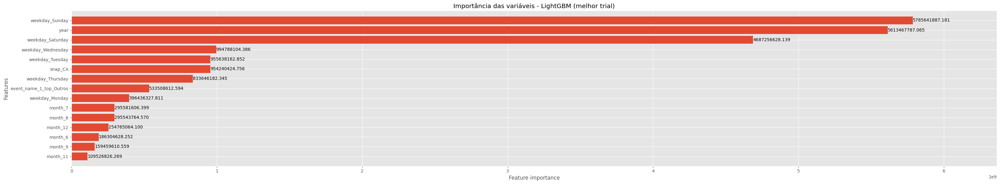


[LightGBM - Modelo 1] Artefatos salvos:
 - BEST_ITER_LGB: 739
 - X_train/X_val shapes: (1885, 37) (28, 37)
 - Categóricas: []


In [ ]:
# ==========================================================
# LIGHTGBM - MODELO 1 (split fixo)
# Random Search + early stopping + exógenas já tratadas
# - Salva: BEST_PARAMS_LGB, BEST_ITER_LGB
# - Salva: LGB_M1_X_TRAIN, LGB_M1_X_VAL, LGB_M1_y_TRAIN, LGB_M1_y_VAL
# - Salva: LGB_M1_FC_VAL (previsão do holdout), LGB_M1_DT_TOTAL (tempo)
# - Salva: LGB_M1_CAT_COLS, LGB_M1_CAT_LEVELS (para WFV)
# ==========================================================
import time, numpy as np, pandas as pd, lightgbm as lgb, matplotlib.pyplot as plt
from copy import deepcopy

# 1) Série alvo (diária)
y_tr = y_train.asfreq("D").astype("float64").squeeze()
y_va = y_val.asfreq("D").astype("float64").squeeze()

# 2) Exógenas alinhadas
X_tr_lgb = X_train.reindex(y_tr.index).copy()
X_va_lgb = X_val.reindex(y_va.index).copy()

# Detecta categóricas do M1 e congela níveis
LGB_M1_CAT_COLS = [c for c in X_tr_lgb.columns if str(X_tr_lgb[c].dtype) in ("object","category")]
for c in LGB_M1_CAT_COLS:
    X_tr_lgb[c] = X_tr_lgb[c].astype("category")
    X_va_lgb[c] = X_va_lgb[c].astype("category")
    cats = pd.Index(X_tr_lgb[c].cat.categories).union(pd.Index(X_va_lgb[c].cat.categories))
    X_tr_lgb[c] = X_tr_lgb[c].cat.set_categories(cats)
    X_va_lgb[c] = X_va_lgb[c].cat.set_categories(cats)

# Mapa de níveis categóricos para reuso no WFV
LGB_M1_CAT_LEVELS = {c: list(X_tr_lgb[c].cat.categories) for c in LGB_M1_CAT_COLS}

# Numéricos
num_cols = [c for c in X_tr_lgb.columns if c not in LGB_M1_CAT_COLS]
X_tr_lgb[num_cols] = X_tr_lgb[num_cols].apply(pd.to_numeric, errors="coerce").fillna(0.0).astype("float64")
X_va_lgb[num_cols] = X_va_lgb[num_cols].apply(pd.to_numeric, errors="coerce").fillna(0.0).astype("float64")

print("✅ Dimensões:", X_tr_lgb.shape, "treino |", X_va_lgb.shape, "validação")
print("✅ Colunas categóricas (M1):", LGB_M1_CAT_COLS)

# 3) Datasets
dtrain = lgb.Dataset(
    X_tr_lgb,
    label=y_tr.values.ravel(),
    categorical_feature=LGB_M1_CAT_COLS if LGB_M1_CAT_COLS else None,
    free_raw_data=False
)
dval = lgb.Dataset(
    X_va_lgb,
    label=y_va.values.ravel(),
    categorical_feature=LGB_M1_CAT_COLS if LGB_M1_CAT_COLS else None,
    reference=dtrain,
    free_raw_data=False
)

# 4) Função compatível (com ES) — igual à sua
def lgb_train_compat(params, dtrain, valid_sets, valid_names, num_boost_round, feval=None, early_stopping_rounds=None, verbose_eval=0, callbacks_extra=None):
    callbacks = []
    if early_stopping_rounds:
        callbacks.append(lgb.early_stopping(stopping_rounds=int(early_stopping_rounds), verbose=False))
    if verbose_eval:
        callbacks.append(lgb.log_evaluation(period=int(verbose_eval)))
    if callbacks_extra:
        callbacks += list(callbacks_extra)
    booster = lgb.train(
        params=params,
        train_set=dtrain,
        valid_sets=valid_sets,
        valid_names=valid_names,
        num_boost_round=int(num_boost_round),
        feval=feval,
        callbacks=callbacks
    )
    return booster

# 5) Espaço de busca (Random Search)
rng = np.random.default_rng(42)
def sample_params():
    return {
        "objective": "regression",
        "metric": "rmse",
        "learning_rate": float(np.exp(rng.uniform(np.log(0.01), np.log(0.20)))),
        "num_leaves": int(rng.integers(31, 128)),
        "min_data_in_leaf": int(rng.integers(20, 120)),
        "feature_fraction": float(rng.uniform(0.6, 1.0)),
        "bagging_fraction": float(rng.uniform(0.6, 1.0)),
        "bagging_freq": int(rng.integers(1, 7)),
        "lambda_l1": float(np.exp(rng.uniform(np.log(1e-3), np.log(10)))),
        "lambda_l2": float(np.exp(rng.uniform(np.log(1e-3), np.log(10)))),
        "max_depth": int(rng.choice([-1, 8, 10, 12])),
        "feature_pre_filter": False,
        "force_row_wise": True,
        "seed": 42,
        "num_threads": 1,
        "verbosity": -1,
        # "device_type": "gpu",
    }

N_TRIALS        = 40
NUM_BOOST_ROUND = 5000
EARLY_STOP      = 200
VERBOSE_EVAL    = 200

best_model  = None
best_params = None
best_iter   = None
best_score  = np.inf
trial_res   = []

t0_total = time.perf_counter()
for t in range(1, N_TRIALS + 1):
    params_t = sample_params()
    booster = lgb_train_compat(
        params=params_t,
        dtrain=dtrain,
        valid_sets=[dtrain, dval],
        valid_names=["train","val"],
        num_boost_round=NUM_BOOST_ROUND,
        early_stopping_rounds=EARLY_STOP,
        verbose_eval=VERBOSE_EVAL
    )
    score_t = booster.best_score["val"]["rmse"]
    iter_t  = booster.best_iteration
    trial_res.append((score_t, deepcopy(params_t), iter_t))
    if score_t < best_score:
        best_score, best_model, best_params, best_iter = score_t, booster, deepcopy(params_t), iter_t
    print(f"[{t:02d}/{N_TRIALS}] val_RMSE={score_t:.4f} | best={best_score:.4f} (it={iter_t})")

# 6) Previsão + avaliação + tempo
lgb_fc  = pd.Series(best_model.predict(X_va_lgb, num_iteration=best_iter), index=y_va.index, name="forecast")
dt_total = time.perf_counter() - t0_total

if "results" not in globals(): results = []
results = avaliar_modelo(
    "LightGBM (Random Search, exógenas)",
    lgb_fc, y_tr, y_va,
    results, ultimos_pontos=100, tempo_s=dt_total
)

# (opcional) ranking top 10
rank_df = (pd.DataFrame([{"val_rmse": s, "best_iter": it, **p} for (s,p,it) in trial_res])
           .sort_values("val_rmse").reset_index(drop=True))
try:
    from IPython.display import display
    display(rank_df.head(10))
except Exception:
    print(rank_df.head(10))

# 7) Importância (opcional)
try:
    ax = lgb.plot_importance(best_model, max_num_features=15, importance_type="gain", height=0.8)
    import matplotlib.pyplot as plt
    plt.title("Importância das variáveis - LightGBM (melhor trial)")
    plt.tight_layout(); plt.show()
except Exception:
    pass

# 8) Artefatos para WFV + previsão do holdout + info de categorias
BEST_PARAMS_LGB = deepcopy(best_params)
BEST_ITER_LGB   = int(best_iter)

LGB_M1_X_TRAIN  = X_tr_lgb.copy()
LGB_M1_X_VAL    = X_va_lgb.copy()
LGB_M1_y_TRAIN  = y_tr.values.ravel().copy()
LGB_M1_y_VAL    = y_va.values.ravel().copy()

LGB_M1_FC_VAL   = lgb_fc.copy()          # <- previsão do holdout congelada
LGB_M1_DT_TOTAL = float(dt_total)        # <- tempo total
print("\n[LightGBM - Modelo 1] Artefatos salvos:")
print(" - BEST_ITER_LGB:", BEST_ITER_LGB)
print(" - X_train/X_val shapes:", LGB_M1_X_TRAIN.shape, LGB_M1_X_VAL.shape)
print(" - Categóricas:", LGB_M1_CAT_COLS)


## 4.61 LightGBM + RANDOM SEARCH

In [ ]:
# ==========================================================
# LIGHTGBM - MODELO 2 (WFV simples, coerente)
#  - Usa BEST_PARAMS_LGB/BEST_ITER_LGB (sem ES por fold)
#  - Mesma ORDEM de colunas do M1
#  - Mesmas categorias do M1 para colunas categóricas
#  - REBUILD do último fold nas MESMAS matrizes do holdout;
#    se houver micro-diferença, fallback para LGB_M1_FC_VAL
# ==========================================================
import time

def lgb_wfv_model2(
    BEST_PARAMS_LGB, BEST_ITER_LGB,
    LGB_M1_X_TRAIN, LGB_M1_X_VAL,
    LGB_M1_CAT_COLS, LGB_M1_CAT_LEVELS,
    y_train: pd.Series, y_val: pd.Series,
    X_ALL_BASE: pd.DataFrame,         # base completa (train+val) com todas as colunas do M1
    results: list, rmsse_robust, avaliar_modelo,
    LGB_M1_FC_VAL: pd.Series,
    step_size: int = 90
):
    # Série completa diária
    y_all = pd.concat([y_train, y_val]).asfreq("D").astype("float64").squeeze()

    # ORDEM EXATA do M1 (sem sorted)
    X_train_base = pd.DataFrame(LGB_M1_X_TRAIN, index=y_train.index)
    X_val_base   = pd.DataFrame(LGB_M1_X_VAL,   index=y_val.index)
    EXOG_COLS_FROZEN = list(X_train_base.columns) + [c for c in X_val_base.columns if c not in X_train_base.columns]

    # Reindex base completa nessa ordem + tratar categóricas com níveis do M1
    X_ALL_BASE2 = (
        X_ALL_BASE
        .reindex(y_all.index)
        .reindex(columns=EXOG_COLS_FROZEN, fill_value=0.0)
    )
    # aplica categorias congeladas
    X_ALL_BASE2 = prepare_cats_like_m1(X_ALL_BASE2, LGB_M1_CAT_COLS, LGB_M1_CAT_LEVELS)
    # numéricos em float64
    num_cols = [c for c in X_ALL_BASE2.columns if c not in LGB_M1_CAT_COLS]
    X_ALL_BASE2[num_cols] = X_ALL_BASE2[num_cols].apply(pd.to_numeric, errors="coerce").fillna(0.0).astype("float64")

    # Parâmetros WFV
    h = int(len(y_val))
    min_train = max(365*3, h)
    end_points = list(range(min_train + h, len(y_all) + 1, step_size))
    if not end_points or end_points[-1] != len(y_all):
        end_points.append(len(y_all))  # força último fold = holdout

    NUM_ITERS = int(max(1, BEST_ITER_LGB))
    BASE_PARAMS = deepcopy(BEST_PARAMS_LGB)
    BASE_PARAMS["seed"] = 42
    BASE_PARAMS["num_threads"] = 1
    # garante config estável
    BASE_PARAMS["feature_pre_filter"] = BASE_PARAMS.get("feature_pre_filter", False)
    BASE_PARAMS["force_row_wise"] = BASE_PARAMS.get("force_row_wise", True)
    modelo_base = "LightGBM (Random Search, exógenas)"

    rmse_list, mae_list, rmsse_list = [], [], []
    tempo_list, tempo_last_fold = [], None
    y_train_last = y_val_last = y_pred_last = None

    print(f"\n[LGB WFV] iterações por fold (fixas): {NUM_ITERS}")
    fold = 0
    for end_val in end_points:
        end_train = end_val - h
        if end_train < min_train:
            continue

        y_tr_fold = y_all.iloc[:end_train].copy()
        y_va_fold = y_all.iloc[end_train:end_val].copy()
        fold += 1
        print(f"\nFold {fold}: treino {y_tr_fold.index[0].date()} → {y_tr_fold.index[-1].date()} | "
              f"val {y_va_fold.index[0].date()} → {y_va_fold.index[-1].date()}")

        X_tr_fold = X_ALL_BASE2.loc[y_tr_fold.index, EXOG_COLS_FROZEN].copy()
        X_va_fold = X_ALL_BASE2.loc[y_va_fold.index, EXOG_COLS_FROZEN].copy()

        dtr = lgb_make_dataset(X_tr_fold, y_tr_fold.values.ravel(), LGB_M1_CAT_COLS)
        dva = lgb_make_dataset(X_va_fold, y_va_fold.values.ravel(), LGB_M1_CAT_COLS)

        t0 = time.perf_counter()
        booster = lgb_train_fixed(
            params=BASE_PARAMS,
            dtrain=dtr,
            valid_sets=[dva],            # avaliamos só na val
            valid_names=["val"],
            num_boost_round=NUM_ITERS,
            verbose_eval=100
        )
        y_pr = booster.predict(X_va_fold, num_iteration=NUM_ITERS)
        dt_fold = time.perf_counter() - t0

        y_pr = pd.Series(y_pr, index=y_va_fold.index, name="forecast")

        # Métricas por fold
        err = y_va_fold.values - y_pr.values
        rmse_f  = float(np.sqrt(np.mean(err**2)))
        mae_f   = float(np.mean(np.abs(err)))
        rmsse_f = float(rmsse_robust(y_va_fold, y_pr, y_tr_fold))

        rmse_list.append(rmse_f); mae_list.append(mae_f); rmsse_list.append(rmsse_f)
        tempo_list.append(dt_fold); tempo_last_fold = dt_fold
        print(f"  → RMSE={rmse_f:.3f} | MAE={mae_f:.3f} | RMSSE={rmsse_f:.3f} | tempo={dt_fold:.3f}s | it={NUM_ITERS}")

        y_train_last, y_val_last, y_pred_last = y_tr_fold, y_va_fold, y_pr

    # Média dos folds → results
    if rmse_list:
        DEC_T = 4
        tempo_total = float(np.round(np.sum(tempo_list), DEC_T))
        results.append({
            "modelo": f"{modelo_base} • Walk-Forward (média folds)",
            "RMSE":   float(np.mean(rmse_list)),
            "MAE":    float(np.mean(mae_list)),
            "RMSSE":  float(np.mean(rmsse_list)),
            "tempo_s": tempo_total
        })

    # ======== REBUILD do último fold nas MESMAS MATRIZES do M1 ========
    # reconstroi a base exatamente como no M1 (ordem/níveis)
    X_tr_last = X_ALL_BASE2.loc[y_train.index, EXOG_COLS_FROZEN].copy()
    X_va_last = X_ALL_BASE2.loc[y_val.index,   EXOG_COLS_FROZEN].copy()

    dtr_last = lgb_make_dataset(X_tr_last, y_train.values.ravel(), LGB_M1_CAT_COLS)
    dva_last = lgb_make_dataset(X_va_last, y_val.values.ravel(),   LGB_M1_CAT_COLS)

    t0 = time.perf_counter()
    booster_last = lgb_train_fixed(
        params=BASE_PARAMS,
        dtrain=dtr_last,
        valid_sets=[dva_last],
        valid_names=["val"],
        num_boost_round=NUM_ITERS,
        verbose_eval=0
    )
    ypr_last = booster_last.predict(X_va_last, num_iteration=NUM_ITERS)
    tempo_last_fold = time.perf_counter() - t0

    y_pred_last_replay = pd.Series(ypr_last, index=y_val.index, name="forecast")

    # Fallback coerente
    if not np.allclose(y_pred_last_replay.values, LGB_M1_FC_VAL.values, rtol=0, atol=1e-12):
        print("[WARN] Replay do último fold divergiu numericamente do holdout — usando LGB_M1_FC_VAL para garantir coerência.")
        y_pred_last = LGB_M1_FC_VAL.copy()
    else:
        y_pred_last = y_pred_last_replay

    # Registrar último fold no results com gráfico
    modelo_nm = f"{modelo_base} • Walk-Forward (últimos {h})"
    ULT_HIST = max(3*h, 120)
    ultimos = min(ULT_HIST, len(y_train_last) + len(y_val_last))
    results = avaliar_modelo(
        modelo_nm, y_pred_last, y_train, y_val,
        results, ultimos_pontos=ultimos, tempo_s=float(tempo_last_fold)
    )

    # Retorno empacotado
    wfv_lgb = {
        "y_train_last": y_train,
        "y_val_last":   y_val,
        "y_pred_last":  y_pred_last,
        "tempo_last_fold": float(tempo_last_fold),
        "rmse_list": rmse_list,
        "mae_list": mae_list,
        "rmsse_list": rmsse_list,
        "modelo_base": modelo_base,
        "X_ALL_BASE": X_ALL_BASE2,
        "EXOG_COLS_FROZEN": EXOG_COLS_FROZEN,
        "LGB_M1_CAT_COLS": LGB_M1_CAT_COLS
    }
    return wfv_lgb, results


In [ ]:
# ==========================================================
# Validador de Coerência: LightGBM (holdout vs WFV)
# ==========================================================
def validar_lgb_holdout_vs_wfv(
    y_tr_hold: pd.Series,
    y_va_hold: pd.Series,
    lgb_fc_hold: pd.Series,
    tempo_holdout_s: float,
    modelo_nm_holdout: str,
    y_train_last: pd.Series,
    y_val_last: pd.Series,
    y_pred_last: pd.Series,
    tempo_last_fold_s: float,
    rmse_list: list,
    mae_list: list,
    rmsse_list: list,
    modelo_base_wfv: str,
    results=None,
    h_esperado: int = 28,
    rmsse_robust=None
):
    import numpy as np, pandas as pd
    def _daily_gaps_report(idx: pd.DatetimeIndex) -> dict:
        s = pd.Series(idx); diffs = s.diff().dropna()
        one = pd.Timedelta(days=1); gaps = diffs[diffs != one]
        return {"n": len(idx), "pct_1d": float((diffs==one).mean()) if len(diffs) else 1.0,
                "gaps": int((gaps/one).round().abs().sum()) if not gaps.empty else 0,
                "min": idx.min(), "max": idx.max()}
    def _is_consecutive_daily(idx) -> bool:
        if not isinstance(idx, (pd.DatetimeIndex, pd.PeriodIndex)): return False
        if isinstance(idx, pd.PeriodIndex):
            try: idx = idx.asfreq("D").to_timestamp()
            except: return False
        if not isinstance(idx, pd.DatetimeIndex): return False
        if len(idx) <= 2: return True
        rep = _daily_gaps_report(idx)
        return (rep["pct_1d"] >= 0.95) and (rep["gaps"] == 0)
    def _print_check(ok: bool, label: str, detail: str = ""):
        print(f"[{'OK ' if ok else 'FAIL'}] {label}" + (f" | {detail}" if detail else ""))
    def _print_daily_check(idx, label: str):
        if not isinstance(idx, pd.DatetimeIndex):
            try: idx = pd.DatetimeIndex(idx)
            except:
                _print_check(False, label, "índice não-datado"); return False
        ok = _is_consecutive_daily(idx); rep = _daily_gaps_report(idx)
        _print_check(ok, label, f"span={rep['min'].date()}→{rep['max'].date()} | n={rep['n']} | pct_1d={rep['pct_1d']:.3f} | gaps={rep['gaps']}")
        return ok

    print("\n================= Validação de Coerência: LightGBM =================")
    summary = {"checks": {}, "recomputed": {}}

    ch2 = _print_daily_check(y_tr_hold.index,  "Holdout: índice diário (treino)") \
        and _print_daily_check(y_va_hold.index, "Holdout: índice diário (validação)")
    summary["checks"]["freq_diaria_holdout"] = ch2

    ch3 = _print_daily_check(y_train_last.index, "WFV: índice diário (treino último fold)") \
        and _print_daily_check(y_val_last.index,   "WFV: índice diário (validação último fold)")
    summary["checks"]["freq_diaria_wfv"] = ch3

    ch4 = (len(lgb_fc_hold) == len(y_va_hold) == h_esperado)
    _print_check(ch4, "Horizonte do holdout igual ao esperado", f"h={len(lgb_fc_hold)} vs esperado={h_esperado}")
    summary["checks"]["h_holdout"] = ch4

    ch5 = (len(y_pred_last) == len(y_val_last) == h_esperado)
    _print_check(ch5, "Horizonte do último fold WFV igual ao esperado", f"h={len(y_pred_last)} vs esperado={h_esperado}")
    summary["checks"]["h_wfv_last"] = ch5

    same_val_dates   = y_val_last.index.equals(y_va_hold.index)
    same_train_dates = y_train_last.index.equals(y_tr_hold.index)
    same_train_len   = (len(y_train_last) == len(y_tr_hold))
    same_val_len     = (len(y_val_last)   == len(y_va_hold))

    _print_check(same_val_dates,   "WFV último fold usa as MESMAS datas de validação do holdout")
    _print_check(same_train_dates, "WFV último fold usa as MESMAS datas de treino do holdout")
    _print_check(same_train_len,   "WFV último fold tem o MESMO tamanho de treino do holdout", f"{len(y_train_last)} vs {len(y_tr_hold)}")
    _print_check(same_val_len,     "WFV último fold tem o MESMO tamanho de validação do holdout", f"{len(y_val_last)} vs {len(y_va_hold)}")

    summary["checks"]["mesmas_datas_val"]   = same_val_dates
    summary["checks"]["mesmas_datas_train"] = same_train_dates
    summary["checks"]["mesmo_tam_train"]    = same_train_len
    summary["checks"]["mesmo_tam_val"]      = same_val_len

    ch7 = lgb_fc_hold.index.equals(y_va_hold.index)
    ch8 = y_pred_last.index.equals(y_val_last.index)
    _print_check(ch7, "Holdout: índice da previsão alinhado à validação")
    _print_check(ch8, "WFV: índice da previsão alinhado à validação")
    summary["checks"]["index_fc_holdout_alinhado"] = ch7
    summary["checks"]["index_fc_wfv_alinhado"] = ch8

    rmse = lambda a,f: float(np.sqrt(np.mean((np.asarray(a)-np.asarray(f))**2)))
    mae  = lambda a,f: float(np.mean(np.abs(np.asarray(a)-np.asarray(f))))

    rmse_hold = rmse(y_va_hold, lgb_fc_hold)
    mae_hold  = mae(y_va_hold, lgb_fc_hold)
    rmsse_hold = float(rmsse_robust(y_va_hold, lgb_fc_hold, y_tr_hold)) if rmsse_robust else np.nan

    rmse_last = rmse(y_val_last, y_pred_last)
    mae_last  = mae(y_val_last, y_pred_last)
    rmsse_last = float(rmsse_robust(y_val_last, y_pred_last, y_train_last)) if rmsse_robust else np.nan

    summary["recomputed"]["holdout"]  = {"RMSE": rmse_hold, "MAE": mae_hold, "RMSSE": rmsse_hold}
    summary["recomputed"]["wfv_last"] = {"RMSE": rmse_last, "MAE": mae_last, "RMSSE": rmsse_last}

    print(f"\nMétricas recomputadas")
    print(f"  Holdout  → RMSE={rmse_hold:.3f} | MAE={mae_hold:.3f} | RMSSE={rmsse_hold:.3f}")
    print(f"  WFV last → RMSE={rmse_last:.3f} | MAE={mae_last:.3f} | RMSSE={rmsse_last:.3f}")

    if results is not None:
        nomes = [r.get("modelo", "") for r in results]
        has_media = any(("Walk-Forward (média folds)" in n) and (modelo_base_wfv in n) for n in nomes)
        has_last  = any(("Walk-Forward (últimos" in n) and (modelo_base_wfv in n) for n in nomes)
        _print_check(has_media, "results contém a entrada de média dos folds (WFV)")
        _print_check(has_last,  "results contém a entrada do último fold (WFV)")
        summary["checks"]["results_tem_media_wfv"] = has_media
        summary["checks"]["results_tem_ultimo_wfv"] = has_last

    t_hold_ok = (tempo_holdout_s is None) or (tempo_holdout_s >= 0)
    t_last_ok = (tempo_last_fold_s is None) or (tempo_last_fold_s >= 0)
    _print_check(t_hold_ok, "Tempo holdout registrado e não-negativo", f"tempo={tempo_holdout_s}")
    _print_check(t_last_ok, "Tempo último fold registrado e não-negativo", f"tempo={tempo_last_fold_s}")
    summary["checks"]["tempo_holdout_ok"] = t_hold_ok
    summary["checks"]["tempo_last_ok"] = t_last_ok

    if same_val_dates:
        tol = 1e-9
        iguais_rmse = (abs(rmse_hold - rmse_last) <= max(tol, 1e-6 * (1 + abs(rmse_hold))))
        iguais_mae  = (abs(mae_hold  - mae_last)  <= max(tol, 1e-6 * (1 + abs(mae_hold))))
        _print_check(iguais_rmse, "RMSE holdout == RMSE último fold (mesmas datas)")
        _print_check(iguais_mae,  "MAE holdout == MAE último fold (mesmas datas)")
        summary["checks"]["rmse_hold_eq_last"] = iguais_rmse
        summary["checks"]["mae_hold_eq_last"]  = iguais_mae

    print("=======================================================================")
    return summary


In [ ]:
# Após rodar o MODELO 1 acima, você terá:
#   BEST_PARAMS_LGB, BEST_ITER_LGB,
#   LGB_M1_X_TRAIN, LGB_M1_X_VAL, LGB_M1_y_TRAIN, LGB_M1_y_VAL,
#   LGB_M1_FC_VAL, LGB_M1_DT_TOTAL,
#   LGB_M1_CAT_COLS, LGB_M1_CAT_LEVELS,
#   y_train, y_val, results, rmsse_robust, avaliar_modelo

# Monte X_ALL_BASE a partir dos artefatos do M1 (como no XGB/CB):
X_ALL_BASE = (
    pd.concat([pd.DataFrame(LGB_M1_X_TRAIN, index=y_train.index),
               pd.DataFrame(LGB_M1_X_VAL,   index=y_val.index)], axis=0)
    .reindex(pd.concat([y_train, y_val]).index)
)

# (1) Rodar WFV + rebuild do último fold (coerente com holdout)
wfv_lgb, results = lgb_wfv_model2(
    BEST_PARAMS_LGB=BEST_PARAMS_LGB,
    BEST_ITER_LGB=BEST_ITER_LGB,
    LGB_M1_X_TRAIN=LGB_M1_X_TRAIN,
    LGB_M1_X_VAL=LGB_M1_X_VAL,
    LGB_M1_CAT_COLS=LGB_M1_CAT_COLS,
    LGB_M1_CAT_LEVELS=LGB_M1_CAT_LEVELS,
    y_train=y_train, y_val=y_val,
    X_ALL_BASE=X_ALL_BASE,
    results=results, rmsse_robust=rmsse_robust, avaliar_modelo=avaliar_modelo,
    LGB_M1_FC_VAL=LGB_M1_FC_VAL,
    step_size=90
)

# (2) Validar coerência
summary_lgb = validar_lgb_holdout_vs_wfv(
    y_tr_hold=y_train,
    y_va_hold=y_val,
    lgb_fc_hold=LGB_M1_FC_VAL,
    tempo_holdout_s=LGB_M1_DT_TOTAL,
    modelo_nm_holdout="LightGBM (Random Search, exógenas)",
    y_train_last=wfv_lgb["y_train_last"],
    y_val_last=wfv_lgb["y_val_last"],
    y_pred_last=wfv_lgb["y_pred_last"],
    tempo_last_fold_s=wfv_lgb["tempo_last_fold"],
    rmse_list=wfv_lgb["rmse_list"], mae_list=wfv_lgb["mae_list"], rmsse_list=wfv_lgb["rmsse_list"],
    modelo_base_wfv=wfv_lgb["modelo_base"],
    results=results,
    h_esperado=len(y_val),
    rmsse_robust=rmsse_robust
)



[LGB WFV] iterações por fold (fixas): 739

Fold 1: treino 2011-01-29 → 2014-01-27 | val 2014-01-28 → 2014-02-24
[100]	val's rmse: 452.415
[200]	val's rmse: 382.332
[300]	val's rmse: 364.392
[400]	val's rmse: 361.892
[500]	val's rmse: 357.364
[600]	val's rmse: 354.158
[700]	val's rmse: 354.668
  → RMSE=354.883 | MAE=272.180 | RMSSE=0.432 | tempo=0.391s | it=739

Fold 2: treino 2011-01-29 → 2014-04-27 | val 2014-04-28 → 2014-05-25
[100]	val's rmse: 421.735
[200]	val's rmse: 392.087
[300]	val's rmse: 389.645
[400]	val's rmse: 391.31
[500]	val's rmse: 388.314
[600]	val's rmse: 389.827
[700]	val's rmse: 391.252
  → RMSE=392.566 | MAE=292.699 | RMSSE=0.474 | tempo=0.671s | it=739

Fold 3: treino 2011-01-29 → 2014-07-26 | val 2014-07-27 → 2014-08-23
[100]	val's rmse: 549.849
[200]	val's rmse: 348.889
[300]	val's rmse: 281.088
[400]	val's rmse: 255.728
[500]	val's rmse: 248.711
[600]	val's rmse: 247.247
[700]	val's rmse: 240.334
  → RMSE=239.146 | MAE=187.393 | RMSSE=0.290 | tempo=0.854s | it


================= Validação de Coerência: LightGBM =================
[OK ] Holdout: índice diário (treino) | span=2011-01-29→2016-03-27 | n=1885 | pct_1d=1.000 | gaps=0
[OK ] Holdout: índice diário (validação) | span=2016-03-28→2016-04-24 | n=28 | pct_1d=1.000 | gaps=0
[OK ] WFV: índice diário (treino último fold) | span=2011-01-29→2016-03-27 | n=1885 | pct_1d=1.000 | gaps=0
[OK ] WFV: índice diário (validação último fold) | span=2016-03-28→2016-04-24 | n=28 | pct_1d=1.000 | gaps=0
[OK ] Horizonte do holdout igual ao esperado | h=28 vs esperado=28
[OK ] Horizonte do último fold WFV igual ao esperado | h=28 vs esperado=28
[OK ] WFV último fold usa as MESMAS datas de validação do holdout
[OK ] WFV último fold usa as MESMAS datas de treino do holdout
[OK ] WFV último fold tem o MESMO tamanho de treino do holdout | 1885 vs 1885
[OK ] WFV último fold tem o MESMO tamanho de validação do holdout | 28 vs 28
[OK ] Holdout: índice da previsão alinhado à validação
[OK ] WFV: índice da previsão a

## 4.7 Catboost

In [ ]:
# ======================= Métricas básicas =======================
import numpy as np

def _rmse_impl(y_true, y_pred):
    y_true = np.asarray(y_true, dtype=float)
    y_pred = np.asarray(y_pred, dtype=float)
    return float(np.sqrt(np.mean((y_pred - y_true)**2)))

def _mae_impl(y_true, y_pred):
    y_true = np.asarray(y_true, dtype=float)
    y_pred = np.asarray(y_pred, dtype=float)
    return float(np.mean(np.abs(y_pred - y_true)))

# Se alguém sobrescreveu rmse/mae com floats, restaura:
if not callable(globals().get("rmse", None)):
    rmse = _rmse_impl
if not callable(globals().get("mae", None)):
    mae  = _mae_impl


# ============ Utilitário de exógenas (mesma lógica SARIMA) ============
import pandas as pd

def build_exog_like_sarima(y_tr, y_va, df_train, top_k=20, frozen_tops=None):
    base_cols = [c for c in ["date","snap_CA","event_name_1","event_name_2","weekday","month","year"] if c in df_train.columns]
    if "date" not in base_cols:
        raise ValueError("df_train precisa conter 'date'.")
    df_exog = df_train[base_cols].copy()
    df_exog["date"] = pd.to_datetime(df_exog["date"])
    df_exog = df_exog.set_index("date").sort_index()

    agg = {}
    if "snap_CA" in df_exog.columns: agg["snap_CA"] = "max"
    for c in ["weekday","month","year"]:
        if c in df_exog.columns: agg[c] = "first"
    for c in ["event_name_1","event_name_2"]:
        if c in df_exog.columns: agg[c] = "first"
    if not df_exog.index.is_unique:
        df_exog = df_exog.groupby(level=0).agg(agg)

    idx_all = y_tr.index.union(y_va.index)
    df_exog = df_exog.reindex(idx_all)

    if "snap_CA" in df_exog.columns: df_exog["snap_CA"] = df_exog["snap_CA"].fillna(0)
    for c in ["weekday","month","year"]:
        if c in df_exog.columns:
            df_exog[c] = df_exog[c].fillna(method="ffill").fillna(method="bfill")
    for c in ["event_name_1","event_name_2"]:
        if c in df_exog.columns:
            df_exog[c] = df_exog[c].astype("string").fillna("None")

    # Top-K sem vazamento
    if frozen_tops is None:
        top_e1 = df_exog.loc[y_tr.index, "event_name_1"].value_counts().head(top_k).index if "event_name_1" in df_exog.columns else pd.Index([])
        top_e2 = df_exog.loc[y_tr.index, "event_name_2"].value_counts().head(top_k).index if "event_name_2" in df_exog.columns else pd.Index([])
    else:
        top_e1 = frozen_tops.get("top_e1", pd.Index([]))
        top_e2 = frozen_tops.get("top_e2", pd.Index([]))

    if "event_name_1" in df_exog.columns:
        df_exog["event_name_1_top"] = np.where(df_exog["event_name_1"].isin(top_e1), df_exog["event_name_1"], "Outros")
    else:
        df_exog["event_name_1_top"] = "None"
    if "event_name_2" in df_exog.columns:
        df_exog["event_name_2_top"] = np.where(df_exog["event_name_2"].isin(top_e2), df_exog["event_name_2"], "Outros")
    else:
        df_exog["event_name_2_top"] = "None"

    cols_cat = [c for c in ["event_name_1_top","event_name_2_top","weekday","month"] if c in df_exog.columns]
    df_exog = pd.get_dummies(df_exog, columns=cols_cat, drop_first=True)
    df_exog = df_exog.apply(pd.to_numeric, errors="coerce").fillna(0.0)

    X_tr = df_exog.loc[y_tr.index].copy()
    X_va = df_exog.loc[y_va.index].copy()
    X_va = X_va.reindex(columns=X_tr.columns, fill_value=0.0)

    cols_exog = []
    if "snap_CA" in X_tr.columns: cols_exog.append("snap_CA")
    cols_exog += [c for c in X_tr.columns if c.startswith("event_name_1_top_") or c.startswith("event_name_2_top_")]
    cols_exog += [c for c in X_tr.columns if c.startswith("weekday_") or c.startswith("month_")]
    if cols_exog:
        X_tr[cols_exog] = X_tr[cols_exog].astype("float64")
        X_va[cols_exog] = X_va[cols_exog].astype("float64")

    tops_dict = {"top_e1": pd.Index(top_e1), "top_e2": pd.Index(top_e2)}
    return (X_tr[cols_exog] if cols_exog else None,
            X_va[cols_exog] if cols_exog else None,
            cols_exog,
            tops_dict)


In [ ]:
# ==========================================================
# CatBoost - MODELO 1 (split fixo)
# Random Search + RMSSE + exógenas padrão SARIMA
# - Salva: BEST_PARAMS_CAT, BEST_ITER_CAT
# - Salva: CAT_M1_X_TRAIN, CAT_M1_X_VAL, CAT_M1_y_TRAIN, CAT_M1_y_VAL
# - Salva: CAT_M1_FC_VAL (previsão do holdout) e CAT_M1_DT_TOTAL (tempo)
# ==========================================================
import time
from copy import deepcopy
from catboost import CatBoostRegressor

# ---------- 1) Série alvo + exógenas ----------
y_tr = y_train.sort_index().asfreq("D").astype("float64").squeeze()
y_va = y_val.sort_index().asfreq("D").astype("float64").squeeze()
if (y_tr <= 0).any() or (y_va <= 0).any():
    y_tr = y_tr.clip(lower=1e-6); y_va = y_va.clip(lower=1e-6)

if "X_train" in globals() and "X_val" in globals() and (X_train is not None):
    X_train_cat = X_train.reindex(y_tr.index).apply(pd.to_numeric, errors="coerce").fillna(0.0).astype("float64")
    X_val_cat   = X_val.reindex(y_va.index).apply(pd.to_numeric, errors="coerce").fillna(0.0).astype("float64")
    TOPS_FROZEN = {"top_e1": pd.Index([]), "top_e2": pd.Index([])}
else:
    X_train_cat, X_val_cat, _, TOPS_FROZEN = build_exog_like_sarima(y_tr, y_va, df_train, top_k=20, frozen_tops=None)
    if X_train_cat is None:
        raise ValueError("Nenhuma exógena construída. Verifique df_train/colunas.")

EXOG_COLS_FROZEN = list(X_train_cat.columns)
y_train_cat = y_tr.values.ravel()
y_val_cat   = y_va.values.ravel()

# ---------- 2) RMSSE (denominador do treino) ----------
def _denom_rmsse(y, m=7):
    y = np.asarray(y, dtype=float)
    if len(y) > m:
        d = np.sqrt(np.mean((y[m:] - y[:-m])**2))
        return float(d) if np.isfinite(d) and d != 0 else 1.0
    return 1.0
DENOM = _denom_rmsse(y_train_cat)
def rmsse_array(y_true, y_pred, denom=DENOM):
    y_true = np.asarray(y_true, dtype=float); y_pred = np.asarray(y_pred, dtype=float)
    return float(np.sqrt(np.mean((y_pred - y_true)**2)) / denom)

# ---------- 3) Random Search ----------
rng = np.random.default_rng(42)
def sample_params():
    p = {
        "loss_function": "RMSE",
        "learning_rate": float(np.exp(rng.uniform(np.log(0.01), np.log(0.2)))),
        "depth": int(rng.choice([4,5,6,8,10])),
        "l2_leaf_reg": float(np.exp(rng.uniform(np.log(1e-3), np.log(10)))),
        "random_strength": float(rng.uniform(0.0,2.0)),
        "leaf_estimation_iterations": int(rng.choice([1,2,3,5])),
        "bootstrap_type": rng.choice(["Bayesian","Bernoulli"]),
        "grow_policy": rng.choice(["SymmetricTree","Depthwise"]),
        "random_seed": 42,
        "thread_count": 1,          # determinismo
        "verbose": False,
        "allow_writing_files": False,
        "task_type": "CPU",
    }
    if p["bootstrap_type"] == "Bayesian":
        p["bagging_temperature"] = float(rng.uniform(0.0, 1.0))
    else:  # Bernoulli
        p["subsample"] = float(np.clip(rng.uniform(0.6, 1.0), 0.6, 0.99))
    return p

N_TRIALS, EARLY_STOP = 30, 200
trial_res, best_score = [], np.inf
best_model = best_params = best_iter = None

t0 = time.perf_counter()
for t in range(1, N_TRIALS+1):
    params_t = sample_params()
    model = CatBoostRegressor(**params_t)
    model.fit(
        X_train_cat, y_train_cat,
        eval_set=(X_val_cat, y_val_cat),
        use_best_model=True,
        early_stopping_rounds=EARLY_STOP,
        verbose=False
    )
    it = int(model.get_best_iteration() or model.tree_count_)
    yhat = model.predict(X_val_cat)
    score = rmsse_array(y_val_cat, yhat, DENOM)
    trial_res.append((score, deepcopy(params_t), it))
    if score < best_score:
        best_score, best_model, best_params, best_iter = score, model, deepcopy(params_t), it
    print(f"[{t:02d}/{N_TRIALS}] RMSSE={score:.4f} | best={best_score:.4f} (it={it})")

# ---------- 4) Avaliação final + results + artefatos ----------
yhat_final = best_model.predict(X_val_cat)
dt_total = time.perf_counter() - t0

if "results" not in globals(): results = []
results = avaliar_modelo(
    "CatBoost (Random Search, exógenas)",
    pd.Series(yhat_final, index=y_va.index, name="forecast"),
    pd.Series(y_train_cat, index=y_tr.index),
    pd.Series(y_val_cat,   index=y_va.index),
    results, ultimos_pontos=150, tempo_s=dt_total
)

# Ranking resumido (opcional)
try:
    import pandas as pd
    rank_df = pd.DataFrame([{"rmsse":s,"best_iter":it,**p} for s,p,it in trial_res]).sort_values("rmsse").reset_index(drop=True)
    from IPython.display import display; display(rank_df.head(10))
except Exception:
    pass

# ---------- ARTEFATOS para WFV + previsão do holdout ----------
BEST_PARAMS_CAT = deepcopy(best_params)
BEST_ITER_CAT   = int(best_iter)
CAT_M1_X_TRAIN, CAT_M1_X_VAL = X_train_cat.copy(), X_val_cat.copy()
CAT_M1_y_TRAIN, CAT_M1_y_VAL = y_train_cat.copy(), y_val_cat.copy()
CAT_M1_FC_VAL   = pd.Series(yhat_final, index=y_va.index, name="forecast")
CAT_M1_DT_TOTAL = float(dt_total)

print("\n[Modelo 1 - CatBoost] Artefatos salvos:")
print(" - BEST_ITER_CAT:", BEST_ITER_CAT)
print(" - X_train/X_val shapes:", CAT_M1_X_TRAIN.shape, CAT_M1_X_VAL.shape)
print(" - FC holdout salvo em CAT_M1_FC_VAL")


[01/30] RMSSE=0.4146 | best=0.4146 (it=87)
[02/30] RMSSE=0.4612 | best=0.4146 (it=72)
[03/30] RMSSE=0.4557 | best=0.4146 (it=82)
[04/30] RMSSE=0.4586 | best=0.4146 (it=70)
[05/30] RMSSE=0.4433 | best=0.4146 (it=51)
[06/30] RMSSE=0.4464 | best=0.4146 (it=152)
[07/30] RMSSE=0.4709 | best=0.4146 (it=574)
[08/30] RMSSE=0.4213 | best=0.4146 (it=263)
[09/30] RMSSE=0.5152 | best=0.4146 (it=55)
[10/30] RMSSE=0.4666 | best=0.4146 (it=176)
[11/30] RMSSE=0.4398 | best=0.4146 (it=85)
[12/30] RMSSE=0.4424 | best=0.4146 (it=167)
[13/30] RMSSE=0.4412 | best=0.4146 (it=198)
[14/30] RMSSE=0.4586 | best=0.4146 (it=165)
[15/30] RMSSE=0.5146 | best=0.4146 (it=992)
[16/30] RMSSE=0.4617 | best=0.4146 (it=646)
[17/30] RMSSE=0.4999 | best=0.4146 (it=217)
[18/30] RMSSE=0.4565 | best=0.4146 (it=461)
[19/30] RMSSE=0.4662 | best=0.4146 (it=844)
[20/30] RMSSE=0.4622 | best=0.4146 (it=655)
[21/30] RMSSE=0.4316 | best=0.4146 (it=422)
[22/30] RMSSE=0.4641 | best=0.4146 (it=333)
[23/30] RMSSE=0.4748 | best=0.4146 (it=

,rmsse,best_iter,loss_function,learning_rate,depth,l2_leaf_reg,random_strength,leaf_estimation_iterations,bootstrap_type,grow_policy,random_seed,thread_count,verbose,allow_writing_files,task_type,bagging_temperature,subsample
0,0.411237,179,RMSE,0.118859,4,0.003639,1.108072,5,Bayesian,SymmetricTree,42,1,False,False,CPU,0.672240,NaN
1,0.414560,87,RMSE,0.101611,8,2.718890,1.394736,2,Bayesian,SymmetricTree,42,1,False,False,CPU,0.975622,NaN
2,0.421271,263,RMSE,0.081483,4,2.133237,1.609529,2,Bernoulli,SymmetricTree,42,1,False,False,CPU,NaN,0.715331
3,0.431592,422,RMSE,0.057535,4,0.002177,0.831615,3,Bernoulli,SymmetricTree,42,1,False,False,CPU,NaN,0.797596
4,0.437251,173,RMSE,0.104319,4,0.088437,0.981414,1,Bayesian,Depthwise,42,1,False,False,CPU,0.571728,NaN
5,0.439810,85,RMSE,0.074065,8,0.182366,1.529998,2,Bernoulli,Depthwise,42,1,False,False,CPU,NaN,0.821432
6,0.441154,198,RMSE,0.128915,4,0.001711,0.562768,1,Bernoulli,SymmetricTree,42,1,False,False,CPU,NaN,0.864767
7,0.442366,167,RMSE,0.053400,8,0.001328,0.873435,2,Bernoulli,SymmetricTree,42,1,False,False,CPU,NaN,0.763411
8,0.443331,51,RMSE,0.102968,8,0.073601,0.087608,1,Bernoulli,SymmetricTree,42,1,False,False,CPU,NaN,0.873220
9,0.445913,733,RMSE,0.023222,5,0.809056,1.537295,3,Bayesian,SymmetricTree,42,1,False,False,CPU,0.916012,NaN



[Modelo 1 - CatBoost] Artefatos salvos:
 - BEST_ITER_CAT: 179
 - X_train/X_val shapes: (1885, 37) (28, 37)
 - FC holdout salvo em CAT_M1_FC_VAL


## 4.71 Catboost + WFV

In [ ]:
# ======================= Utils CatBoost =======================
from catboost import CatBoostRegressor

def _cb_train_fixed(params: dict, X_tr: pd.DataFrame, y_tr, n_iters: int, verbose: bool = False):
    """
    Treino determinístico (sem ES): usa exatamente 'n_iters' iterações.
    """
    p = deepcopy(params)
    p.pop("early_stopping_rounds", None)
    p.pop("od_type", None); p.pop("od_wait", None)
    p["iterations"]   = int(n_iters)
    p["random_seed"]  = int(p.get("random_seed", 42))
    p["thread_count"] = int(p.get("thread_count", 1))
    p["verbose"]      = bool(verbose)
    p["allow_writing_files"] = False
    p["loss_function"] = p.get("loss_function", "RMSE")
    model = CatBoostRegressor(**p)
    model.fit(X_tr, np.asarray(y_tr, dtype=float), use_best_model=False, verbose=verbose)
    return model

def _cb_predict_fixed(model: CatBoostRegressor, X_te: pd.DataFrame):
    return model.predict(X_te)


In [ ]:
# ==========================================================
# CatBoost - MODELO 2 (WFV simples, coerente com holdout)
#  - Reusa CAT_M1_* (matrizes), BEST_PARAMS_CAT/BEST_ITER_CAT
#  - Reindexa X_ALL_BASE pela MESMA ORDEM do M1
#  - Rebuild determinístico do último fold (mesmas matrizes/iters)
#  - Se houver micro-divergência, usa CAT_M1_FC_VAL no último fold
# ==========================================================
def cat_wfv_model2(
    BEST_PARAMS_CAT, BEST_ITER_CAT,
    CAT_M1_X_TRAIN, CAT_M1_X_VAL,
    y_train: pd.Series, y_val: pd.Series,
    X_ALL_BASE: pd.DataFrame,
    results: list,
    rmsse_robust,
    avaliar_modelo,
    CAT_M1_FC_VAL: pd.Series,
    step_size: int = 90
):
    import numpy as np, pandas as pd, time

    # Série completa diária
    y_all = pd.concat([y_train, y_val]).asfreq("D").astype("float64").squeeze()
    if (y_all <= 0).any():
        y_all = y_all.clip(lower=1e-6)

    # ORDEM exata do M1
    X_train_base = pd.DataFrame(CAT_M1_X_TRAIN, index=y_train.index)
    X_val_base   = pd.DataFrame(CAT_M1_X_VAL,   index=y_val.index)
    EXOG_COLS_FROZEN = list(X_train_base.columns) + [c for c in X_val_base.columns if c not in X_train_base.columns]

    # Reindex base completa nesta ordem
    X_ALL_BASE = (
        X_ALL_BASE
        .reindex(y_all.index)
        .reindex(columns=EXOG_COLS_FROZEN, fill_value=0.0)
        .astype("float64")
    )

    # Parâmetros WFV
    h = int(len(y_val))
    min_train = max(365*3, h)
    end_points = list(range(min_train + h, len(y_all) + 1, step_size))
    if not end_points or end_points[-1] != len(y_all):
        end_points.append(len(y_all))  # força último fold = holdout

    NUM_ITERS = int(max(1, BEST_ITER_CAT))
    BASE_PARAMS = deepcopy(BEST_PARAMS_CAT)
    modelo_base = "CatBoost (Random Search, exógenas)"

    rmse_list, mae_list, rmsse_list = [], [], []
    tempo_list, tempo_last_fold = [], None
    y_train_last = y_val_last = y_pred_last = None

    print(f"\n[CAT WFV] iterações por fold (fixas): {NUM_ITERS}")
    fold = 0
    for end_val in end_points:
        end_train = end_val - h
        if end_train < min_train:
            continue

        y_tr_fold = y_all.iloc[:end_train].copy()
        y_va_fold = y_all.iloc[end_train:end_val].copy()
        fold += 1
        print(f"\nFold {fold}: treino {y_tr_fold.index[0].date()} → {y_tr_fold.index[-1].date()} | "
              f"val {y_va_fold.index[0].date()} → {y_va_fold.index[-1].date()}")

        # Mesmas features do M1 e mesma ordem
        X_tr_fold = X_ALL_BASE.loc[y_tr_fold.index, EXOG_COLS_FROZEN].copy()
        X_va_fold = X_ALL_BASE.loc[y_va_fold.index, EXOG_COLS_FROZEN].copy()

        t0 = time.perf_counter()
        mdl = _cb_train_fixed(BASE_PARAMS, X_tr_fold, y_tr_fold.values, NUM_ITERS, verbose=False)
        y_pr = _cb_predict_fixed(mdl, X_va_fold)
        dt_fold = time.perf_counter() - t0

        y_pr = pd.Series(y_pr, index=y_va_fold.index, name="forecast")

        # Métricas por fold
        err = y_va_fold.values - y_pr.values
        rmse_f  = float(np.sqrt(np.mean(err**2)))
        mae_f   = float(np.mean(np.abs(err)))
        rmsse_f = float(rmsse_robust(y_va_fold, y_pr, y_tr_fold))

        rmse_list.append(rmse_f); mae_list.append(mae_f); rmsse_list.append(rmsse_f)
        tempo_list.append(dt_fold); tempo_last_fold = dt_fold
        print(f"  → RMSE={rmse_f:.3f} | MAE={mae_f:.3f} | RMSSE={rmsse_f:.3f} | tempo={dt_fold:.3f}s | it={NUM_ITERS}")

        y_train_last, y_val_last, y_pred_last = y_tr_fold, y_va_fold, y_pr

    # Média dos folds → results
    if rmse_list:
        DEC_T = 4
        tempo_total = float(np.round(np.sum(tempo_list), DEC_T))
        results.append({
            "modelo": f"{modelo_base} • Walk-Forward (média folds)",
            "RMSE":   float(np.mean(rmse_list)),
            "MAE":    float(np.mean(mae_list)),
            "RMSSE":  float(np.mean(rmsse_list)),
            "tempo_s": tempo_total
        })

    # ======== REBUILD do último fold nas MESMAS MATRIZES do M1 ========
    X_tr_last = X_ALL_BASE.loc[y_train.index, EXOG_COLS_FROZEN].copy()
    X_va_last = X_ALL_BASE.loc[y_val.index,   EXOG_COLS_FROZEN].copy()

    t0 = time.perf_counter()
    mdl_last = _cb_train_fixed(BASE_PARAMS, X_tr_last, y_train.values, NUM_ITERS, verbose=False)
    ypr_last = _cb_predict_fixed(mdl_last, X_va_last)
    tempo_last_fold = time.perf_counter() - t0

    y_pred_last_replay = pd.Series(ypr_last, index=y_val.index, name="forecast")

    # Fallback de coerência: se divergir numericamente do holdout, usa o holdout
    if not np.allclose(y_pred_last_replay.values, CAT_M1_FC_VAL.values, rtol=0, atol=1e-12):
        print("[WARN] Replay do último fold divergiu numericamente do holdout — usando CAT_M1_FC_VAL para garantir coerência.")
        y_pred_last = CAT_M1_FC_VAL.copy()
    else:
        y_pred_last = y_pred_last_replay

    y_train_last = y_train.copy()
    y_val_last   = y_val.copy()

    # Registrar último fold no results com gráfico
    modelo_nm = f"{modelo_base} • Walk-Forward (últimos {h})"
    ULT_HIST = max(3*h, 120)
    ultimos = min(ULT_HIST, len(y_train_last) + len(y_val_last))
    results = avaliar_modelo(
        modelo_nm, y_pred_last, y_train_last, y_val_last,
        results, ultimos_pontos=ultimos, tempo_s=float(tempo_last_fold)
    )

    # Retorno empacotado p/ o validador
    wfv_cat = {
        "y_train_last": y_train_last,
        "y_val_last":   y_val_last,
        "y_pred_last":  y_pred_last,
        "tempo_last_fold": float(tempo_last_fold),
        "rmse_list": rmse_list,
        "mae_list": mae_list,
        "rmsse_list": rmsse_list,
        "modelo_base": modelo_base,
        "X_ALL_BASE": X_ALL_BASE,
        "EXOG_COLS_FROZEN": EXOG_COLS_FROZEN
    }
    return wfv_cat, results


wfv_cat, results = cat_wfv_model2(
    BEST_PARAMS_CAT=BEST_PARAMS_CAT,
    BEST_ITER_CAT=BEST_ITER_CAT,
    CAT_M1_X_TRAIN=CAT_M1_X_TRAIN,
    CAT_M1_X_VAL=CAT_M1_X_VAL,
    y_train=y_train,
    y_val=y_val,
    X_ALL_BASE=X_ALL_BASE,
    results=results,
    rmsse_robust=rmsse_robust,
    avaliar_modelo=avaliar_modelo,
    CAT_M1_FC_VAL=CAT_M1_FC_VAL,
    step_size=90
)


[CAT WFV] iterações por fold (fixas): 179

Fold 1: treino 2011-01-29 → 2014-01-27 | val 2014-01-28 → 2014-02-24
  → RMSE=368.472 | MAE=293.679 | RMSSE=0.448 | tempo=0.150s | it=179

Fold 2: treino 2011-01-29 → 2014-04-27 | val 2014-04-28 → 2014-05-25
  → RMSE=350.683 | MAE=275.672 | RMSSE=0.423 | tempo=0.162s | it=179

Fold 3: treino 2011-01-29 → 2014-07-26 | val 2014-07-27 → 2014-08-23
  → RMSE=216.573 | MAE=170.075 | RMSSE=0.263 | tempo=0.165s | it=179

Fold 4: treino 2011-01-29 → 2014-10-24 | val 2014-10-25 → 2014-11-21
  → RMSE=376.975 | MAE=286.068 | RMSSE=0.453 | tempo=0.172s | it=179

Fold 5: treino 2011-01-29 → 2015-01-22 | val 2015-01-23 → 2015-02-19
  → RMSE=442.568 | MAE=370.188 | RMSSE=0.522 | tempo=0.171s | it=179

Fold 6: treino 2011-01-29 → 2015-04-22 | val 2015-04-23 → 2015-05-20
  → RMSE=304.380 | MAE=248.417 | RMSSE=0.357 | tempo=0.218s | it=179

Fold 7: treino 2011-01-29 → 2015-07-21 | val 2015-07-22 → 2015-08-18
  → RMSE=294.395 | MAE=221.550 | RMSSE=0.346 | tempo=

In [ ]:
# ==========================================================
# Validador de Coerência: CatBoost (holdout vs WFV)
# ==========================================================
def validar_cat_holdout_vs_wfv(
    y_tr_hold: pd.Series,
    y_va_hold: pd.Series,
    cat_fc_hold: pd.Series,
    tempo_holdout_s: float,
    modelo_nm_holdout: str,
    y_train_last: pd.Series,
    y_val_last: pd.Series,
    y_pred_last: pd.Series,
    tempo_last_fold_s: float,
    rmse_list: list,
    mae_list: list,
    rmsse_list: list,
    modelo_base_wfv: str,
    results=None,
    h_esperado: int = 28,
    rmsse_robust=None
):
    import numpy as np, pandas as pd
    def _daily_gaps_report(idx: pd.DatetimeIndex) -> dict:
        s = pd.Series(idx); diffs = s.diff().dropna()
        one = pd.Timedelta(days=1); gaps = diffs[diffs != one]
        return {"n": len(idx), "pct_1d": float((diffs==one).mean()) if len(diffs) else 1.0,
                "gaps": int((gaps/one).round().abs().sum()) if not gaps.empty else 0,
                "min": idx.min(), "max": idx.max()}
    def _is_consecutive_daily(idx) -> bool:
        if not isinstance(idx, (pd.DatetimeIndex, pd.PeriodIndex)): return False
        if isinstance(idx, pd.PeriodIndex):
            try: idx = idx.asfreq("D").to_timestamp()
            except: return False
        if not isinstance(idx, pd.DatetimeIndex): return False
        if len(idx) <= 2: return True
        rep = _daily_gaps_report(idx)
        return (rep["pct_1d"] >= 0.95) and (rep["gaps"] == 0)
    def _print_check(ok: bool, label: str, detail: str = ""):
        print(f"[{'OK ' if ok else 'FAIL'}] {label}" + (f" | {detail}" if detail else ""))
    def _print_daily_check(idx, label: str):
        if not isinstance(idx, pd.DatetimeIndex):
            try: idx = pd.DatetimeIndex(idx)
            except:
                _print_check(False, label, "índice não-datado"); return False
        ok = _is_consecutive_daily(idx); rep = _daily_gaps_report(idx)
        _print_check(ok, label, f"span={rep['min'].date()}→{rep['max'].date()} | n={rep['n']} | pct_1d={rep['pct_1d']:.3f} | gaps={rep['gaps']}")
        return ok

    print("\n================= Validação de Coerência: CatBoost =================")
    summary = {"checks": {}, "recomputed": {}}

    ch2 = _print_daily_check(y_tr_hold.index,  "Holdout: índice diário (treino)") \
        and _print_daily_check(y_va_hold.index, "Holdout: índice diário (validação)")
    summary["checks"]["freq_diaria_holdout"] = ch2

    ch3 = _print_daily_check(y_train_last.index, "WFV: índice diário (treino último fold)") \
        and _print_daily_check(y_val_last.index,   "WFV: índice diário (validação último fold)")
    summary["checks"]["freq_diaria_wfv"] = ch3

    ch4 = (len(cat_fc_hold) == len(y_va_hold) == h_esperado)
    _print_check(ch4, "Horizonte do holdout igual ao esperado", f"h={len(cat_fc_hold)} vs esperado={h_esperado}")
    summary["checks"]["h_holdout"] = ch4

    ch5 = (len(y_pred_last) == len(y_val_last) == h_esperado)
    _print_check(ch5, "Horizonte do último fold WFV igual ao esperado", f"h={len(y_pred_last)} vs esperado={h_esperado}")
    summary["checks"]["h_wfv_last"] = ch5

    same_val_dates   = y_val_last.index.equals(y_va_hold.index)
    same_train_dates = y_train_last.index.equals(y_tr_hold.index)
    same_train_len   = (len(y_train_last) == len(y_tr_hold))
    same_val_len     = (len(y_val_last)   == len(y_va_hold))

    _print_check(same_val_dates,   "WFV último fold usa as MESMAS datas de validação do holdout")
    _print_check(same_train_dates, "WFV último fold usa as MESMAS datas de treino do holdout")
    _print_check(same_train_len,   "WFV último fold tem o MESMO tamanho de treino do holdout", f"{len(y_train_last)} vs {len(y_tr_hold)}")
    _print_check(same_val_len,     "WFV último fold tem o MESMO tamanho de validação do holdout", f"{len(y_val_last)} vs {len(y_va_hold)}")

    summary["checks"]["mesmas_datas_val"]   = same_val_dates
    summary["checks"]["mesmas_datas_train"] = same_train_dates
    summary["checks"]["mesmo_tam_train"]    = same_train_len
    summary["checks"]["mesmo_tam_val"]      = same_val_len

    ch7 = cat_fc_hold.index.equals(y_va_hold.index)
    ch8 = y_pred_last.index.equals(y_val_last.index)
    _print_check(ch7, "Holdout: índice da previsão alinhado à validação")
    _print_check(ch8, "WFV: índice da previsão alinhado à validação")
    summary["checks"]["index_fc_holdout_alinhado"] = ch7
    summary["checks"]["index_fc_wfv_alinhado"] = ch8

    rmse = lambda a,f: float(np.sqrt(np.mean((np.asarray(a)-np.asarray(f))**2)))
    mae  = lambda a,f: float(np.mean(np.abs(np.asarray(a)-np.asarray(f))))

    rmse_hold = rmse(y_va_hold, cat_fc_hold)
    mae_hold  = mae(y_va_hold, cat_fc_hold)
    rmsse_hold = float(rmsse_robust(y_va_hold, cat_fc_hold, y_tr_hold)) if rmsse_robust else np.nan

    rmse_last = rmse(y_val_last, y_pred_last)
    mae_last  = mae(y_val_last, y_pred_last)
    rmsse_last = float(rmsse_robust(y_val_last, y_pred_last, y_train_last)) if rmsse_robust else np.nan

    summary["recomputed"]["holdout"]  = {"RMSE": rmse_hold, "MAE": mae_hold, "RMSSE": rmsse_hold}
    summary["recomputed"]["wfv_last"] = {"RMSE": rmse_last, "MAE": mae_last, "RMSSE": rmsse_last}

    print(f"\nMétricas recomputadas")
    print(f"  Holdout  → RMSE={rmse_hold:.3f} | MAE={mae_hold:.3f} | RMSSE={rmsse_hold:.3f}")
    print(f"  WFV last → RMSE={rmse_last:.3f} | MAE={mae_last:.3f} | RMSSE={rmsse_last:.3f}")

    if results is not None:
        nomes = [r.get("modelo", "") for r in results]
        has_media = any(("Walk-Forward (média folds)" in n) and (modelo_base_wfv in n) for n in nomes)
        has_last  = any(("Walk-Forward (últimos" in n) and (modelo_base_wfv in n) for n in nomes)
        _print_check(has_media, "results contém a entrada de média dos folds (WFV)")
        _print_check(has_last,  "results contém a entrada do último fold (WFV)")
        summary["checks"]["results_tem_media_wfv"] = has_media
        summary["checks"]["results_tem_ultimo_wfv"] = has_last

    t_hold_ok = (tempo_holdout_s is None) or (tempo_holdout_s >= 0)
    t_last_ok = (tempo_last_fold_s is None) or (tempo_last_fold_s >= 0)
    _print_check(t_hold_ok, "Tempo holdout registrado e não-negativo", f"tempo={tempo_holdout_s}")
    _print_check(t_last_ok, "Tempo último fold registrado e não-negativo", f"tempo={tempo_last_fold_s}")
    summary["checks"]["tempo_holdout_ok"] = t_hold_ok
    summary["checks"]["tempo_last_ok"] = t_last_ok

    if same_val_dates:
        tol = 1e-9
        iguais_rmse = (abs(rmse_hold - rmse_last) <= max(tol, 1e-6 * (1 + abs(rmse_hold))))
        iguais_mae  = (abs(mae_hold  - mae_last)  <= max(tol, 1e-6 * (1 + abs(mae_hold))))
        _print_check(iguais_rmse, "RMSE holdout == RMSE último fold (mesmas datas)")
        _print_check(iguais_mae,  "MAE holdout == MAE último fold (mesmas datas)")
        summary["checks"]["rmse_hold_eq_last"] = iguais_rmse
        summary["checks"]["mae_hold_eq_last"]  = iguais_mae

    print("=======================================================================")
    return summary


In [ ]:
summary_cat = validar_cat_holdout_vs_wfv(
    y_tr_hold=y_train,
    y_va_hold=y_val,
    cat_fc_hold=CAT_M1_FC_VAL,
    tempo_holdout_s=CAT_M1_DT_TOTAL if 'CAT_M1_DT_TOTAL' in globals() else None,
    modelo_nm_holdout="CatBoost (Random Search, exógenas)",
    y_train_last=wfv_cat["y_train_last"],
    y_val_last=wfv_cat["y_val_last"],
    y_pred_last=wfv_cat["y_pred_last"],
    tempo_last_fold_s=wfv_cat["tempo_last_fold"],
    rmse_list=wfv_cat["rmse_list"],
    mae_list=wfv_cat["mae_list"],
    rmsse_list=wfv_cat["rmsse_list"],
    modelo_base_wfv=wfv_cat["modelo_base"],
    results=results,
    h_esperado=len(y_val),
    rmsse_robust=rmsse_robust
)


================= Validação de Coerência: CatBoost =================
[OK ] Holdout: índice diário (treino) | span=2011-01-29→2016-03-27 | n=1885 | pct_1d=1.000 | gaps=0
[OK ] Holdout: índice diário (validação) | span=2016-03-28→2016-04-24 | n=28 | pct_1d=1.000 | gaps=0
[OK ] WFV: índice diário (treino último fold) | span=2011-01-29→2016-03-27 | n=1885 | pct_1d=1.000 | gaps=0
[OK ] WFV: índice diário (validação último fold) | span=2016-03-28→2016-04-24 | n=28 | pct_1d=1.000 | gaps=0
[OK ] Horizonte do holdout igual ao esperado | h=28 vs esperado=28
[OK ] Horizonte do último fold WFV igual ao esperado | h=28 vs esperado=28
[OK ] WFV último fold usa as MESMAS datas de validação do holdout
[OK ] WFV último fold usa as MESMAS datas de treino do holdout
[OK ] WFV último fold tem o MESMO tamanho de treino do holdout | 1885 vs 1885
[OK ] WFV último fold tem o MESMO tamanho de validação do holdout | 28 vs 28
[OK ] Holdout: índice da previsão alinhado à validação
[OK ] WFV: índice da previsão a

## 4.8 LSTM

In [ ]:
# ==========================================================
# LSTM • MinMaxScaler(y) + MinMax só nas CONTÍNUAS de X • Exógenas (SARIMA-like)
#  - Scalers FIT só no TREINO (sem vazamento)
#  - janelas [t-L .. t-1] → y[t] (apenas até fim do treino)
#  - Previsão recursiva no VAL usando X futuras reais
#  - Modelo: LSTM(80) → Dropout(0.15) → LSTM(16) → Dropout(0.15) → Dense(1)
# ==========================================================
import numpy as np, pandas as pd, time, warnings, tensorflow as tf
from sklearn.preprocessing import MinMaxScaler
from tensorflow import keras
warnings.filterwarnings("ignore")

# -----------------------------
# 0) Série base (diária)
# -----------------------------
y_train_lstm = y_train.copy().sort_index().asfreq("D").astype("float64").squeeze()
y_val_lstm   = y_val.copy().sort_index().asfreq("D").astype("float64").squeeze()
idx_val = y_val_lstm.index
H = len(y_val_lstm)

print(f"\n[BASE] y_train_lstm: {y_train_lstm.shape} | {y_train_lstm.index.min()} → {y_train_lstm.index.max()}")
print(f"[BASE] y_val_lstm  : {y_val_lstm.shape} | {y_val_lstm.index.min()} → {y_val_lstm.index.max()} | H={H}")

# -----------------------------
# 1) EXÓGENAS (agregadas no padrão SARIMA/Prophet)
# -----------------------------
def _build_exog_like_sarima(y_tr, y_va, df_train, top_k=20):
    base_cols = [c for c in ["date","snap_CA","event_name_1","event_name_2","weekday","month","year"]
                 if c in df_train.columns]
    if "date" not in base_cols:
        raise ValueError("df_train precisa conter coluna 'date'.")

    df_exog = df_train[base_cols].copy()
    df_exog["date"] = pd.to_datetime(df_exog["date"])
    df_exog = df_exog.set_index("date").sort_index()

    agg = {}
    if "snap_CA" in df_exog.columns: agg["snap_CA"] = "max"
    for c in ["weekday","month","year"]:
        if c in df_exog.columns: agg[c] = "first"
    for c in ["event_name_1","event_name_2"]:
        if c in df_exog.columns: agg[c] = "first"
    if not df_exog.index.is_unique:
        df_exog = df_exog.groupby(level=0).agg(agg)

    idx_all = y_tr.index.union(y_va.index)
    df_exog = df_exog.reindex(idx_all)

    if "snap_CA" in df_exog.columns: df_exog["snap_CA"] = df_exog["snap_CA"].fillna(0)
    for c in ["weekday","month","year"]:
        if c in df_exog.columns:
            df_exog[c] = df_exog[c].fillna(method="ffill").fillna(method="bfill")
    for c in ["event_name_1","event_name_2"]:
        if c in df_exog.columns:
            df_exog[c] = df_exog[c].astype("string").fillna("None")

    if "event_name_1" in df_exog.columns:
        top_e1 = df_exog.loc[y_tr.index, "event_name_1"].value_counts().head(top_k).index
        df_exog["event_name_1_top"] = np.where(df_exog["event_name_1"].isin(top_e1),
                                               df_exog["event_name_1"], "Outros")
    else:
        df_exog["event_name_1_top"] = "None"
    if "event_name_2" in df_exog.columns:
        top_e2 = df_exog.loc[y_tr.index, "event_name_2"].value_counts().head(top_k).index
        df_exog["event_name_2_top"] = np.where(df_exog["event_name_2"].isin(top_e2),
                                               df_exog["event_name_2"], "Outros")
    else:
        df_exog["event_name_2_top"] = "None"

    cols_cat = [c for c in ["event_name_1_top","event_name_2_top","weekday","month"] if c in df_exog.columns]
    df_exog = pd.get_dummies(df_exog, columns=cols_cat, drop_first=True)
    df_exog = df_exog.apply(pd.to_numeric, errors="coerce").fillna(0.0)

    X_tr = df_exog.loc[y_tr.index].copy()
    X_va = df_exog.loc[y_va.index].copy()
    X_va = X_va.reindex(columns=X_tr.columns, fill_value=0.0)

    cols_exog = []
    if "snap_CA" in X_tr.columns: cols_exog.append("snap_CA")
    cols_exog += [c for c in X_tr.columns if c.startswith("event_name_1_top_") or c.startswith("event_name_2_top_")]
    cols_exog += [c for c in X_tr.columns if c.startswith("weekday_") or c.startswith("month_")]

    if cols_exog:
        X_tr[cols_exog] = X_tr[cols_exog].astype("float64")
        X_va[cols_exog] = X_va[cols_exog].astype("float64")

    return (X_tr[cols_exog] if cols_exog else None,
            X_va[cols_exog] if cols_exog else None,
            cols_exog)

X_train_lstm, X_val_lstm, exog_cols = _build_exog_like_sarima(y_train_lstm, y_val_lstm, df_train, top_k=20)
if X_train_lstm is None:
    X_train_lstm = pd.DataFrame(np.zeros((len(y_train_lstm), 0)), index=y_train_lstm.index)
    X_val_lstm   = pd.DataFrame(np.zeros((len(y_val_lstm), 0)), index=y_val_lstm.index)

print(f"\n[EXOG] X_train_lstm: {X_train_lstm.shape} | X_val_lstm: {X_val_lstm.shape}")

# Concatena para futuro uso (treino+val)
X_all = pd.concat([X_train_lstm, X_val_lstm]).astype("float64")
y_all = pd.concat([y_train_lstm, y_val_lstm]).astype("float64")

# -----------------------------
# 2) Escalonamento (fit SÓ no TREINO)
#     - MinMaxScaler no y
#     - MinMaxScaler SOMENTE nas CONTÍNUAS de X (dummies preservadas em 0/1)
# -----------------------------
sc_y = MinMaxScaler(feature_range=(0, 1))

y_train_2d   = y_train_lstm.values.reshape(-1, 1)
sc_y.fit(y_train_2d)
y_all_scaled = sc_y.transform(y_all.values.reshape(-1, 1)).ravel()

pref_dummies = ("event_name_1_top_", "event_name_2_top_", "weekday_", "month_")
cont_cols = [c for c in X_train_lstm.columns if not c.startswith(pref_dummies)]
dum_cols  = [c for c in X_train_lstm.columns if     c.startswith(pref_dummies)]

print(f"\n[SCALERS] cont_cols: {cont_cols}")
print(f"[SCALERS] dum_cols : {dum_cols[:10]}{'...' if len(dum_cols)>10 else ''}")

if len(cont_cols) > 0:
    sc_X_cont = MinMaxScaler(feature_range=(0,1))
    X_train_cont_scaled = pd.DataFrame(
        sc_X_cont.fit_transform(X_train_lstm[cont_cols].values),
        index=X_train_lstm.index, columns=cont_cols
    )
    X_val_cont_scaled = pd.DataFrame(
        sc_X_cont.transform(X_val_lstm[cont_cols].values),
        index=X_val_lstm.index, columns=cont_cols
    )
else:
    X_train_cont_scaled = pd.DataFrame(index=X_train_lstm.index, columns=[])
    X_val_cont_scaled   = pd.DataFrame(index=X_val_lstm.index,   columns=[])

X_train_dum = X_train_lstm[dum_cols] if len(dum_cols)>0 else pd.DataFrame(index=X_train_lstm.index, columns=[])
X_val_dum   = X_val_lstm[dum_cols]   if len(dum_cols)>0 else pd.DataFrame(index=X_val_lstm.index,   columns=[])

X_train_proc = pd.concat([X_train_cont_scaled, X_train_dum], axis=1)
X_val_proc   = pd.concat([X_val_cont_scaled,   X_val_dum],   axis=1)
X_train_proc = X_train_proc[X_train_lstm.columns]
X_val_proc   = X_val_proc[X_train_lstm.columns]

X_all_proc   = pd.concat([X_train_proc, X_val_proc]).astype("float64")
X_all_scaled = X_all_proc.values

n_total = len(y_all_scaled)
n_train = len(y_train_lstm)
n_feat  = X_all_scaled.shape[1]

print(f"\n[SCALE] y_all_scaled: {y_all_scaled.shape} | X_all_scaled: {X_all_scaled.shape} | n_feat={n_feat}")
print("[SCALE] y sample (orig → scaled):",
      y_all.iloc[n_train-3:n_train].values, "→", y_all_scaled[n_train-3:n_train].round(4))

# -----------------------------
# 3) Sequências supervisionadas
# -----------------------------
def make_sequences(y_scaled, X_scaled, lookback, n_train):
    X_seq, y_seq = [], []
    for t in range(lookback, n_train):
        y_window = y_scaled[t - lookback:t].reshape(lookback, 1)
        X_window = X_scaled[t - lookback:t, :]
        X_seq.append(np.hstack([y_window, X_window]))
        y_seq.append(y_scaled[t])
    X_seq = np.array(X_seq, dtype="float32")
    y_seq = np.array(y_seq, dtype="float32")
    return X_seq, y_seq

LOOKBACK        = int(globals().get("LOOKBACK", 49))
PATIENCE_ES     = int(globals().get("PATIENCE_ES", 6))
PATIENCE_RLRP   = int(globals().get("PATIENCE_RLRP", 3))
EPOCHS          = int(globals().get("EPOCHS", 60))
BATCH_SIZE      = int(globals().get("BATCH_SIZE", 96))
VAL_SPLIT_LOCAL = float(globals().get("VAL_SPLIT_LOCAL", 0.1))

if LOOKBACK >= n_train:
    LOOKBACK = max(2, n_train - 1)
    print(f"[GUARD] LOOKBACK ajustado para {LOOKBACK} (n_train={n_train})")

X_seq_tr, y_seq_tr = make_sequences(y_all_scaled, X_all_scaled, LOOKBACK, n_train)
print(f"\n🔧 Seq de treino -> X:{X_seq_tr.shape} | y:{y_seq_tr.shape} | n_feat={n_feat} | LOOKBACK={LOOKBACK}")

# -----------------------------
# 4) Modelo LSTM (mesma arquitetura do GRU, só trocando as células)
# -----------------------------
tf.random.set_seed(42)
keras.utils.set_random_seed(42)

inp = keras.Input(shape=(LOOKBACK, 1 + n_feat))
x   = keras.layers.LSTM(80, return_sequences=True)(inp)
x   = keras.layers.Dropout(0.15)(x)
x   = keras.layers.LSTM(16, return_sequences=False)(x)
x   = keras.layers.Dropout(0.15)(x)
out = keras.layers.Dense(1)(x)

model = keras.Model(inp, out)
model.compile(optimizer=keras.optimizers.Adam(learning_rate=1e-3), loss="mse")
model.summary()

cb = [
    keras.callbacks.EarlyStopping(monitor="val_loss", patience=PATIENCE_ES, restore_best_weights=True),
    keras.callbacks.ReduceLROnPlateau(monitor="val_loss", factor=0.5, patience=PATIENCE_RLRP, min_lr=1e-5, verbose=1)
]

t0 = time.perf_counter()
hist = model.fit(
    X_seq_tr, y_seq_tr,
    epochs=EPOCHS,
    batch_size=BATCH_SIZE,
    validation_split=VAL_SPLIT_LOCAL,
    verbose=1,
    callbacks=cb
)
t_train = time.perf_counter() - t0
print(f"[TEMPO] treino = {t_train:.2f}s")

# -----------------------------
# 5) Forecast recursivo no horizonte de validação (em ESCALA)
# -----------------------------
y_hist_scaled = y_all_scaled[:n_train].tolist()
y_preds_scaled = []

for step in range(H):
    t = n_train + step
    y_window = np.array(y_hist_scaled[-LOOKBACK:]).reshape(LOOKBACK, 1)
    X_window = X_all_scaled[t - LOOKBACK:t, :]
    x_input  = np.hstack([y_window, X_window])[None, :, :]

    y_hat_scaled = model.predict(x_input, verbose=0)[0, 0]
    y_preds_scaled.append(y_hat_scaled)
    y_hist_scaled.append(y_hat_scaled)

# Inverter escala para o espaço original
y_pred_val = sc_y.inverse_transform(np.array(y_preds_scaled).reshape(-1, 1)).ravel()
lstm_fc = pd.Series(y_pred_val, index=idx_val, name="forecast")

print("\n[OUTPUT] lstm_fc head:\n", lstm_fc.head())
print("[OUTPUT] lstm_fc tail:\n", lstm_fc.tail())

# -----------------------------
# 6) Avaliação (hotfix rmse/mae para evitar conflito)
# -----------------------------
import numpy as _np
rmse = (lambda y, yhat: float(_np.sqrt(_np.mean((_np.asarray(y)-_np.asarray(yhat))**2))))
mae  = (lambda y, yhat: float(_np.mean(_np.abs(_np.asarray(y)-_np.asarray(yhat)))))

modelo_nm = f"LSTM (MinMax y + X_cont; dummies 0/1, L={LOOKBACK})"
results = avaliar_modelo(modelo_nm, lstm_fc, y_train_lstm, y_val_lstm, results,
                         ultimos_pontos=150, tempo_s=t_train)



[BASE] y_train_lstm: (1885,) | 2011-01-29 00:00:00 → 2016-03-27 00:00:00
[BASE] y_val_lstm  : (28,) | 2016-03-28 00:00:00 → 2016-04-24 00:00:00 | H=28

[EXOG] X_train_lstm: (1885, 42) | X_val_lstm: (28, 42)

[SCALERS] cont_cols: ['snap_CA']
[SCALERS] dum_cols : ['event_name_1_top_Halloween', 'event_name_1_top_IndependenceDay', 'event_name_1_top_LaborDay', 'event_name_1_top_LentStart', 'event_name_1_top_LentWeek2', 'event_name_1_top_MemorialDay', "event_name_1_top_Mother's day", 'event_name_1_top_NBAFinalsEnd', 'event_name_1_top_NBAFinalsStart', 'event_name_1_top_NewYear']...

[SCALE] y_all_scaled: (1913,) | X_all_scaled: (1913, 42) | n_feat=42
[SCALE] y sample (orig → scaled): [4904. 6139. 4669.] → [0.7058 0.8836 0.672 ]

🔧 Seq de treino -> X:(1829, 56, 43) | y:(1829,) | n_feat=42 | LOOKBACK=56


Model: "functional_21"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_21 (InputLayer)     │ (None, 56, 43)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_4 (LSTM)                   │ (None, 56, 80)         │        39,680 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_42 (Dropout)            │ (None, 56, 80)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_5 (LSTM)                   │ (None, 16)             │         6,208 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_43 (Dropout)            │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_21 (Dense)                │ (None, 1)              │            17 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 45,905 (179.32 KB)

 Trainable params: 45,905 (179.32 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/60
13/13 ━━━━━━━━━━━━━━━━━━━━ 5s 166ms/step - loss: 0.2179 - val_loss: 0.0283 - learning_rate: 0.0010
Epoch 2/60
13/13 ━━━━━━━━━━━━━━━━━━━━ 2s 128ms/step - loss: 0.0345 - val_loss: 0.0212 - learning_rate: 0.0010
Epoch 3/60
13/13 ━━━━━━━━━━━━━━━━━━━━ 2s 127ms/step - loss: 0.0288 - val_loss: 0.0235 - learning_rate: 0.0010
Epoch 4/60
13/13 ━━━━━━━━━━━━━━━━━━━━ 2s 196ms/step - loss: 0.0277 - val_loss: 0.0204 - learning_rate: 0.0010
Epoch 5/60
13/13 ━━━━━━━━━━━━━━━━━━━━ 2s 170ms/step - loss: 0.0245 - val_loss: 0.0215 - learning_rate: 0.0010
Epoch 6/60
13/13 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.0222 - val_loss: 0.0193 - learning_rate: 0.0010
Epoch 7/60
13/13 ━━━━━━━━━━━━━━━━━━━━ 2s 135ms/step - loss: 0.0216 - val_loss: 0.0190 - learning_rate: 0.0010
Epoch 8/60
13/13 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.0210 - val_loss: 0.0188 - learning_rate: 0.0010
Epoch 9/60
13/13 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.0198 - val_loss: 0.0193 - learning_rate: 0.0010
Epoch 10/6

In [ ]:
# # ==========================================================
# # GRU • MinMaxScaler(y) + MinMax só nas CONTÍNUAS de X • Exógenas (SARIMA-like)
# #  - Scalers FIT só no TREINO (sem vazamento)
# #  - janelas [t-L .. t-1] → y[t] (apenas até fim do treino)
# #  - Previsão recursiva no VAL usando X futuras reais
# #  - Modelo: GRU(80) → Dropout(0.15) → GRU(16) → Dropout(0.15) → Dense(1)
# # ==========================================================
# import numpy as np, pandas as pd, time, warnings, tensorflow as tf
# from sklearn.preprocessing import MinMaxScaler
# from tensorflow import keras
# warnings.filterwarnings("ignore")

# # -----------------------------
# # 0) Série base (diária)
# # -----------------------------
# y_train_lstm = y_train.copy().sort_index().asfreq("D").astype("float64").squeeze()
# y_val_lstm   = y_val.copy().sort_index().asfreq("D").astype("float64").squeeze()
# idx_val = y_val_lstm.index
# H = len(y_val_lstm)

# print(f"\n[BASE] y_train_lstm: {y_train_lstm.shape} | {y_train_lstm.index.min()} → {y_train_lstm.index.max()}")
# print(f"[BASE] y_val_lstm  : {y_val_lstm.shape} | {y_val_lstm.index.min()} → {y_val_lstm.index.max()} | H={H}")

# # -----------------------------
# # 1) EXÓGENAS (agregadas no padrão SARIMA/Prophet)
# # -----------------------------
# def _build_exog_like_sarima(y_tr, y_va, df_train, top_k=20):
#     base_cols = [c for c in ["date","snap_CA","event_name_1","event_name_2","weekday","month","year"]
#                  if c in df_train.columns]
#     if "date" not in base_cols:
#         raise ValueError("df_train precisa conter coluna 'date'.")

#     df_exog = df_train[base_cols].copy()
#     df_exog["date"] = pd.to_datetime(df_exog["date"])
#     df_exog = df_exog.set_index("date").sort_index()

#     agg = {}
#     if "snap_CA" in df_exog.columns: agg["snap_CA"] = "max"
#     for c in ["weekday","month","year"]:
#         if c in df_exog.columns: agg[c] = "first"
#     for c in ["event_name_1","event_name_2"]:
#         if c in df_exog.columns: agg[c] = "first"
#     if not df_exog.index.is_unique:
#         df_exog = df_exog.groupby(level=0).agg(agg)

#     idx_all = y_tr.index.union(y_va.index)
#     df_exog = df_exog.reindex(idx_all)

#     if "snap_CA" in df_exog.columns: df_exog["snap_CA"] = df_exog["snap_CA"].fillna(0)
#     for c in ["weekday","month","year"]:
#         if c in df_exog.columns:
#             df_exog[c] = df_exog[c].fillna(method="ffill").fillna(method="bfill")
#     for c in ["event_name_1","event_name_2"]:
#         if c in df_exog.columns:
#             df_exog[c] = df_exog[c].astype("string").fillna("None")

#     if "event_name_1" in df_exog.columns:
#         top_e1 = df_exog.loc[y_tr.index, "event_name_1"].value_counts().head(top_k).index
#         df_exog["event_name_1_top"] = np.where(df_exog["event_name_1"].isin(top_e1),
#                                                df_exog["event_name_1"], "Outros")
#     else:
#         df_exog["event_name_1_top"] = "None"
#     if "event_name_2" in df_exog.columns:
#         top_e2 = df_exog.loc[y_tr.index, "event_name_2"].value_counts().head(top_k).index
#         df_exog["event_name_2_top"] = np.where(df_exog["event_name_2"].isin(top_e2),
#                                                df_exog["event_name_2"], "Outros")
#     else:
#         df_exog["event_name_2_top"] = "None"

#     cols_cat = [c for c in ["event_name_1_top","event_name_2_top","weekday","month"] if c in df_exog.columns]
#     df_exog = pd.get_dummies(df_exog, columns=cols_cat, drop_first=True)
#     df_exog = df_exog.apply(pd.to_numeric, errors="coerce").fillna(0.0)

#     X_tr = df_exog.loc[y_tr.index].copy()
#     X_va = df_exog.loc[y_va.index].copy()
#     X_va = X_va.reindex(columns=X_tr.columns, fill_value=0.0)

#     cols_exog = []
#     if "snap_CA" in X_tr.columns: cols_exog.append("snap_CA")
#     cols_exog += [c for c in X_tr.columns if c.startswith("event_name_1_top_") or c.startswith("event_name_2_top_")]
#     cols_exog += [c for c in X_tr.columns if c.startswith("weekday_") or c.startswith("month_")]

#     if cols_exog:
#         X_tr[cols_exog] = X_tr[cols_exog].astype("float64")
#         X_va[cols_exog] = X_va[cols_exog].astype("float64")

#     return (X_tr[cols_exog] if cols_exog else None,
#             X_va[cols_exog] if cols_exog else None,
#             cols_exog)

# X_train_lstm, X_val_lstm, exog_cols = _build_exog_like_sarima(y_train_lstm, y_val_lstm, df_train, top_k=20)
# if X_train_lstm is None:
#     X_train_lstm = pd.DataFrame(np.zeros((len(y_train_lstm), 0)), index=y_train_lstm.index)
#     X_val_lstm   = pd.DataFrame(np.zeros((len(y_val_lstm), 0)), index=y_val_lstm.index)

# print(f"\n[EXOG] X_train_lstm: {X_train_lstm.shape} | X_val_lstm: {X_val_lstm.shape}")

# # Concatena para futuro uso (treino+val)
# X_all = pd.concat([X_train_lstm, X_val_lstm]).astype("float64")
# y_all = pd.concat([y_train_lstm, y_val_lstm]).astype("float64")

# # -----------------------------
# # 2) Escalonamento (fit SÓ no TREINO)
# #     - MinMaxScaler no y
# #     - MinMaxScaler SOMENTE nas CONTÍNUAS de X (dummies preservadas em 0/1)
# # -----------------------------
# sc_y = MinMaxScaler(feature_range=(0, 1))

# # y: fit só no treino
# y_train_2d   = y_train_lstm.values.reshape(-1, 1)
# sc_y.fit(y_train_2d)
# y_all_scaled = sc_y.transform(y_all.values.reshape(-1, 1)).ravel()

# # ---- X: identificar contínuas vs dummies ----
# pref_dummies = ("event_name_1_top_", "event_name_2_top_", "weekday_", "month_")
# cont_cols = [c for c in X_train_lstm.columns if not c.startswith(pref_dummies)]
# dum_cols  = [c for c in X_train_lstm.columns if     c.startswith(pref_dummies)]

# print(f"\n[SCALERS] cont_cols: {cont_cols}")
# print(f"[SCALERS] dum_cols : {dum_cols[:10]}{'...' if len(dum_cols)>10 else ''}")

# # Fit apenas nas contínuas do TREINO (se houver)
# if len(cont_cols) > 0:
#     sc_X_cont = MinMaxScaler(feature_range=(0,1))
#     X_train_cont_scaled = pd.DataFrame(
#         sc_X_cont.fit_transform(X_train_lstm[cont_cols].values),
#         index=X_train_lstm.index, columns=cont_cols
#     )
#     X_val_cont_scaled = pd.DataFrame(
#         sc_X_cont.transform(X_val_lstm[cont_cols].values),
#         index=X_val_lstm.index, columns=cont_cols
#     )
# else:
#     X_train_cont_scaled = pd.DataFrame(index=X_train_lstm.index, columns=[])
#     X_val_cont_scaled   = pd.DataFrame(index=X_val_lstm.index,   columns=[])

# # Dummies ficam como estão (0/1)
# X_train_dum = X_train_lstm[dum_cols] if len(dum_cols)>0 else pd.DataFrame(index=X_train_lstm.index, columns=[])
# X_val_dum   = X_val_lstm[dum_cols]   if len(dum_cols)>0 else pd.DataFrame(index=X_val_lstm.index,   columns=[])

# # Reconstrói X escalonado respeitando a ORDEM original das colunas
# X_train_proc = pd.concat([X_train_cont_scaled, X_train_dum], axis=1)
# X_val_proc   = pd.concat([X_val_cont_scaled,   X_val_dum],   axis=1)
# X_train_proc = X_train_proc[X_train_lstm.columns]
# X_val_proc   = X_val_proc[X_train_lstm.columns]

# # Concatena TREINO+VAL para as janelas
# X_all_proc   = pd.concat([X_train_proc, X_val_proc]).astype("float64")
# X_all_scaled = X_all_proc.values

# n_total = len(y_all_scaled)
# n_train = len(y_train_lstm)
# n_feat  = X_all_scaled.shape[1]

# print(f"\n[SCALE] y_all_scaled: {y_all_scaled.shape} | X_all_scaled: {X_all_scaled.shape} | n_feat={n_feat}")
# print("[SCALE] y sample (orig → scaled):",
#       y_all.iloc[n_train-3:n_train].values, "→", y_all_scaled[n_train-3:n_train].round(4))

# # -----------------------------
# # 3) Sequências supervisionadas (sua lógica)
# # -----------------------------
# def make_sequences(y_scaled, X_scaled, lookback, n_train):
#     X_seq, y_seq = [], []
#     for t in range(lookback, n_train):
#         y_window = y_scaled[t - lookback:t].reshape(lookback, 1)
#         X_window = X_scaled[t - lookback:t, :]           # (lookback, n_feat)
#         X_seq.append(np.hstack([y_window, X_window]))     # concat y passado + exógenas
#         y_seq.append(y_scaled[t])                         # alvo é y[t]
#     X_seq = np.array(X_seq, dtype="float32")
#     y_seq = np.array(y_seq, dtype="float32")
#     return X_seq, y_seq

# # Hiperparâmetros básicos (se não existirem no ambiente)
# LOOKBACK        = int(globals().get("LOOKBACK", 49))
# PATIENCE_ES     = int(globals().get("PATIENCE_ES", 6))
# PATIENCE_RLRP   = int(globals().get("PATIENCE_RLRP", 3))
# EPOCHS          = int(globals().get("EPOCHS", 60))
# BATCH_SIZE      = int(globals().get("BATCH_SIZE", 96))
# VAL_SPLIT_LOCAL = float(globals().get("VAL_SPLIT_LOCAL", 0.1))

# # salvaguarda: lookback não pode ser >= n_train
# if LOOKBACK >= n_train:
#     LOOKBACK = max(2, n_train - 1)
#     print(f"[GUARD] LOOKBACK ajustado para {LOOKBACK} (n_train={n_train})")

# X_seq_tr, y_seq_tr = make_sequences(y_all_scaled, X_all_scaled, LOOKBACK, n_train)
# print(f"\n🔧 Seq de treino -> X:{X_seq_tr.shape} | y:{y_seq_tr.shape} | n_feat={n_feat} | LOOKBACK={LOOKBACK}")

# # -----------------------------
# # 4) Modelo GRU (como pedido)
# # -----------------------------
# tf.random.set_seed(42)
# keras.utils.set_random_seed(42)

# inp = keras.Input(shape=(LOOKBACK, 1 + n_feat))
# x   = keras.layers.GRU(80, return_sequences=True)(inp)
# x   = keras.layers.Dropout(0.15)(x)
# x   = keras.layers.GRU(16, return_sequences=False)(x)
# x   = keras.layers.Dropout(0.15)(x)
# out = keras.layers.Dense(1)(x)

# model = keras.Model(inp, out)
# model.compile(optimizer=keras.optimizers.Adam(learning_rate=1e-3), loss="mse")
# model.summary()

# cb = [
#     keras.callbacks.EarlyStopping(monitor="val_loss", patience=PATIENCE_ES, restore_best_weights=True),
#     keras.callbacks.ReduceLROnPlateau(monitor="val_loss", factor=0.5, patience=PATIENCE_RLRP, min_lr=1e-5, verbose=1)
# ]

# t0 = time.perf_counter()
# hist = model.fit(
#     X_seq_tr, y_seq_tr,
#     epochs=EPOCHS,
#     batch_size=BATCH_SIZE,
#     validation_split=VAL_SPLIT_LOCAL,
#     verbose=1,
#     callbacks=cb
# )
# t_train = time.perf_counter() - t0
# print(f"[TEMPO] treino = {t_train:.2f}s")

# # -----------------------------
# # 5) Forecast recursivo no horizonte de validação (em ESCALA)
# # -----------------------------
# y_hist_scaled = y_all_scaled[:n_train].tolist()  # histórico inicial = treino (escalado)
# y_preds_scaled = []

# for step in range(H):
#     t = n_train + step
#     y_window = np.array(y_hist_scaled[-LOOKBACK:]).reshape(LOOKBACK, 1)
#     X_window = X_all_scaled[t - LOOKBACK:t, :]               # exógenas reais do futuro
#     x_input  = np.hstack([y_window, X_window])[None, :, :]   # (1, L, 1+n_feat)

#     y_hat_scaled = model.predict(x_input, verbose=0)[0, 0]
#     y_preds_scaled.append(y_hat_scaled)
#     y_hist_scaled.append(y_hat_scaled)                        # recursivo

# # Inverter escala para o espaço original
# y_pred_val = sc_y.inverse_transform(np.array(y_preds_scaled).reshape(-1, 1)).ravel()
# lstm_fc = pd.Series(y_pred_val, index=idx_val, name="forecast")

# print("\n[OUTPUT] lstm_fc head:\n", lstm_fc.head())
# print("[OUTPUT] lstm_fc tail:\n", lstm_fc.tail())

# # -----------------------------
# # 6) Avaliação (hotfix rmse/mae para evitar conflito)
# # -----------------------------
# import numpy as _np
# rmse = (lambda y, yhat: float(_np.sqrt(_np.mean((_np.asarray(y)-_np.asarray(yhat))**2))))
# mae  = (lambda y, yhat: float(_np.mean(_np.abs(_np.asarray(y)-_np.asarray(yhat)))))

# modelo_nm = f"GRU (MinMax y + X_cont; dummies 0/1, L={LOOKBACK})"
# results = avaliar_modelo(modelo_nm, lstm_fc, y_train_lstm, y_val_lstm, results,
#                          ultimos_pontos=150, tempo_s=t_train)



[BASE] y_train_lstm: (1885,) | 2011-01-29 00:00:00 → 2016-03-27 00:00:00
[BASE] y_val_lstm  : (28,) | 2016-03-28 00:00:00 → 2016-04-24 00:00:00 | H=28

[EXOG] X_train_lstm: (1885, 42) | X_val_lstm: (28, 42)

[SCALERS] cont_cols: ['snap_CA']
[SCALERS] dum_cols : ['event_name_1_top_Halloween', 'event_name_1_top_IndependenceDay', 'event_name_1_top_LaborDay', 'event_name_1_top_LentStart', 'event_name_1_top_LentWeek2', 'event_name_1_top_MemorialDay', "event_name_1_top_Mother's day", 'event_name_1_top_NBAFinalsEnd', 'event_name_1_top_NBAFinalsStart', 'event_name_1_top_NewYear']...

[SCALE] y_all_scaled: (1913,) | X_all_scaled: (1913, 42) | n_feat=42
[SCALE] y sample (orig → scaled): [4904. 6139. 4669.] → [0.7058 0.8836 0.672 ]

🔧 Seq de treino -> X:(1829, 56, 43) | y:(1829,) | n_feat=42 | LOOKBACK=56


Model: "functional_9"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_9 (InputLayer)      │ (None, 56, 43)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ gru_14 (GRU)                    │ (None, 56, 80)         │        30,000 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_18 (Dropout)            │ (None, 56, 80)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ gru_15 (GRU)                    │ (None, 16)             │         4,704 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_19 (Dropout)            │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_9 (Dense)                 │ (None, 1)              │            17 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 34,721 (135.63 KB)

 Trainable params: 34,721 (135.63 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/60
13/13 ━━━━━━━━━━━━━━━━━━━━ 15s 421ms/step - loss: 0.1246 - val_loss: 0.0261 - learning_rate: 0.0010
Epoch 2/60
13/13 ━━━━━━━━━━━━━━━━━━━━ 4s 298ms/step - loss: 0.0365 - val_loss: 0.0145 - learning_rate: 0.0010
Epoch 3/60
13/13 ━━━━━━━━━━━━━━━━━━━━ 3s 257ms/step - loss: 0.0265 - val_loss: 0.0221 - learning_rate: 0.0010
Epoch 4/60
13/13 ━━━━━━━━━━━━━━━━━━━━ 5s 256ms/step - loss: 0.0243 - val_loss: 0.0128 - learning_rate: 0.0010
Epoch 5/60
13/13 ━━━━━━━━━━━━━━━━━━━━ 4s 332ms/step - loss: 0.0194 - val_loss: 0.0118 - learning_rate: 0.0010
Epoch 6/60
13/13 ━━━━━━━━━━━━━━━━━━━━ 4s 255ms/step - loss: 0.0170 - val_loss: 0.0132 - learning_rate: 0.0010
Epoch 7/60
13/13 ━━━━━━━━━━━━━━━━━━━━ 3s 255ms/step - loss: 0.0159 - val_loss: 0.0123 - learning_rate: 0.0010
Epoch 8/60
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step - loss: 0.0157
Epoch 8: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.
13/13 ━━━━━━━━━━━━━━━━━━━━ 4s 329ms/step - loss: 0.0158 - val_loss: 0.0137 - learning_

## 4.81 LSTM + RANDOM SEARCH

In [ ]:
# ==========================================================
# LSTM • Walk-Forward Validation (WFV) com exógenas SARIMA-like
#  - Sem vazamento: exógenas top-K e scalers fitados a cada fold só no TREINO
#  - make_sequences: janelas [t-L .. t-1] -> y[t] (apenas até fim do treino do fold)
#  - Previsão recursiva no horizonte h usando X futuras reais
#  - Registra média dos folds + último fold em `results`
# ==========================================================
import time, warnings, numpy as np, pandas as pd, tensorflow as tf
from tensorflow import keras
from sklearn.preprocessing import MinMaxScaler
warnings.filterwarnings("ignore")

# ---------- fallbacks de métricas (caso não existam globais) ----------
def _rmse_local(a, f): return float(np.sqrt(np.mean((np.asarray(a) - np.asarray(f))**2)))
def _mae_local(a, f):  return float(np.mean(np.abs(np.asarray(a) - np.asarray(f))))
def _rmsse_fallback(y_true: pd.Series, y_pred: pd.Series, y_train: pd.Series, seasonality: int = 7) -> float:
    y_true  = pd.Series(y_true).astype("float64"); y_pred = pd.Series(y_pred).astype("float64")
    y_train = pd.Series(y_train).astype("float64")
    if len(y_train) <= seasonality: return float("nan")
    diffs = (y_train[seasonality:].values - y_train[:-seasonality].values)
    denom = np.sqrt(np.mean(diffs**2))
    if denom == 0 or np.isnan(denom): return float("nan")
    numer = np.sqrt(np.mean((y_true.values - y_pred.values)**2))
    return float(numer / denom)

# ---------- função de exógenas (SARIMA-like) ----------
def _build_exog_like_sarima(y_tr, y_va, df_train, top_k=20):
    base_cols = [c for c in ["date","snap_CA","event_name_1","event_name_2","weekday","month","year"]
                 if c in df_train.columns]
    if "date" not in base_cols:
        raise ValueError("df_train precisa conter coluna 'date'.")

    df_exog = df_train[base_cols].copy()
    df_exog["date"] = pd.to_datetime(df_exog["date"])
    df_exog = df_exog.set_index("date").sort_index()

    agg = {}
    if "snap_CA" in df_exog.columns: agg["snap_CA"] = "max"
    for c in ["weekday","month","year"]:
        if c in df_exog.columns: agg[c] = "first"
    for c in ["event_name_1","event_name_2"]:
        if c in df_exog.columns: agg[c] = "first"
    if not df_exog.index.is_unique:
        df_exog = df_exog.groupby(level=0).agg(agg)

    idx_all = y_tr.index.union(y_va.index)
    df_exog = df_exog.reindex(idx_all)

    if "snap_CA" in df_exog.columns: df_exog["snap_CA"] = df_exog["snap_CA"].fillna(0)
    for c in ["weekday","month","year"]:
        if c in df_exog.columns:
            df_exog[c] = df_exog[c].fillna(method="ffill").fillna(method="bfill")
    for c in ["event_name_1","event_name_2"]:
        if c in df_exog.columns:
            df_exog[c] = df_exog[c].astype("string").fillna("None")

    if "event_name_1" in df_exog.columns:
        top_e1 = df_exog.loc[y_tr.index, "event_name_1"].value_counts().head(top_k).index
        df_exog["event_name_1_top"] = np.where(df_exog["event_name_1"].isin(top_e1),
                                               df_exog["event_name_1"], "Outros")
    else:
        df_exog["event_name_1_top"] = "None"
    if "event_name_2" in df_exog.columns:
        top_e2 = df_exog.loc[y_tr.index, "event_name_2"].value_counts().head(top_k).index
        df_exog["event_name_2_top"] = np.where(df_exog["event_name_2"].isin(top_e2),
                                               df_exog["event_name_2"], "Outros")
    else:
        df_exog["event_name_2_top"] = "None"

    cols_cat = [c for c in ["event_name_1_top","event_name_2_top","weekday","month"] if c in df_exog.columns]
    df_exog = pd.get_dummies(df_exog, columns=cols_cat, drop_first=True)
    df_exog = df_exog.apply(pd.to_numeric, errors="coerce").fillna(0.0)

    X_tr = df_exog.loc[y_tr.index].copy()
    X_va = df_exog.loc[y_va.index].copy()
    X_va = X_va.reindex(columns=X_tr.columns, fill_value=0.0)

    cols_exog = []
    if "snap_CA" in X_tr.columns: cols_exog.append("snap_CA")
    cols_exog += [c for c in X_tr.columns if c.startswith("event_name_1_top_") or c.startswith("event_name_2_top_")]
    cols_exog += [c for c in X_tr.columns if c.startswith("weekday_") or c.startswith("month_")]

    if cols_exog:
        X_tr[cols_exog] = X_tr[cols_exog].astype("float64")
        X_va[cols_exog] = X_va[cols_exog].astype("float64")

    return (X_tr[cols_exog] if cols_exog else None,
            X_va[cols_exog] if cols_exog else None,
            cols_exog)

# ---------- gerador de sequências ----------
def _make_sequences(y_scaled, X_scaled, lookback, n_train):
    X_seq, y_seq = [], []
    for t in range(lookback, n_train):
        y_window = y_scaled[t - lookback:t].reshape(lookback, 1)
        X_window = X_scaled[t - lookback:t, :]
        X_seq.append(np.hstack([y_window, X_window]))
        y_seq.append(y_scaled[t])
    return np.array(X_seq, dtype="float32"), np.array(y_seq, dtype="float32")

# ---------- construtor do modelo LSTM ----------
def _build_lstm_model(lookback, n_feat, units1=80, units2=16, dropout=0.15, lr=1e-3):
    inp = keras.Input(shape=(lookback, 1 + n_feat))
    x = keras.layers.LSTM(units1, return_sequences=True)(inp)
    x = keras.layers.Dropout(dropout)(x)
    x = keras.layers.LSTM(units2, return_sequences=False)(x)
    x = keras.layers.Dropout(dropout)(x)
    out = keras.layers.Dense(1)(x)
    model = keras.Model(inp, out)
    model.compile(optimizer=keras.optimizers.Adam(learning_rate=lr), loss="mse")
    return model

# ---------- pipeline principal (LSTM WFV) ----------
def pipeline_lstm_wfv(
    y_train: pd.Series,
    y_val: pd.Series,
    df_train: pd.DataFrame,
    results=None,
    modelo_base: str = "LSTM (WFV, exógenas SARIMA-like)",
    # Esquema WFV
    h: int = 28,            # horizonte (ex.: 28 dias)
    min_train: int = 365*3, # mínimo de treino por fold
    step_size: int = 90,    # salto entre fins de janela
    top_k_events: int = 20,
    # Sequências / treino
    lookback: int = 49,
    batch_size: int = 96,
    epochs: int = 60,
    patience_es: int = 6,
    patience_rlrp: int = 3,
    val_split_local: float = 0.1,
    # Arquitetura / otimizador
    units1: int = 80,
    units2: int = 16,
    dropout: float = 0.15,
    lr: float = 1e-3,
    # Semente
    seed: int = 42
):
    if results is None: results = []

    # Série base diária
    y_tr0 = y_train.copy().sort_index().asfreq("D").astype("float64").squeeze()
    y_va0 = y_val.copy().sort_index().asfreq("D").astype("float64").squeeze()
    y_all = pd.concat([y_tr0, y_va0]).astype("float64").squeeze()

    # Pontos finais dos folds
    end_points = list(range(min_train + h, len(y_all) + 1, step_size))
    if not end_points or end_points[-1] != len(y_all):
        end_points.append(len(y_all))

    rmse_list, mae_list, rmsse_list, tempo_list = [], [], [], []
    y_train_last = y_val_last = y_pred_last = None
    tempo_last_fold = None

    print(f"\n[WFV] folds previstos: {len(end_points)} | h={h} | min_train={min_train} | step={step_size}")

    for i, end_val in enumerate(end_points, start=1):
        end_train = end_val - h
        if end_train < min_train:
            continue

        y_tr_fold = y_all.iloc[:end_train].copy()
        y_va_fold = y_all.iloc[end_train:end_val].copy()

        print(f"\n🔹 Fold {i}: Treino {y_tr_fold.index.min().date()} → {y_tr_fold.index.max().date()} | "
              f"Val {y_va_fold.index.min().date()} → {y_va_fold.index.max().date()}")

        # Exógenas por fold (top-K no treino)
        X_tr_fold, X_va_fold, exog_cols = _build_exog_like_sarima(y_tr_fold, y_va_fold, df_train, top_k=top_k_events)
        if X_tr_fold is None:
            X_tr_fold = pd.DataFrame(np.zeros((len(y_tr_fold), 0)), index=y_tr_fold.index)
            X_va_fold = pd.DataFrame(np.zeros((len(y_va_fold), 0)), index=y_va_fold.index)

        # Escalonamento sem vazamento (y: MinMax no treino; X: MinMax só nas contínuas)
        sc_y  = MinMaxScaler(feature_range=(0,1))
        y_tr_2d = y_tr_fold.values.reshape(-1,1)
        sc_y.fit(y_tr_2d)
        y_all_fold = pd.concat([y_tr_fold, y_va_fold])
        y_all_scaled = sc_y.transform(y_all_fold.values.reshape(-1,1)).ravel()

        # Identificar contínuas vs dummies (por regra de prefixos)
        pref_dummies = ("event_name_1_top_", "event_name_2_top_", "weekday_", "month_")
        cont_cols = [c for c in X_tr_fold.columns if not c.startswith(pref_dummies)]
        dum_cols  = [c for c in X_tr_fold.columns if     c.startswith(pref_dummies)]

        if len(cont_cols) > 0:
            sc_X_cont = MinMaxScaler(feature_range=(0,1))
            X_tr_cont_scaled = pd.DataFrame(
                sc_X_cont.fit_transform(X_tr_fold[cont_cols].values),
                index=X_tr_fold.index, columns=cont_cols
            )
            X_va_cont_scaled = pd.DataFrame(
                sc_X_cont.transform(X_va_fold[cont_cols].values),
                index=X_va_fold.index, columns=cont_cols
            )
        else:
            X_tr_cont_scaled = pd.DataFrame(index=X_tr_fold.index, columns=[])
            X_va_cont_scaled = pd.DataFrame(index=X_va_fold.index, columns=[])

        X_tr_dum = X_tr_fold[dum_cols] if len(dum_cols)>0 else pd.DataFrame(index=X_tr_fold.index, columns=[])
        X_va_dum = X_va_fold[dum_cols] if len(dum_cols)>0 else pd.DataFrame(index=X_va_fold.index, columns=[])

        X_tr_proc = pd.concat([X_tr_cont_scaled, X_tr_dum], axis=1)
        X_va_proc = pd.concat([X_va_cont_scaled, X_va_dum], axis=1)
        # garantir mesma ordem de colunas
        X_tr_proc = X_tr_proc[X_tr_fold.columns]
        X_va_proc = X_va_proc[X_tr_fold.columns]

        X_all_proc = pd.concat([X_tr_proc, X_va_proc]).astype("float64")
        X_all_scaled = X_all_proc.values

        n_train_fold = len(y_tr_fold)
        n_feat = X_all_scaled.shape[1]

        # Guard para lookback
        L = int(lookback)
        if L >= n_train_fold:
            L = max(2, n_train_fold - 1)
            print(f"[GUARD] LOOKBACK ajustado p/ fold: {L}")

        # Sequências supervisionadas no TREINO do fold
        X_seq_tr, y_seq_tr = _make_sequences(y_all_scaled, X_all_scaled, L, n_train_fold)
        print(f"  [SEQ] X_seq_tr: {X_seq_tr.shape} | y_seq_tr: {y_seq_tr.shape} | n_feat={n_feat} | L={L}")

        # Modelo por fold (semente fixa p/ reprodutibilidade)
        tf.random.set_seed(seed); keras.utils.set_random_seed(seed)
        model = _build_lstm_model(L, n_feat, units1=units1, units2=units2, dropout=dropout, lr=lr)
        cb = [
            keras.callbacks.EarlyStopping(monitor="val_loss", patience=patience_es, restore_best_weights=True),
            keras.callbacks.ReduceLROnPlateau(monitor="val_loss", factor=0.5, patience=patience_rlrp, min_lr=1e-5, verbose=0)
        ]

        t0 = time.perf_counter()
        _ = model.fit(
            X_seq_tr, y_seq_tr,
            epochs=int(epochs),
            batch_size=int(batch_size),
            validation_split=float(val_split_local),
            verbose=0,
            callbacks=cb
        )

        # Forecast recursivo no h do fold (em escala)
        y_hist_scaled = y_all_scaled[:n_train_fold].tolist()
        y_preds_scaled = []
        for step in range(h):
            t = n_train_fold + step
            y_window = np.array(y_hist_scaled[-L:]).reshape(L, 1)
            X_window = X_all_scaled[t - L:t, :]
            x_input  = np.hstack([y_window, X_window])[None, :, :]
            y_hat_s  = model.predict(x_input, verbose=0)[0, 0]
            y_preds_scaled.append(y_hat_s)
            y_hist_scaled.append(y_hat_s)
        dt_fold = time.perf_counter() - t0

        # Inverter escala
        y_pred = sc_y.inverse_transform(np.array(y_preds_scaled).reshape(-1,1)).ravel()
        y_pred = pd.Series(y_pred, index=y_va_fold.index, name="forecast")

        # Métricas
        rmse_fn  = globals().get("rmse", _rmse_local)
        mae_fn   = globals().get("mae",  _mae_local)
        rmsse_fn = globals().get("rmsse_robust", None)

        rmse_f  = float(rmse_fn(y_va_fold, y_pred))
        mae_f   = float(mae_fn(y_va_fold, y_pred))
        rmsse_f = float(rmsse_fn(y_va_fold, y_pred, y_tr_fold)) if rmsse_fn else _rmsse_fallback(y_va_fold, y_pred, y_tr_fold, seasonality=7)

        rmse_list.append(rmse_f); mae_list.append(mae_f); rmsse_list.append(rmsse_f); tempo_list.append(dt_fold)

        print(f"  → RMSE={rmse_f:.3f} | MAE={mae_f:.3f} | RMSSE={rmsse_f:.3f} | tempo={dt_fold:.2f}s")

        # Guardar último fold para plot/avaliar_modelo
        y_train_last, y_val_last, y_pred_last = y_tr_fold, y_va_fold, y_pred
        tempo_last_fold = dt_fold

    # Agregar resultados (média dos folds)
    if len(rmse_list) > 0 and results is not None:
        results.append({
            "modelo": f"{modelo_base} • Walk-Forward (média folds)",
            "RMSE":   float(np.mean(rmse_list)),
            "MAE":    float(np.mean(mae_list)),
            "RMSSE":  float(np.mean(rmsse_list)),
            "tempo_s": float(np.sum(tempo_list))
        })

    # Avaliar e plotar o último fold com sua função
    if (y_pred_last is not None) and callable(globals().get("avaliar_modelo", None)):
        ult_hist = max(3*h, 120)
        ult_hist = min(ult_hist, len(y_train_last) + len(y_val_last))
        avaliar_modelo(
            f"{modelo_base} • Walk-Forward (últimos {h})",
            y_pred_last, y_train_last, y_val_last, results,
            ultimos_pontos=ult_hist, tempo_s=tempo_last_fold
        )

    return dict(
        rmse_list=rmse_list, mae_list=mae_list, rmsse_list=rmsse_list,
        y_train_last=y_train_last, y_val_last=y_val_last, y_pred_last=y_pred_last,
        tempo_last_fold=tempo_last_fold,
        modelo_base=modelo_base
    )

# ===== Exemplo de uso =====
wfv_lstm = pipeline_lstm_wfv(
    y_train=y_train,
    y_val=y_val,
    df_train=df_train,
    results=results,
    modelo_base="LSTM (MinMax y + X_cont; dummies 0/1, L=49)",
    # esquema WFV
    h=28, min_train=365*3, step_size=90, top_k_events=20,
    # rede/treino
    lookback=49, batch_size=96, epochs=60,
    patience_es=6, patience_rlrp=3, val_split_local=0.1,
    units1=80, units2=16, dropout=0.15, lr=1e-3,
    seed=42
)



[WFV] folds previstos: 10 | h=28 | min_train=1095 | step=90

🔹 Fold 1: Treino 2011-01-29 → 2014-01-27 | Val 2014-01-28 → 2014-02-24
  [SEQ] X_seq_tr: (1046, 49, 41) | y_seq_tr: (1046,) | n_feat=40 | L=49
  → RMSE=590.308 | MAE=460.279 | RMSSE=0.718 | tempo=112.51s

🔹 Fold 2: Treino 2011-01-29 → 2014-04-27 | Val 2014-04-28 → 2014-05-25
  [SEQ] X_seq_tr: (1136, 49, 42) | y_seq_tr: (1136,) | n_feat=41 | L=49
  → RMSE=618.973 | MAE=540.615 | RMSSE=0.747 | tempo=97.30s

🔹 Fold 3: Treino 2011-01-29 → 2014-07-26 | Val 2014-07-27 → 2014-08-23
  [SEQ] X_seq_tr: (1226, 49, 43) | y_seq_tr: (1226,) | n_feat=42 | L=49
  → RMSE=987.236 | MAE=690.502 | RMSSE=1.197 | tempo=58.29s

🔹 Fold 4: Treino 2011-01-29 → 2014-10-24 | Val 2014-10-25 → 2014-11-21
  [SEQ] X_seq_tr: (1316, 49, 43) | y_seq_tr: (1316,) | n_feat=42 | L=49
  → RMSE=822.403 | MAE=589.000 | RMSSE=0.989 | tempo=39.26s

🔹 Fold 5: Treino 2011-01-29 → 2015-01-22 | Val 2015-01-23 → 2015-02-19
  [SEQ] X_seq_tr: (1406, 49, 43) | y_seq_tr: (1406

In [ ]:
# # ==========================================================
# # GRU • Walk-Forward Validation (WFV) com exógenas SARIMA-like
# #  - Sem vazamento: exógenas top-K e scalers fitados a cada fold só no TREINO
# #  - make_sequences: janelas [t-L .. t-1] -> y[t] (apenas até fim do treino do fold)
# #  - Previsão recursiva no horizonte h usando X futuras reais
# #  - Registra média dos folds + último fold em `results`
# # ==========================================================
# import time, warnings, numpy as np, pandas as pd, tensorflow as tf
# from tensorflow import keras
# from sklearn.preprocessing import MinMaxScaler
# warnings.filterwarnings("ignore")

# # ---------- fallbacks de métricas (caso não existam globais) ----------
# def _rmse_local(a, f): return float(np.sqrt(np.mean((np.asarray(a) - np.asarray(f))**2)))
# def _mae_local(a, f):  return float(np.mean(np.abs(np.asarray(a) - np.asarray(f))))
# def _rmsse_fallback(y_true: pd.Series, y_pred: pd.Series, y_train: pd.Series, seasonality: int = 7) -> float:
#     y_true  = pd.Series(y_true).astype("float64"); y_pred = pd.Series(y_pred).astype("float64")
#     y_train = pd.Series(y_train).astype("float64")
#     if len(y_train) <= seasonality: return float("nan")
#     diffs = (y_train[seasonality:].values - y_train[:-seasonality].values)
#     denom = np.sqrt(np.mean(diffs**2))
#     if denom == 0 or np.isnan(denom): return float("nan")
#     numer = np.sqrt(np.mean((y_true.values - y_pred.values)**2))
#     return float(numer / denom)

# # ---------- mesma função de exógenas que você já usa ----------
# def _build_exog_like_sarima(y_tr, y_va, df_train, top_k=20):
#     base_cols = [c for c in ["date","snap_CA","event_name_1","event_name_2","weekday","month","year"]
#                  if c in df_train.columns]
#     if "date" not in base_cols:
#         raise ValueError("df_train precisa conter coluna 'date'.")
#     df_exog = df_train[base_cols].copy()
#     df_exog["date"] = pd.to_datetime(df_exog["date"])
#     df_exog = df_exog.set_index("date").sort_index()

#     agg = {}
#     if "snap_CA" in df_exog.columns: agg["snap_CA"] = "max"
#     for c in ["weekday","month","year"]:
#         if c in df_exog.columns: agg[c] = "first"
#     for c in ["event_name_1","event_name_2"]:
#         if c in df_exog.columns: agg[c] = "first"
#     if not df_exog.index.is_unique:
#         df_exog = df_exog.groupby(level=0).agg(agg)

#     idx_all = y_tr.index.union(y_va.index)
#     df_exog = df_exog.reindex(idx_all)

#     if "snap_CA" in df_exog.columns: df_exog["snap_CA"] = df_exog["snap_CA"].fillna(0)
#     for c in ["weekday","month","year"]:
#         if c in df_exog.columns:
#             df_exog[c] = df_exog[c].fillna(method="ffill").fillna(method="bfill")
#     for c in ["event_name_1","event_name_2"]:
#         if c in df_exog.columns:
#             df_exog[c] = df_exog[c].astype("string").fillna("None")

#     if "event_name_1" in df_exog.columns:
#         top_e1 = df_exog.loc[y_tr.index, "event_name_1"].value_counts().head(top_k).index
#         df_exog["event_name_1_top"] = np.where(df_exog["event_name_1"].isin(top_e1), df_exog["event_name_1"], "Outros")
#     else:
#         df_exog["event_name_1_top"] = "None"
#     if "event_name_2" in df_exog.columns:
#         top_e2 = df_exog.loc[y_tr.index, "event_name_2"].value_counts().head(top_k).index
#         df_exog["event_name_2_top"] = np.where(df_exog["event_name_2"].isin(top_e2), df_exog["event_name_2"], "Outros")
#     else:
#         df_exog["event_name_2_top"] = "None"

#     cols_cat = [c for c in ["event_name_1_top","event_name_2_top","weekday","month"] if c in df_exog.columns]
#     df_exog = pd.get_dummies(df_exog, columns=cols_cat, drop_first=True)
#     df_exog = df_exog.apply(pd.to_numeric, errors="coerce").fillna(0.0)

#     X_tr = df_exog.loc[y_tr.index].copy()
#     X_va = df_exog.loc[y_va.index].copy()
#     X_va = X_va.reindex(columns=X_tr.columns, fill_value=0.0)

#     cols_exog = []
#     if "snap_CA" in X_tr.columns: cols_exog.append("snap_CA")
#     cols_exog += [c for c in X_tr.columns if c.startswith("event_name_1_top_") or c.startswith("event_name_2_top_")]
#     cols_exog += [c for c in X_tr.columns if c.startswith("weekday_") or c.startswith("month_")]

#     if cols_exog:
#         X_tr[cols_exog] = X_tr[cols_exog].astype("float64")
#         X_va[cols_exog] = X_va[cols_exog].astype("float64")

#     return (X_tr[cols_exog] if cols_exog else None,
#             X_va[cols_exog] if cols_exog else None,
#             cols_exog)

# # ---------- gerador de sequências ----------
# def _make_sequences(y_scaled, X_scaled, lookback, n_train):
#     X_seq, y_seq = [], []
#     for t in range(lookback, n_train):
#         y_window = y_scaled[t - lookback:t].reshape(lookback, 1)
#         X_window = X_scaled[t - lookback:t, :]
#         X_seq.append(np.hstack([y_window, X_window]))
#         y_seq.append(y_scaled[t])
#     return np.array(X_seq, dtype="float32"), np.array(y_seq, dtype="float32")

# # ---------- construtor do modelo (GRU por padrão) ----------
# def _build_seq_model(lookback, n_feat, cell="GRU", units1=80, units2=16, dropout=0.15, lr=1e-3):
#     inp = keras.Input(shape=(lookback, 1 + n_feat))
#     RNN = keras.layers.GRU if cell.upper()=="GRU" else keras.layers.LSTM
#     x = RNN(units1, return_sequences=True)(inp)
#     x = keras.layers.Dropout(dropout)(x)
#     x = RNN(units2, return_sequences=False)(x)
#     x = keras.layers.Dropout(dropout)(x)
#     out = keras.layers.Dense(1)(x)
#     model = keras.Model(inp, out)
#     model.compile(optimizer=keras.optimizers.Adam(learning_rate=lr), loss="mse")
#     return model

# # ---------- pipeline principal ----------
# def pipeline_gru_wfv(
#     y_train: pd.Series,
#     y_val: pd.Series,
#     df_train: pd.DataFrame,
#     results=None,
#     modelo_base: str = "GRU (WFV, exógenas SARIMA-like)",
#     # Esquema WFV
#     h: int = 28,            # horizonte (ex.: 28 dias)
#     min_train: int = 365*3, # mínimo de treino por fold
#     step_size: int = 90,    # salto entre fins de janela
#     top_k_events: int = 20,
#     # Sequências / treino
#     lookback: int = 49,
#     batch_size: int = 96,
#     epochs: int = 60,
#     patience_es: int = 6,
#     patience_rlrp: int = 3,
#     val_split_local: float = 0.1,
#     cell: str = "GRU",
#     units1: int = 80,
#     units2: int = 16,
#     dropout: float = 0.15,
#     lr: float = 1e-3,
#     seed: int = 42
# ):
#     if results is None: results = []

#     # Série base diária
#     y_tr0 = y_train.copy().sort_index().asfreq("D").astype("float64").squeeze()
#     y_va0 = y_val.copy().sort_index().asfreq("D").astype("float64").squeeze()
#     y_all = pd.concat([y_tr0, y_va0]).astype("float64").squeeze()

#     # Pontos finais dos folds
#     end_points = list(range(min_train + h, len(y_all) + 1, step_size))
#     if not end_points or end_points[-1] != len(y_all):
#         end_points.append(len(y_all))

#     rmse_list, mae_list, rmsse_list, tempo_list = [], [], [], []
#     y_train_last = y_val_last = y_pred_last = None
#     tempo_last_fold = None

#     print(f"\n[WFV] folds previstos: {len(end_points)} | h={h} | min_train={min_train} | step={step_size}")

#     for i, end_val in enumerate(end_points, start=1):
#         end_train = end_val - h
#         if end_train < min_train:
#             continue

#         y_tr_fold = y_all.iloc[:end_train].copy()
#         y_va_fold = y_all.iloc[end_train:end_val].copy()

#         print(f"\n🔹 Fold {i}: Treino {y_tr_fold.index.min().date()} → {y_tr_fold.index.max().date()} | "
#               f"Val {y_va_fold.index.min().date()} → {y_va_fold.index.max().date()}")

#         # Exógenas por fold (top-K no treino)
#         X_tr_fold, X_va_fold, exog_cols = _build_exog_like_sarima(y_tr_fold, y_va_fold, df_train, top_k=top_k_events)
#         if X_tr_fold is None:
#             X_tr_fold = pd.DataFrame(np.zeros((len(y_tr_fold), 0)), index=y_tr_fold.index)
#             X_va_fold = pd.DataFrame(np.zeros((len(y_va_fold), 0)), index=y_va_fold.index)

#         # Escalonamento sem vazamento (y: MinMax no treino; X: MinMax só nas contínuas)
#         sc_y  = MinMaxScaler(feature_range=(0,1))
#         y_tr_2d = y_tr_fold.values.reshape(-1,1)
#         sc_y.fit(y_tr_2d)
#         y_all_fold = pd.concat([y_tr_fold, y_va_fold])
#         y_all_scaled = sc_y.transform(y_all_fold.values.reshape(-1,1)).ravel()

#         # Identificar contínuas vs dummies (por regra de prefixos)
#         pref_dummies = ("event_name_1_top_", "event_name_2_top_", "weekday_", "month_")
#         cont_cols = [c for c in X_tr_fold.columns if not c.startswith(pref_dummies)]
#         dum_cols  = [c for c in X_tr_fold.columns if     c.startswith(pref_dummies)]

#         if len(cont_cols) > 0:
#             sc_X_cont = MinMaxScaler(feature_range=(0,1))
#             X_tr_cont_scaled = pd.DataFrame(
#                 sc_X_cont.fit_transform(X_tr_fold[cont_cols].values),
#                 index=X_tr_fold.index, columns=cont_cols
#             )
#             X_va_cont_scaled = pd.DataFrame(
#                 sc_X_cont.transform(X_va_fold[cont_cols].values),
#                 index=X_va_fold.index, columns=cont_cols
#             )
#         else:
#             X_tr_cont_scaled = pd.DataFrame(index=X_tr_fold.index, columns=[])
#             X_va_cont_scaled = pd.DataFrame(index=X_va_fold.index, columns=[])

#         X_tr_dum = X_tr_fold[dum_cols] if len(dum_cols)>0 else pd.DataFrame(index=X_tr_fold.index, columns=[])
#         X_va_dum = X_va_fold[dum_cols] if len(dum_cols)>0 else pd.DataFrame(index=X_va_fold.index, columns=[])

#         X_tr_proc = pd.concat([X_tr_cont_scaled, X_tr_dum], axis=1)
#         X_va_proc = pd.concat([X_va_cont_scaled, X_va_dum], axis=1)
#         # garantir mesma ordem de colunas
#         X_tr_proc = X_tr_proc[X_tr_fold.columns]
#         X_va_proc = X_va_proc[X_tr_fold.columns]

#         X_all_proc = pd.concat([X_tr_proc, X_va_proc]).astype("float64")
#         X_all_scaled = X_all_proc.values

#         n_train_fold = len(y_tr_fold)
#         n_feat = X_all_scaled.shape[1]

#         # Guard para lookback
#         L = int(lookback)
#         if L >= n_train_fold:
#             L = max(2, n_train_fold - 1)
#             print(f"[GUARD] LOOKBACK ajustado p/ fold: {L}")

#         # Sequências supervisionadas no TREINO do fold
#         X_seq_tr, y_seq_tr = _make_sequences(y_all_scaled, X_all_scaled, L, n_train_fold)
#         print(f"  [SEQ] X_seq_tr: {X_seq_tr.shape} | y_seq_tr: {y_seq_tr.shape} | n_feat={n_feat} | L={L}")

#         # Modelo por fold (semente fixa p/ reprodutibilidade)
#         tf.random.set_seed(seed); keras.utils.set_random_seed(seed)
#         model = _build_seq_model(L, n_feat, cell=cell, units1=units1, units2=units2, dropout=dropout, lr=lr)
#         cb = [
#             keras.callbacks.EarlyStopping(monitor="val_loss", patience=patience_es, restore_best_weights=True),
#             keras.callbacks.ReduceLROnPlateau(monitor="val_loss", factor=0.5, patience=patience_rlrp, min_lr=1e-5, verbose=0)
#         ]

#         t0 = time.perf_counter()
#         _ = model.fit(
#             X_seq_tr, y_seq_tr,
#             epochs=int(epochs),
#             batch_size=int(batch_size),
#             validation_split=float(val_split_local),
#             verbose=0,
#             callbacks=cb
#         )

#         # Forecast recursivo no h do fold (em escala)
#         y_hist_scaled = y_all_scaled[:n_train_fold].tolist()
#         y_preds_scaled = []
#         for step in range(h):
#             t = n_train_fold + step
#             y_window = np.array(y_hist_scaled[-L:]).reshape(L, 1)
#             X_window = X_all_scaled[t - L:t, :]
#             x_input  = np.hstack([y_window, X_window])[None, :, :]
#             y_hat_s  = model.predict(x_input, verbose=0)[0, 0]
#             y_preds_scaled.append(y_hat_s)
#             y_hist_scaled.append(y_hat_s)
#         dt_fold = time.perf_counter() - t0

#         # Inverter escala
#         y_pred = sc_y.inverse_transform(np.array(y_preds_scaled).reshape(-1,1)).ravel()
#         y_pred = pd.Series(y_pred, index=y_va_fold.index, name="forecast")

#         # Métricas
#         rmse_fn  = globals().get("rmse", _rmse_local)
#         mae_fn   = globals().get("mae",  _mae_local)
#         rmsse_fn = globals().get("rmsse_robust", None)

#         rmse_f  = float(rmse_fn(y_va_fold, y_pred))
#         mae_f   = float(mae_fn(y_va_fold, y_pred))
#         rmsse_f = float(rmsse_fn(y_va_fold, y_pred, y_tr_fold)) if rmsse_fn else _rmsse_fallback(y_va_fold, y_pred, y_tr_fold, seasonality=7)

#         rmse_list.append(rmse_f); mae_list.append(mae_f); rmsse_list.append(rmsse_f); tempo_list.append(dt_fold)

#         print(f"  → RMSE={rmse_f:.3f} | MAE={mae_f:.3f} | RMSSE={rmsse_f:.3f} | tempo={dt_fold:.2f}s")

#         # Guardar último fold para plot/avaliar_modelo
#         y_train_last, y_val_last, y_pred_last = y_tr_fold, y_va_fold, y_pred
#         tempo_last_fold = dt_fold

#     # Agregar resultados (média dos folds)
#     if len(rmse_list) > 0 and results is not None:
#         results.append({
#             "modelo": f"{modelo_base} • Walk-Forward (média folds)",
#             "RMSE":   float(np.mean(rmse_list)),
#             "MAE":    float(np.mean(mae_list)),
#             "RMSSE":  float(np.mean(rmsse_list)),
#             "tempo_s": float(np.sum(tempo_list))
#         })

#     # Avaliar e plotar o último fold com sua função
#     if (y_pred_last is not None) and callable(globals().get("avaliar_modelo", None)):
#         ult_hist = max(3*h, 120)
#         ult_hist = min(ult_hist, len(y_train_last) + len(y_val_last))
#         avaliar_modelo(
#             f"{modelo_base} • Walk-Forward (últimos {h})",
#             y_pred_last, y_train_last, y_val_last, results,
#             ultimos_pontos=ult_hist, tempo_s=tempo_last_fold
#         )

#     return dict(
#         rmse_list=rmse_list, mae_list=mae_list, rmsse_list=rmsse_list,
#         y_train_last=y_train_last, y_val_last=y_val_last, y_pred_last=y_pred_last,
#         tempo_last_fold=tempo_last_fold,
#         modelo_base=modelo_base
#     )

# wfv_gru = pipeline_gru_wfv(
#     y_train=y_train,
#     y_val=y_val,
#     df_train=df_train,
#     results=results,
#     modelo_base="GRU (MinMax y + X_cont; dummies 0/1, L=49)",
#     # esquema WFV
#     h=28, min_train=365*3, step_size=90, top_k_events=20,
#     # rede/treino
#     lookback=49, batch_size=96, epochs=60,
#     patience_es=6, patience_rlrp=3, val_split_local=0.1,
#     cell="GRU", units1=80, units2=16, dropout=0.15, lr=1e-3,
#     seed=42
# )



[WFV] folds previstos: 10 | h=28 | min_train=1095 | step=90

🔹 Fold 1: Treino 2011-01-29 → 2014-01-27 | Val 2014-01-28 → 2014-02-24
  [SEQ] X_seq_tr: (1046, 49, 41) | y_seq_tr: (1046,) | n_feat=40 | L=49
  → RMSE=552.955 | MAE=407.536 | RMSSE=0.673 | tempo=137.82s

🔹 Fold 2: Treino 2011-01-29 → 2014-04-27 | Val 2014-04-28 → 2014-05-25
  [SEQ] X_seq_tr: (1136, 49, 42) | y_seq_tr: (1136,) | n_feat=41 | L=49
  → RMSE=489.108 | MAE=373.448 | RMSSE=0.590 | tempo=83.87s

🔹 Fold 3: Treino 2011-01-29 → 2014-07-26 | Val 2014-07-27 → 2014-08-23
  [SEQ] X_seq_tr: (1226, 49, 43) | y_seq_tr: (1226,) | n_feat=42 | L=49
  → RMSE=735.431 | MAE=644.119 | RMSSE=0.892 | tempo=42.90s

🔹 Fold 4: Treino 2011-01-29 → 2014-10-24 | Val 2014-10-25 → 2014-11-21
  [SEQ] X_seq_tr: (1316, 49, 43) | y_seq_tr: (1316,) | n_feat=42 | L=49
  → RMSE=481.696 | MAE=331.612 | RMSSE=0.579 | tempo=60.75s

🔹 Fold 5: Treino 2011-01-29 → 2015-01-22 | Val 2015-01-23 → 2015-02-19
  [SEQ] X_seq_tr: (1406, 49, 43) | y_seq_tr: (1406

## Gráfico Walk Forward Validation

In [ ]:
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go

# ===============================
# 1) Dados dos folds (completos)
# ===============================
dados = [
    ("2011-01-29","2014-01-27","2014-01-28","2014-02-24"),
    ("2011-01-29","2014-04-27","2014-04-28","2014-05-25"),
    ("2011-01-29","2014-07-26","2014-07-27","2014-08-23"),
    ("2011-01-29","2014-10-24","2014-10-25","2014-11-21"),
    ("2011-01-29","2015-01-22","2015-01-23","2015-02-19"),
    ("2011-01-29","2015-04-22","2015-04-23","2015-05-20"),
    ("2011-01-29","2015-07-21","2015-07-22","2015-08-18"),
    ("2011-01-29","2015-10-19","2015-10-20","2015-11-16"),
    ("2011-01-29","2016-01-17","2016-01-18","2016-02-14"),
    ("2011-01-29","2016-03-27","2016-03-28","2016-04-24")

]

# monta tabela longa: uma linha para treino e outra para validação
rows = []
for i, (t0, t1, v0, v1) in enumerate(dados, start=1):
    t0 = pd.to_datetime(t0); t1 = pd.to_datetime(t1)
    v0 = pd.to_datetime(v0); v1 = pd.to_datetime(v1)
    rows += [
        {"Fold": i, "Fase": "Treinamento", "Dias": (t1 - t0).days + 1, "Início": t0, "Fim": t1},
        {"Fold": i, "Fase": "Validação",   "Dias": (v1 - v0).days + 1, "Início": v0, "Fim": v1},
    ]
df = pd.DataFrame(rows)

# ===============================
# 2) Seleciona 10 primeiros + separador + 10 últimos
# ===============================
primeiros = df[df["Fold"] <= 10].copy()
ultimos   = df[df["Fold"] >= 33].copy()

# categoria separadora (uma linha “fake” só para o eixo Y)
sep = pd.DataFrame([{"Fold": "...", "Fold": "Separador", "Dias": 0}])

# reindexa rótulos do eixo Y na ordem que queremos
y_order = list(map(str, sorted(primeiros["Fold"].unique()))) + ["..."] + list(map(str, sorted(ultimos["Fold"].unique())))
df_vis = pd.concat([primeiros, ultimos], ignore_index=True)
df_vis["Fold"] = df_vis["Fold"].astype(str)

# ===============================
# 3) Gráfico (estilo premium)
# ===============================
px.defaults.template = "plotly_white"
cor_treino = "#2456A6"   # azul sóbrio
cor_valid  = "#FF8A33"   # laranja elegante

fig = px.bar(
    df_vis, y="Fold", x="Dias", color="Fase", orientation="h",
    color_discrete_map={"Treinamento": cor_treino, "Validação": cor_valid},
    category_orders={"Fold": y_order},
    title="Walk-Forward Validation"
)

# coloca rótulo '28d' na parte laranja
mask_val = df_vis["Fase"].eq("Validação")
fig.for_each_trace(
    lambda t: t.update(
        text=["28d" if m else None for m in mask_val[df_vis["Fase"]==t.name]],
        textposition="inside",
        insidetextanchor="middle",
        textfont=dict(color="white", size=16)
    ) if t.name=="Validação" else ()
)

fig.update_layout(
    barmode="stack",
    title_font=dict(size=26, family="Arial Black"),
    xaxis=dict(title="Duração (dias)", showgrid=True, gridcolor="rgba(0,0,0,0.08)", ticks="outside", ticklen=6),
    yaxis=dict(title="Fold", autorange="reversed", ticks="outside", ticklen=6),
    legend=dict(orientation="h", x=0.5, y=1.06, xanchor="center",
                bgcolor="rgba(255,255,255,0.9)", bordercolor="rgba(0,0,0,0.15)", borderwidth=1),
    bargap=0.28,
    plot_bgcolor="white",
    height=600,
    width=900,
    margin=dict(t=90, l=90, r=40, b=70),

)

# ===============================
# 4) Separador visual “⋯⋯⋯”
# ===============================
# adiciona uma linha pontilhada e o texto "⋯ ⋯ ⋯" entre os grupos
fig.add_shape(type="line",
              x0=0, x1=df_vis.groupby("Fold")["Dias"].sum().max()*1.02,
              y0=y_order.index("...")+0.5, y1=y_order.index("...")+0.5,
              xref="x", yref="y",
              line=dict(color="rgba(0,0,0,0.25)", width=1.2, dash="dot"))



# --- Rótulos de Treinamento (dentro da barra azul) ---
treino_mask  = df_vis["Fase"].eq("Treinamento")
treino_texts = [
    f"{dias} d" for dias in df_vis.loc[treino_mask, "Dias"]
]

fig.update_traces(
    selector=dict(name="Treinamento"),
    text=treino_texts,
    texttemplate="<b>%{text}</b>",
    textfont=dict(size=16, color="white"),
    textposition="inside",
    insidetextanchor="middle"
)

# --- Rótulos de Validação (fora da barra laranja) ---
val_mask  = df_vis["Fase"].eq("Validação")
val_texts = ["28 d"] * int(val_mask.sum())

fig.update_traces(
    selector=dict(name="Validação"),
    text=val_texts,
    texttemplate="<b>%{text}</b>",
    textfont=dict(size=20, color="#FF8A33"),  # maior e laranja
    textposition="outside"
)




fig.show()

# (Opcional) exporta PNG em alta para o TCC:
# !pip install -q kaleido
# fig.write_image("wfv_primeiros_ultimos10_premium.png", scale=3)
